#People Analytic
Machine learning memungkinkan para pembuat keputusan di departemen HR untuk memprediksikan performance karyawan dalam 1 tahun kedepan menggunakan data histori KPI yang dimiliki perusahaan. Dalam kategori People Analytics, peserta diminta untuk membangun machine learning model yang dapat memprediksi performance karyawan dengan akurat.

#Task
Menggunakan data yang ada, prediksi apakah seorang employee akan tergolong kedalam best performance atau tidak

#Evaluation Metric
Metrik evaluasi yang akan digunakan adalah AUC (Area Under ROC Curve), dimana nilai True Positive Rate akan dibandingkan dengan nilai False Positive Rate dalam threshold yang berbeda-beda.

####TruePositiveRate=*TPTP+FN*
####FalsePositiveRate=*FPFP+TN*

Deksripsi Variabel :
* job_level : Level Jabatan Pekerja
* job_duration_in_current_job_level : Masa Kerja pada job level saat ini
* person_level : Level personal Pekerja
* job_duration_in_current_person_level : Masa Kerja pada person level saat ini
* job_duration_in_current_branch : Masa Kerja pada unit kerja saat ini
* Employee_type : Tipe Pekerja ( 3 tipe Relationship Manager, tipe A : Mantri Kupedes, B : Mantri KUR , dan C: Mantri Briguna)
* Employee_status : Status Pekerja (tetap/kontrak)
* gender : Jenis Kelamin
* age : Tahun Lahir
* marital_status_maried(Y/N) : Status Pernikahan (Y / N)
* number_of_dependences : Jumlah anak dalam tanggungan
* number_of_dependences (male) : Jumlah anak dalam tanggungan khusus laki - laki
* number_of_dependences (female) : Jumlah anak dalam tanggungan khusus perempuan
* Education_level : Tingkat pendidikan (0: Internal course/sem, 1: SLTA/Setingkat, 2: Diploma 1, 3: Diploma 3/4, 4: Strata1, 5:Strata2)
* GPA : IPK
* year_graduated : Tahun lulus
* job_duration_as_permanent_worker : lama bekerja sebagai pekerja tetap
* job_duration_from_training : lama bekerja mulai dari training
* branch_rotation : Jumlah rotasi pindah unit kerja
* job_rotation : jumlah rotasi pindah jabatan
* assign_of_otherposition : jumlah rotasi penugasan
* annual leave : cuti tahunan
* sick_leaves : izin sakit
* Best Performance : Termasuk dalam best performance (1/0)
* Avg_achievement_% : rata - rata presentase pencapaian terhadap target selama setahun
* Last_achievement_% : presentase pencapaian triwulan terakhir terhadap target
* Achievement_above_100%_during3quartal : Jumlah pencapaian diatas 100% dalam 3 tahun terkahir
* achievement_target_1 : status pencapaian target kategori 1
* achievement_target_2 : status pencapaian target kategori 2
* achievement_target_3 : status pencapaian target kategori 3

### Load Dataset

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sys

In [ ]:
np.set_printoptions(threshold=sys.maxsize)

In [ ]:
train_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/BRI-Hackathon/people-analytics/train.csv')
test_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/BRI-Hackathon/people-analytics/test.csv')

### Visualize Data

#### Summary

In [ ]:
train_df.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,Employee_status,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal,achievement_target_1,achievement_target_2,achievement_target_3
0,JG05,8.00,PG06,8.00,0.50,RM_type_A,Permanent,Female,1964,Y,3,1,2,level_4,2.32,1987,30.0,30,9,7,0,8,0,0,68.85,72.53,0.0,achiev_50%-100%,achiev_< 50%,reached
1,JG04,5.17,PG04,2.00,1.25,RM_type_A,Permanent,Male,1979,Y,3,2,1,level_4,3.25,2001,15.0,16,7,7,9,3,0,0,94.81,101.13,3.0,achiev_50%-100%,achiev_50%-100%,reached
2,JG04,1.83,PG03,1.83,1.50,RM_type_A,Permanent,Male,1980,Y,1,0,1,level_5,3.23,2007,15.0,15,9,9,0,6,0,0,72.82,71.30,0.0,achiev_100%-150%,achiev_< 50%,not_reached
3,JG04,7.92,PG04,4.00,0.17,RM_type_A,Permanent,Male,1984,Y,0,0,0,level_3,0.00,2006,8.0,8,5,5,0,3,0,0,86.89,90.09,2.0,achiev_50%-100%,achiev_50%-100%,not_reached
4,JG04,1.83,PG03,1.83,2.08,RM_type_A,Permanent,Male,1984,Y,1,0,1,NaN,NaN,NaN,7.0,7,4,6,11,2,1,1,95.17,100.72,2.0,achiev_< 50%,achiev_> 1.5,not_reached


In [ ]:
train_df.tail()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,Employee_status,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal,achievement_target_1,achievement_target_2,achievement_target_3
22000,JG04,1.50,PG03,1.50,3.42,RM_type_B,Permanent,Male,1986,Y,1,0,1,level_4,2.84,2009,5.0,5,2,2,0,2,0,0,71.776667,75.53,0.0,Pencapaian 50%-100%,Pencapaian 50%-100%,reached
22001,JG03,0.42,PG01,0.42,0.42,RM_type_B,Contract,Male,1991,N,0,0,0,level_4,3.28,2014,NaN,1,1,1,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
22002,JG04,1.50,PG03,1.50,0.00,RM_type_A,Permanent,Male,1983,Y,2,0,2,level_4,3.10,2006,7.0,7,5,4,0,3,2,0,108.856667,111.65,3.0,Pencapaian 50%-100%,Pencapaian 50%-100%,reached
22003,JG04,1.50,PG03,1.50,0.00,RM_type_A,Permanent,Male,1988,Y,1,0,1,level_4,3.69,2010,6.0,6,5,4,0,13,0,0,76.366667,79.65,0.0,Pencapaian 100%-150%,Pencapaian 50%-100%,not reached
22004,JG04,1.92,PG03,1.92,1.50,RM_type_B,Permanent,Female,1988,Y,2,1,1,NaN,NaN,NaN,4.0,4,2,2,0,3,0,0,37.623333,67.06,0.0,Pencapaian 50%-100%,Pencapaian < 50%,reached


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22005 entries, 0 to 22004
Data columns (total 30 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   job_level                              22005 non-null  object 
 1   job_duration_in_current_job_level      22005 non-null  float64
 2   person_level                           22005 non-null  object 
 3   job_duration_in_current_person_level   22005 non-null  float64
 4   job_duration_in_current_branch         22005 non-null  float64
 5   Employee_type                          21993 non-null  object 
 6   Employee_status                        22005 non-null  object 
 7   gender                                 22005 non-null  object 
 8   age                                    22005 non-null  int64  
 9   marital_status_maried(Y/N)             22005 non-null  object 
 10  number_of_dependences                  22005 non-null  int64  
 11  nu

In [ ]:
def year_grad_to_numeric(df):
    df['year_graduated'] = df['year_graduated'].replace("\\N", np.nan)
    df['year_graduated'] = df['year_graduated'].replace("-", np.nan)
    df['year_graduated'] = df['year_graduated'].replace("____", np.nan)
    df['year_graduated'] = df['year_graduated'].replace(".", np.nan)

    df['year_graduated'] = df['year_graduated'].astype('float')

    return df

train_df = year_grad_to_numeric(train_df)
test_df = year_grad_to_numeric(test_df)

In [ ]:
# # treat outlier as nan
# train_df['year_graduated'][~train_df['year_graduated'].between(1960, 2020, inclusive=True)] = np.nan
# test_df['year_graduated'][~test_df['year_graduated'].between(1960, 2020, inclusive=True)] = np.nan

# train_df['GPA'][~train_df['GPA'].between(0, 4, inclusive=True)] = np.nan
# test_df['GPA'][~test_df['GPA'].between(0, 4, inclusive=True)] = np.nan

In [ ]:
# train_df['grad_speed'] = train_df['year_graduated'] - train_df['age']
# test_df['grad_speed'] = test_df['year_graduated'] - test_df['age']

In [ ]:
def remove_ach_target_duplicates(df):
    ach_target = [c for c in train_df.columns if 'chievement' and 'target' in c]
    for col in ach_target:
        df[col] = df[col].str.replace('achiev_', 'Pencapaian ')
        df[col] = df[col].str.replace('<', 'less than')
        df[col] = df[col].str.replace('>', 'more than')
        df[col] = df[col].str.replace('-', '_')
        df[col] = df[col].str.replace('%', '')
        df[col] = df[col].str.replace('1.5', '150')
        df[col] = df[col].str.replace('not ', 'not_')

    for col in ach_target:
        print(df[col].value_counts(dropna=False))
        print('-'*100)

    return df

In [ ]:
train_df = remove_ach_target_duplicates(train_df)

Pencapaian 50_100           9210
NaN                         6727
Pencapaian 100_150          3004
Pencapaian less than 50     2240
Pencapaian more than 150     646
Tidak diberikan target       178
Name: achievement_target_1, dtype: int64
----------------------------------------------------------------------------------------------------
Pencapaian less than 50     10157
NaN                          6727
Pencapaian 50_100            2850
Pencapaian 100_150           1070
Pencapaian more than 150     1025
Tidak diberikan target        176
Name: achievement_target_2, dtype: int64
----------------------------------------------------------------------------------------------------
reached        10985
NaN             6727
not_reached     4293
Name: achievement_target_3, dtype: int64
----------------------------------------------------------------------------------------------------


In [ ]:
test_df = remove_ach_target_duplicates(test_df)

Pencapaian 50_100           3557
Pencapaian 100_150          1172
Pencapaian less than 50      945
Pencapaian more than 150     266
Tidak diberikan target        60
Name: achievement_target_1, dtype: int64
----------------------------------------------------------------------------------------------------
Pencapaian less than 50     4047
Pencapaian 50_100           1062
Pencapaian 100_150           431
Pencapaian more than 150     401
Tidak diberikan target        59
Name: achievement_target_2, dtype: int64
----------------------------------------------------------------------------------------------------
reached        4342
not_reached    1658
Name: achievement_target_3, dtype: int64
----------------------------------------------------------------------------------------------------


In [ ]:
print('Total duplicated rows train:', train_df[[c for c in train_df.columns if c != 'Best Performance']].duplicated().sum())
print('Total duplicated rows test:', test_df.duplicated().sum())

train_df = train_df[~train_df[[c for c in train_df.columns if c != 'Best Performance']].duplicated()].reset_index(drop=True)

Total duplicated rows train: 115
Total duplicated rows test: 0


In [ ]:
print('Total duplicated rows train:', train_df.duplicated().sum())

Total duplicated rows train: 0


In [ ]:
print(len(train_df[train_df['Best Performance'] == 0]))
print(len(train_df[train_df['Best Performance'] == 1]))

19223
2667


##### Data Distribution

Compare distribution of Data in train and test

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


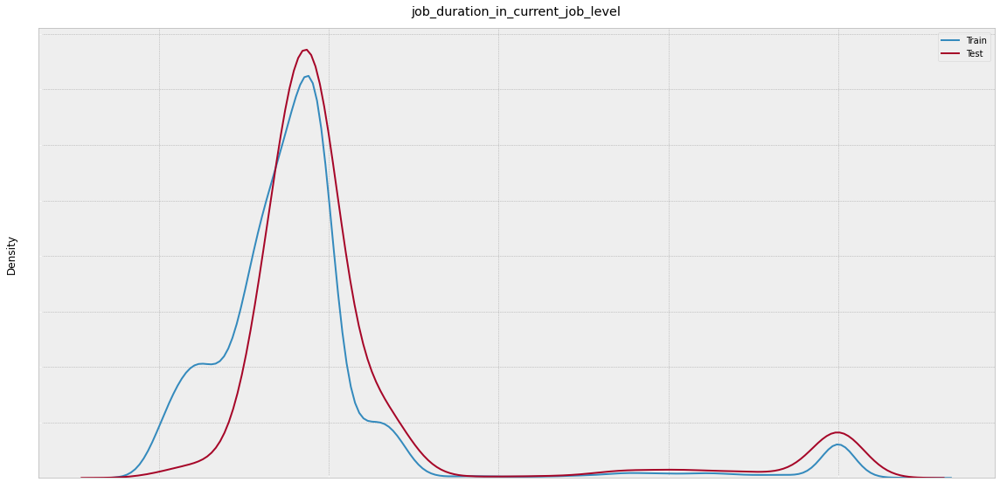

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


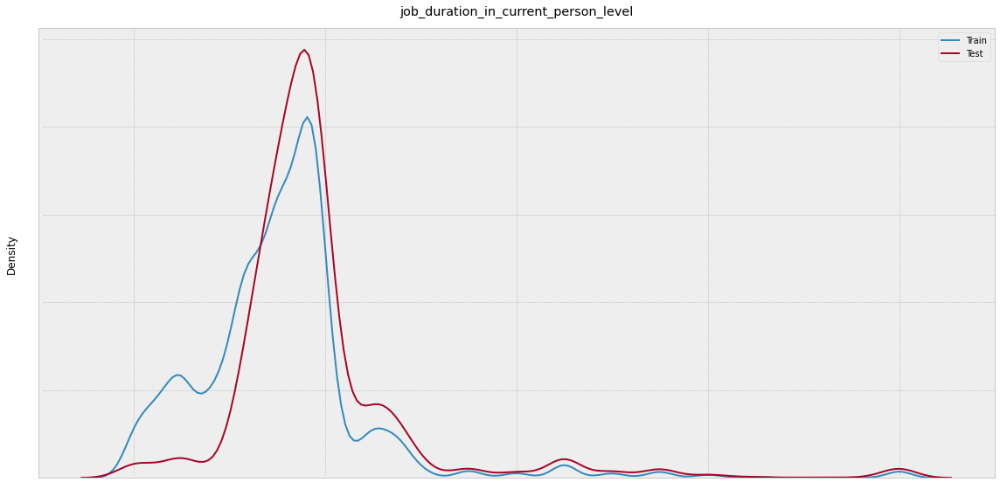

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


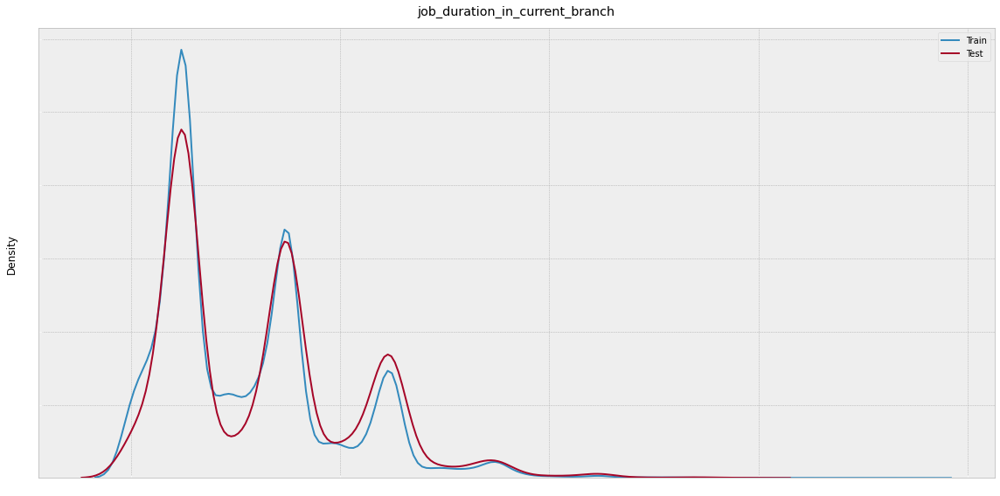

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


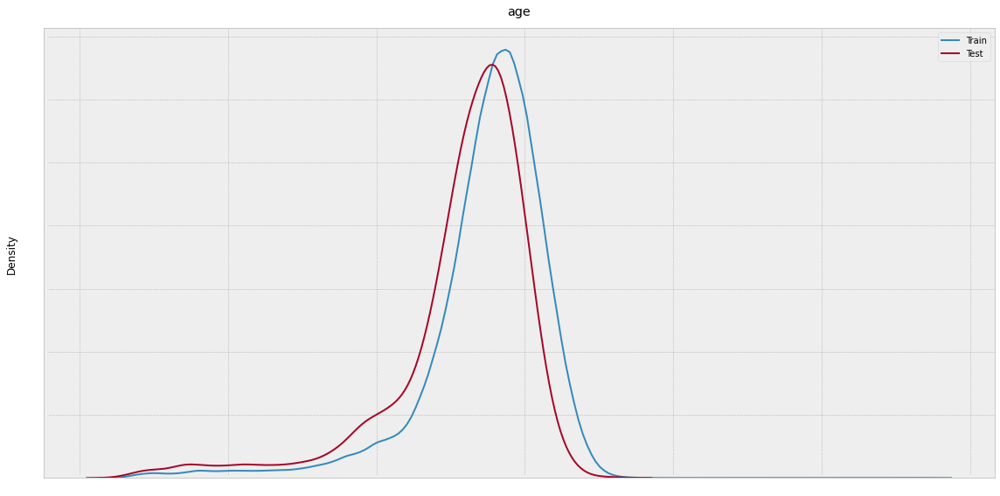

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


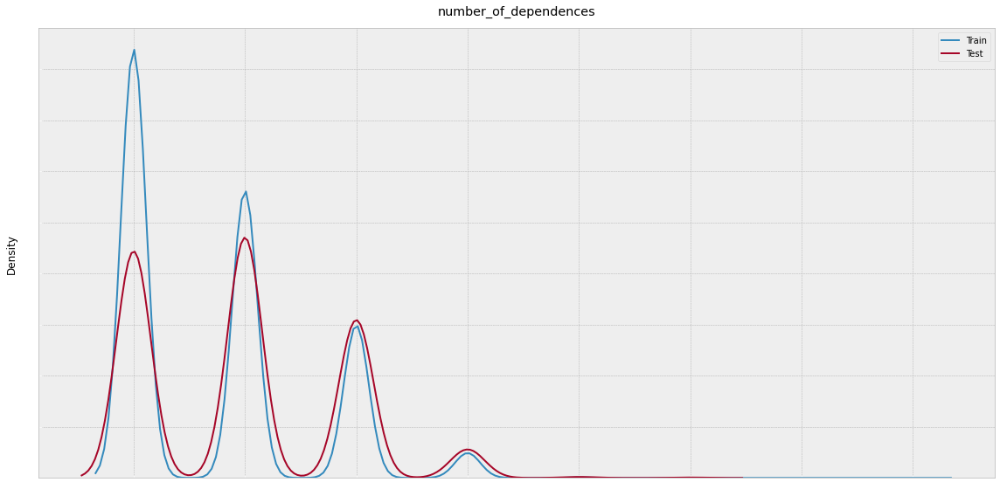

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


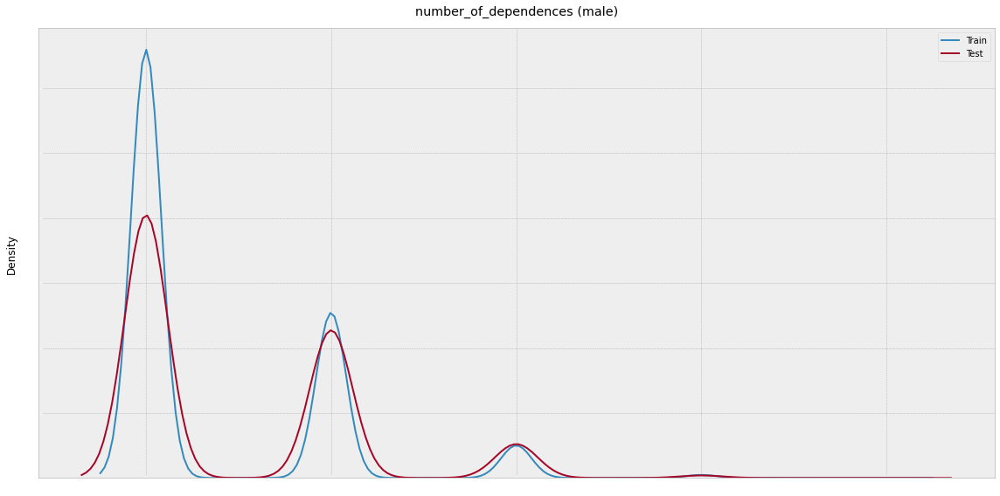

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


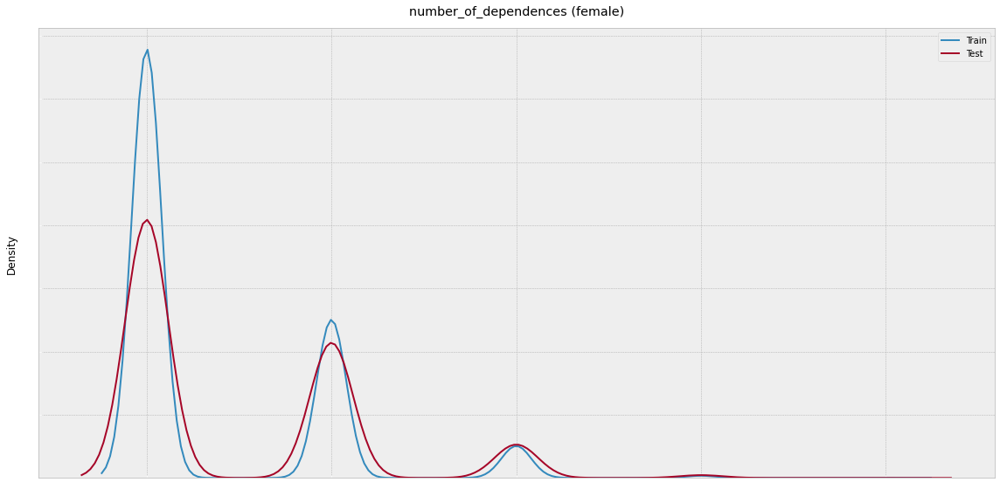

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


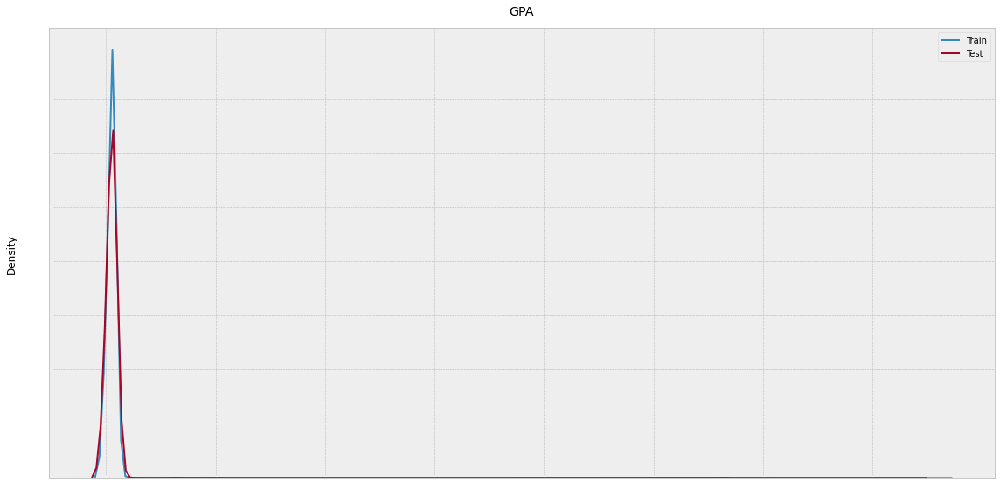

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


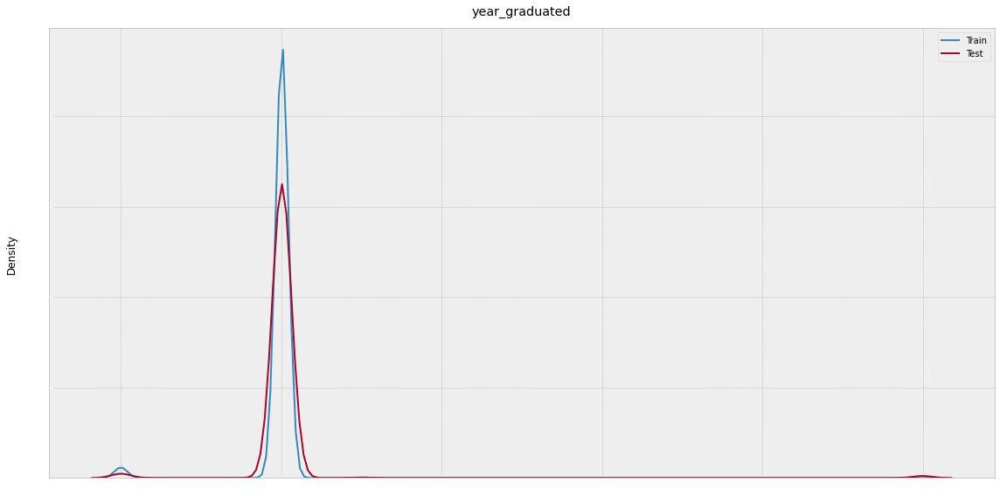

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


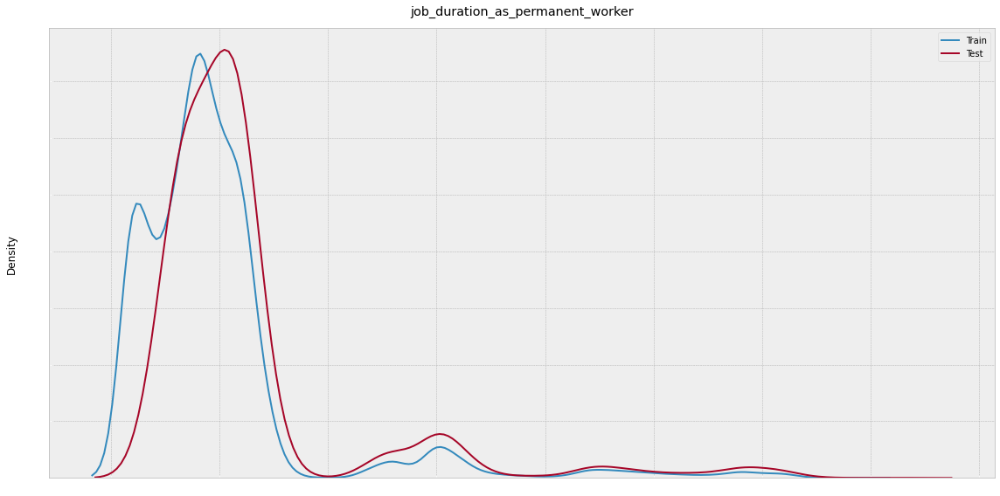

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


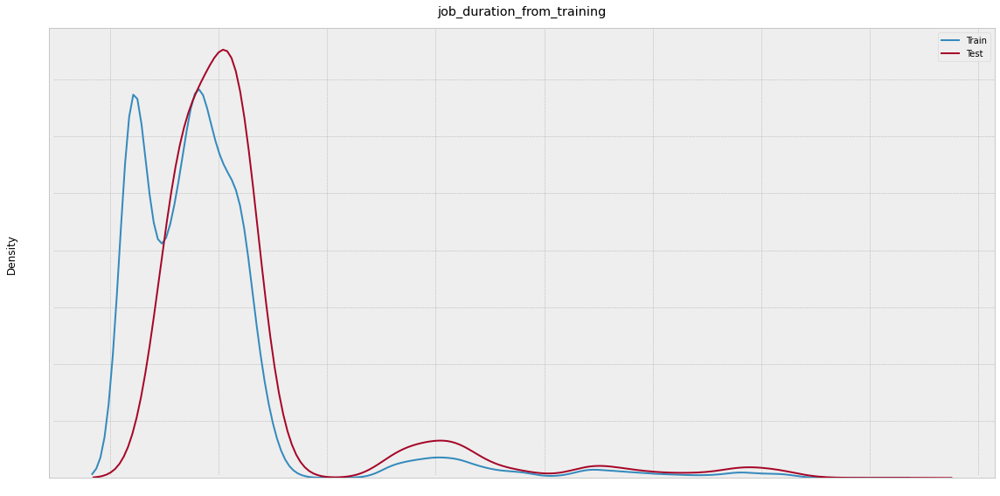

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


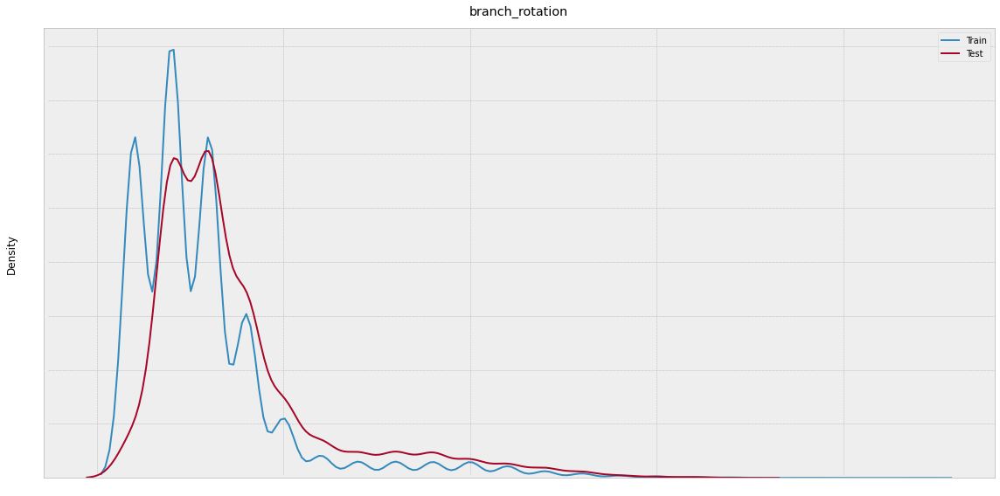

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


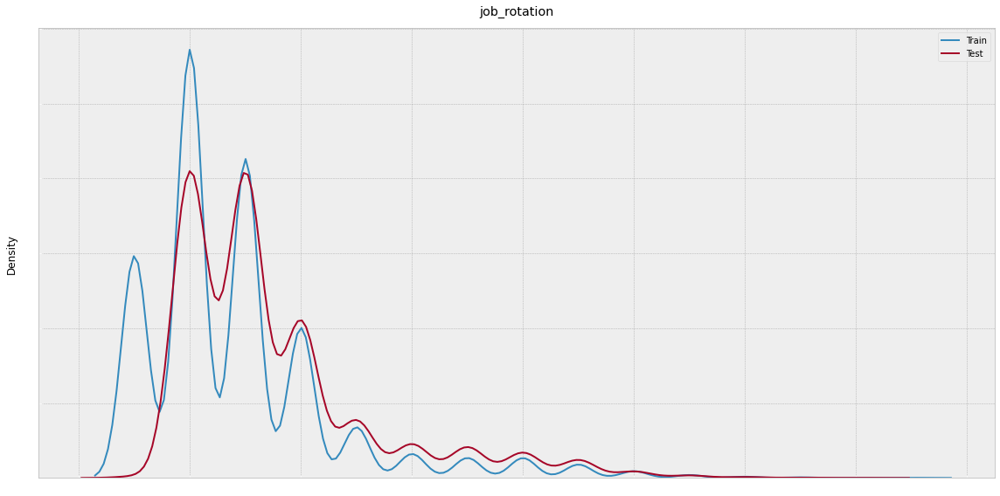

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


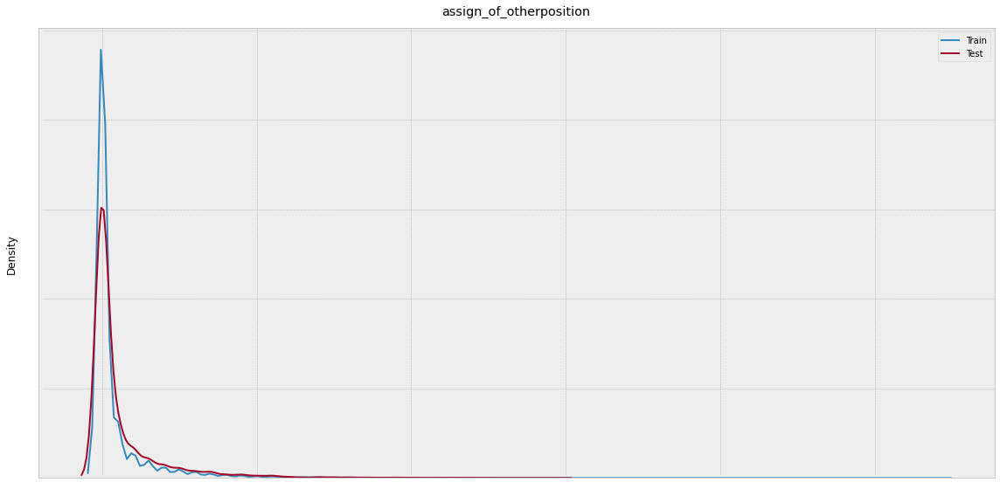

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


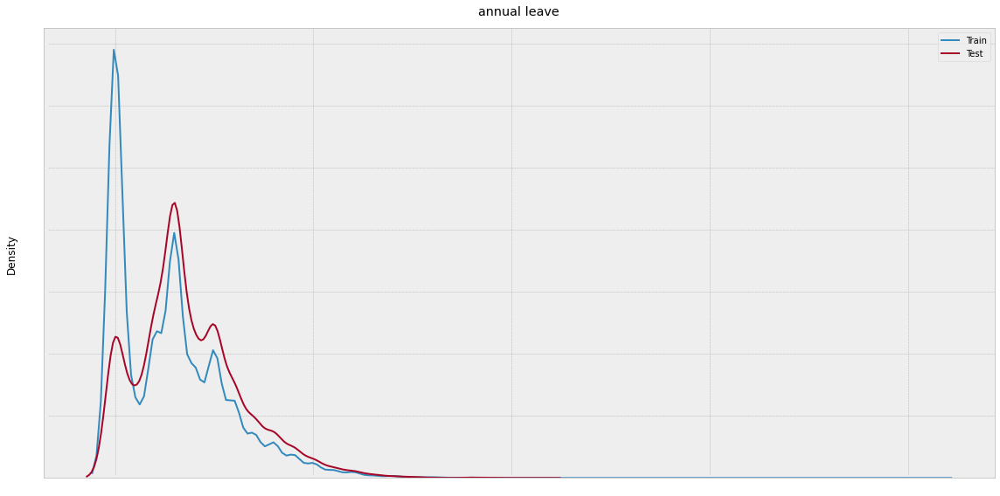

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


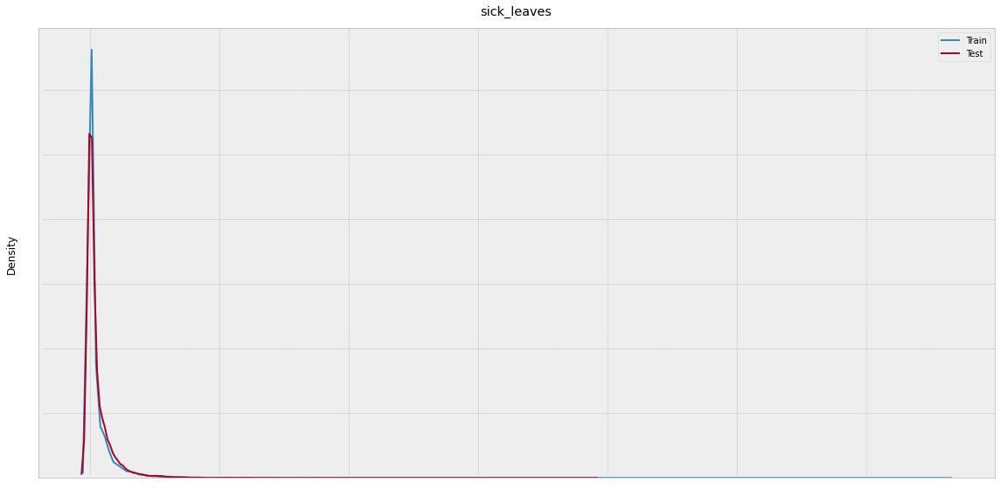

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


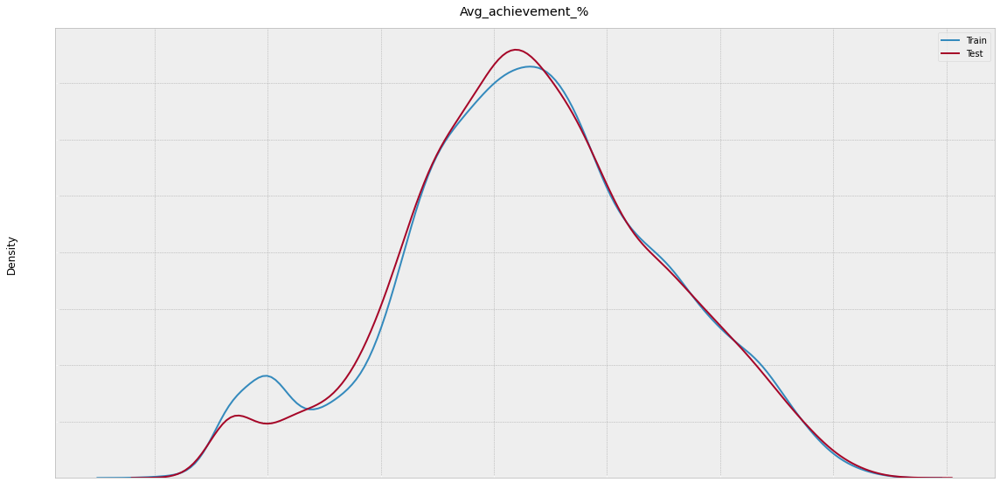

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


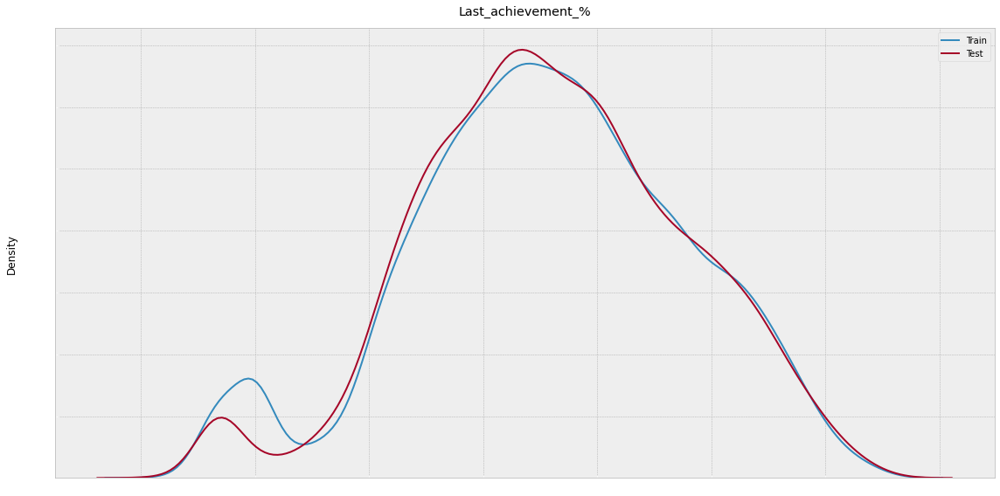

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


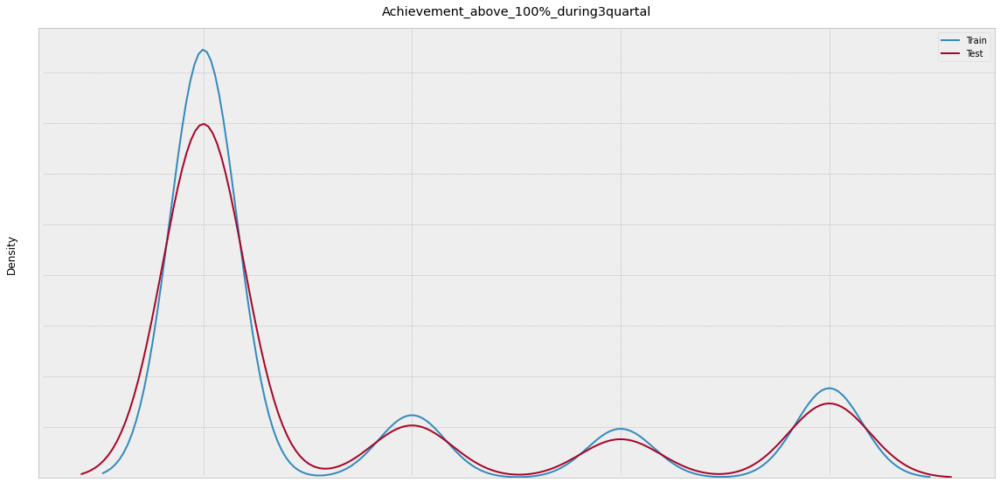

In [ ]:
plt.style.use('bmh')
for col in ['job_duration_in_current_job_level',
 'job_duration_in_current_person_level',
 'job_duration_in_current_branch',
 'age',
 'number_of_dependences',
 'number_of_dependences (male)',
 'number_of_dependences (female)',
 'GPA',
 'year_graduated',
 'job_duration_as_permanent_worker',
 'job_duration_from_training',
 'branch_rotation',
 'job_rotation',
 'assign_of_otherposition',
 'annual leave',
 'sick_leaves',
 'Avg_achievement_%',
 'Last_achievement_%',
 'Achievement_above_100%_during3quartal']:

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(train_df[col], hist=False, label='Train')
        sns.distplot(test_df[col], hist=False, label='Test')

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(col, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


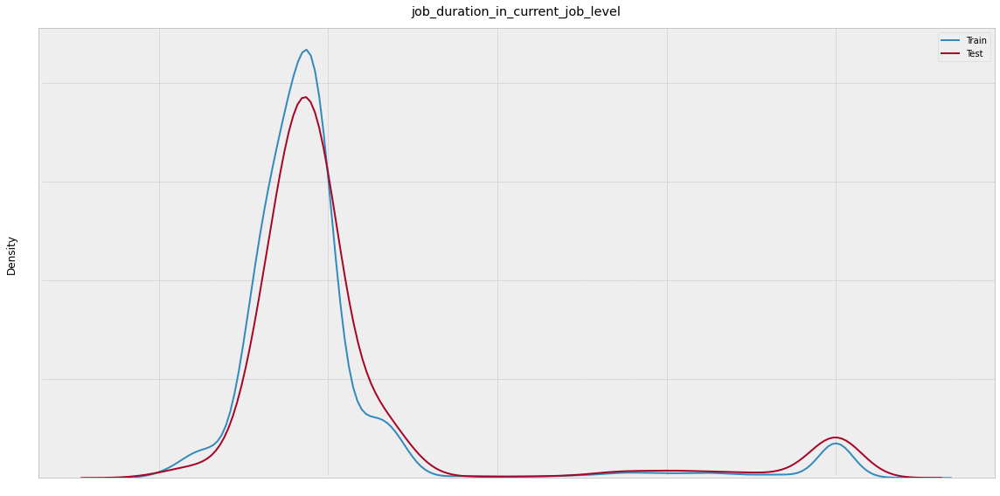

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


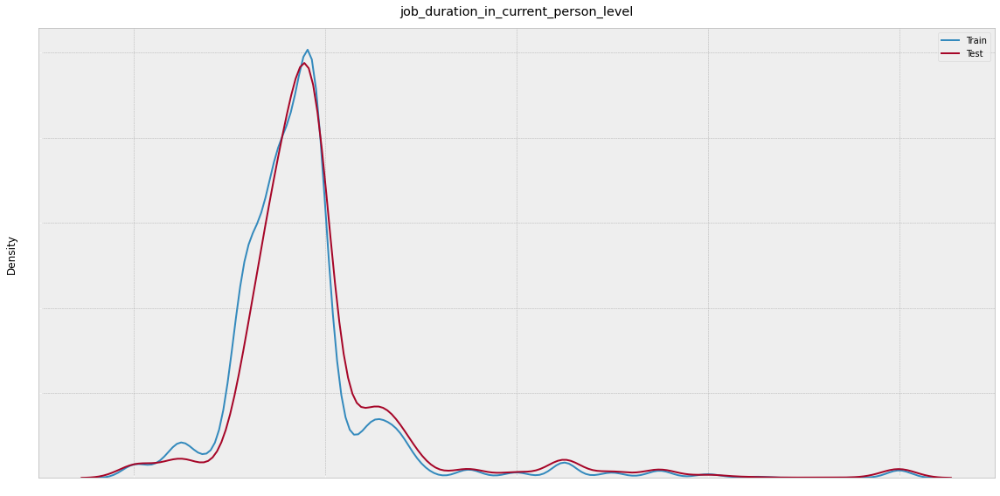

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


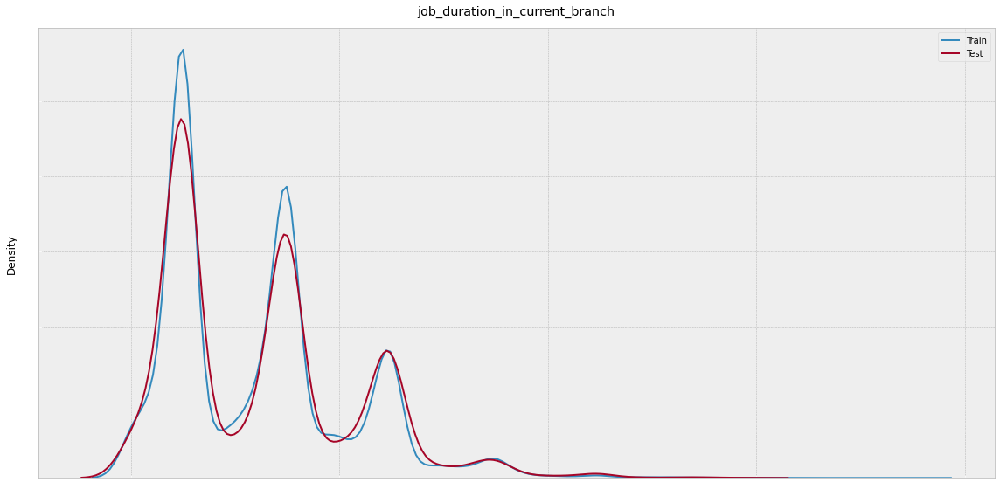

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


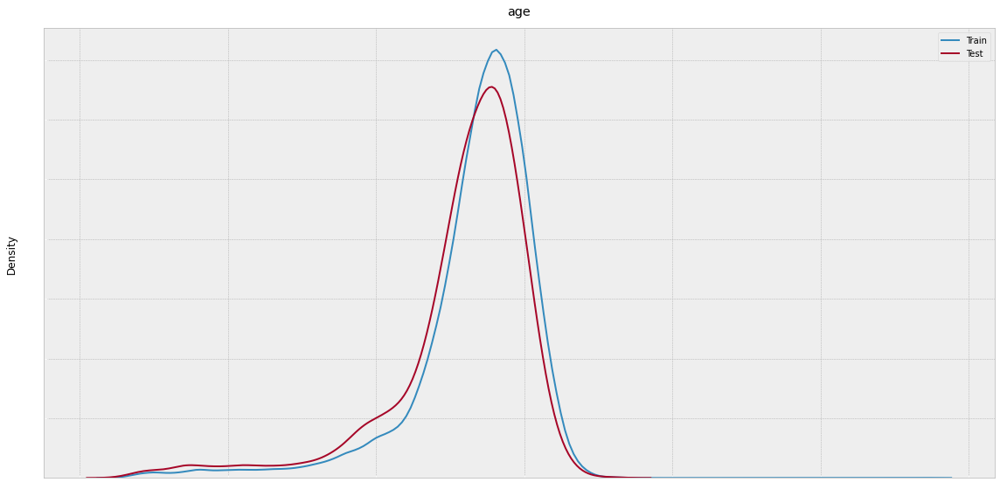

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


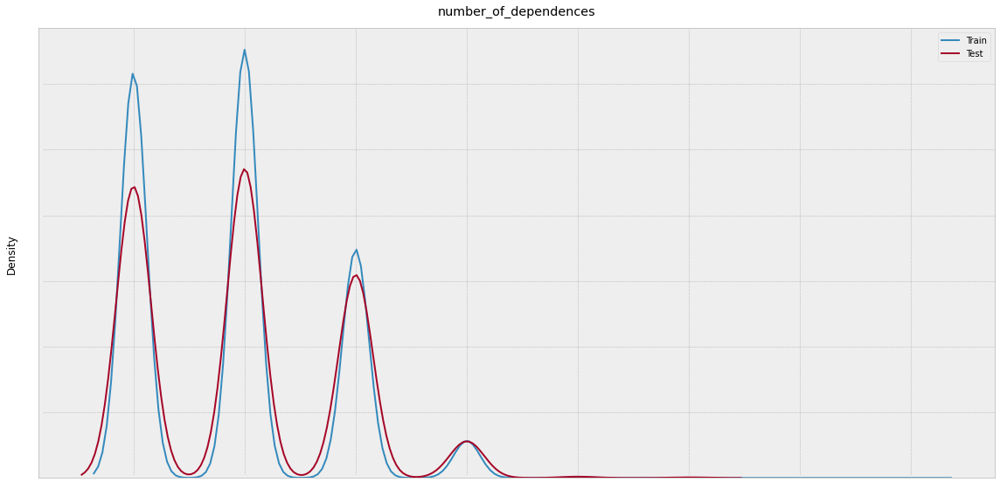

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


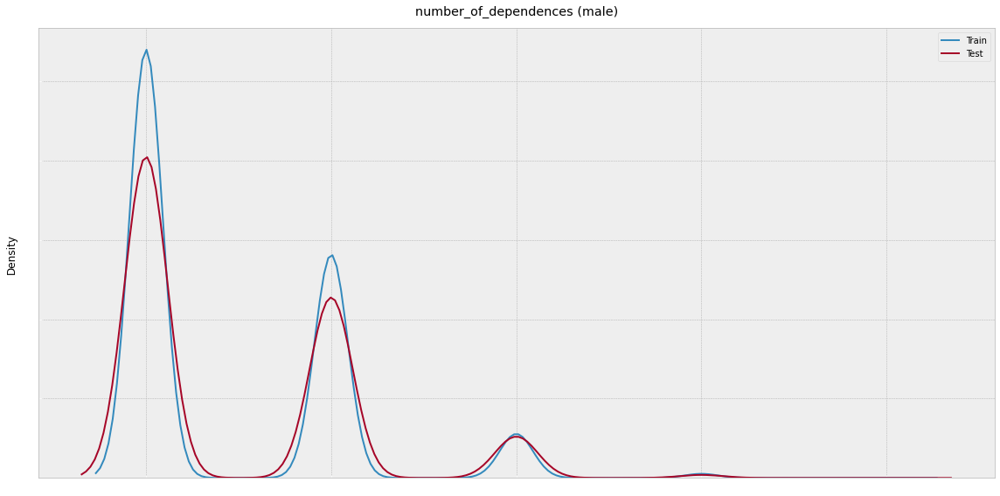

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


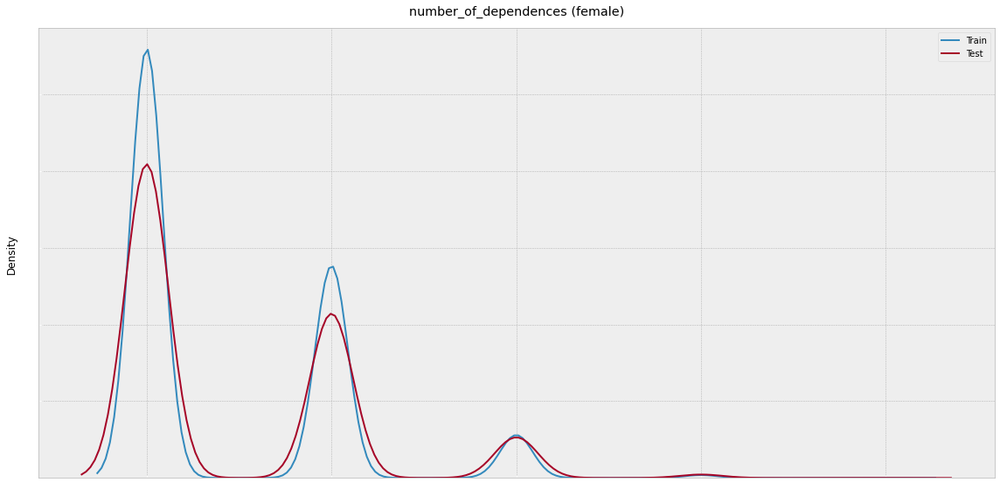

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


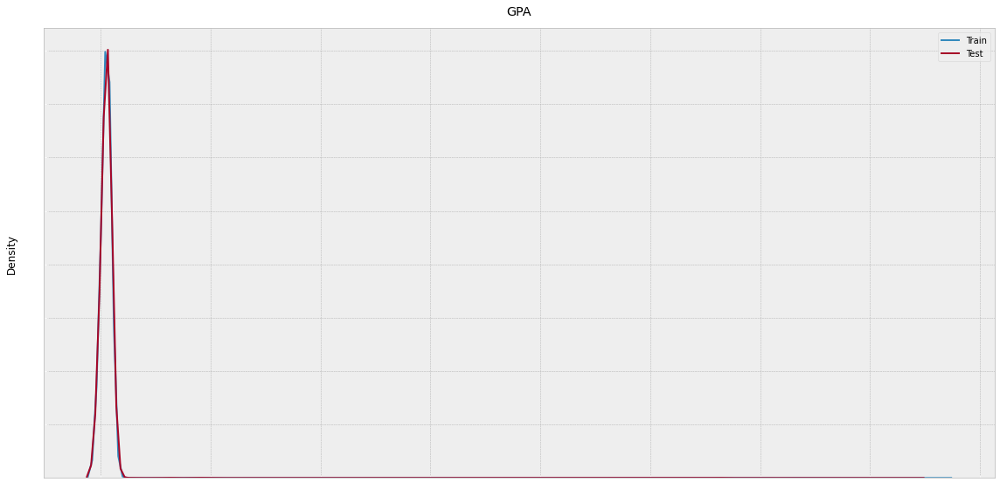

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


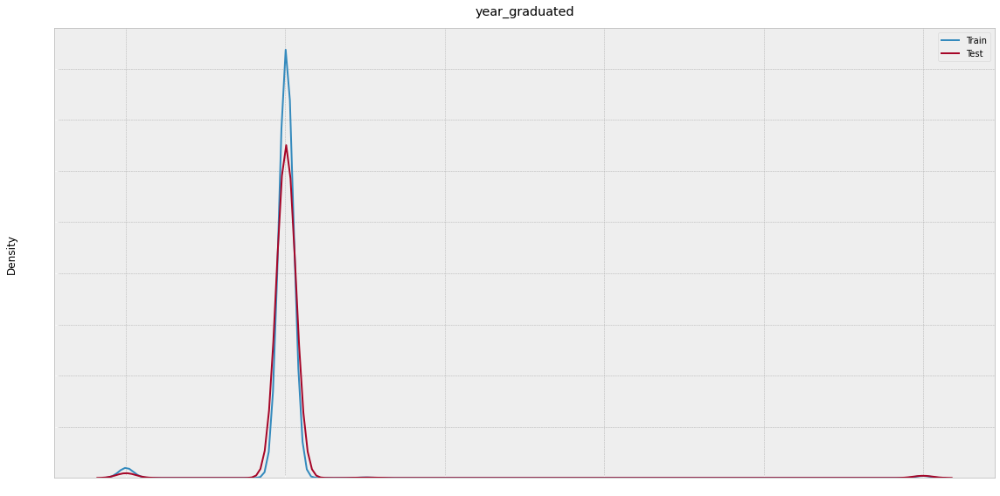

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


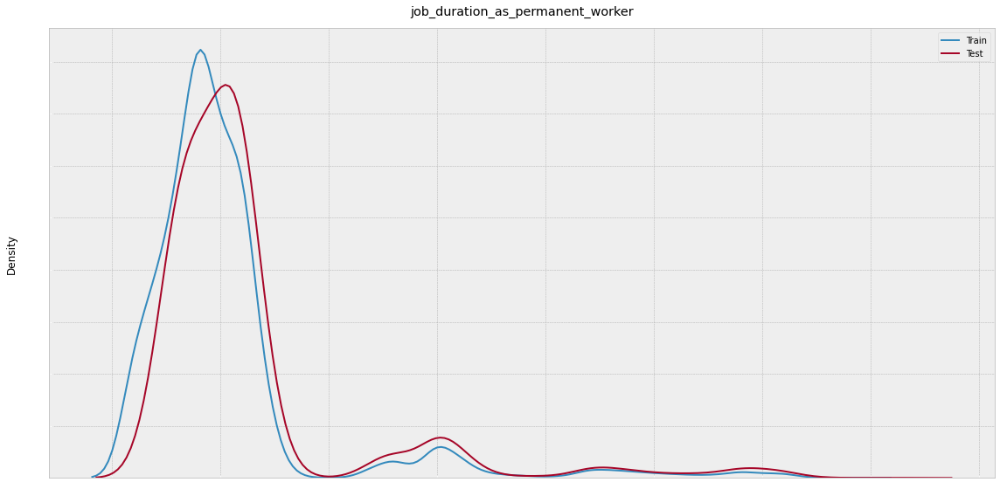

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


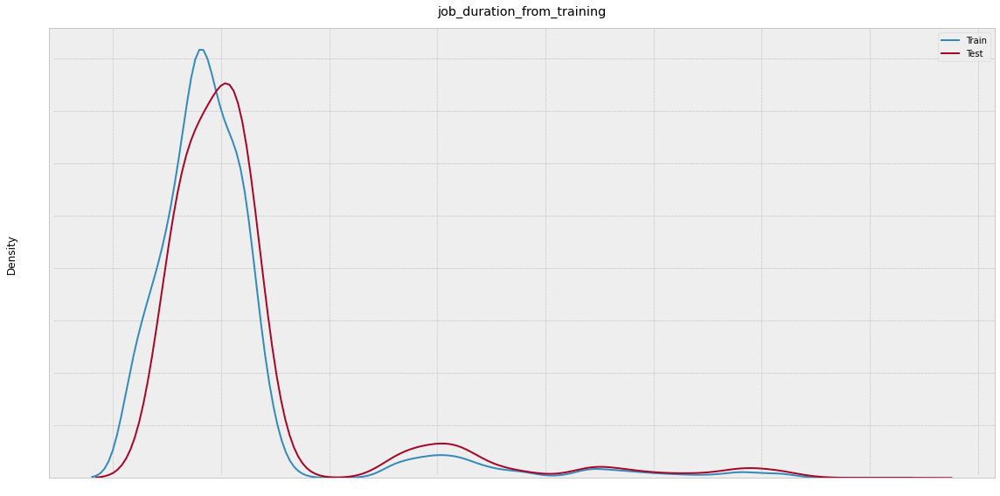

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


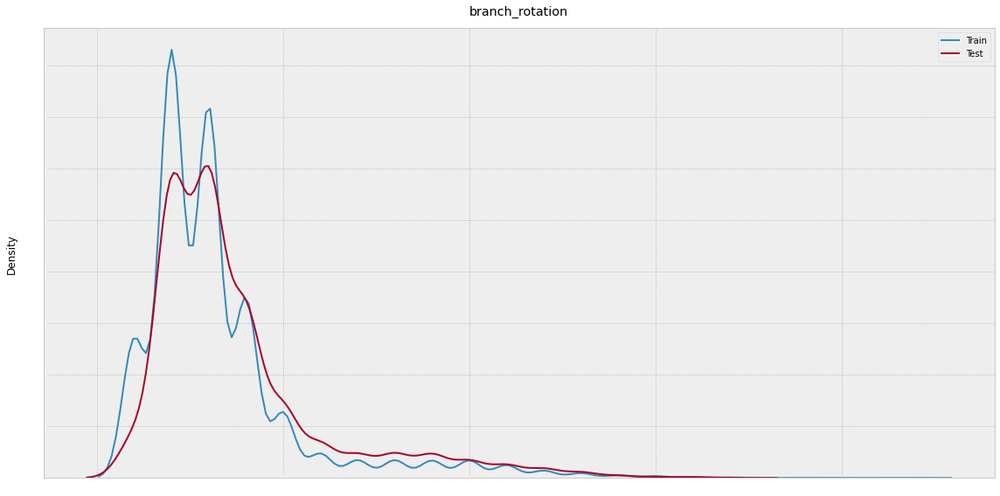

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


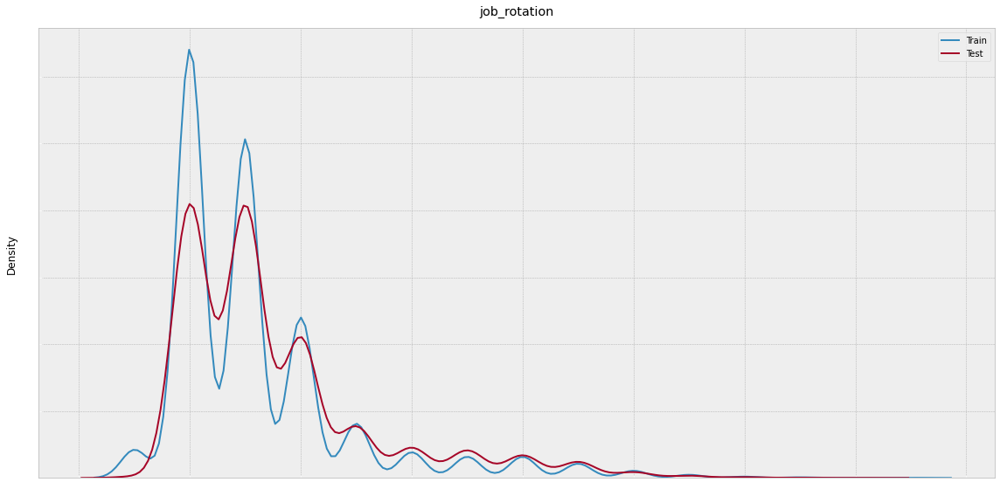

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


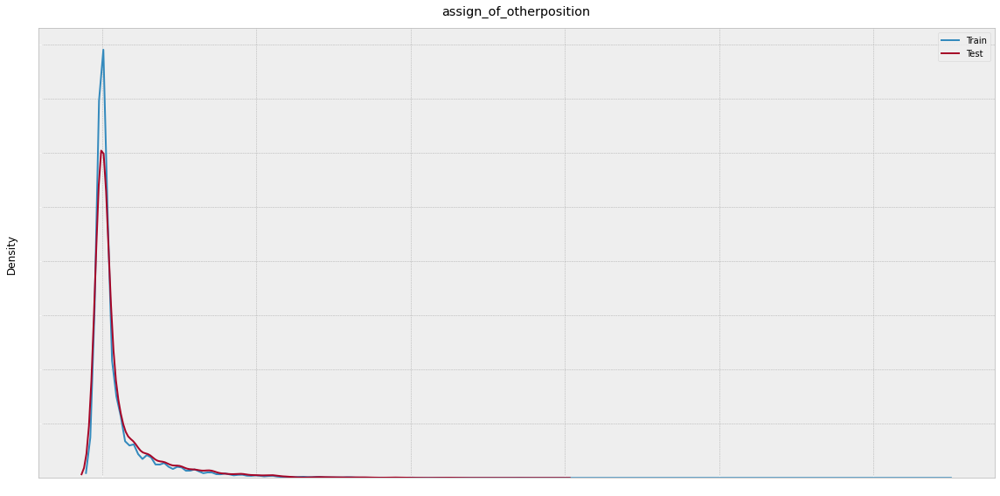

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


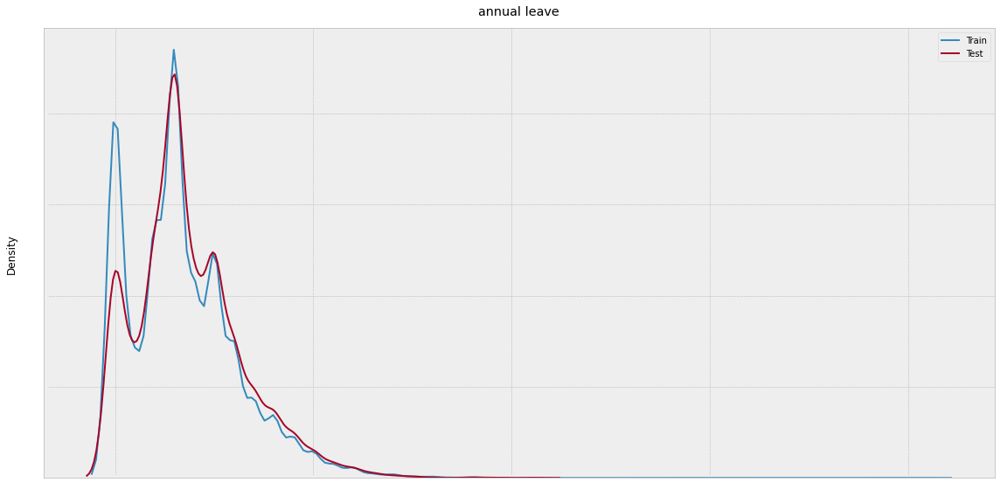

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


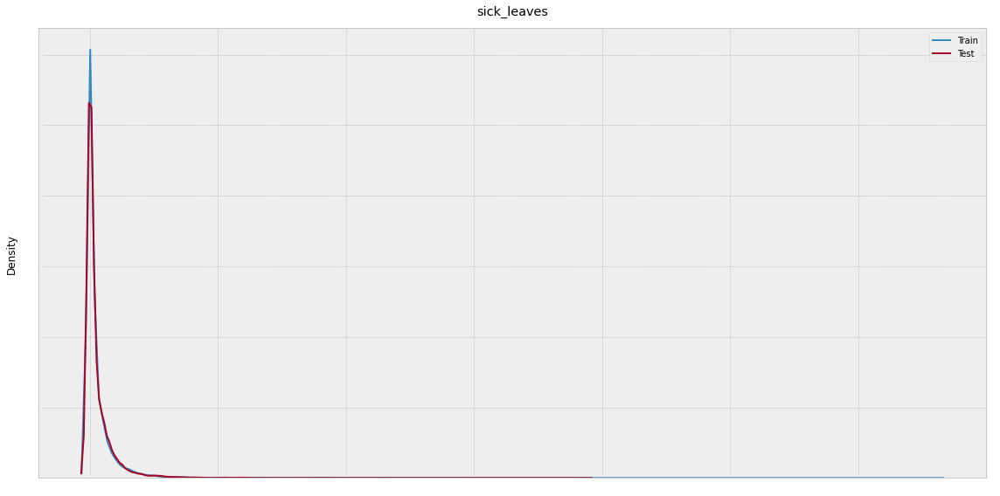

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


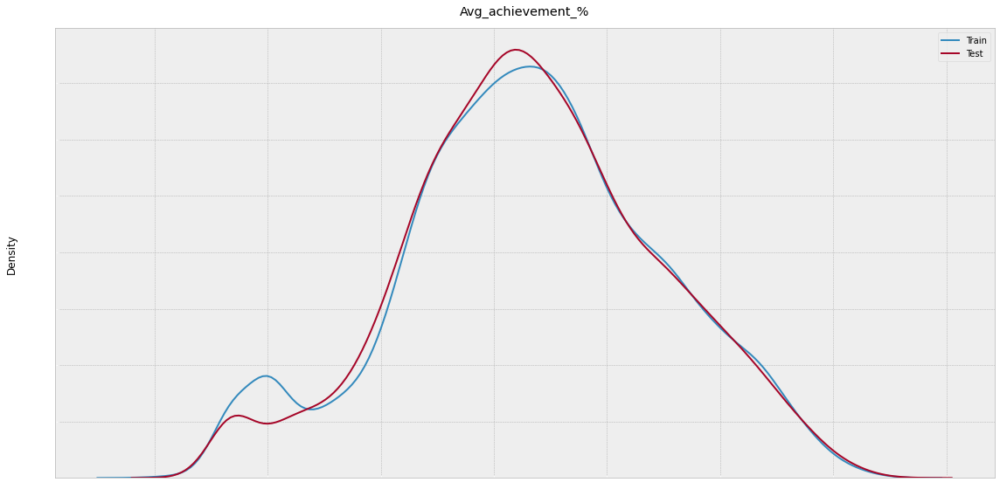

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


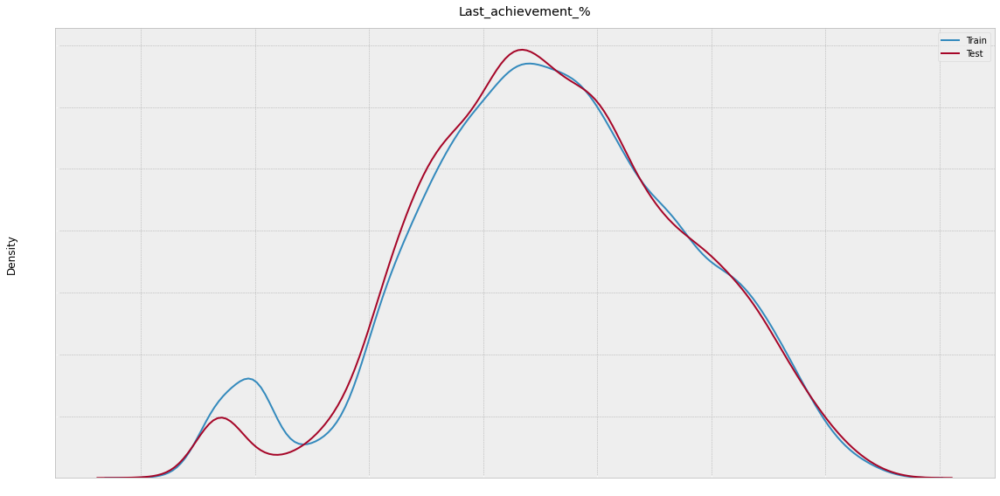

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


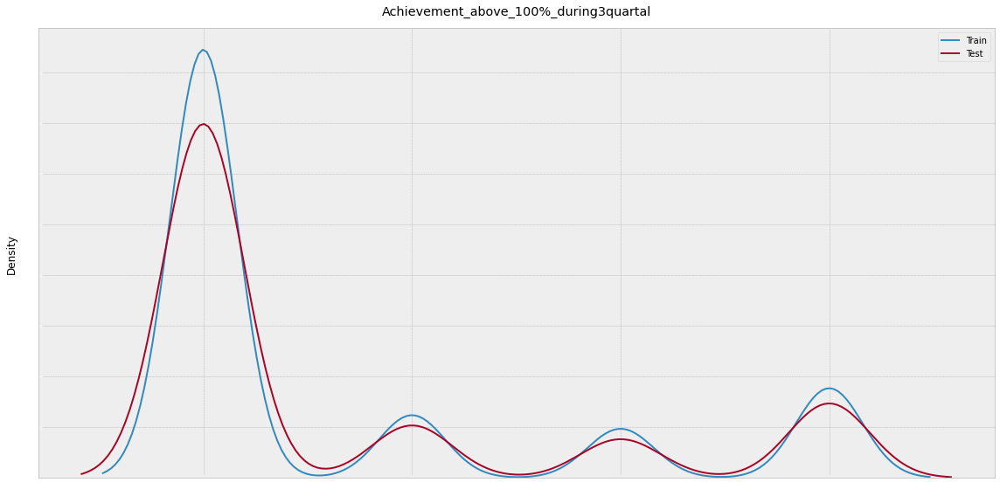

In [ ]:
s_train_df = train_df[~((train_df['job_duration_in_current_job_level'].between(0, 1, inclusive=True))& \
       (train_df['job_duration_in_current_person_level'].between(0, 1, inclusive=True))& \
       (train_df['number_of_dependences'] == 0)& \
       (train_df['number_of_dependences (male)'] == 0)& \
       (train_df['number_of_dependences (female)'] == 0)& \
       (train_df['job_duration_as_permanent_worker'] == 1)& \
       (train_df['job_duration_from_training'] == 1))]

s_train_df = s_train_df[~((s_train_df['job_level'] == 'JG06') |\
                        (s_train_df['person_level'] == 'PG08') |\
                        (s_train_df['Employee_status'] == 'Contract'))]


plt.style.use('bmh')
for col in ['job_duration_in_current_job_level',
 'job_duration_in_current_person_level',
 'job_duration_in_current_branch',
 'age',
 'number_of_dependences',
 'number_of_dependences (male)',
 'number_of_dependences (female)',
 'GPA',
 'year_graduated',
 'job_duration_as_permanent_worker',
 'job_duration_from_training',
 'branch_rotation',
 'job_rotation',
 'assign_of_otherposition',
 'annual leave',
 'sick_leaves',
 'Avg_achievement_%',
 'Last_achievement_%',
 'Achievement_above_100%_during3quartal']:

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(s_train_df[col], hist=False, label='Train')
        sns.distplot(test_df[col], hist=False, label='Test')

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(col, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

In [ ]:
train_df[(train_df['job_duration_in_current_job_level'].between(0, 0.7, inclusive=True))& \
       (train_df['job_duration_in_current_person_level'].between(0, 0.7, inclusive=True))& \
       (train_df['number_of_dependences'] == 0)& \
       (train_df['number_of_dependences (male)'] == 0)& \
       (train_df['number_of_dependences (female)'] == 0)& \
       (train_df['job_duration_as_permanent_worker'] == 1)& \
       (train_df['job_duration_from_training'] == 1)& \
       (train_df['branch_rotation'].between(0,2, inclusive=True))& \
       (train_df['job_rotation'].between(0,2, inclusive=True))& \
       (train_df['annual leave'] == 0) & \
       (train_df['Avg_achievement_%'].between(13, 25, inclusive=True)) & \
       (train_df['Last_achievement_%'].between(15, 27, inclusive=True))]

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,Employee_status,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal,achievement_target_1,achievement_target_2,achievement_target_3


In [ ]:
cat_cols = [c for c in train_df.columns if train_df[c].dtypes == 'object' and c != 'year_graduated']
cat_cols

['job_level',
 'person_level',
 'Employee_type',
 'Employee_status',
 'gender',
 'marital_status_maried(Y/N)',
 'Education_level',
 'achievement_target_1',
 'achievement_target_2',
 'achievement_target_3']

In [ ]:
for c in cat_cols:
    print('-'*100)
    print(c)
    for v in train_df[c].unique():
        if v not in test_df[c].unique():
            print(v)

----------------------------------------------------------------------------------------------------
job_level
JG06
----------------------------------------------------------------------------------------------------
person_level
PG08
----------------------------------------------------------------------------------------------------
Employee_type
nan
----------------------------------------------------------------------------------------------------
Employee_status
Contract
----------------------------------------------------------------------------------------------------
gender
----------------------------------------------------------------------------------------------------
marital_status_maried(Y/N)
----------------------------------------------------------------------------------------------------
Education_level
nan
----------------------------------------------------------------------------------------------------
achievement_target_1
nan
-------------------------------------

In [ ]:
# remove no unique data in train data which not in test data except nan
s_train_df = train_df[~((train_df['job_level'] == 'JG06') |\
                        (train_df['person_level'] == 'PG08') |\
                        (train_df['Employee_status'] == 'Contract'))]

----------------------------------------------------------------------------------------------------
job_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
JG05
prob JG05: 0.042718250969724446
****************************************************************************************************
JG04
prob JG04: 0.9523953453226538
****************************************************************************************************
JG03
prob JG03: 0.0048864037076217825
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
JG05
prob JG05: 0.06533333333333333
****************************************************************************************************
JG04
prob JG04: 0.932
***

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


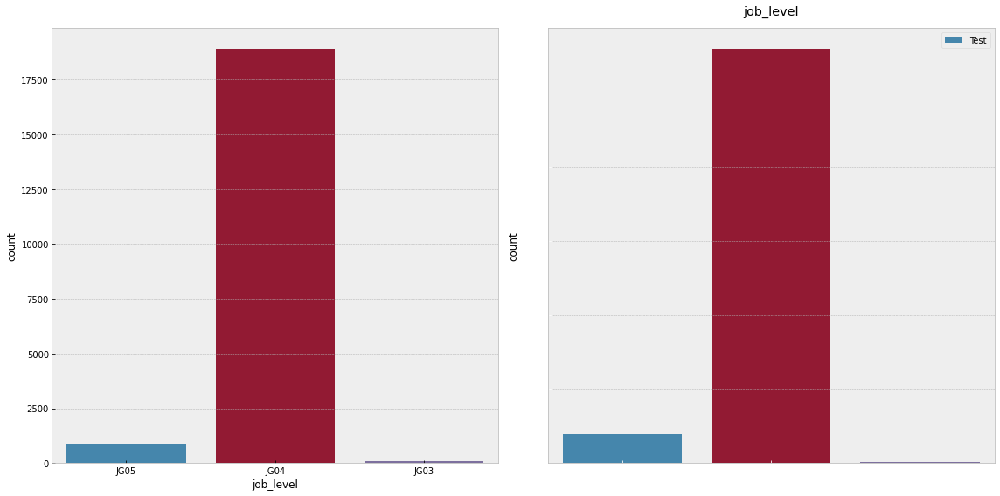

----------------------------------------------------------------------------------------------------
person_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
PG06
prob PG06: 0.024079391466424866
****************************************************************************************************
PG04
prob PG04: 0.04065286383557504
****************************************************************************************************
PG03
prob PG03: 0.9112891038234849
****************************************************************************************************
PG05
prob PG05: 0.0183366077275704
****************************************************************************************************
PG02
prob PG02: 0.002065387134149413
**********************************************************************************************

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


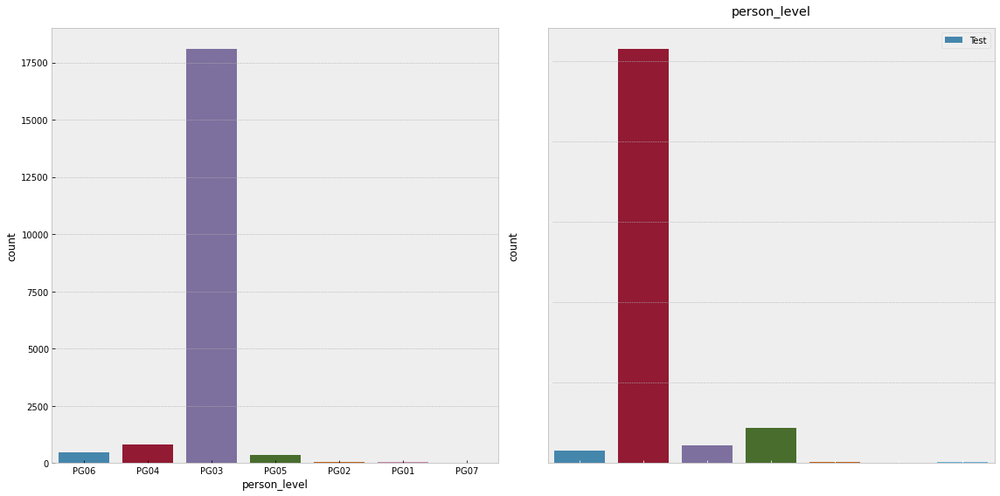

----------------------------------------------------------------------------------------------------
Employee_type
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
RM_type_A
prob RM_type_A: 0.5432471915772505
****************************************************************************************************
RM_type_C
prob RM_type_C: 0.03783184726210267
****************************************************************************************************
RM_type_B
prob RM_type_B: 0.41831645760918845
****************************************************************************************************
nan
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
RM_type_C
prob RM_type_C: 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


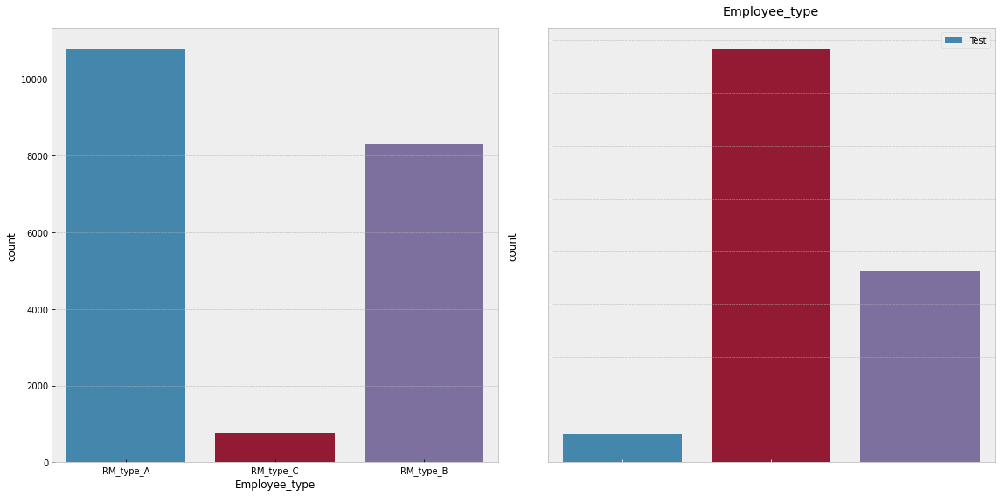

----------------------------------------------------------------------------------------------------
Employee_status
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Permanent
prob Permanent: 1.0
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Permanent
prob Permanent: 1.0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


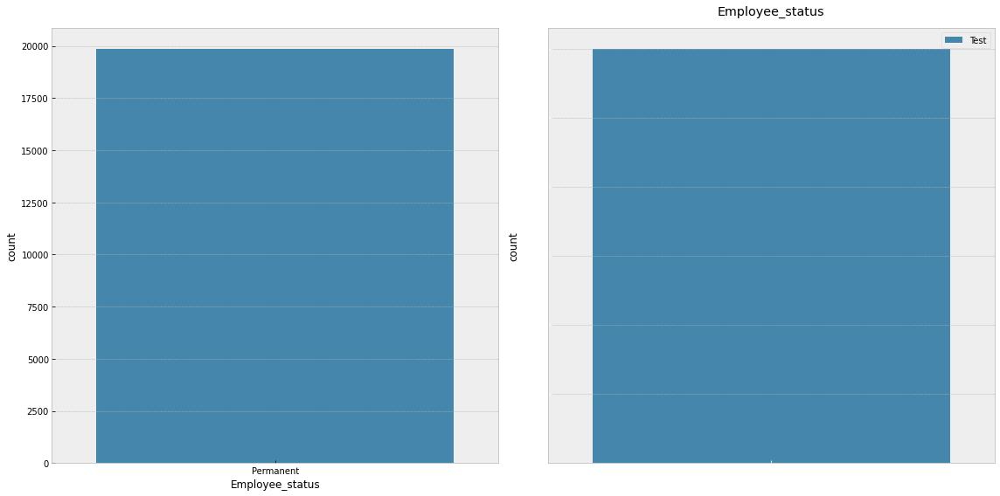

----------------------------------------------------------------------------------------------------
gender
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Female
prob Female: 0.25620875522643694
****************************************************************************************************
Male
prob Male: 0.7437912447735631
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Female
prob Female: 0.2655
****************************************************************************************************
Male
prob Male: 0.7345


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


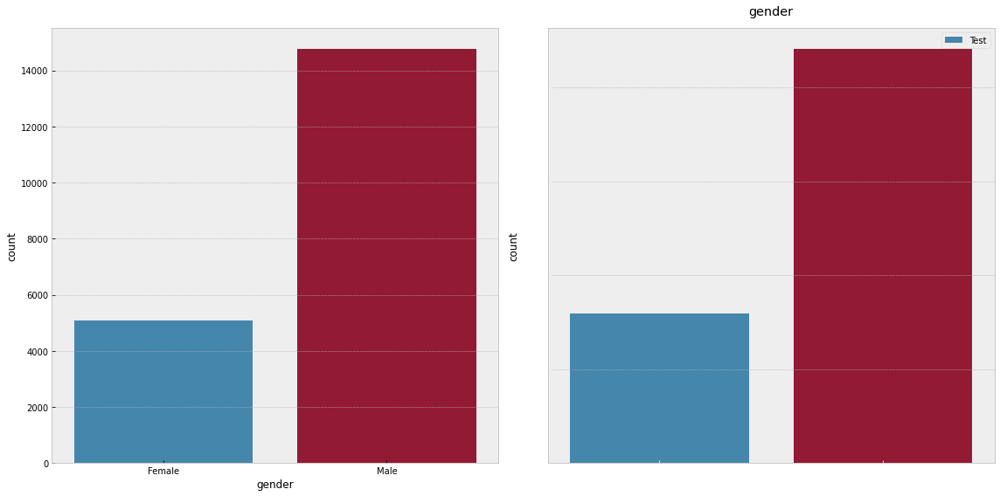

----------------------------------------------------------------------------------------------------
marital_status_maried(Y/N)
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Y
prob Y: 0.7675683844642587
****************************************************************************************************
N
prob N: 0.23243161553574126
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Y
prob Y: 0.849
****************************************************************************************************
N
prob N: 0.151


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


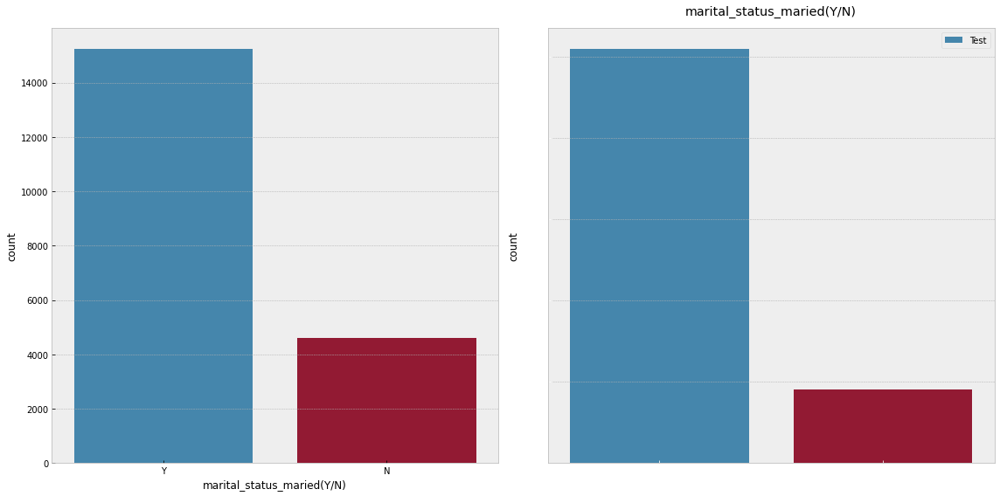

----------------------------------------------------------------------------------------------------
Education_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
level_4
prob level_4: 0.6786056118079694
****************************************************************************************************
level_5
prob level_5: 0.003072893053246688
****************************************************************************************************
level_3
prob level_3: 0.12603899047906905
****************************************************************************************************
nan
****************************************************************************************************
level_1
prob level_1: 0.009621681527378974
**************************************************************************************************

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


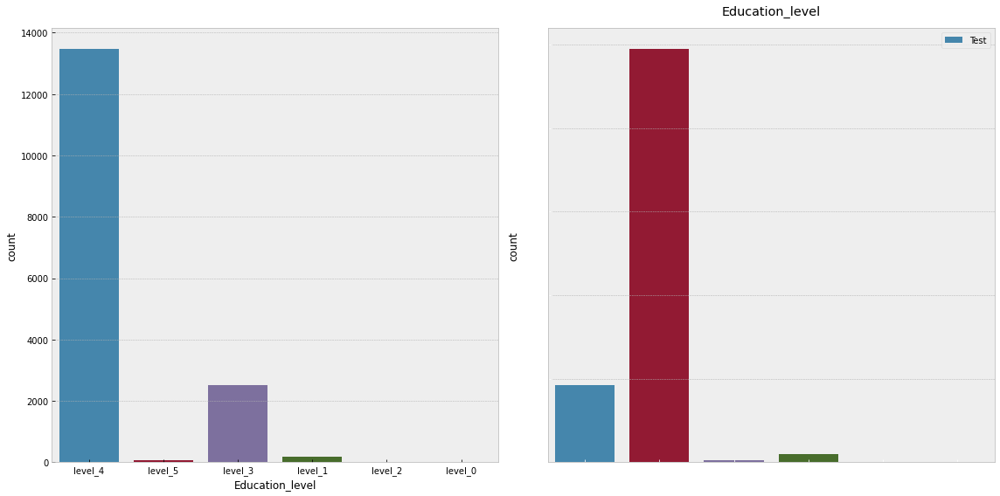

----------------------------------------------------------------------------------------------------
achievement_target_1
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Pencapaian 50_100
prob Pencapaian 50_100: 0.463956475744295
****************************************************************************************************
Pencapaian 100_150
prob Pencapaian 100_150: 0.1512770137524558
****************************************************************************************************
Pencapaian less than 50
prob Pencapaian less than 50: 0.1127902876429399
****************************************************************************************************
Pencapaian more than 150
prob Pencapaian more than 150: 0.03254244118684197
***********************************************************************************************

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


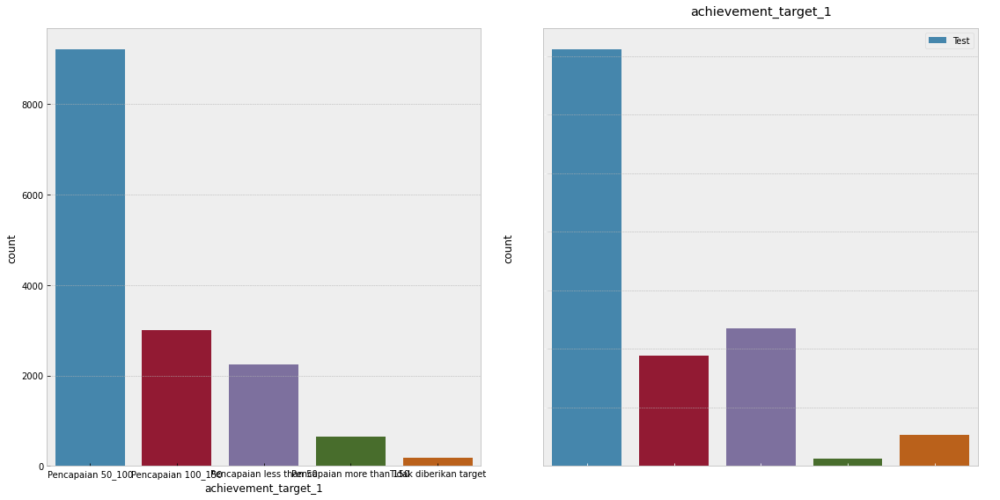

----------------------------------------------------------------------------------------------------
achievement_target_2
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Pencapaian less than 50
prob Pencapaian less than 50: 0.5116115057175961
****************************************************************************************************
Pencapaian 50_100
prob Pencapaian 50_100: 0.14356959347136164
****************************************************************************************************
Pencapaian more than 150
prob Pencapaian more than 150: 0.05163467835373533
****************************************************************************************************
Pencapaian 100_150
prob Pencapaian 100_150: 0.053851191375749334
*******************************************************************************************

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


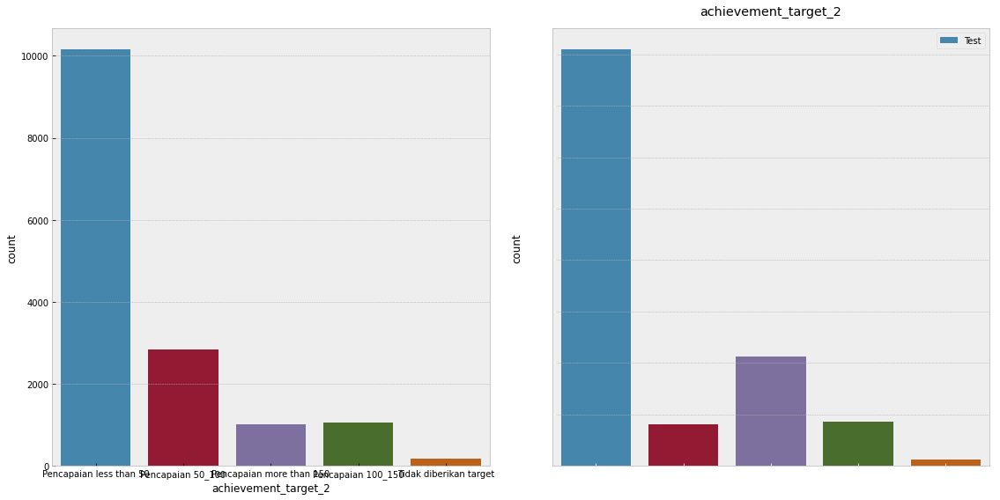

----------------------------------------------------------------------------------------------------
achievement_target_3
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
reached
prob reached: 0.5532718754722684
****************************************************************************************************
not_reached
prob not_reached: 0.21626114553423
****************************************************************************************************
nan
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
reached
prob reached: 0.7236666666666667
****************************************************************************************************
not_reached
prob not_reache

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


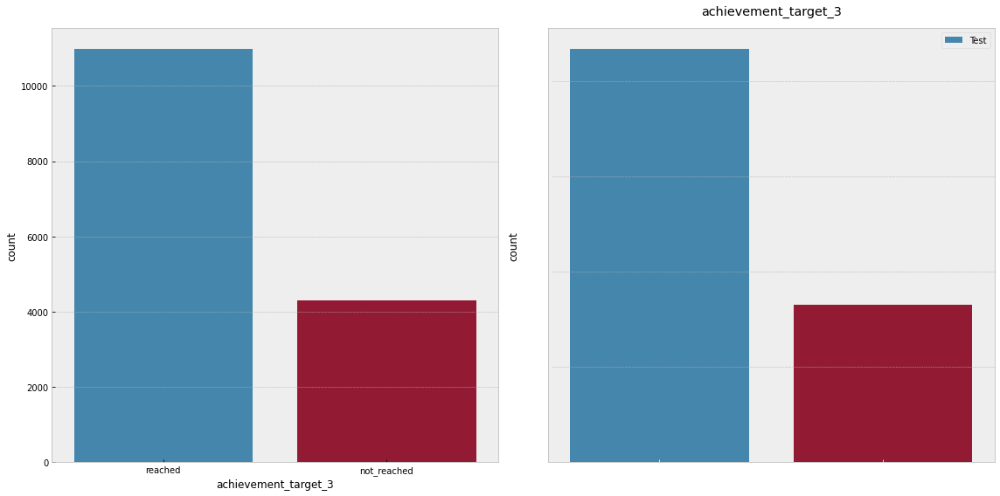

In [ ]:
for c in cat_cols:
    try:
        print('-'*100)
        print(c)
        print('&'*100)
        print('train')
        for un in s_train_df[c].unique():
            print('*'*100)
            print(un)
            if len(s_train_df[train_df[c] == un]):
                print(f"prob {un}: {len(s_train_df[s_train_df[c] == un])/len(s_train_df)}")

        print('&'*100)
        print('test')
        for un in test_df[c].unique():
            print('*'*100)
            print(un)
            if len(test_df[test_df[c] == un]):
                print(f"prob {un}: {len(test_df[test_df[c] == un])/len(test_df)}")

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        sns.countplot(s_train_df[c], label='Train', ax=ax1)
        sns.countplot(test_df[c], label='Test', ax=ax2)

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(c, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

In [ ]:
from sklearn.utils import resample
# Separate majority and minority classes
df_majority = s_train_df[s_train_df['Best Performance']==0]
df_minority = s_train_df[s_train_df['Best Performance']==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority,
                                 replace=False,    # sample without replacement
                                 n_samples=len(df_minority) * 3,     # to match minority class
                                 random_state=53
                                 ) # reproducible results

# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority]).reset_index(drop=True)

# Display new class counts
df_downsampled['Best Performance'].value_counts()

0    7998
1    2666
Name: Best Performance, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


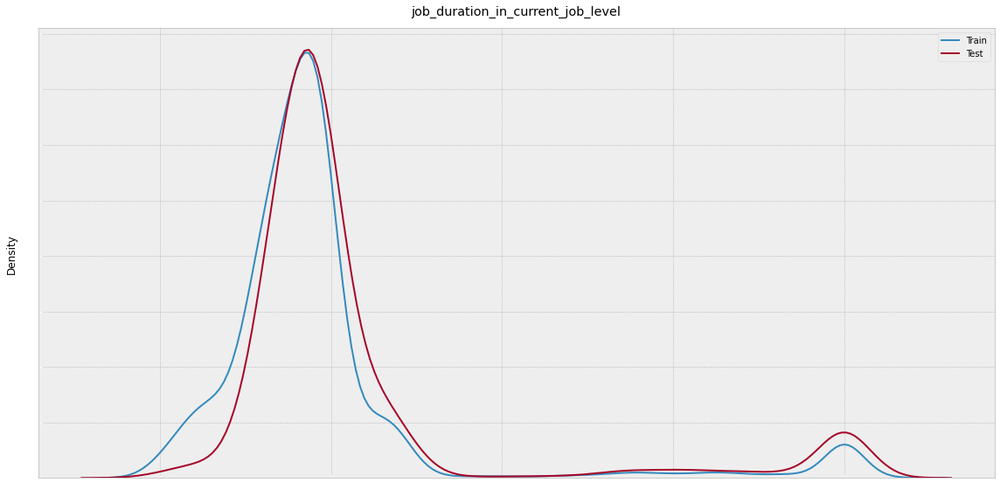

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


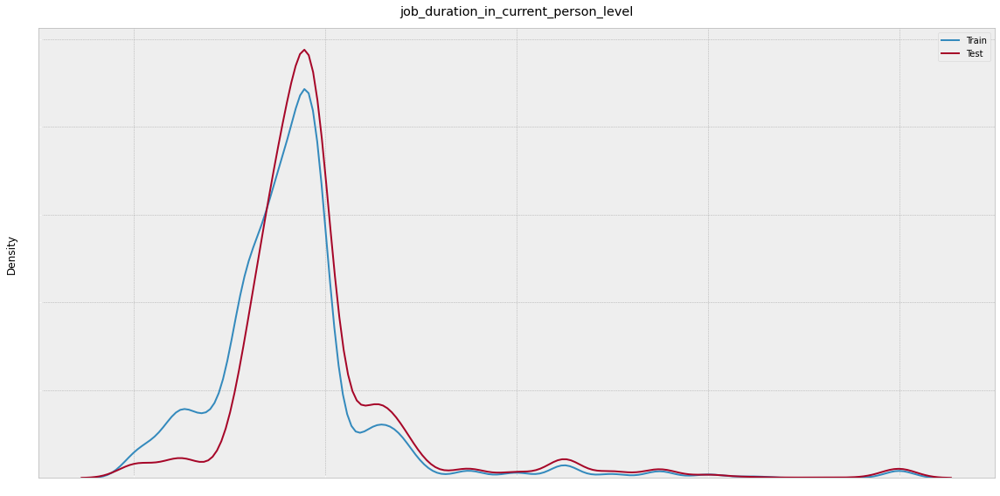

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


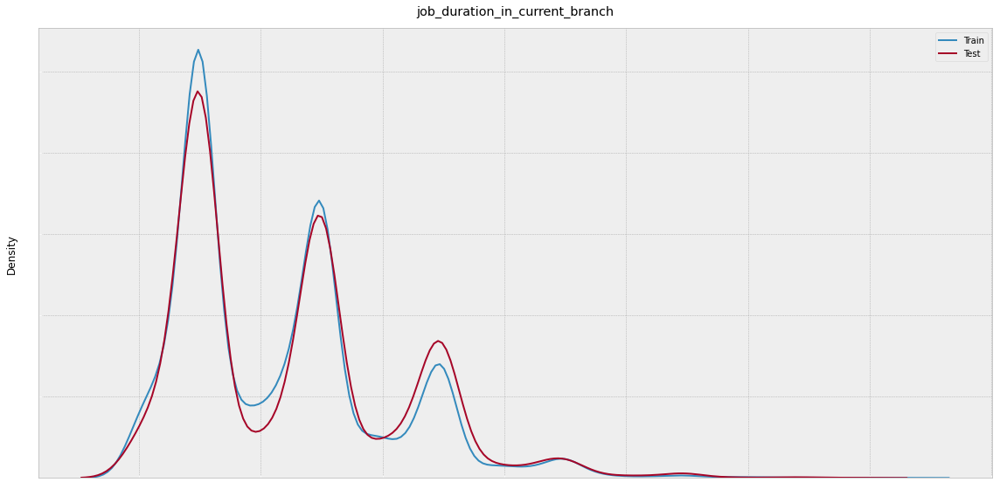

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


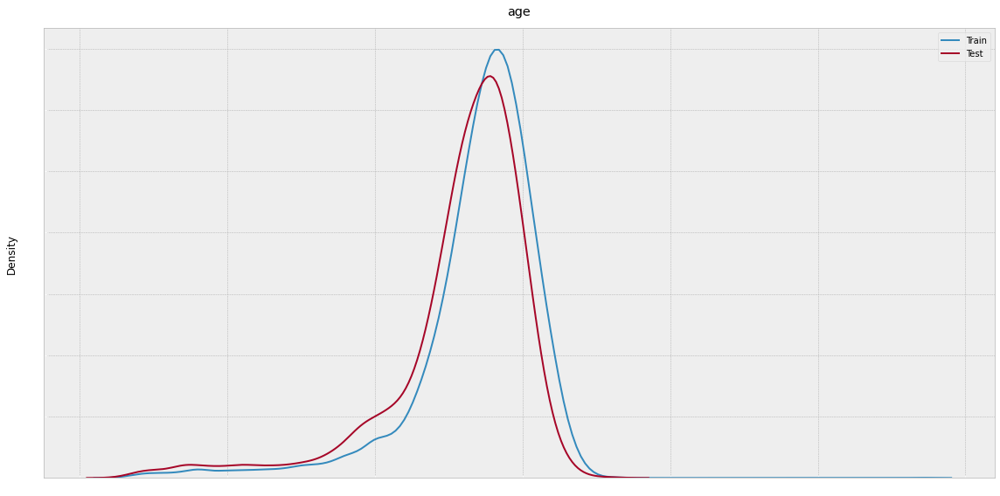

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


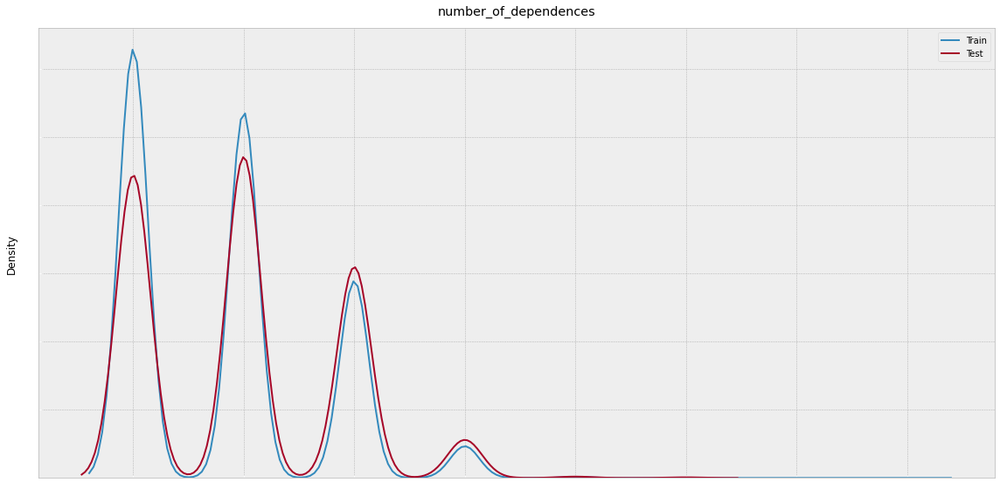

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


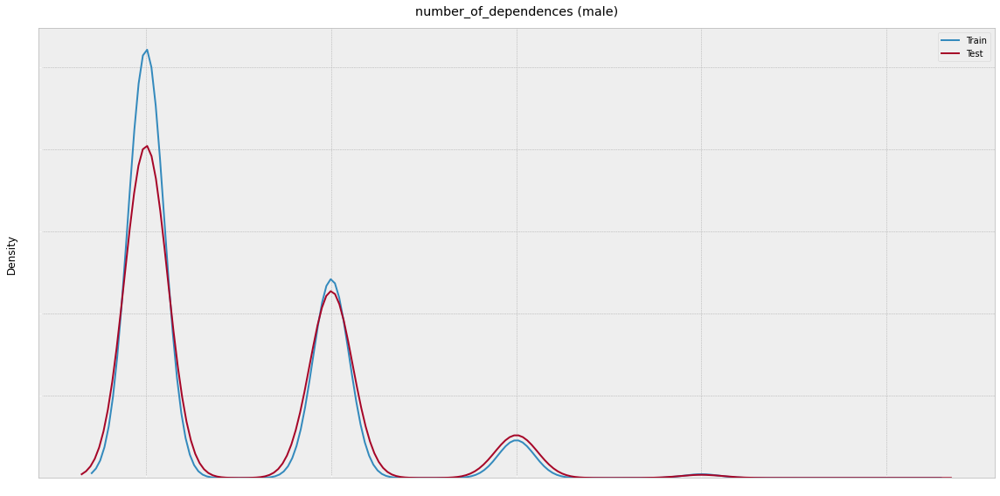

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


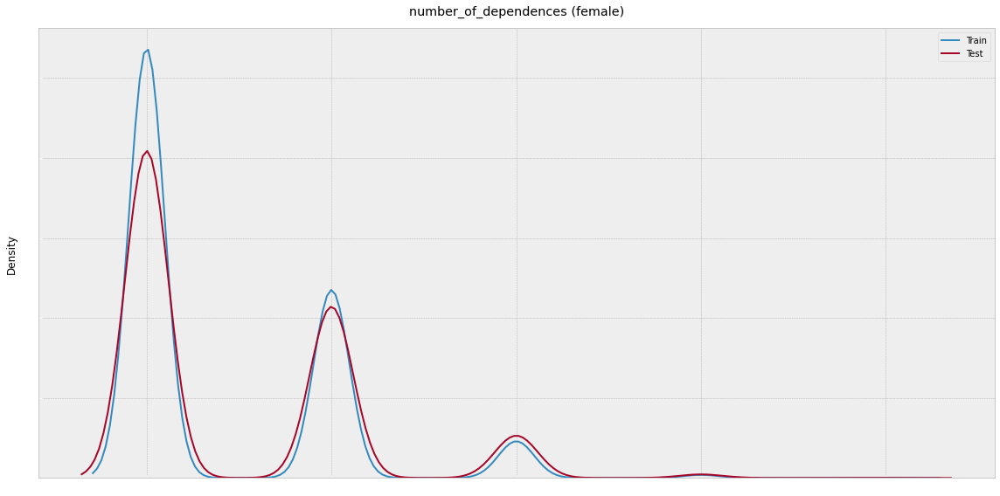

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


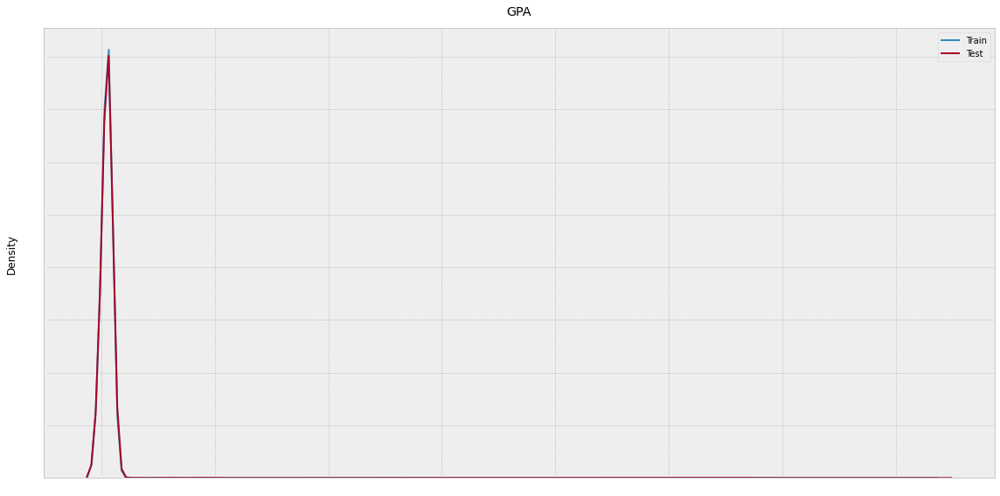

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


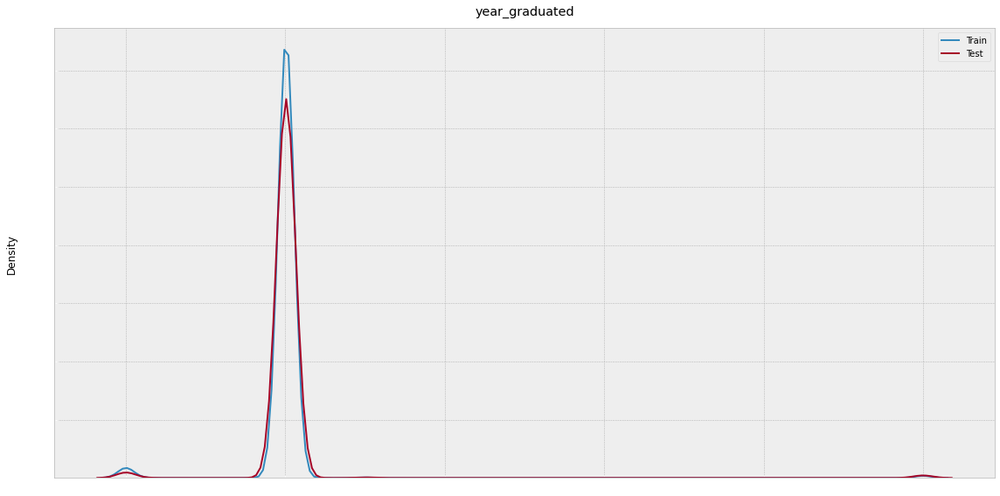

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


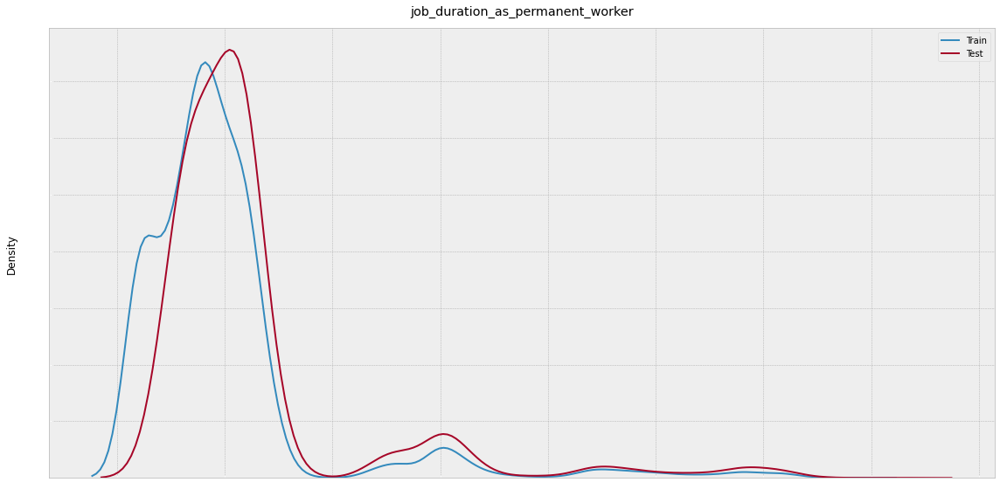

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


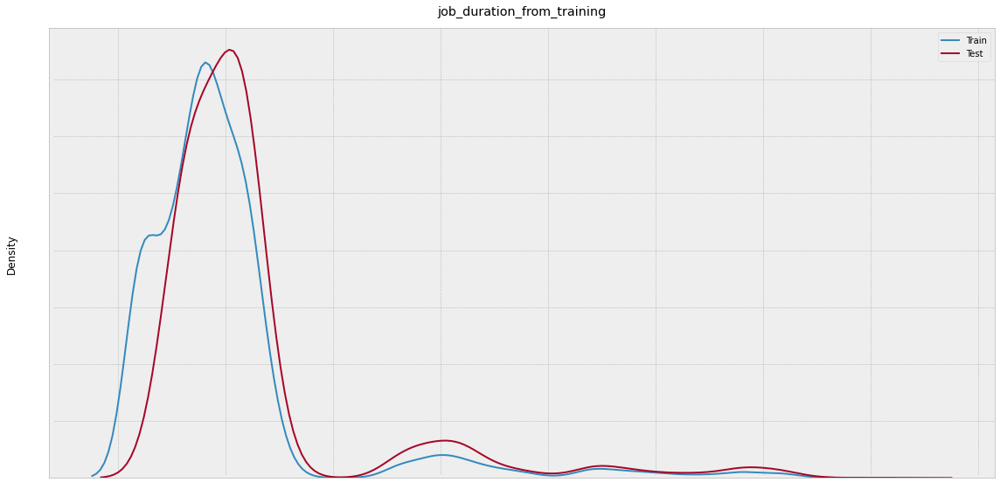

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


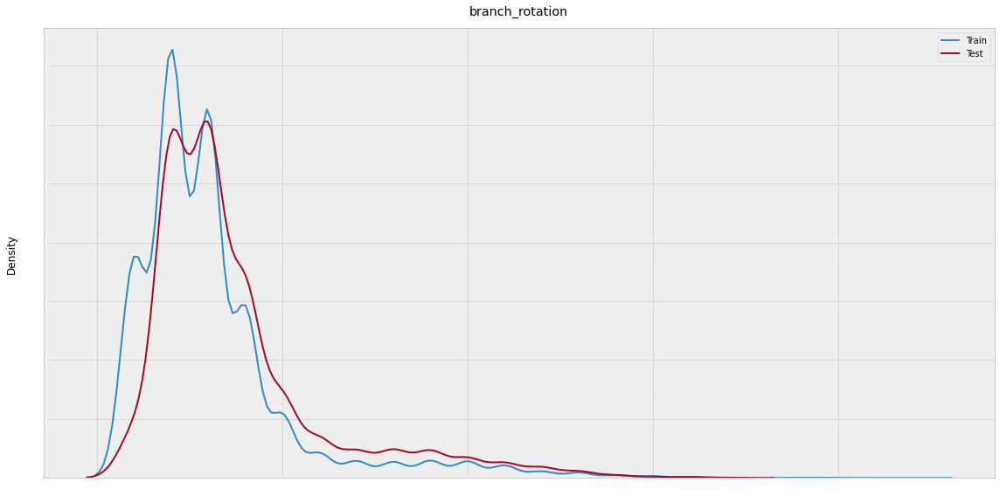

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


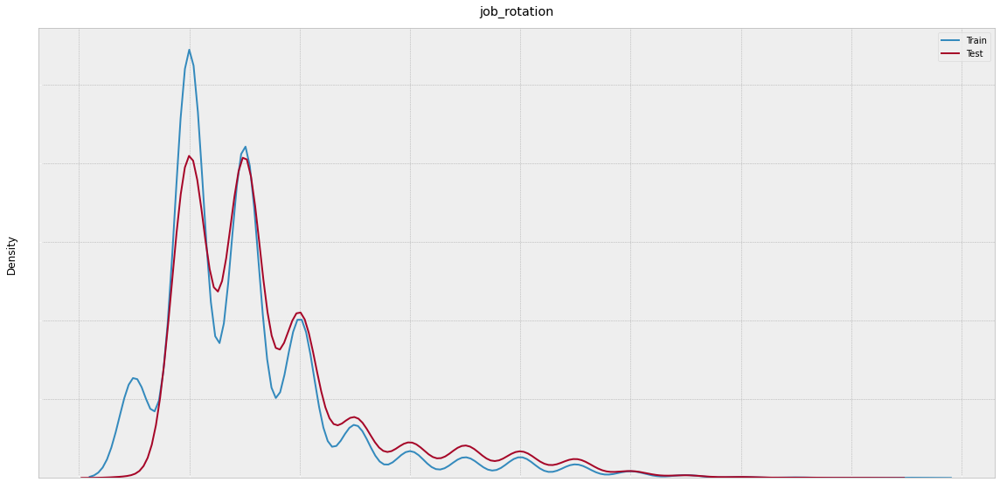

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


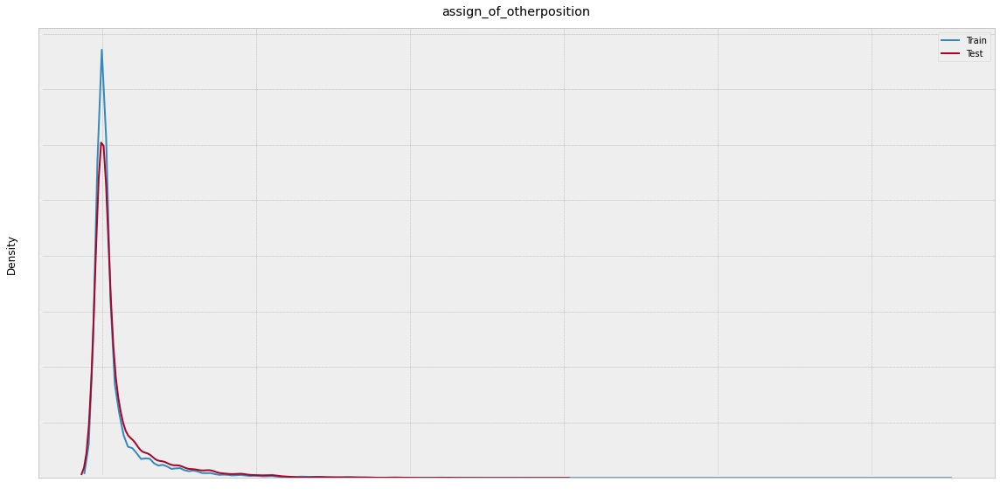

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


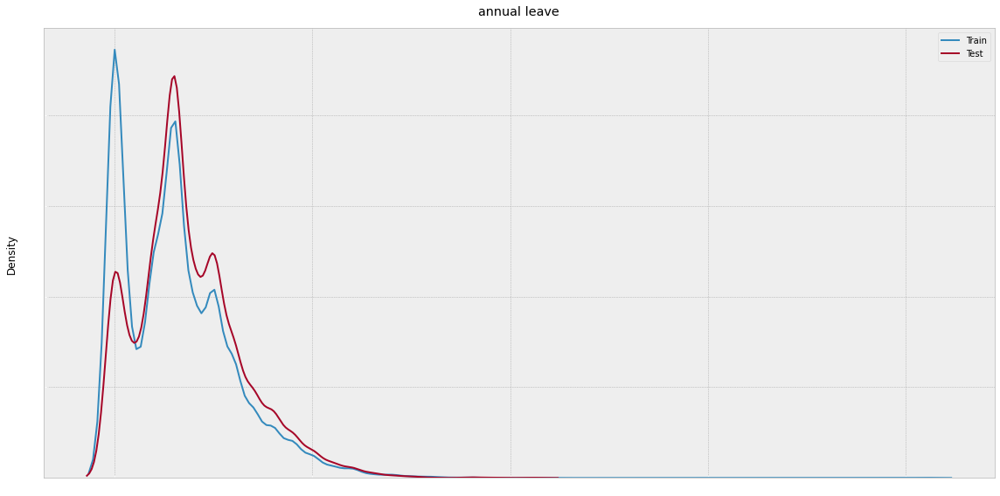

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


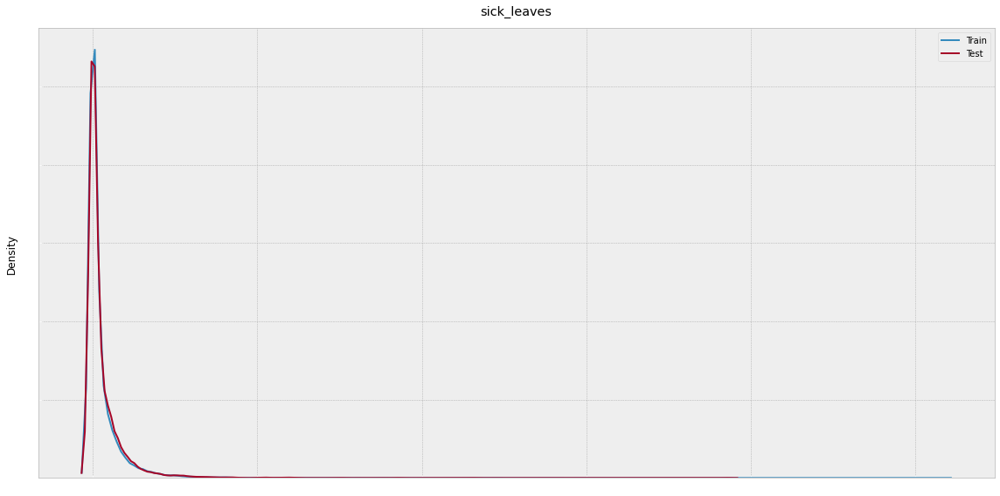

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


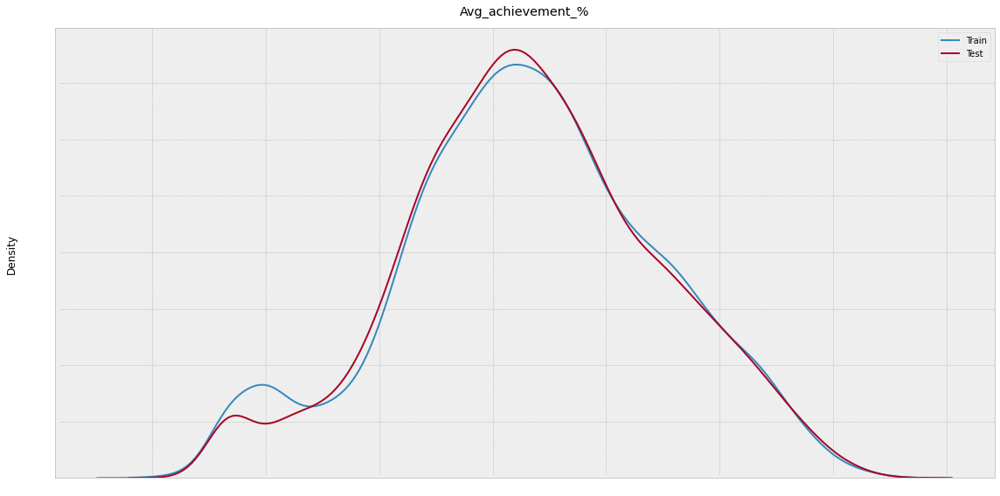

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


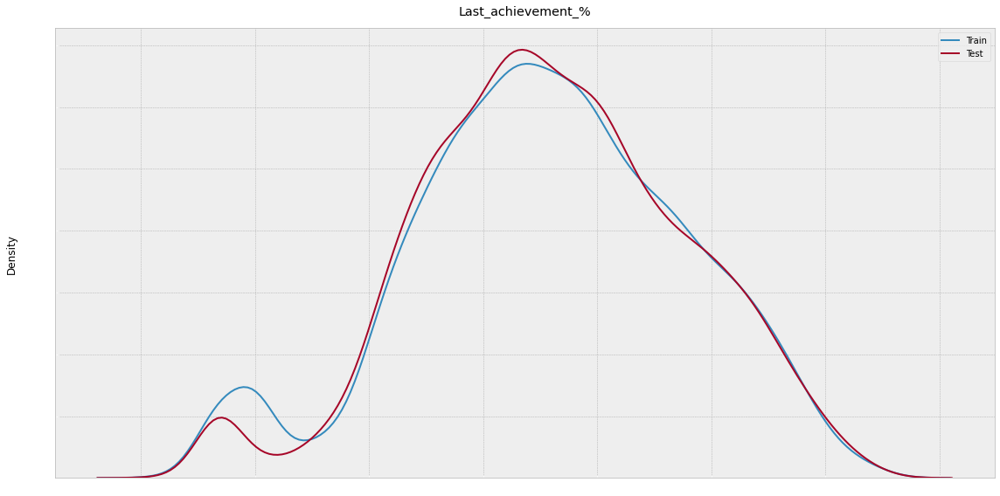

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


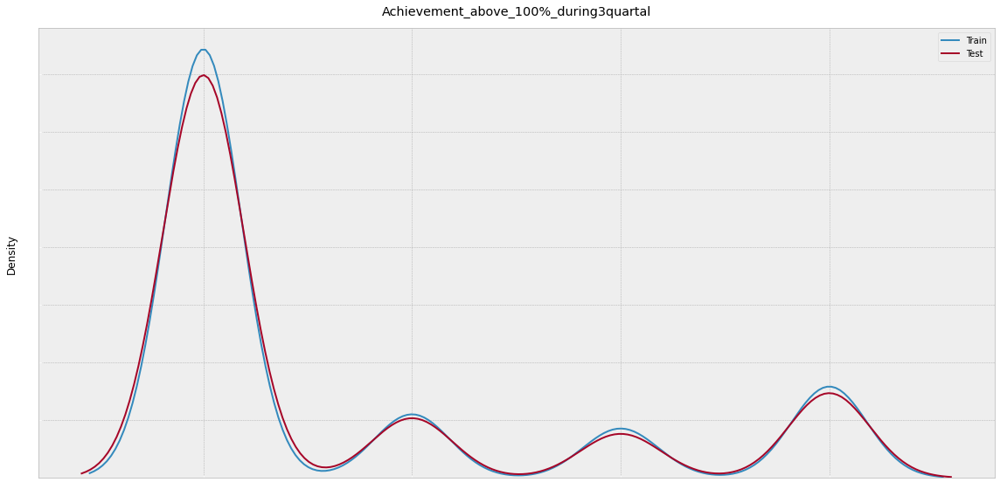

In [ ]:
plt.style.use('bmh')
for col in ['job_duration_in_current_job_level',
 'job_duration_in_current_person_level',
 'job_duration_in_current_branch',
 'age',
 'number_of_dependences',
 'number_of_dependences (male)',
 'number_of_dependences (female)',
 'GPA',
 'year_graduated',
 'job_duration_as_permanent_worker',
 'job_duration_from_training',
 'branch_rotation',
 'job_rotation',
 'assign_of_otherposition',
 'annual leave',
 'sick_leaves',
 'Avg_achievement_%',
 'Last_achievement_%',
 'Achievement_above_100%_during3quartal']:

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(df_downsampled[col], hist=False, label='Train')
        sns.distplot(test_df[col], hist=False, label='Test')

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(col, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

----------------------------------------------------------------------------------------------------
job_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
JG04
prob JG04: 0.9529257314328582
****************************************************************************************************
JG05
prob JG05: 0.042010502625656414
****************************************************************************************************
JG03
prob JG03: 0.005063765941485371
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
JG05
prob JG05: 0.06533333333333333
****************************************************************************************************
JG04
prob JG04: 0.932
****

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


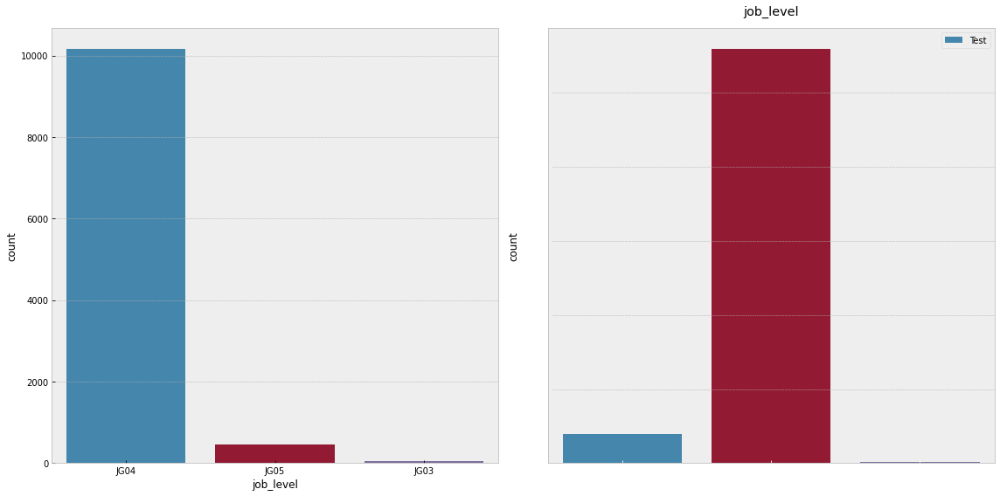

----------------------------------------------------------------------------------------------------
person_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
PG03
prob PG03: 0.9096024006001501
****************************************************************************************************
PG04
prob PG04: 0.042948237059264815
****************************************************************************************************
PG06
prob PG06: 0.024381095273818456
****************************************************************************************************
PG05
prob PG05: 0.017066766691672917
****************************************************************************************************
PG07
prob PG07: 0.0012190547636909228
******************************************************************************************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


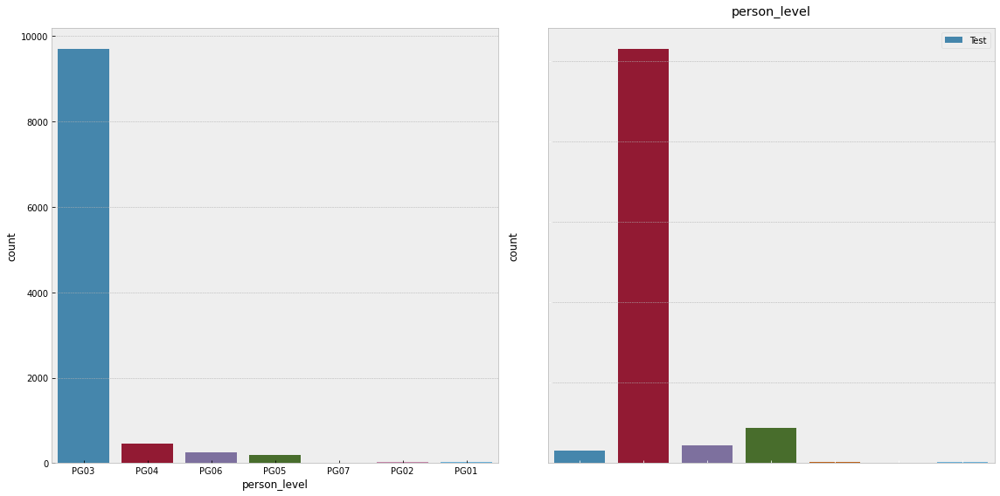

----------------------------------------------------------------------------------------------------
Employee_type
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
RM_type_B
prob RM_type_B: 0.41016504126031506
****************************************************************************************************
RM_type_A
prob RM_type_A: 0.5518567141785446
****************************************************************************************************
RM_type_C
prob RM_type_C: 0.037321830457614405
****************************************************************************************************
nan
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
RM_type_C
prob RM_type_C:

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


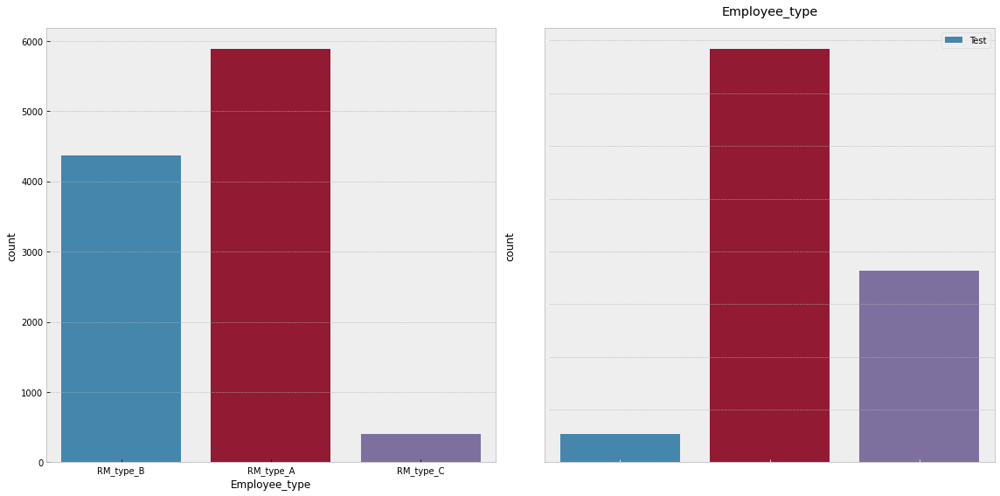

----------------------------------------------------------------------------------------------------
Employee_status
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Permanent
prob Permanent: 1.0
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Permanent
prob Permanent: 1.0


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


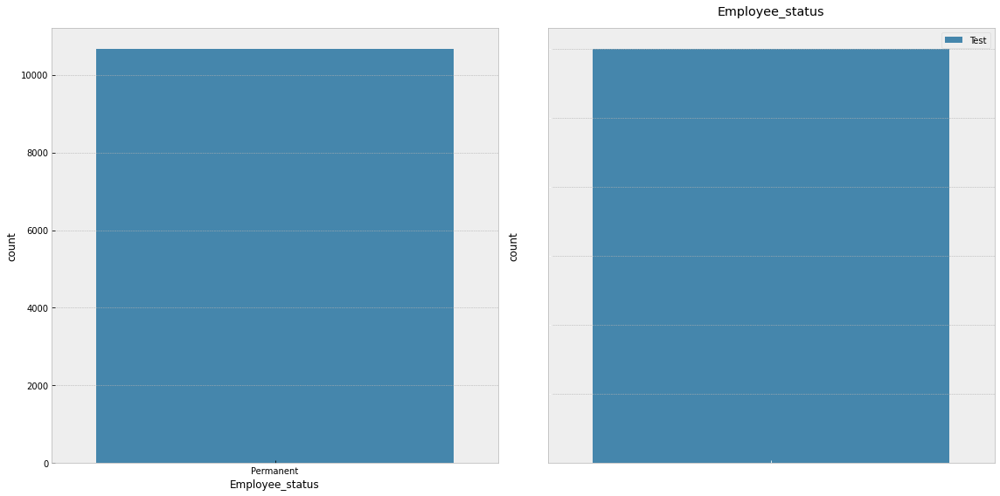

----------------------------------------------------------------------------------------------------
gender
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Male
prob Male: 0.7454051012753188
****************************************************************************************************
Female
prob Female: 0.25459489872468116
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Female
prob Female: 0.2655
****************************************************************************************************
Male
prob Male: 0.7345


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


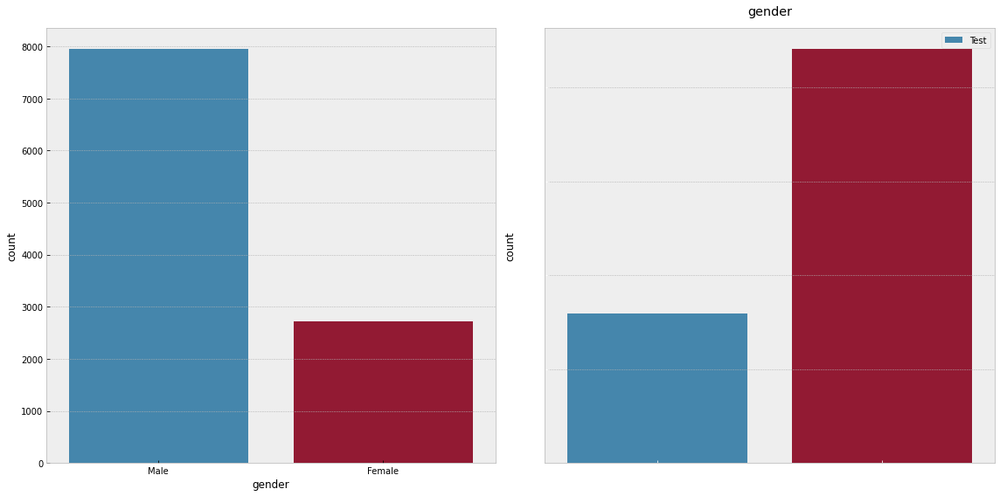

----------------------------------------------------------------------------------------------------
marital_status_maried(Y/N)
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Y
prob Y: 0.7733495873968492
****************************************************************************************************
N
prob N: 0.22665041260315077
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
Y
prob Y: 0.849
****************************************************************************************************
N
prob N: 0.151


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


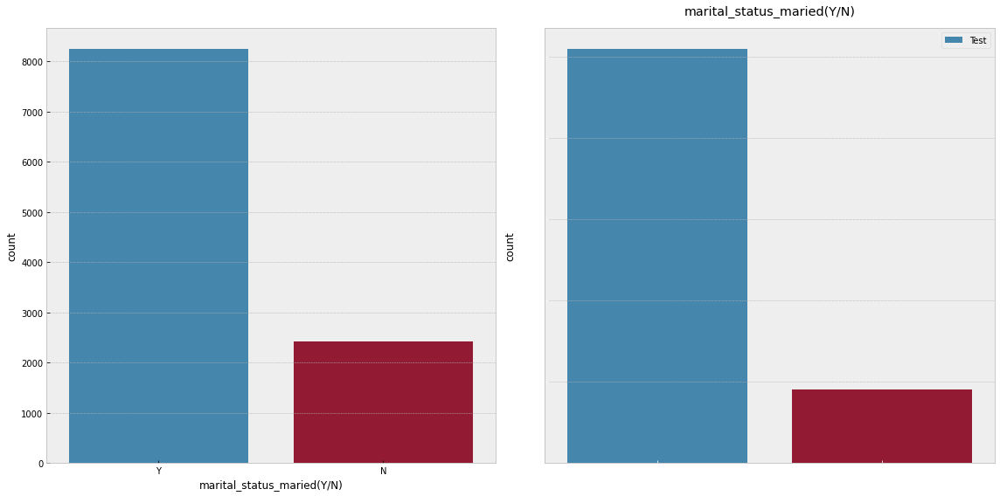

----------------------------------------------------------------------------------------------------
Education_level
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
level_4
prob level_4: 0.6697299324831207
****************************************************************************************************
nan
****************************************************************************************************
level_3
prob level_3: 0.12584396099024756
****************************************************************************************************
level_1
prob level_1: 0.010033758439609903
****************************************************************************************************
level_5
prob level_5: 0.003563390847711928
**************************************************************************************************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


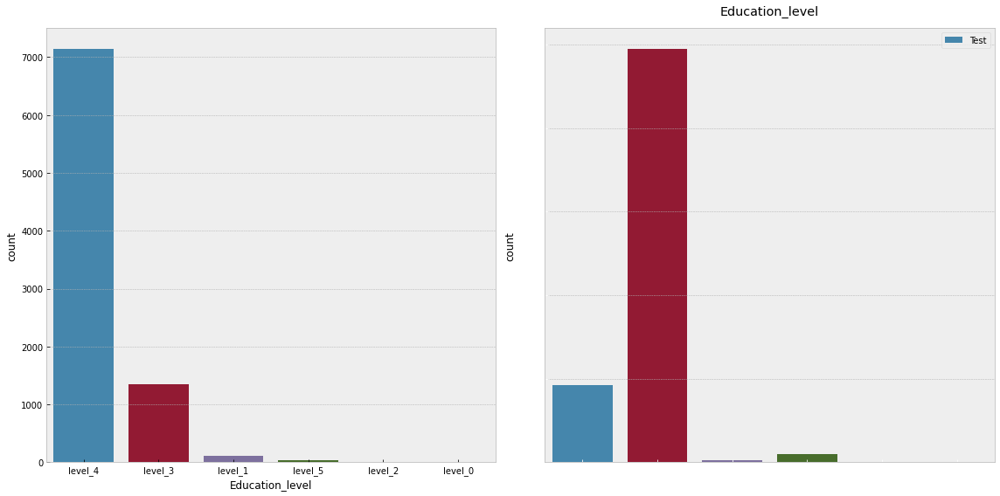

----------------------------------------------------------------------------------------------------
achievement_target_1
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Pencapaian less than 50
prob Pencapaian less than 50: 0.11552888222055514
****************************************************************************************************
Pencapaian 100_150
prob Pencapaian 100_150: 0.1516316579144786
****************************************************************************************************
Pencapaian 50_100
prob Pencapaian 50_100: 0.4780570142535634
****************************************************************************************************
nan
****************************************************************************************************
Tidak diberikan target
prob Tidak diberikan target: 0.0092835708

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


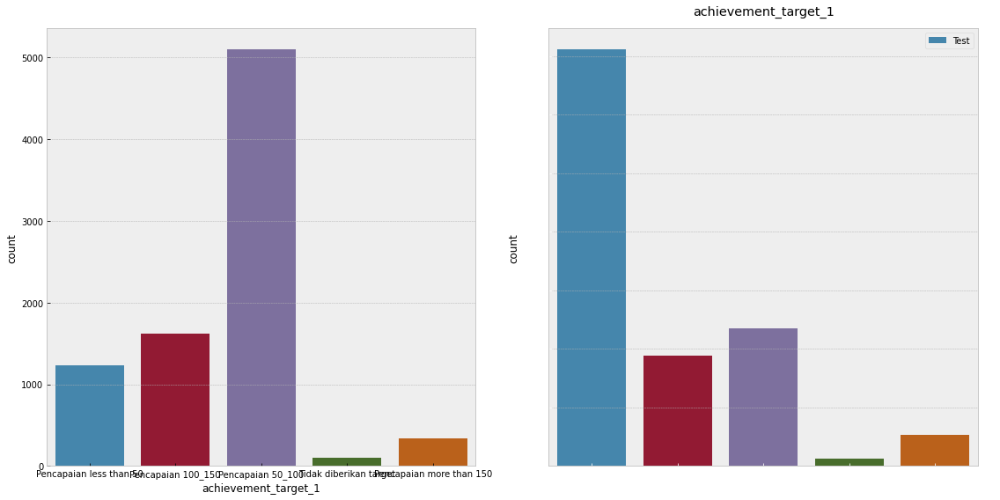

----------------------------------------------------------------------------------------------------
achievement_target_2
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
Pencapaian less than 50
prob Pencapaian less than 50: 0.5224118529632408
****************************************************************************************************
Pencapaian more than 150
prob Pencapaian more than 150: 0.054107276819204804
****************************************************************************************************
Pencapaian 50_100
prob Pencapaian 50_100: 0.14581770442610653
****************************************************************************************************
nan
****************************************************************************************************
Pencapaian 100_150
prob Pencapaian 100_150: 0.0542

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


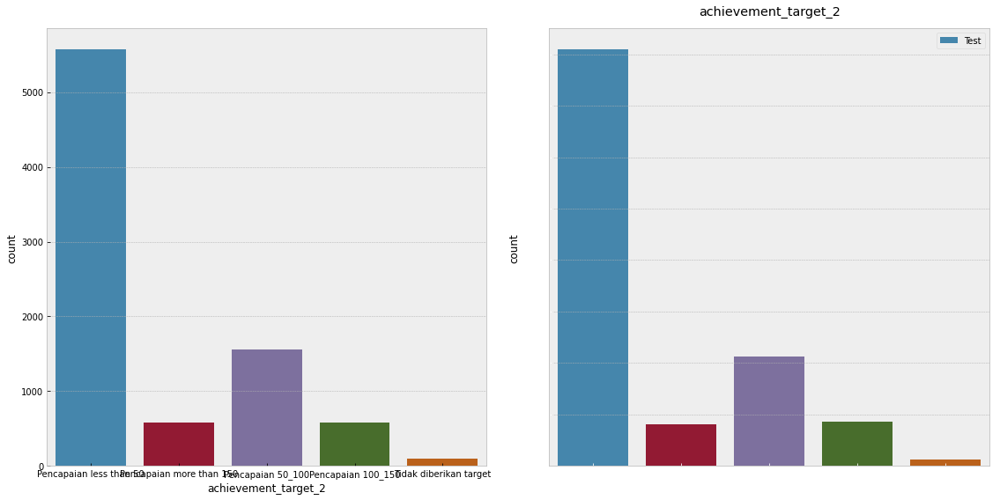

----------------------------------------------------------------------------------------------------
achievement_target_3
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
train
****************************************************************************************************
reached
prob reached: 0.5650787696924231
****************************************************************************************************
not_reached
prob not_reached: 0.22102400600150038
****************************************************************************************************
nan
&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&&
test
****************************************************************************************************
reached
prob reached: 0.7236666666666667
****************************************************************************************************
not_reached
prob not_rea

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


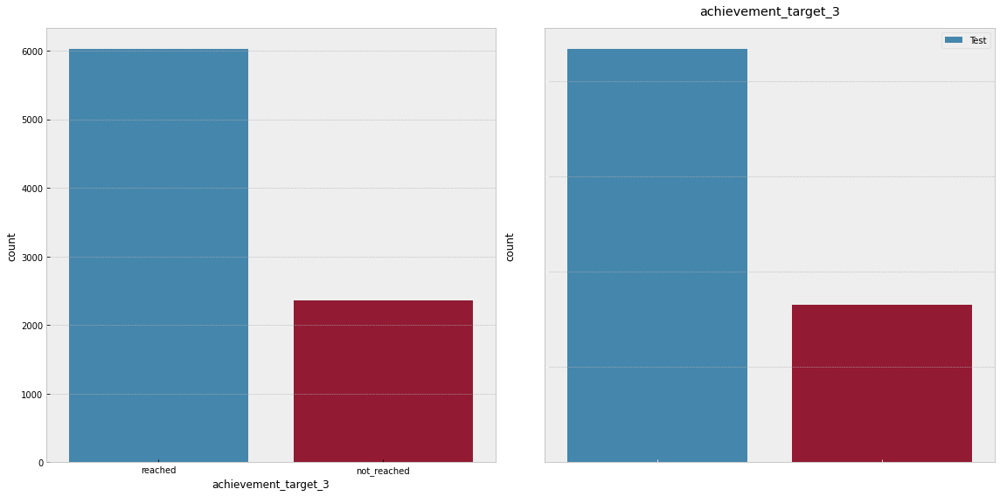

In [ ]:
for c in cat_cols:
    try:
        print('-'*100)
        print(c)
        print('&'*100)
        print('train')
        for un in df_downsampled[c].unique():
            print('*'*100)
            print(un)
            if len(df_downsampled[df_downsampled[c] == un]):
                print(f"prob {un}: {len(df_downsampled[df_downsampled[c] == un])/len(df_downsampled)}")

        print('&'*100)
        print('test')
        for un in test_df[c].unique():
            print('*'*100)
            print(un)
            if len(test_df[test_df[c] == un]):
                print(f"prob {un}: {len(test_df[test_df[c] == un])/len(test_df)}")

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        sns.countplot(df_downsampled[c], label='Train', ax=ax1)
        sns.countplot(test_df[c], label='Test', ax=ax2)

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(c, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

In [ ]:
# train_df = df_downsampled.copy()

#### Target Distribution on null and non-null values

##### Overall

In [ ]:
print('train df')
print(f'num of data: {len(train_df)}')
print(f"0: {len(train_df[train_df['Best Performance'] == 0]) / len(train_df)}")
print(f"1: {len(train_df[train_df['Best Performance'] == 1]) / len(train_df)}")

train df
num of data: 21890
0: 0.8781635449977159
1: 0.12183645500228414


In [ ]:
non_null_df = train_df.dropna()
null_df = train_df[train_df.isna().any(axis=1)]

print('non null')
print(f'num of data: {len(non_null_df)}')
print(f"0: {len(non_null_df[non_null_df['Best Performance'] == 0]) / len(non_null_df)}")
print(f"1: {len(non_null_df[non_null_df['Best Performance'] == 1]) / len(non_null_df)}")
print(non_null_df['Best Performance'].value_counts())
print('-'*100)
print('null')
print(f'num of data: {len(null_df)}')
print(f"0: {len(null_df[null_df['Best Performance'] == 0]) / len(null_df)}")
print(f"1: {len(null_df[null_df['Best Performance'] == 1]) / len(null_df)}")
print(null_df['Best Performance'].value_counts())

non null
num of data: 11638
0: 0.8532393882110328
1: 0.14676061178896718
0    9930
1    1708
Name: Best Performance, dtype: int64
----------------------------------------------------------------------------------------------------
null
num of data: 10252
0: 0.9064572766289505
1: 0.09354272337104955
0    9293
1     959
Name: Best Performance, dtype: int64


##### Each column contains null

In [ ]:
null_cols = train_df.columns[train_df.isnull().any()]
print(null_cols)

Index(['Employee_type', 'Education_level', 'GPA', 'year_graduated',
       'job_duration_as_permanent_worker', 'Avg_achievement_%',
       'Last_achievement_%', 'Achievement_above_100%_during3quartal',
       'achievement_target_1', 'achievement_target_2', 'achievement_target_3'],
      dtype='object')


In [ ]:
for col in null_cols:
    print('-'*100)
    print(col)

    usedCol = [col, 'Best Performance']
    non_null_col_df = train_df[usedCol].dropna()
    null_col_df = train_df[usedCol][train_df[usedCol].isna().any(axis=1)]

    print('*'*100)
    print('non null')
    print(f'num of data: {len(non_null_col_df)}')
    print(f"0: {len(non_null_col_df[non_null_col_df['Best Performance'] == 0]) / len(non_null_col_df)}")
    print(non_null_col_df[non_null_col_df['Best Performance'] == 0].describe())
    print(f"1: {len(non_null_col_df[non_null_col_df['Best Performance'] == 1]) / len(non_null_col_df)}")
    print(non_null_col_df[non_null_col_df['Best Performance'] == 1].describe())
    print(non_null_col_df['Best Performance'].value_counts())
    print('*'*100)
    print('null')
    print(f'num of data: {len(null_col_df)}')
    print(f"0: {len(null_col_df[null_col_df['Best Performance'] == 0]) / len(null_col_df)}")
    print(f"1: {len(null_col_df[null_col_df['Best Performance'] == 1]) / len(null_col_df)}")
    print(null_col_df['Best Performance'].value_counts())

----------------------------------------------------------------------------------------------------
Employee_type
****************************************************************************************************
non null
num of data: 21878
0: 0.8780967181643661
       Best Performance
count           19211.0
mean                0.0
std                 0.0
min                 0.0
25%                 0.0
50%                 0.0
75%                 0.0
max                 0.0
1: 0.12190328183563397
       Best Performance
count            2667.0
mean                1.0
std                 0.0
min                 1.0
25%                 1.0
50%                 1.0
75%                 1.0
max                 1.0
0    19211
1     2667
Name: Best Performance, dtype: int64
****************************************************************************************************
null
num of data: 12
0: 1.0
1: 0.0
0    12
Name: Best Performance, dtype: int64
---------------------------------------

#### Categorical Data Distribution on Target

----------------------------------------------------------------------------------------------------
job_level
****************************************************************************************************
JG05
prob 0: 0.8494117647058823
prob 1: 0.15058823529411763
****************************************************************************************************
JG04
prob 0: 0.867526746381372
prob 1: 0.13247325361862808
****************************************************************************************************
JG03
prob 0: 0.9933842239185751
prob 1: 0.0066157760814249365
****************************************************************************************************
JG06
prob 0: 1.0
prob 1: 0.0


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


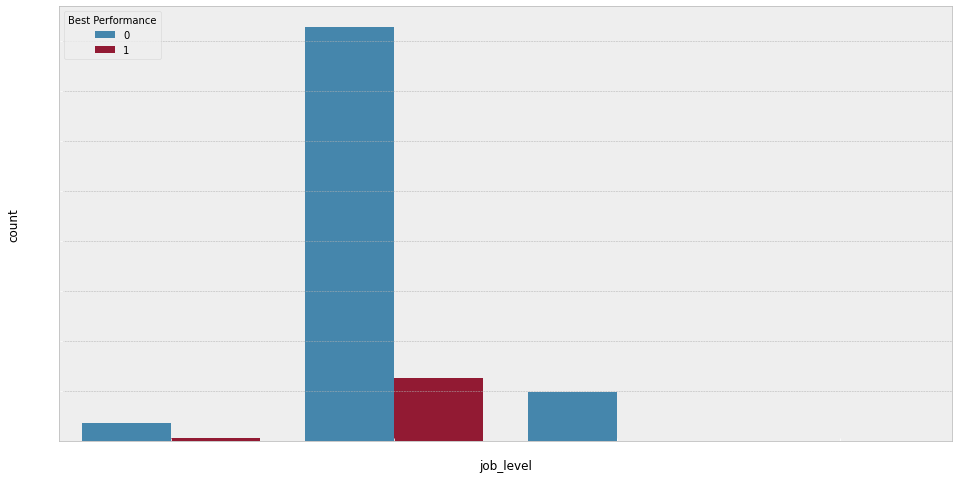

----------------------------------------------------------------------------------------------------
person_level
****************************************************************************************************
PG06
prob 0: 0.8368200836820083
prob 1: 0.16317991631799164
****************************************************************************************************
PG04
prob 0: 0.8525402726146221
prob 1: 0.14745972738537794
****************************************************************************************************
PG03
prob 0: 0.8681788297172912
prob 1: 0.13182117028270873
****************************************************************************************************
PG05
prob 0: 0.8736263736263736
prob 1: 0.12637362637362637
****************************************************************************************************
PG01
prob 0: 0.9953149401353462
prob 1: 0.004685059864653826
********************************************************************************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


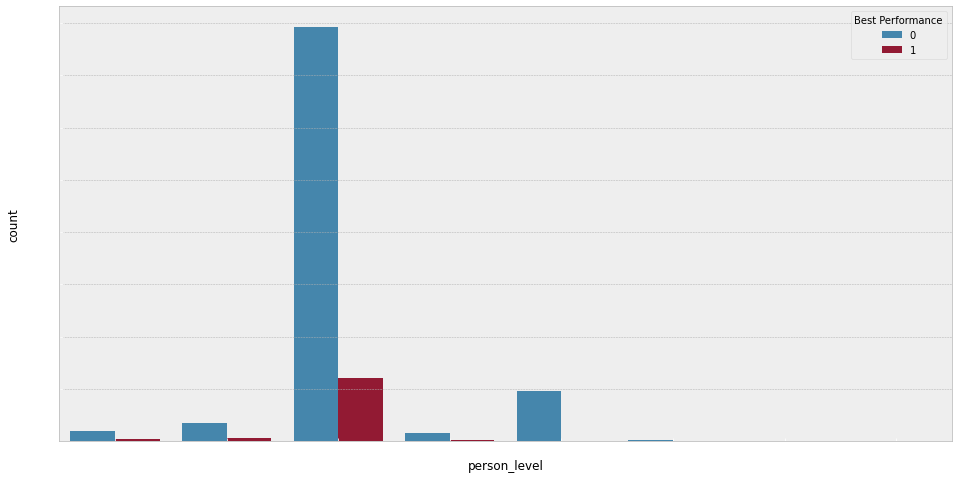

----------------------------------------------------------------------------------------------------
Employee_type
****************************************************************************************************
RM_type_A
prob 0: 0.8589173995829178
prob 1: 0.14108260041708223
****************************************************************************************************
RM_type_C
prob 0: 0.8763297872340425
prob 1: 0.12367021276595745
****************************************************************************************************
RM_type_B
prob 0: 0.8991779736555412
prob 1: 0.10082202634445875
****************************************************************************************************
nan


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


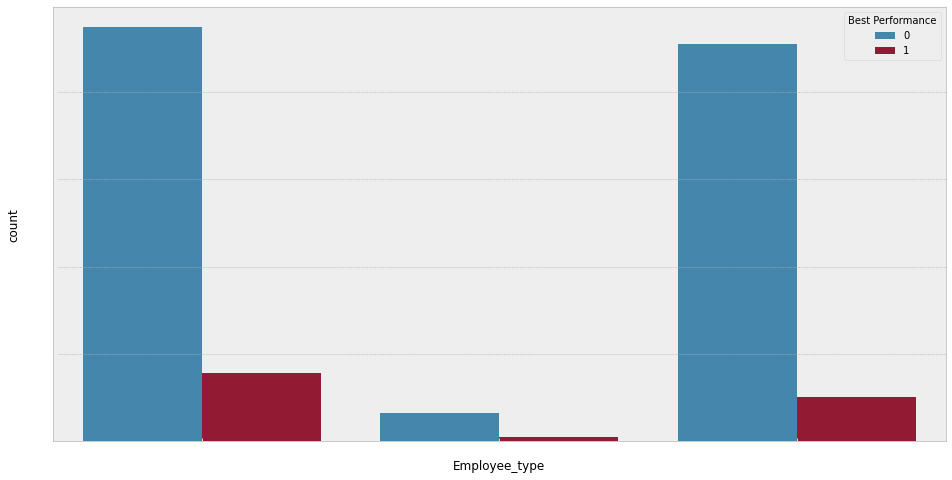

----------------------------------------------------------------------------------------------------
Employee_status
****************************************************************************************************
Permanent
prob 0: 0.8657099697885197
prob 1: 0.13429003021148037
****************************************************************************************************
Contract
prob 0: 1.0
prob 1: 0.0


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


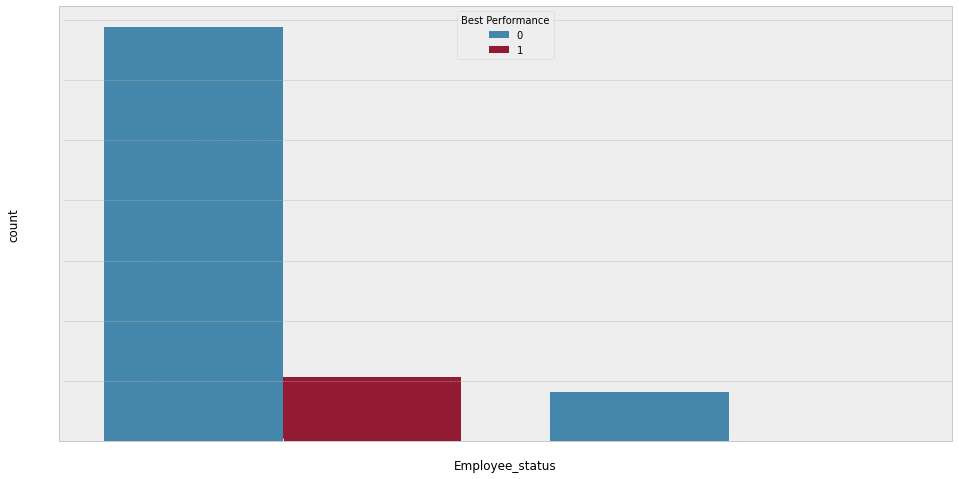

----------------------------------------------------------------------------------------------------
gender
****************************************************************************************************
Female
prob 0: 0.8734087694483734
prob 1: 0.1265912305516266
****************************************************************************************************
Male
prob 0: 0.8798201305901195
prob 1: 0.1201798694098805


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


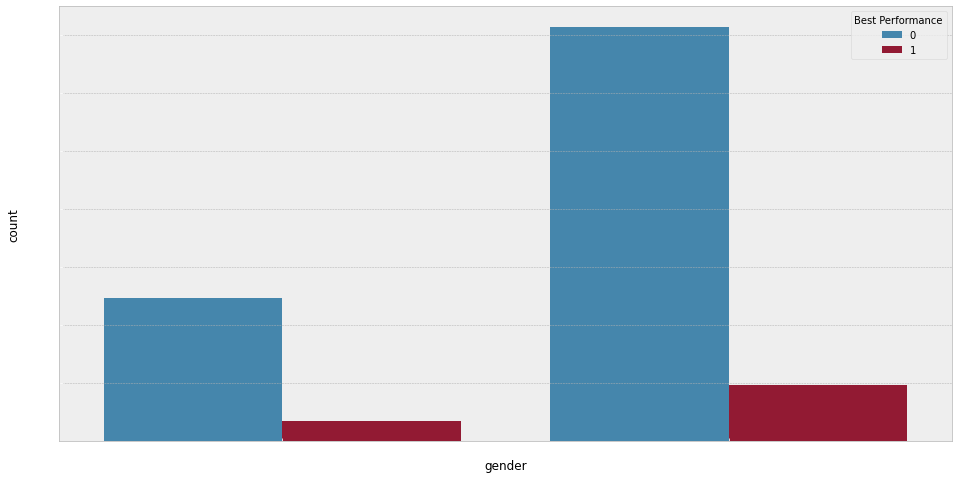

----------------------------------------------------------------------------------------------------
marital_status_maried(Y/N)
****************************************************************************************************
Y
prob 0: 0.8605513976843856
prob 1: 0.1394486023156144
****************************************************************************************************
N
prob 0: 0.9221671727665015
prob 1: 0.07783282723349848


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


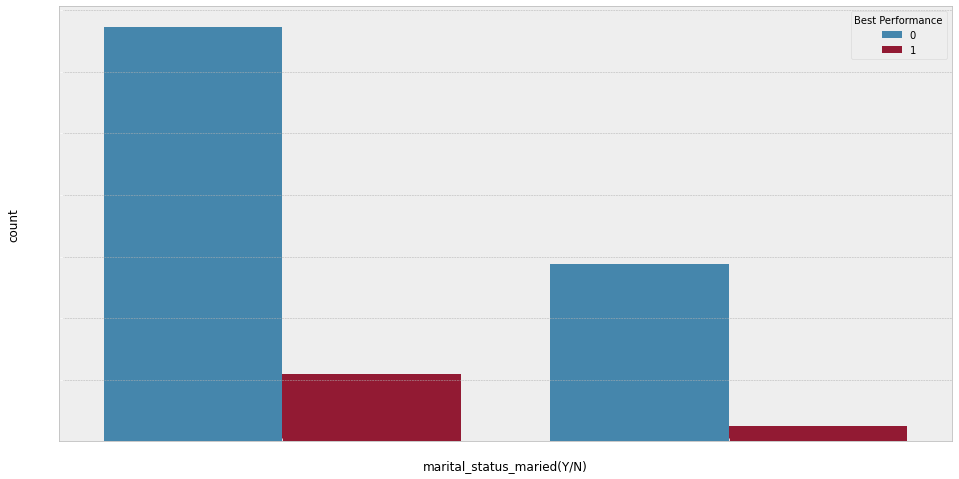

----------------------------------------------------------------------------------------------------
Education_level
****************************************************************************************************
level_4
prob 0: 0.8851315789473684
prob 1: 0.11486842105263158
****************************************************************************************************
level_5
prob 0: 0.84375
prob 1: 0.15625
****************************************************************************************************
level_3
prob 0: 0.8847251962883654
prob 1: 0.11527480371163455
****************************************************************************************************
nan
****************************************************************************************************
level_1
prob 0: 0.8229166666666666
prob 1: 0.17708333333333334
****************************************************************************************************
level_2
prob 0: 1.0
prob 1: 0.0
************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


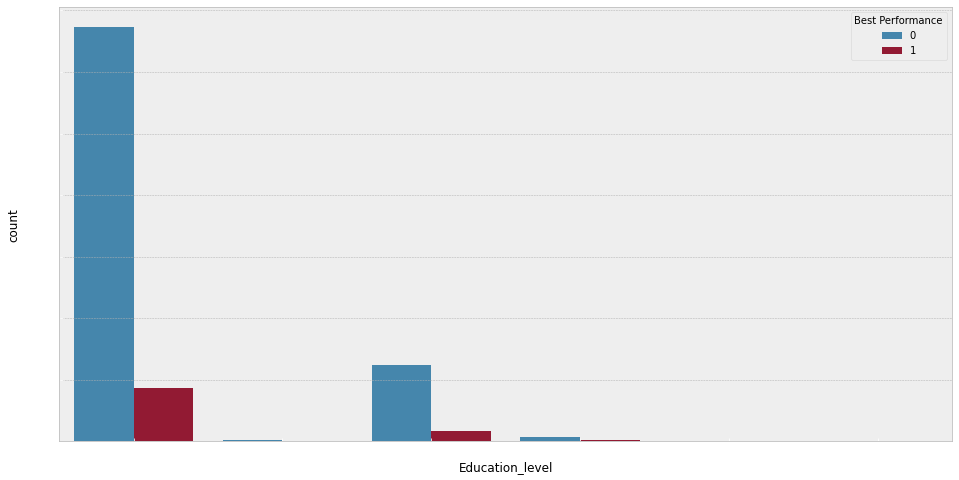

----------------------------------------------------------------------------------------------------
achievement_target_1
****************************************************************************************************
Pencapaian 50_100
prob 0: 0.8492942453854506
prob 1: 0.1507057546145494
****************************************************************************************************
Pencapaian 100_150
prob 0: 0.8588548601864181
prob 1: 0.1411451398135819
****************************************************************************************************
Pencapaian less than 50
prob 0: 0.8482142857142857
prob 1: 0.15178571428571427
****************************************************************************************************
Pencapaian more than 150
prob 0: 0.8529411764705882
prob 1: 0.14705882352941177
****************************************************************************************************
nan
*****************************************************************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


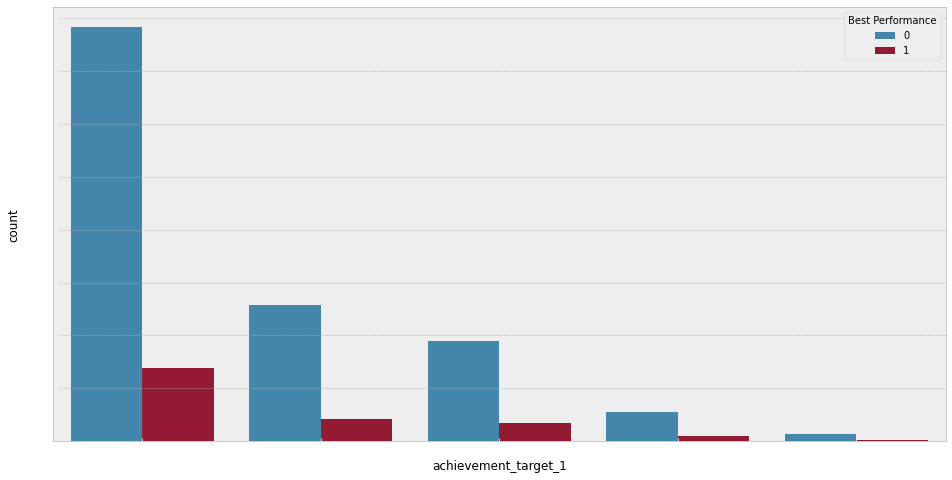

----------------------------------------------------------------------------------------------------
achievement_target_2
****************************************************************************************************
Pencapaian less than 50
prob 0: 0.8488726986314856
prob 1: 0.15112730136851432
****************************************************************************************************
Pencapaian 50_100
prob 0: 0.8526315789473684
prob 1: 0.14736842105263157
****************************************************************************************************
Pencapaian more than 150
prob 0: 0.8419512195121951
prob 1: 0.15804878048780488
****************************************************************************************************
Pencapaian 100_150
prob 0: 0.8710280373831776
prob 1: 0.12897196261682242
****************************************************************************************************
nan
***************************************************************

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


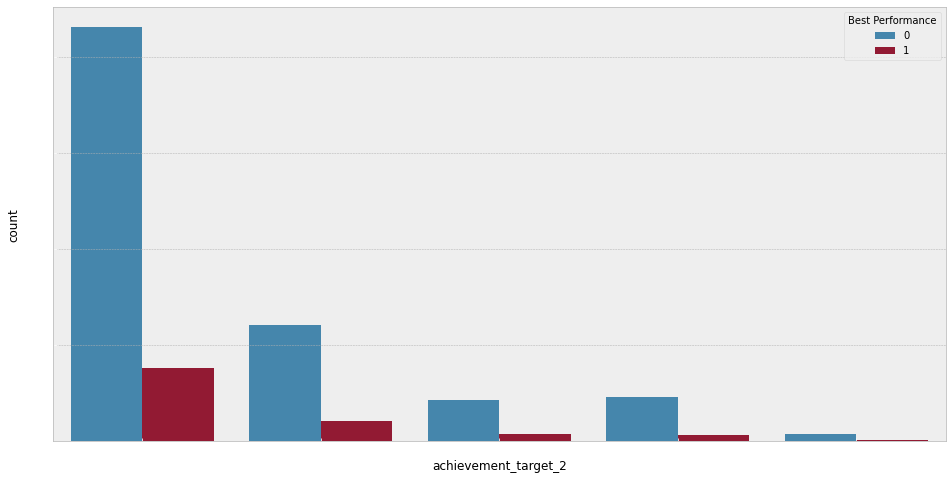

----------------------------------------------------------------------------------------------------
achievement_target_3
****************************************************************************************************
reached
prob 0: 0.8562585343650433
prob 1: 0.14374146563495677
****************************************************************************************************
not_reached
prob 0: 0.8376426741206615
prob 1: 0.16235732587933846
****************************************************************************************************
nan


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


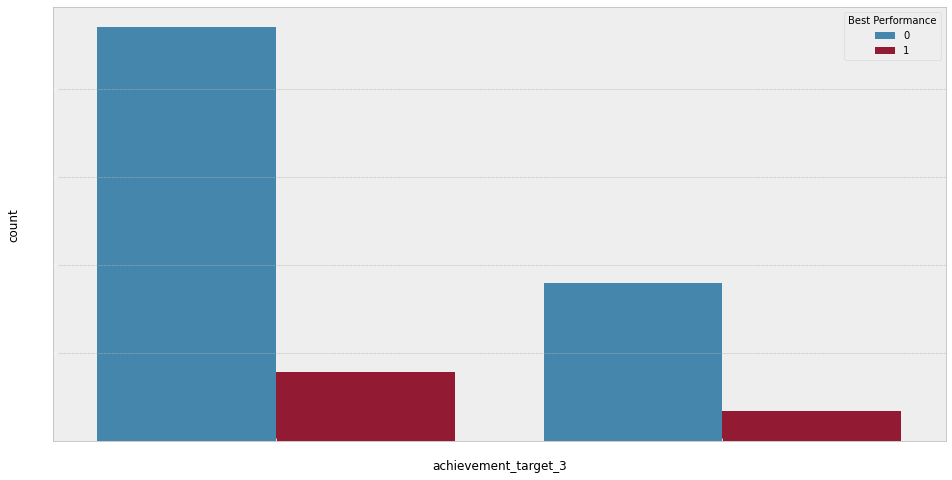

In [ ]:
for c in cat_cols:
    print('-'*100)
    print(c)
    for un in train_df[c].unique():
        print('*'*100)
        print(un)
        if len(train_df[train_df[c] == un]):
            print(f"prob 0: {len(train_df[(train_df[c] == un) & (train_df['Best Performance'] == 0)])/len(train_df[train_df[c] == un])}")
            print(f"prob 1: {len(train_df[(train_df[c] == un) & (train_df['Best Performance'] == 1)])/len(train_df[train_df[c] == un])}")
    plt.figure(figsize=(16, 8))
    sns.countplot(train_df[c], hue=train_df['Best Performance'])
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')
    plt.show()

In [ ]:
for i in range(len(cat_cols)):
    print('-'*100)
    print(cat_cols[i])
    for j in range(i+1, len(cat_cols)):
        print('*'*100)
        print(cat_cols[j])
        for uni in train_df[cat_cols[i]].unique():
            try:
                for unj in train_df[cat_cols[j]].unique():
                    print('%'*100)
                    print(f'{uni} & {unj}')
                    try:
                        print(f'condition frac: {len(train_df[(train_df[cat_cols[i]] == uni) & (train_df[cat_cols[j]] == unj)])/len(train_df)}')
                        print(f"prob 0: {len(train_df[(train_df[cat_cols[i]] == uni) & (train_df[cat_cols[j]] == unj) & (train_df['Best Performance'] == 0)])/len(train_df[(train_df[cat_cols[i]] == uni) & (train_df[cat_cols[j]] == unj)])}")
                        print(f"prob 1: {len(train_df[(train_df[cat_cols[i]] == uni) & (train_df[cat_cols[j]] == unj) & (train_df['Best Performance'] == 1)])/len(train_df[(train_df[cat_cols[i]] == uni) & (train_df[cat_cols[j]] == unj)])}")

                    except:
                        continue
            except:
                continue

----------------------------------------------------------------------------------------------------
job_level
****************************************************************************************************
person_level
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
JG05 & PG06
condition frac: 0.021699406121516673
prob 0: 0.8357894736842105
prob 1: 0.16421052631578947
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
JG05 & PG04
condition frac: 0.0
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
JG05 & PG03
condition frac: 0.0
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
JG05 & PG05
condition frac: 0.016217450890817726
prob 0: 0.8732394366197183
prob 1: 0.1267605633802817
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

#### Numerical Data Distribution on Target

In [ ]:
train_df.corr()

,job_duration_in_current_job_level,job_duration_in_current_person_level,job_duration_in_current_branch,age,number_of_dependences,number_of_dependences (male),number_of_dependences (female),GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal
job_duration_in_current_job_level,1.000000,0.837544,0.175745,-0.673458,0.412872,0.292664,0.282986,0.059701,0.082931,0.749473,0.767122,0.694876,0.627471,0.236796,0.218922,0.089822,0.078620,0.096258,0.085439,0.058778
job_duration_in_current_person_level,0.837544,1.000000,0.213205,-0.610386,0.397473,0.276587,0.277745,0.039025,0.075008,0.660110,0.676412,0.570995,0.525388,0.217163,0.291251,0.094049,0.102235,0.097624,0.083080,0.049928
job_duration_in_current_branch,0.175745,0.213205,1.000000,-0.154012,0.155370,0.110729,0.106016,0.010420,0.026689,0.117540,0.160935,0.009503,0.114136,0.072306,0.190174,0.049066,0.056981,-0.005018,-0.005197,-0.013032
age,-0.673458,-0.610386,-0.154012,1.000000,-0.530363,-0.358896,-0.380658,-0.050847,-0.105312,-0.877096,-0.876361,-0.773741,-0.715515,-0.257109,-0.206965,-0.078072,-0.078533,-0.164682,-0.146602,-0.091399
number_of_dependences,0.412872,0.397473,0.155370,-0.530363,1.000000,0.702777,0.691082,0.034677,0.070973,0.468662,0.504794,0.463086,0.457030,0.196285,0.209612,0.059657,0.072976,0.155542,0.140729,0.103055
number_of_dependences (male),0.292664,0.276587,0.110729,-0.358896,0.702777,1.000000,-0.028388,0.009068,0.034670,0.310370,0.343531,0.319345,0.315530,0.143248,0.153455,0.042430,0.052185,0.092926,0.084475,0.064256
number_of_dependences (female),0.282986,0.277745,0.106016,-0.380658,0.691082,-0.028388,1.000000,0.040107,0.065824,0.329747,0.360403,0.326346,0.321778,0.130325,0.138778,0.040766,0.049579,0.112374,0.101248,0.071702
GPA,0.059701,0.039025,0.010420,-0.050847,0.034677,0.009068,0.040107,1.000000,0.013914,0.066645,0.064986,0.058292,0.055175,0.030628,0.010546,0.008978,0.005367,0.027095,0.022215,0.022568
year_graduated,0.082931,0.075008,0.026689,-0.105312,0.070973,0.034670,0.065824,0.013914,1.000000,0.118702,0.118795,0.109023,0.091875,0.042010,0.019117,0.003621,0.017275,0.052796,0.043946,0.032652
job_duration_as_permanent_worker,0.749473,0.660110,0.117540,-0.877096,0.468662,0.310370,0.329747,0.066645,0.118702,1.000000,0.998801,0.865684,0.794820,0.255957,0.177982,0.063300,0.053670,0.160856,0.143064,0.091326


In [ ]:
test_df.corr()

,job_duration_in_current_job_level,job_duration_in_current_person_level,job_duration_in_current_branch,age,number_of_dependences,number_of_dependences (male),number_of_dependences (female),GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal
job_duration_in_current_job_level,1.000000,0.768354,0.021207,-0.665065,0.339720,0.232690,0.220598,0.015877,0.077383,0.750051,0.755988,0.654232,0.579368,0.192920,-0.036357,0.013676,0.111198,0.089132,0.055874
job_duration_in_current_person_level,0.768354,1.000000,0.021166,-0.551178,0.269288,0.183571,0.175730,0.031782,0.070116,0.622807,0.619524,0.451718,0.390514,0.138368,-0.006547,0.002149,0.100131,0.079198,0.049467
job_duration_in_current_branch,0.021207,0.021166,1.000000,-0.036335,0.016634,-0.005486,0.027492,0.016848,-0.012764,0.044099,0.043810,-0.133834,-0.049417,0.008509,0.030925,-0.002261,-0.021375,-0.012142,-0.029938
age,-0.665065,-0.551178,-0.036335,1.000000,-0.487747,-0.327465,-0.323261,-0.038057,-0.094771,-0.889604,-0.889013,-0.752819,-0.688019,-0.228045,0.032836,-0.017837,-0.173937,-0.142298,-0.090155
number_of_dependences,0.339720,0.269288,0.016634,-0.487747,1.000000,0.662354,0.671693,0.027190,0.049288,0.444764,0.446352,0.400951,0.357719,0.163612,-0.020549,-0.003499,0.144780,0.124485,0.069655
number_of_dependences (male),0.232690,0.183571,-0.005486,-0.327465,0.662354,1.000000,-0.110124,0.016251,0.038900,0.296392,0.297923,0.262393,0.233576,0.125944,-0.015866,0.004155,0.106515,0.089679,0.058112
number_of_dependences (female),0.220598,0.175730,0.027492,-0.323261,0.671693,-0.110124,1.000000,0.020002,0.026801,0.296964,0.297557,0.272459,0.243600,0.092519,-0.011573,-0.008751,0.086746,0.076471,0.034945
GPA,0.015877,0.031782,0.016848,-0.038057,0.027190,0.016251,0.020002,1.000000,0.056948,0.061661,0.061880,0.056411,0.054190,-0.004737,-0.019170,-0.011482,0.023587,0.022307,0.007702
year_graduated,0.077383,0.070116,-0.012764,-0.094771,0.049288,0.038900,0.026801,0.056948,1.000000,0.116729,0.116068,0.106117,0.082734,0.001048,0.021992,-0.005272,0.021092,0.009438,0.012102
job_duration_as_permanent_worker,0.750051,0.622807,0.044099,-0.889604,0.444764,0.296392,0.296964,0.061661,0.116729,1.000000,0.998651,0.827463,0.767675,0.231057,-0.010263,0.013973,0.173893,0.140758,0.090096


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


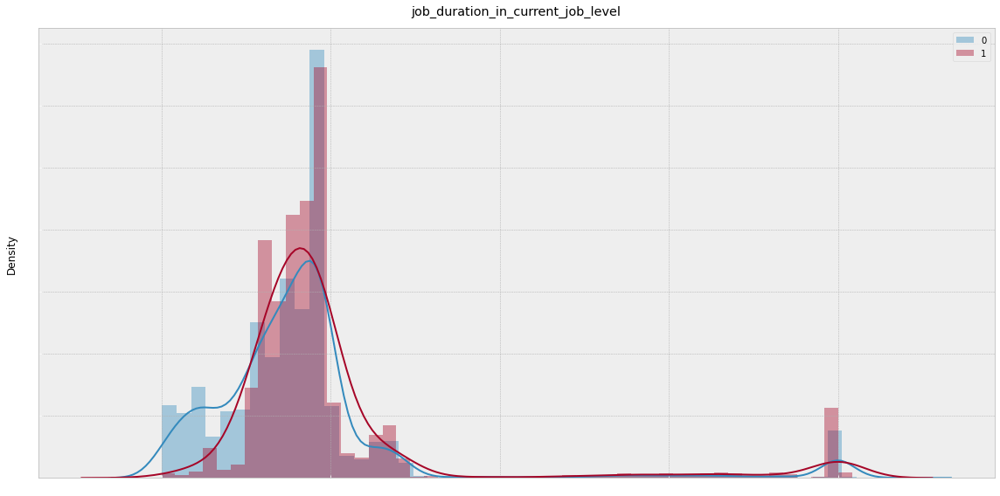

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


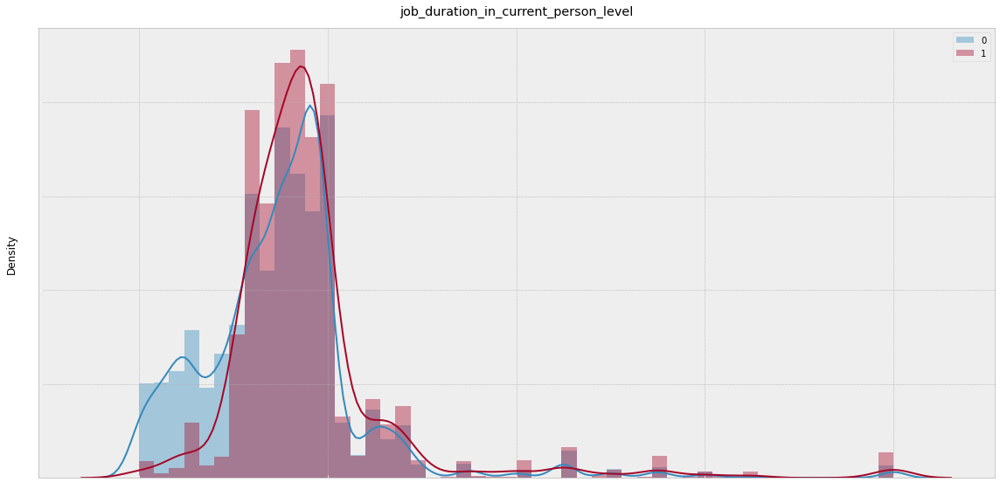

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


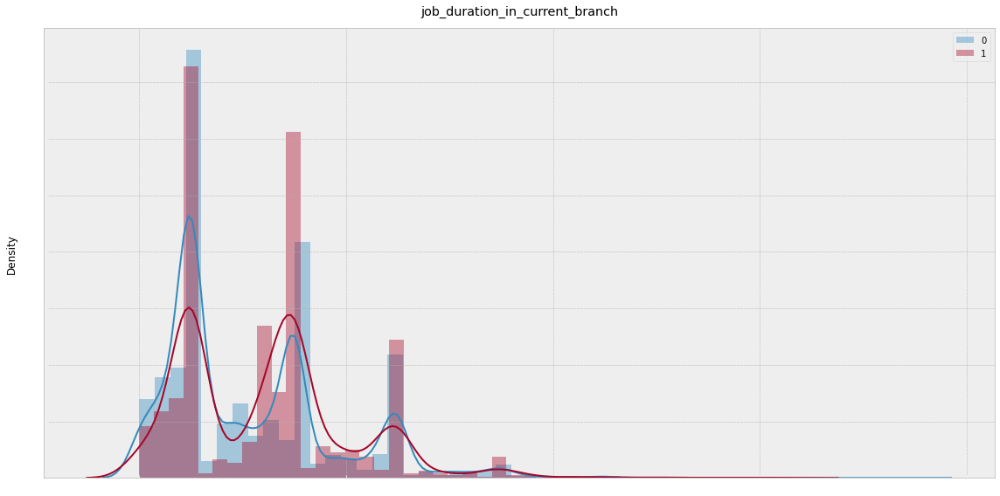

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


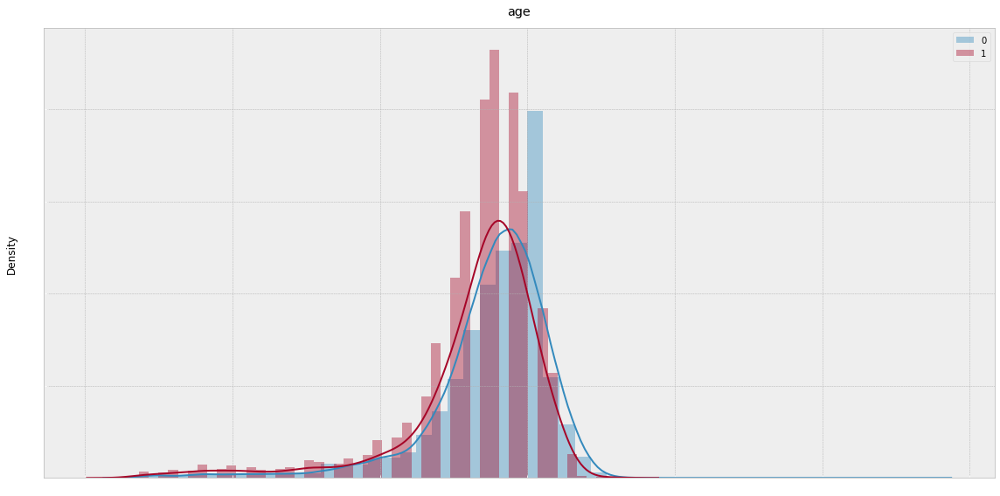

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


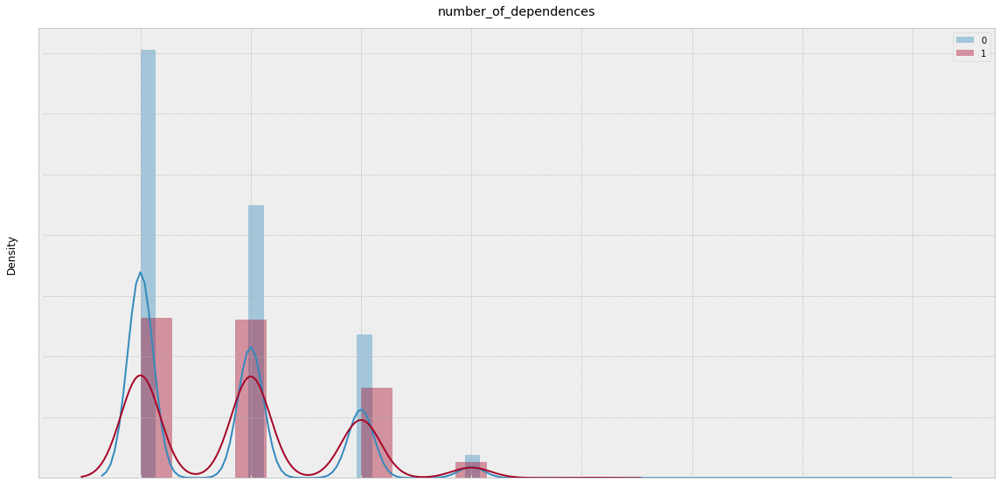

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


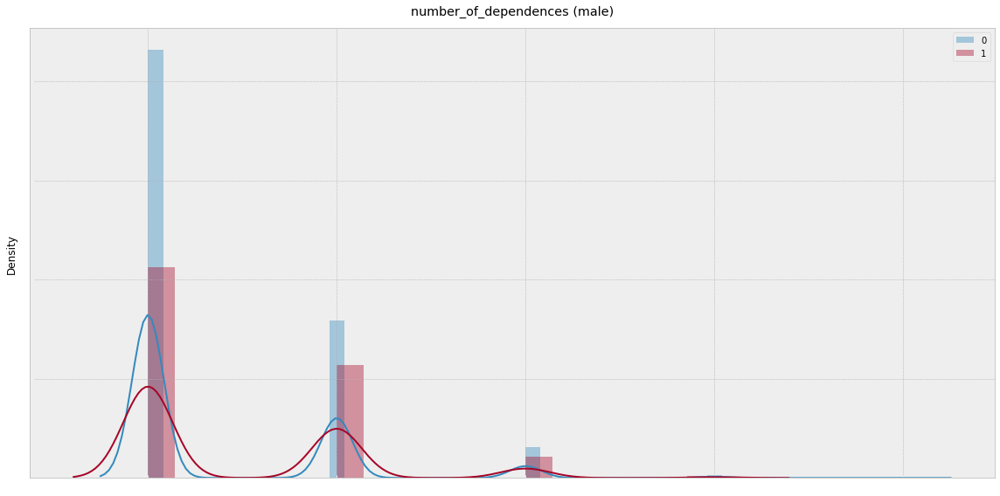

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


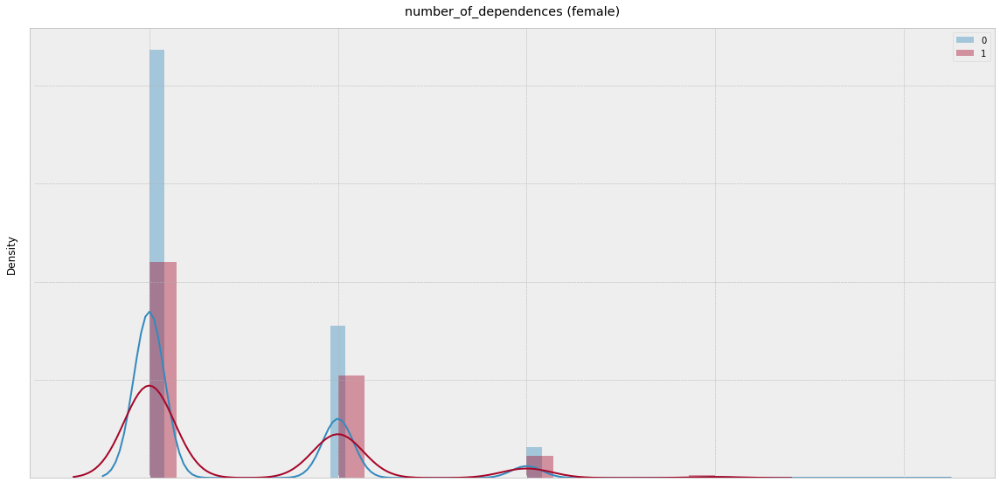

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


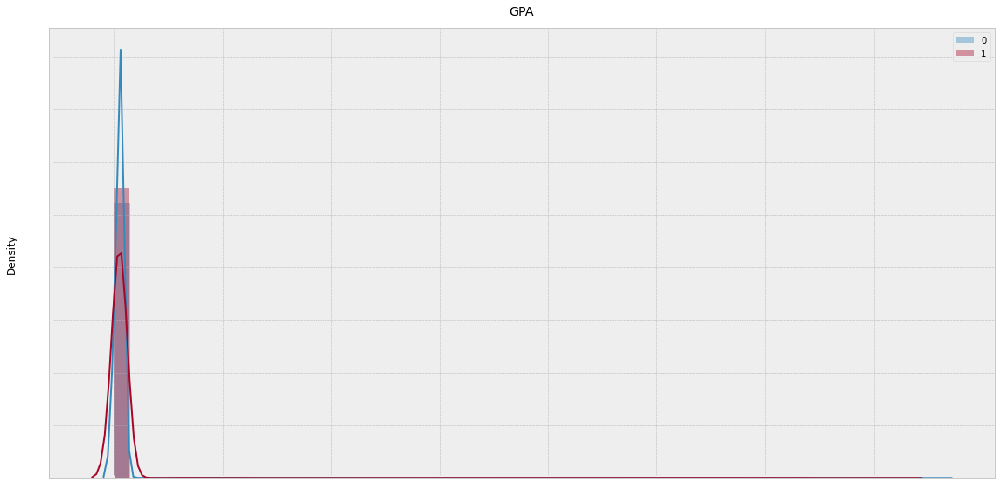

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


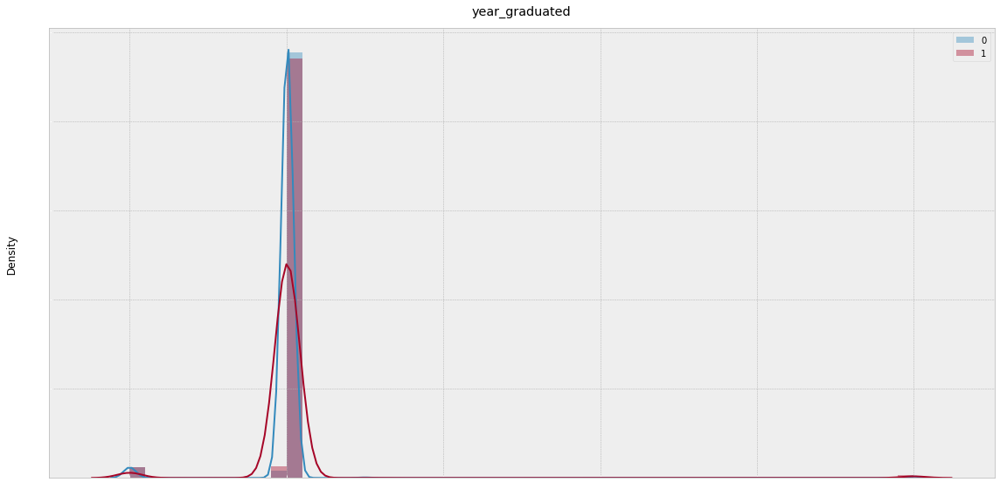

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


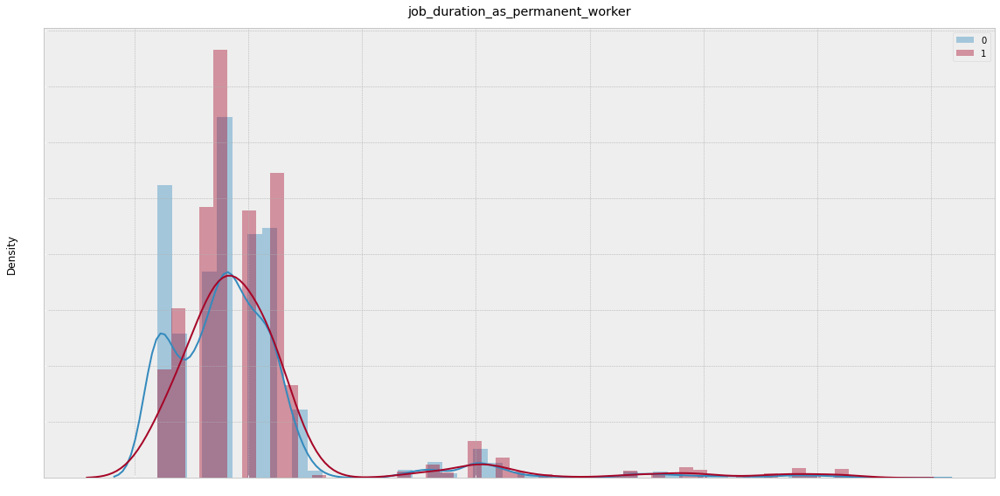

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


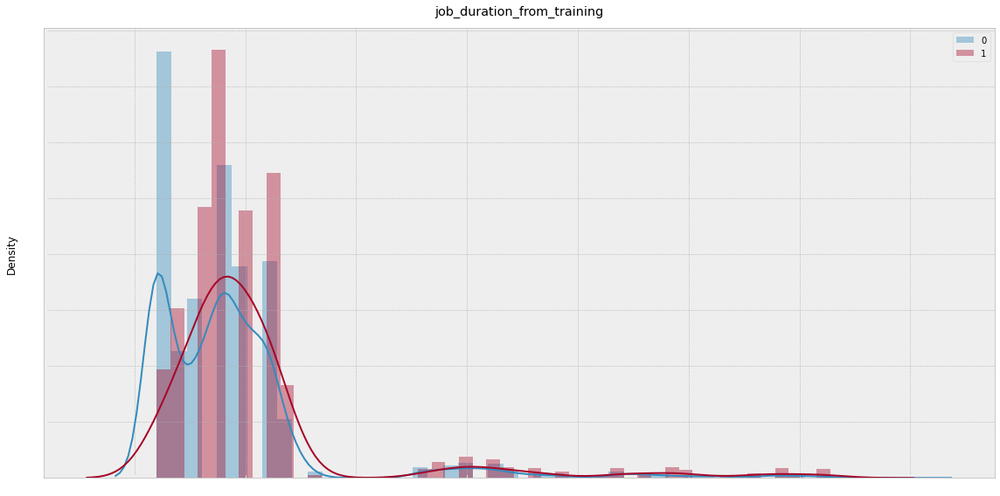

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


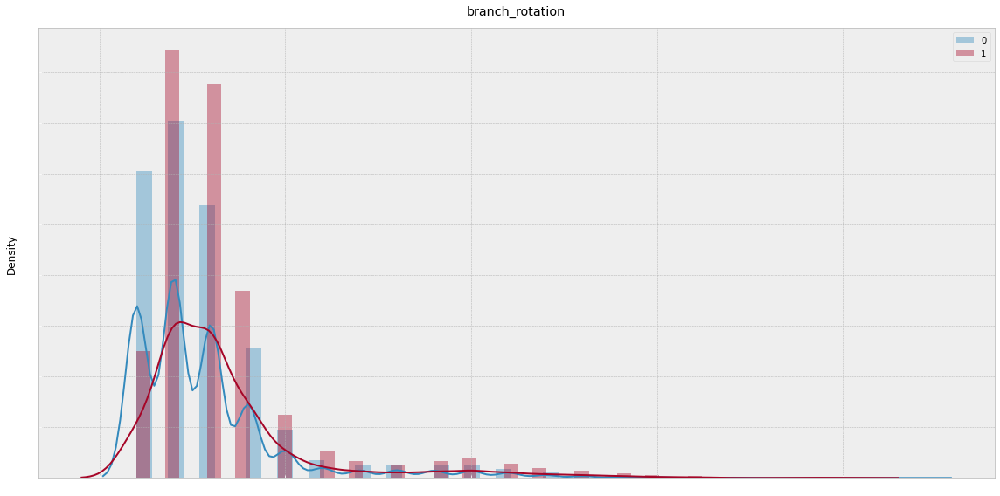

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


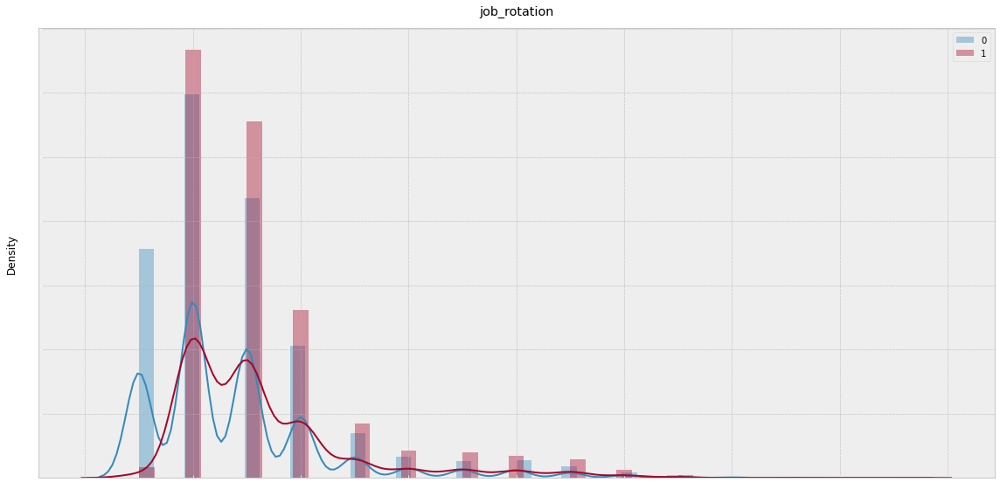

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


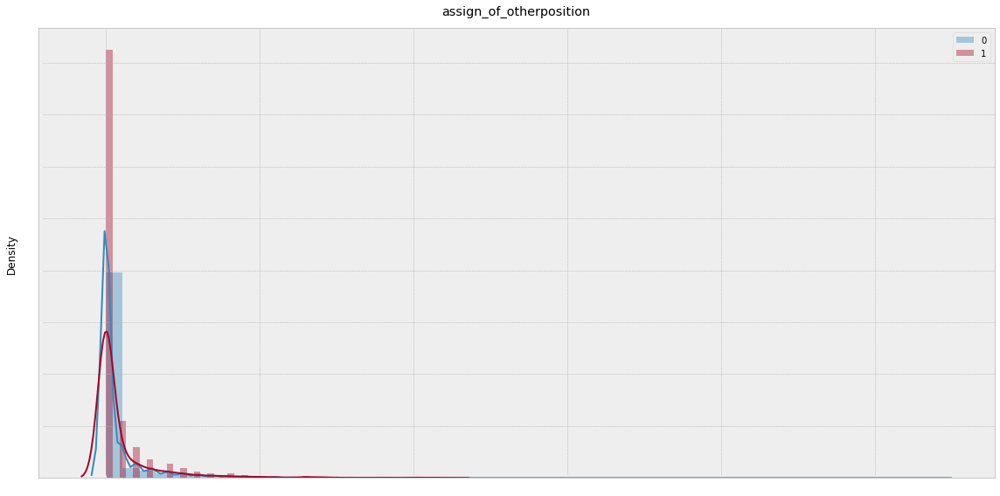

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


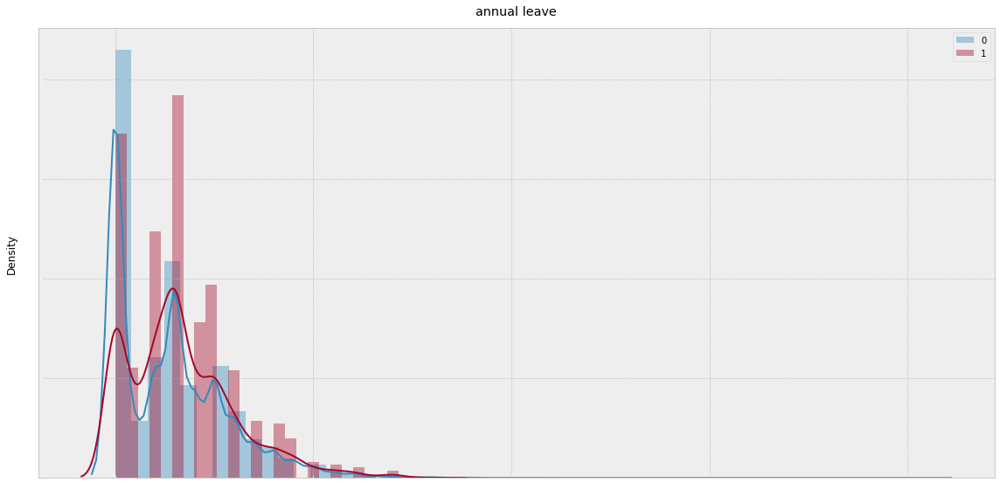

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


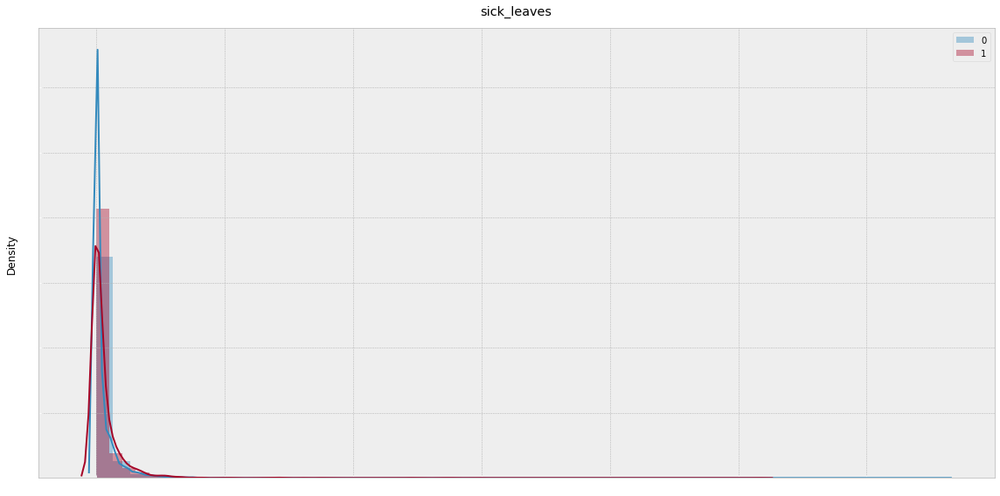

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


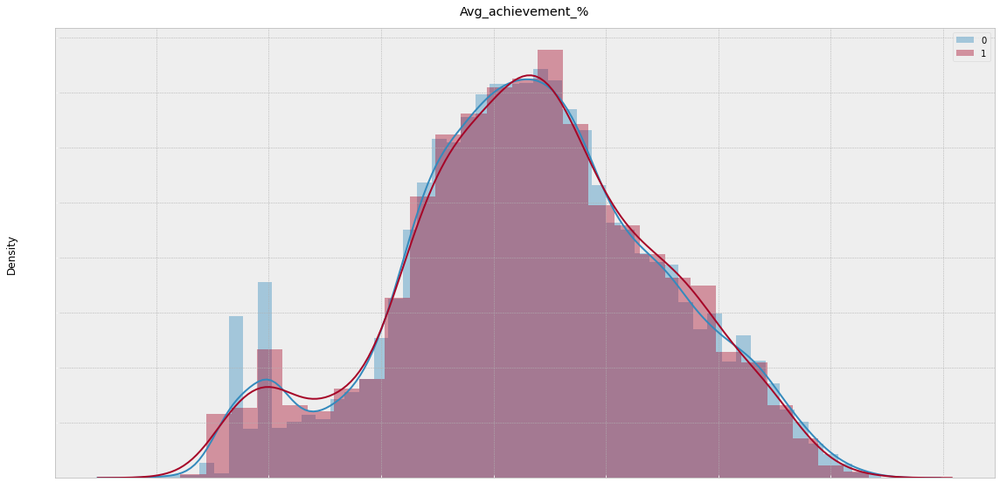

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


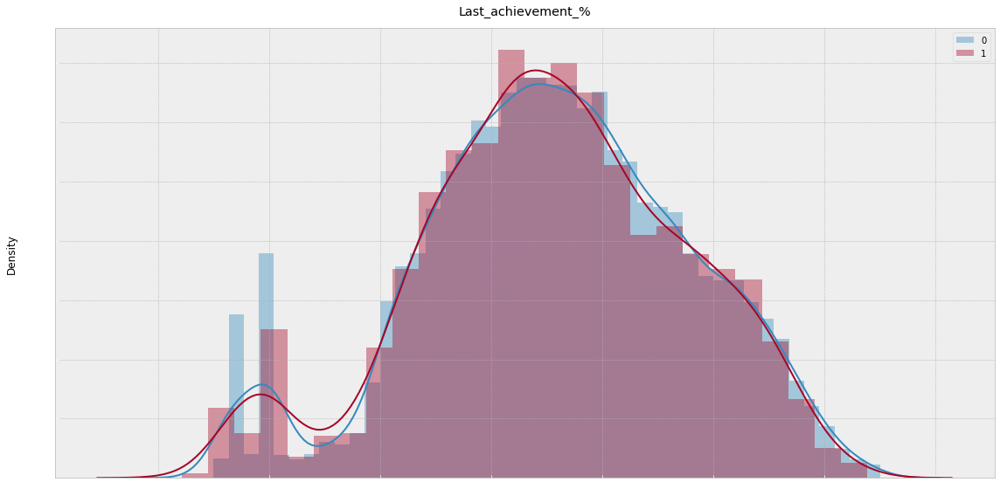

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


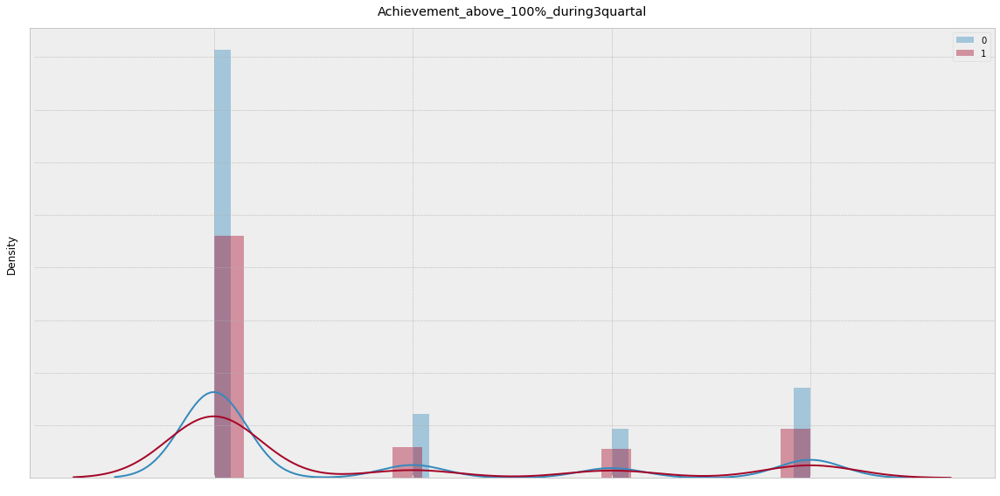

In [ ]:
num_cols = [c for c in train_df.columns if train_df[c].dtypes != 'object' and c != 'Best Performance']
plt.style.use('bmh')
for col in num_cols:

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(train_df[col][train_df['Best Performance'] == 0], label='0')
        sns.distplot(train_df[col][train_df['Best Performance'] == 1], label='1')

        plt.xlabel(None)
        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.title(col, pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

In [ ]:
test_df.describe()

,job_duration_in_current_job_level,job_duration_in_current_person_level,job_duration_in_current_branch,age,number_of_dependences,number_of_dependences (male),number_of_dependences (female),GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal
count,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.00000,6000.000000,6000.000000,5968.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
mean,2.297695,1.946135,1.243603,1985.727333,0.989167,0.49900,0.490167,3.016402,2032.716694,6.364833,6.425167,3.769167,3.525500,1.155167,3.742500,1.069500,66.803815,72.163333,0.680000
std,1.733171,1.027715,0.897269,4.791883,0.886292,0.66061,0.668065,11.952714,681.721964,5.167448,5.273332,2.414854,1.814543,2.515315,2.688506,2.606173,22.466927,23.021764,1.107612
min,0.000000,0.000000,0.000000,1963.000000,0.000000,0.00000,0.000000,0.000000,0.000000,2.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,7.803333,4.520000,0.000000
25%,1.500000,1.500000,0.500000,1984.000000,0.000000,0.00000,0.000000,2.800000,2008.000000,4.000000,4.000000,2.000000,2.000000,0.000000,2.000000,0.000000,52.085833,56.315000,0.000000
50%,1.830000,1.830000,1.250000,1987.000000,1.000000,0.00000,0.000000,3.070000,2010.000000,5.000000,5.000000,3.000000,3.000000,0.000000,3.000000,0.000000,65.981667,71.400000,0.000000
75%,2.000000,1.920000,1.500000,1989.000000,2.000000,1.00000,1.000000,3.260000,2012.000000,6.000000,6.000000,4.000000,4.000000,1.000000,5.000000,1.000000,81.530833,88.272500,1.000000
max,8.330000,8.000000,5.830000,1996.000000,5.000000,4.00000,4.000000,368.000000,9999.000000,36.000000,36.000000,17.000000,14.000000,29.000000,21.000000,77.000000,129.110000,130.000000,3.000000


In [ ]:
train_df.describe()

,job_duration_in_current_job_level,job_duration_in_current_person_level,job_duration_in_current_branch,age,number_of_dependences,number_of_dependences (male),number_of_dependences (female),GPA,year_graduated,job_duration_as_permanent_worker,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Avg_achievement_%,Last_achievement_%,Achievement_above_100%_during3quartal
count,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,18387.000000,18294.000000,19860.000000,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,21890.000000,15716.000000,15703.000000,15703.000000
mean,1.739521,1.560880,1.090923,1987.381453,0.749429,0.380905,0.368433,3.010518,1993.092927,4.889930,4.565418,2.899452,2.841206,0.823024,2.808817,0.902741,0.121836,66.344676,71.420847,0.682991
std,1.423064,0.954032,0.840839,4.277733,0.840700,0.607866,0.598305,11.733484,574.445014,4.503203,4.523969,2.194916,1.751187,2.255307,2.822533,2.855273,0.327104,23.253675,24.095520,1.107861
min,0.000000,0.000000,0.000000,1963.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.260000,0.000000
25%,1.170000,1.080000,0.500000,1986.000000,0.000000,0.000000,0.000000,2.820000,2009.000000,3.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,51.675000,55.935000,0.000000
50%,1.580000,1.580000,0.830000,1988.000000,1.000000,0.000000,0.000000,3.090000,2011.000000,4.000000,4.000000,2.000000,2.000000,0.000000,3.000000,0.000000,0.000000,66.310833,71.410000,0.000000
75%,1.920000,1.830000,1.500000,1990.000000,1.000000,1.000000,1.000000,3.300000,2013.000000,6.000000,5.000000,3.000000,3.000000,0.000000,5.000000,1.000000,0.000000,81.930833,88.350000,1.000000
max,8.750000,8.000000,7.500000,2017.000000,7.000000,4.000000,4.000000,381.000000,9999.000000,34.000000,35.000000,22.000000,15.000000,54.000000,41.000000,132.000000,1.000000,129.010000,130.000000,3.000000


In [ ]:
# for i in range(len(num_cols)):
#     for j in range(i+1, len(num_cols)):
#         sns.pairplot(train_df, kind='kde', hue='Best Performance', vars=[num_cols[i], num_cols[j]], corner=True, height=8)
#         plt.show()

##### Transform Numerical Data

In [ ]:
# plt.style.use('bmh')
# n = len(num_cols)
# for i in range(n):
#     for j in range(i+1, n):
#         try:
#             plt.figure(figsize=(16, 8))
#             td_0 = train_df[[num_cols[i], num_cols[j]]][train_df['Best Performance'] == 0]
#             td_1 = train_df[[num_cols[i], num_cols[j]]][train_df['Best Performance'] == 1]

#             sns.distplot(td_0[num_cols[i]] * td_0[num_cols[j]], label='0')
#             sns.distplot(td_1[num_cols[i]] * td_1[num_cols[j]], label='1')

#             plt.xlabel(None)
#             plt.tick_params(axis='x', colors='white')
#             plt.tick_params(axis='y', colors='white')
#             plt.title(f'{num_cols[i]} * {num_cols[j]}', pad=15)
#             plt.legend()
#             plt.tight_layout()
#             plt.show()

#         except:
#             continue

#### Categorical on Numerical Data Distribution Target

In [ ]:
# for c in cat_cols:
#     for n in num_cols:
#         sns.catplot(x=c, y=n, hue="Best Performance", data=train_df, height=10, kind='violin')
#         plt.show()

#### Categorize Numerical

Analysis

In [ ]:
# from sklearn.cluster import KMeans

# float_cols = [c for c in train_df.columns if train_df[c].dtypes == 'float64' or train_df[c].dtypes == 'int64']
# float_cols

In [ ]:
# for c in float_cols:
#     K = range(1, 10)
#     distortions = []
#     for k in K:
#         kmeans = KMeans(n_clusters=k)
#         kmeans.fit(s_train_df[c].dropna().values.reshape(-1, 1))
#         distortions.append(kmeans.inertia_)

#     plt.figure(figsize=(16, 8))
#     plt.title(c)
#     plt.plot(K, distortions, 'bx-')
#     plt.show()

Categorizing

In [ ]:
def categorize_numerical(df):
    # 'job_duration_in_current_job_level'
    df['job_duration_in_current_job_level'][df['job_duration_in_current_job_level'] < 1] = 0
    df['job_duration_in_current_job_level'][df['job_duration_in_current_job_level'].between(1, 2, inclusive=True)] = 1
    df['job_duration_in_current_job_level'][df['job_duration_in_current_job_level'] > 2] = 2

    # 'job_duration_in_current_person_level'
    df['job_duration_in_current_person_level'][df['job_duration_in_current_person_level'] < 1] = 0
    df['job_duration_in_current_person_level'][df['job_duration_in_current_person_level'].between(1, 2, inclusive=True)] = 1
    df['job_duration_in_current_person_level'][df['job_duration_in_current_person_level'] > 2] = 2

    # 'job_duration_in_current_branch'
    df['job_duration_in_current_branch'][df['job_duration_in_current_branch'] < 1] = 0
    df['job_duration_in_current_branch'][df['job_duration_in_current_branch'].between(1, 2, inclusive=True)] = 1
    df['job_duration_in_current_branch'][df['job_duration_in_current_branch'] > 2] = 2

    # 'age'
    df['age'][df['age'] < 1980] = 0
    df['age'][df['age'].between(1980, 1985)] = 1
    df['age'][df['age'].between(1985, 1990)] = 2
    df['age'][df['age'] >= 1990] = 3

    # 'GPA'
    df['GPA'][df['GPA'] < 2] = 0
    df['GPA'][df['GPA'].between(2, 3)] = 1
    df['GPA'][df['GPA'] >= 3] = 2

    # 'year_graduated'
    df['year_graduated'][df['year_graduated'] < 2000] = 0
    df['year_graduated'][df['year_graduated'].between(2000, 2005)] = 1
    df['year_graduated'][df['year_graduated'].between(2005, 2010)] = 2
    df['year_graduated'][df['year_graduated'].between(2010, 2015)] = 3
    df['year_graduated'][df['year_graduated'] >= 2015] = 4

    # 'job_duration_as_permanent_worker'
    df['job_duration_as_permanent_worker'][df['job_duration_as_permanent_worker'] < 2.5] = 0
    df['job_duration_as_permanent_worker'][df['job_duration_as_permanent_worker'].between(2.5, 5)] = 1
    df['job_duration_as_permanent_worker'][df['job_duration_as_permanent_worker'].between(5, 7.5)] = 2
    df['job_duration_as_permanent_worker'][df['job_duration_as_permanent_worker'] >= 7.5] = 3

    # 'job_duration_from_training'
    df['job_duration_from_training'][df['job_duration_from_training'] < 2.5] = 0
    df['job_duration_from_training'][df['job_duration_from_training'].between(2.5, 5)] = 1
    df['job_duration_from_training'][df['job_duration_from_training'].between(5, 7.5)] = 2
    df['job_duration_from_training'][df['job_duration_from_training'] >= 7.5] = 3

    # 'branch_rotation'
    df['branch_rotation'][df['branch_rotation'] <= 2] = 0
    df['branch_rotation'][df['branch_rotation'].between(3, 4, inclusive=True)] = 1
    df['branch_rotation'][df['branch_rotation'] > 4] = 2

    # 'job_rotation'
    df['job_rotation'][df['job_rotation'] <= 2] = 0
    df['job_rotation'][df['job_rotation'].between(3, 4, inclusive=True)] = 1
    df['job_rotation'][df['job_rotation'] > 4] = 2

    # 'assign_of_otherposition'
    df['assign_of_otherposition'][df['assign_of_otherposition'] < 1] = 0
    df['assign_of_otherposition'][df['assign_of_otherposition'] >= 1] = 1

    # 'annual leave'
    df['annual leave'][df['annual leave'] < 1] = 0
    df['annual leave'][df['annual leave'].between(1, 3)] = 1
    df['annual leave'][df['annual leave'].between(3, 5)] = 2
    df['annual leave'][df['annual leave'].between(5, 8)] = 3
    df['annual leave'][df['annual leave'] >= 8] = 4

    # 'sick_leaves'
    df['sick_leaves'][df['sick_leaves'] < 1] = 0
    df['sick_leaves'][df['sick_leaves'] >= 1] = 1

    # 'Avg_achievement_%'
    df['Avg_achievement_%'][df['Avg_achievement_%'] < 20] = 0
    df['Avg_achievement_%'][df['Avg_achievement_%'].between(20, 40)] = 1
    df['Avg_achievement_%'][df['Avg_achievement_%'].between(40, 60)] = 2
    df['Avg_achievement_%'][df['Avg_achievement_%'].between(60, 80)] = 3
    df['Avg_achievement_%'][df['Avg_achievement_%'].between(80, 100)] = 4
    df['Avg_achievement_%'][df['Avg_achievement_%'] >= 100] = 5

    # 'Last_achievement_%'
    df['Last_achievement_%'][df['Last_achievement_%'] < 20] = 0
    df['Last_achievement_%'][df['Last_achievement_%'].between(20, 40)] = 1
    df['Last_achievement_%'][df['Last_achievement_%'].between(40, 60)] = 2
    df['Last_achievement_%'][df['Last_achievement_%'].between(60, 80)] = 3
    df['Last_achievement_%'][df['Last_achievement_%'].between(80, 100)] = 4
    df['Last_achievement_%'][df['Last_achievement_%'] >= 100] = 5

    return df

In [ ]:
# mod_train_df = categorize_numerical(s_train_df)
# mod_test_df = categorize_numerical(test_df)

In [ ]:
# # num_cols = [c for c in train_df.columns if train_df[c].dtypes != 'object' and c != 'Best Performance']
# plt.style.use('bmh')
# for col in num_cols:

#     try:
#         plt.figure(figsize=(16, 8))
#         sns.distplot(mod_train_df[col][mod_train_df['Best Performance'] == 0], label='0')
#         sns.distplot(mod_train_df[col][mod_train_df['Best Performance'] == 1], label='1')

#         plt.xlabel(None)
#         plt.tick_params(axis='x', colors='white')
#         plt.tick_params(axis='y', colors='white')
#         plt.title(col, pad=15)
#         plt.legend()
#         plt.tight_layout()
#         plt.show()

#     except:
#         continue

In [ ]:
# mod_train_df.describe()

In [ ]:
# mod_train_df.corr()

In [ ]:
# train_df = mod_train_df.copy()
# test_df = mod_test_df.copy()

In [ ]:
# train_df = train_df[~train_df[[c for c in train_df.columns if c != 'Best Performance']].duplicated()]

In [ ]:
from sklearn.utils import resample
# Separate majority and minority classes
df_majority = s_train_df[s_train_df['Best Performance']==0]
df_minority = s_train_df[s_train_df['Best Performance']==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority,
                                 replace=False,    # sample without replacement
                                 n_samples=len(df_minority) * 3,     # to match minority class
                                 random_state=53
                                 ) # reproducible results

# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority]).reset_index(drop=True)

# Display new class counts
df_downsampled['Best Performance'].value_counts()

0    7998
1    2666
Name: Best Performance, dtype: int64

In [ ]:
train_df = df_downsampled.copy()

In [ ]:
train_df.isnull().sum()

job_level                                   0
job_duration_in_current_job_level           0
person_level                                0
job_duration_in_current_person_level        0
job_duration_in_current_branch              0
Employee_type                               7
Employee_status                             0
gender                                      0
age                                         0
marital_status_maried(Y/N)                  0
number_of_dependences                       0
number_of_dependences (male)                0
number_of_dependences (female)              0
Education_level                          2023
GPA                                      1974
year_graduated                           2032
job_duration_as_permanent_worker            0
job_duration_from_training                  0
branch_rotation                             0
job_rotation                                0
assign_of_otherposition                     0
annual leave                      

#### Feature Selection

In [ ]:
train_df.columns

Index(['job_level', 'job_duration_in_current_job_level', 'person_level',
       'job_duration_in_current_person_level',
       'job_duration_in_current_branch', 'Employee_type', 'Employee_status',
       'gender', 'age', 'marital_status_maried(Y/N)', 'number_of_dependences',
       'number_of_dependences (male)', 'number_of_dependences (female)',
       'Education_level', 'GPA', 'year_graduated',
       'job_duration_as_permanent_worker', 'job_duration_from_training',
       'branch_rotation', 'job_rotation', 'assign_of_otherposition',
       'annual leave', 'sick_leaves', 'Best Performance', 'Avg_achievement_%',
       'Last_achievement_%', 'Achievement_above_100%_during3quartal',
       'achievement_target_1', 'achievement_target_2', 'achievement_target_3'],
      dtype='object')

In [ ]:
cols_to_drop = [
#                 'job_level',
                'job_duration_in_current_job_level',
#                 'person_level',
#                 'job_duration_in_current_person_level',
#                 'job_duration_in_current_branch',
#                 'Employee_type',
                'Employee_status',
                # 'gender',
                # 'age',
#                 'marital_status_maried(Y/N)',
#                 'number_of_dependences',
                # 'number_of_dependences (male)',
                # 'number_of_dependences (female)',
#                 'Education_level',
                # 'GPA',
#                 'year_graduated',
                'job_duration_as_permanent_worker',
                # 'job_duration_from_training',
                'branch_rotation',
#                 'job_rotation',
                # 'assign_of_otherposition',
#                 'annual leave',
                # 'sick_leaves',
#                 'Best Performance',
                'Avg_achievement_%',
#                 'Last_achievement_%',
                'Achievement_above_100%_during3quartal',
                # 'achievement_target_1',
                # 'achievement_target_2',
                # 'achievement_target_3'
                ]

train_df = train_df.drop(cols_to_drop, axis=1)
test_df = test_df.drop(cols_to_drop, axis=1)

In [ ]:
train_df[[c for c in train_df.columns if c != 'Best Performance']].duplicated().sum()

0

### Missing Values Check

In [ ]:
miss_col = train_df.columns[train_df.isna().any()]

miss_df = train_df[miss_col].isna().sum().rename('missing rows').to_frame()
miss_df['percentage'] = round(miss_df['missing rows'] / train_df.shape[0] * 100, 3)
miss_df['percentage'] = miss_df['percentage'].astype('str')

miss_df.sort_values('missing rows', ascending=False).style.background_gradient('Blues')

,missing rows,percentage
achievement_target_1,2281,21.39
achievement_target_2,2281,21.39
achievement_target_3,2281,21.39
Last_achievement_%,2063,19.345
year_graduated,2032,19.055
Education_level,2023,18.97
GPA,1974,18.511
Employee_type,7,0.066


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 23 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   job_level                             6000 non-null   object 
 1   person_level                          6000 non-null   object 
 2   job_duration_in_current_person_level  6000 non-null   float64
 3   job_duration_in_current_branch        6000 non-null   float64
 4   Employee_type                         6000 non-null   object 
 5   gender                                6000 non-null   object 
 6   age                                   6000 non-null   int64  
 7   marital_status_maried(Y/N)            6000 non-null   object 
 8   number_of_dependences                 6000 non-null   int64  
 9   number_of_dependences (male)          6000 non-null   int64  
 10  number_of_dependences (female)        6000 non-null   int64  
 11  Education_level  

In [ ]:
for col in test_df.columns:
    print(test_df[col].value_counts())
    print('-'*100)

JG04    5592
JG05     392
JG03      16
Name: job_level, dtype: int64
----------------------------------------------------------------------------------------------------
PG03    5154
PG04     437
PG06     226
PG05     151
PG07      16
PG01      12
PG02       4
Name: person_level, dtype: int64
----------------------------------------------------------------------------------------------------
1.83    803
1.92    754
1.50    512
1.75    449
1.58    417
       ... 
3.83      1
7.33      1
7.17      1
7.00      1
4.67      1
Name: job_duration_in_current_person_level, Length: 63, dtype: int64
----------------------------------------------------------------------------------------------------
0.50    1947
1.50    1268
2.50     507
0.42     221
2.42     214
        ... 
4.17       1
5.50       1
4.83       1
5.83       1
4.92       1
Name: job_duration_in_current_branch, Length: 62, dtype: int64
-------------------------------------------------------------------------------------------------

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10664 entries, 0 to 10663
Data columns (total 24 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   job_level                             10664 non-null  object 
 1   person_level                          10664 non-null  object 
 2   job_duration_in_current_person_level  10664 non-null  float64
 3   job_duration_in_current_branch        10664 non-null  float64
 4   Employee_type                         10657 non-null  object 
 5   gender                                10664 non-null  object 
 6   age                                   10664 non-null  int64  
 7   marital_status_maried(Y/N)            10664 non-null  object 
 8   number_of_dependences                 10664 non-null  int64  
 9   number_of_dependences (male)          10664 non-null  int64  
 10  number_of_dependences (female)        10664 non-null  int64  
 11  Education_level

* Missing values exist

#### Look value counts in all columns

In [ ]:
for col in train_df.columns:
    print(train_df[col].value_counts(dropna=False).sort_values())
    print('-'*100)

JG03       54
JG05      448
JG04    10162
Name: job_level, dtype: int64
----------------------------------------------------------------------------------------------------
PG07      13
PG02      25
PG01      26
PG05     182
PG06     260
PG04     458
PG03    9700
Name: person_level, dtype: int64
----------------------------------------------------------------------------------------------------
3.92       1
6.83       1
3.83       1
6.42       1
4.17       1
        ... 
1.17     612
1.75     765
1.50     842
1.92    1092
1.83    1157
Name: job_duration_in_current_person_level, Length: 72, dtype: int64
----------------------------------------------------------------------------------------------------
6.25       1
4.08       1
5.92       1
4.92       1
5.33       1
        ... 
1.25     356
0.42     451
2.50     619
1.50    1956
0.50    3090
Name: job_duration_in_current_branch, Length: 67, dtype: int64
-----------------------------------------------------------------------------------

* Duplicated values
* Imbalance class

In [ ]:
train_df.describe()

,job_duration_in_current_person_level,job_duration_in_current_branch,age,number_of_dependences,number_of_dependences (male),number_of_dependences (female),GPA,year_graduated,job_duration_from_training,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Last_achievement_%
count,10664.000000,10664.000000,10664.00000,10664.000000,10664.000000,10664.000000,8690.000000,8632.000000,10664.000000,10664.000000,10664.000000,10664.000000,10664.000000,10664.000000,8601.000000
mean,1.693071,1.153084,1986.93689,0.838991,0.426763,0.412228,3.014962,2004.545876,5.026913,3.061797,0.919824,3.131095,1.007502,0.250000,71.389879
std,0.957560,0.849633,4.33222,0.848815,0.625867,0.620226,12.370771,627.657862,4.659898,1.721222,2.431244,2.820504,2.877332,0.433033,24.058170
min,0.000000,0.000000,1963.00000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,4.260000
25%,1.250000,0.500000,1986.00000,0.000000,0.000000,0.000000,2.780000,2008.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,55.900000
50%,1.670000,1.000000,1988.00000,1.000000,0.000000,0.000000,3.080000,2011.000000,4.000000,3.000000,0.000000,3.000000,0.000000,0.000000,71.300000
75%,1.920000,1.500000,1990.00000,1.000000,1.000000,1.000000,3.280000,2013.000000,6.000000,4.000000,1.000000,5.000000,1.000000,0.250000,88.450000
max,8.000000,6.250000,2017.00000,7.000000,4.000000,4.000000,362.000000,9999.000000,34.000000,15.000000,54.000000,41.000000,103.000000,1.000000,130.000000


In [ ]:
def value_dist_by_column_by_target(df, col):
    if col in null_cols:
        print(df['Best Performance'][df[col].isnull()].value_counts())
    for v in df[col].unique():
        print(df[[col, 'Best Performance']][df[col] == v].value_counts())

#### Look into missing values only

In [ ]:
train_df[train_df.isna().any(axis=1)]

,job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_from_training,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Best Performance,Last_achievement_%,achievement_target_1,achievement_target_2,achievement_target_3
6,JG04,PG03,1.92,2.50,RM_type_A,Male,1989,Y,0,0,0,NaN,NaN,NaN,5,3,1,4,2,0,72.41,Pencapaian 50_100,Pencapaian 50_100,not_reached
7,JG04,PG03,1.25,0.50,RM_type_A,Male,1992,Y,0,0,0,level_4,0.00,2013.0,2,3,0,2,0,0,NaN,NaN,NaN,NaN
8,JG04,PG03,1.25,2.42,RM_type_A,Female,1987,Y,1,0,1,NaN,NaN,NaN,5,4,0,6,0,0,47.21,Pencapaian less than 50,Pencapaian less than 50,reached
10,JG04,PG03,1.75,2.50,RM_type_A,Male,1991,Y,0,0,0,NaN,NaN,NaN,4,3,3,6,0,0,79.25,Pencapaian 50_100,Pencapaian 50_100,not_reached
12,JG04,PG03,1.33,1.67,RM_type_B,Male,1993,N,0,0,0,level_3,3.03,2014.0,2,2,0,0,0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10655,JG04,PG03,1.08,1.33,RM_type_B,Male,1987,Y,1,1,0,level_4,3.25,2009.0,1,2,0,1,1,1,NaN,NaN,NaN,NaN
10656,JG04,PG03,1.92,0.83,RM_type_A,Female,1985,Y,2,0,2,NaN,NaN,NaN,4,4,0,7,2,1,84.52,Pencapaian 50_100,Pencapaian 50_100,reached
10658,JG04,PG03,1.50,2.08,RM_type_A,Male,1985,N,0,0,0,NaN,NaN,NaN,4,2,0,3,1,1,76.88,Pencapaian 100_150,Pencapaian less than 50,reached
10659,JG04,PG03,1.42,0.50,RM_type_B,Male,1988,Y,1,0,1,NaN,NaN,NaN,3,3,0,4,0,1,74.76,Pencapaian 50_100,Pencapaian less than 50,not_reached


* Seems missing values have patterns

#### Look into missing values patterns and removing duplicates

In [ ]:
target = 'Best Performance'

Achievement analysis

In [ ]:
# value_dist_by_column_by_target(train_df, 'Achievement_above_100%_during3quartal')

In [ ]:
# ach_cols = [c for c in null_cols if 'chievement' in c] + [target]
# ach_nt_cols = [c for c in null_cols if 'chievement' and 'Avg' in c and 'target' not in c]
# ach_t_cols = [c for c in null_cols if 'chievement' and 'target' in c] + [target]
# ach_nulls_df = train_df[train_df[ach_nt_cols].isnull().any(axis=1)][ach_cols]
# for col in ach_cols:
#     print(ach_nulls_df[col].value_counts(dropna=False))
#     print('-'*100)

In [ ]:
# ach_nulls_df = train_df[train_df[ach_t_cols].isnull().any(axis=1)][ach_t_cols]
# for col in ach_t_cols:
#     print(ach_nulls_df[col].value_counts(dropna=False))
#     print('-'*100)

Employee status analysis

In [ ]:
# print(len(train_df[train_df['job_duration_as_permanent_worker'].isnull()]))
# print(len(train_df[(train_df['Employee_status'] == 'Contract') & (train_df['job_duration_as_permanent_worker'].isnull())]))

if employee status == contract, no job duration as permanent worker -> make sense

convert NaN to 0

Employee type analysis

In [ ]:
# train_df[train_df['Employee_type'].isnull()]

maybe can get rid these data -> very small portions

Education level, GPA, year graduated analysis

divide by 100 for GPA > 100

In [ ]:
# train_df['GPA'][train_df['GPA'] > 100] /= 100
# test_df['GPA'][test_df['GPA'] > 100] /= 100

check year_graduated and GPA outlier distribution

In [ ]:
# yg_q1 = train_df['year_graduated'].quantile(0.25)
# yg_q3 = train_df['year_graduated'].quantile(0.75)
# yg_iqr = yg_q3 - yg_q1

# min_yg = yg_q1 - 1.5 * yg_iqr
# max_yg = yg_q3 + 1.5 * yg_iqr

# print(f'train')
# print(f'year_graduated Q1: {yg_q1}')
# print(f'year_graduated Q3: {yg_q3}')
# print(f'year_graduated IQR: {yg_iqr}')
# print(f'year_graduated min: {min_yg}')
# print(f'year_graduated max: {max_yg}')

# print(f"num inlier data: {len(train_df[train_df['year_graduated'].between(min_yg, max_yg, inclusive=True)])}")
# print(f"frac inlier data: {len(train_df[train_df['year_graduated'].between(min_yg, max_yg, inclusive=True)]) / len(train_df)}")

# print(train_df['year_graduated'].describe())

In [ ]:
# yg_q1 = test_df['year_graduated'].quantile(0.25)
# yg_q3 = test_df['year_graduated'].quantile(0.75)
# yg_iqr = yg_q3 - yg_q1

# min_yg = yg_q1 - 1.5 * yg_iqr
# max_yg = yg_q3 + 1.5 * yg_iqr

# print(f'test')
# print(f'year_graduated Q1: {yg_q1}')
# print(f'year_graduated Q3: {yg_q3}')
# print(f'year_graduated IQR: {yg_iqr}')
# print(f'year_graduated min: {min_yg}')
# print(f'year_graduated max: {max_yg}')

# print(f"num inlier data: {len(test_df[test_df['year_graduated'].between(min_yg, max_yg, inclusive=True)])}")
# print(f"frac inlier data: {len(test_df[test_df['year_graduated'].between(min_yg, max_yg, inclusive=True)]) / len(test_df)}")

# print(test_df['year_graduated'].describe())

In [ ]:
# gpa_q1 = train_df['GPA'].quantile(0.25)
# gpa_q3 = train_df['GPA'].quantile(0.75)
# gpa_iqr = gpa_q3 - gpa_q1

# min_gpa = gpa_q1 - 1.5 * gpa_iqr
# max_gpa = gpa_q3 + 1.5 * gpa_iqr

# print('train')
# print(f'GPA Q1: {gpa_q1}')
# print(f'GPA Q3: {gpa_q3}')
# print(f'GPA IQR: {gpa_iqr}')
# print(f'GPA min: {min_gpa}')
# print(f'GPA max: {max_gpa}')

# print(f"num inlier data: {len(train_df[train_df['GPA'].between(min_gpa, max_gpa, inclusive=True)])}")
# print(f"frac inlier data: {len(train_df[train_df['GPA'].between(min_gpa, max_gpa, inclusive=True)]) / len(train_df)}")

# print(train_df['GPA'].describe())

In [ ]:
# gpa_q1 = test_df['GPA'].quantile(0.25)
# gpa_q3 = test_df['GPA'].quantile(0.75)
# gpa_iqr = gpa_q3 - gpa_q1

# min_gpa = gpa_q1 - 1.5 * gpa_iqr
# max_gpa = gpa_q3 + 1.5 * gpa_iqr

# print('test')
# print(f'GPA Q1: {gpa_q1}')
# print(f'GPA Q3: {gpa_q3}')
# print(f'GPA IQR: {gpa_iqr}')
# print(f'GPA min: {min_gpa}')
# print(f'GPA max: {max_gpa}')

# print(f"num inlier data: {len(test_df[test_df['GPA'].between(min_gpa, max_gpa, inclusive=True)])}")
# print(f"frac inlier data: {len(test_df[test_df['GPA'].between(min_gpa, max_gpa, inclusive=True)]) / len(test_df)}")

# print(test_df['GPA'].describe())

In [ ]:
# gs_q1 = train_df['grad_speed'].quantile(0.25)
# gs_q3 = train_df['grad_speed'].quantile(0.75)
# gs_iqr = gs_q3 - gs_q1

# min_gs = gs_q1 - 1.5 * gs_iqr
# max_gs = gs_q3 + 1.5 * gs_iqr

# print(f'train')
# print(f'gs Q1: {gs_q1}')
# print(f'gs Q3: {gs_q3}')
# print(f'gs IQR: {gs_iqr}')
# print(f'gs min: {min_gs}')
# print(f'gs max: {max_gs}')

# print(f"num inlier data: {len(train_df[train_df['grad_speed'].between(min_gs, max_gs, inclusive=True)])}")
# print(f"frac inlier data: {len(train_df[train_df['grad_speed'].between(min_gs, max_gs, inclusive=True)]) / len(train_df)}")

# print(train_df['grad_speed'].describe())

In [ ]:
# s_q1 = test_df['grad_speed'].quantile(0.25)
# gs_q3 = test_df['grad_speed'].quantile(0.75)
# gs_iqr = gs_q3 - gs_q1

# min_gs = gs_q1 - 1.5 * gs_iqr
# max_gs = gs_q3 + 1.5 * gs_iqr

# print(f'test')
# print(f'gs Q1: {gs_q1}')
# print(f'gs Q3: {gs_q3}')
# print(f'gs IQR: {gs_iqr}')
# print(f'gs min: {min_gs}')
# print(f'gs max: {max_gs}')

# print(f"num inlier data: {len(test_df[test_df['grad_speed'].between(min_gs, max_gs, inclusive=True)])}")
# print(f"frac inlier data: {len(test_df[test_df['grad_speed'].between(min_gs, max_gs, inclusive=True)]) / len(test_df)}")

# print(test_df['grad_speed'].describe())

check value counts GPA and year graduated on each education level

In [ ]:
# unedl = train_df['Education_level'].unique()

# for v in unedl:
#     print(v)
#     print(train_df['GPA'][train_df['Education_level'] == v].value_counts().sort_values())
#     print('-'*100)

In [ ]:
# for v in unedl:
#     print(v)
#     print(train_df['year_graduated'][train_df['Education_level'] == v].value_counts())
#     print('-'*100)

Check distributionn value of normal GPA

In [ ]:
# print('train')
# print(len(train_df[train_df['GPA'].between(0, 4, inclusive=True)]))
# print(len(train_df[~train_df['GPA'].between(0, 4, inclusive=True)]))

# print('test')
# print(len(test_df[test_df['GPA'].between(0, 4, inclusive=True)]))
# print(len(test_df[~test_df['GPA'].between(0, 4, inclusive=True)]))

In [ ]:
# print(train_df['Best Performance'][train_df['GPA'].between(2, 4, inclusive=True)].value_counts())
# print(train_df['Best Performance'][~train_df['GPA'].between(2, 4, inclusive=True)].value_counts())

Check distributionn value of normal year graduated

In [ ]:
# normal_year = range(1960, 2021)

In [ ]:
# print('train')
# print(len(train_df[train_df['year_graduated'].between(1960, 2020, inclusive=True)]))
# print(len(train_df[~train_df['year_graduated'].between(1960, 2020, inclusive=True)]))

# print('test')
# print(len(test_df[test_df['year_graduated'].between(1960, 2020, inclusive=True)]))
# print(len(test_df[~test_df['year_graduated'].between(1960, 2020, inclusive=True)]))

In [ ]:
# print(train_df['Best Performance'][train_df['year_graduated'].isin(normal_year)].value_counts())
# print('-'*100)
# print(train_df['Best Performance'][~train_df['year_graduated'].isin(normal_year)].value_counts())

In [ ]:
# print(train_df['GPA'][train_df['year_graduated'].between(1960, 2020, inclusive=True)].value_counts())
# print('-'*100)
# print(train_df['GPA'][~train_df['year_graduated'].between(1960, 2020, inclusive=True)].value_counts())

Check nan values in education level, gpa, and year graduated

In [ ]:
# edl = ['Education_level', 'GPA', 'year_graduated']

# train_df[edl][train_df['Education_level'].isnull()]

In [ ]:
# train_df['grad_speed'] = train_df['year_graduated'] - train_df['age']
# test_df['grad_speed'] = test_df['year_graduated'] - test_df['age']

### Preprocess Data

#### Handling Missing Values

##### Auto Imputer

In [ ]:
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [ ]:
feat_cols = [c for c in train_df.columns if c != 'Best Performance']
sorted_train_df = train_df[[target] + feat_cols]

###### Categorical

In [ ]:
cat_null_cols = [c for c in train_df.columns if c in cat_cols and c in null_cols]
cat_null_cols

['Employee_type',
 'Education_level',
 'achievement_target_1',
 'achievement_target_2',
 'achievement_target_3']

In [ ]:
for col in cat_null_cols:
    print(sorted_train_df[col].value_counts(dropna=False))

RM_type_A    5885
RM_type_B    4374
RM_type_C     398
NaN             7
Name: Employee_type, dtype: int64
level_4    7142
NaN        2023
level_3    1342
level_1     107
level_5      38
level_0       8
level_2       4
Name: Education_level, dtype: int64
Pencapaian 50_100           5098
NaN                         2281
Pencapaian 100_150          1617
Pencapaian less than 50     1232
Pencapaian more than 150     337
Tidak diberikan target        99
Name: achievement_target_1, dtype: int64
Pencapaian less than 50     5571
NaN                         2281
Pencapaian 50_100           1555
Pencapaian 100_150           579
Pencapaian more than 150     577
Tidak diberikan target       101
Name: achievement_target_2, dtype: int64
reached        6026
not_reached    2357
NaN            2281
Name: achievement_target_3, dtype: int64


In [ ]:
for c in cat_null_cols:
    sorted_train_df[c] = sorted_train_df[c].fillna('0')

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
all_feat_cols = sorted_train_df.columns

In [ ]:
enc = LabelEncoder()
for col in cat_cols:
    if col in all_feat_cols and col not in cols_to_drop:
        sorted_train_df[col] = enc.fit_transform(sorted_train_df[col])
        test_df[col] = enc.transform(test_df[col])

In [ ]:
for col in cat_null_cols:
    print(sorted_train_df[col].value_counts(dropna=False))

1    5885
2    4374
3     398
0       7
Name: Employee_type, dtype: int64
5    7142
0    2023
4    1342
2     107
6      38
1       8
3       4
Name: Education_level, dtype: int64
2    5098
0    2281
1    1617
3    1232
4     337
5      99
Name: achievement_target_1, dtype: int64
3    5571
0    2281
2    1555
1     579
4     577
5     101
Name: achievement_target_2, dtype: int64
2    6026
1    2357
0    2281
Name: achievement_target_3, dtype: int64


In [ ]:
# cat_imp = KNNImputer(missing_values=0)
# cat_imp.fit(sorted_train_df[cat_null_cols])
# sorted_train_df[cat_null_cols] = cat_imp.transform(np.round(sorted_train_df[cat_null_cols]))
# test_df[cat_null_cols] = cat_imp.transform(np.round(test_df[cat_null_cols]))

In [ ]:
# for col in cat_null_cols:
#     print(sorted_train_df[col].value_counts(dropna=False))

In [ ]:
sorted_train_df[cat_null_cols] = sorted_train_df[cat_null_cols].replace(0, np.nan)

###### Numerical

In [ ]:
# visualize GPA and year_graduated
# sns.boxplot(y=sorted_train_df['GPA'])

In [ ]:
# sns.boxplot(y=sorted_train_df['year_graduated'])

In [ ]:
# num_cols

In [ ]:
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler

In [ ]:
for c in [c for c in sorted_train_df.columns if c != 'Best Performance']:
    print('-'*100)
    print(c)
    print(sorted_train_df[c].value_counts())

----------------------------------------------------------------------------------------------------
job_level
1    10162
2      448
0       54
Name: job_level, dtype: int64
----------------------------------------------------------------------------------------------------
person_level
2    9700
3     458
5     260
4     182
0      26
1      25
6      13
Name: person_level, dtype: int64
----------------------------------------------------------------------------------------------------
job_duration_in_current_person_level
1.83    1157
1.92    1092
1.50     842
1.75     765
1.17     612
        ... 
7.50       1
6.33       1
3.42       1
5.92       1
3.92       1
Name: job_duration_in_current_person_level, Length: 72, dtype: int64
----------------------------------------------------------------------------------------------------
job_duration_in_current_branch
0.50    3090
1.50    1956
2.50     619
0.42     451
1.25     356
        ... 
5.25       1
5.83       1
4.58       1
5.33      

In [ ]:
all_feat_cols = [c for c in sorted_train_df.columns if c != 'Best Performance']
feat = sorted_train_df[all_feat_cols].values
feat_pred = test_df.values
y = sorted_train_df['Best Performance'].values

normalizer = MinMaxScaler()

X = np.full(feat.shape, np.nan)
X_pred = np.full(feat_pred.shape, np.nan)

for i in range(feat.shape[1]):
    # min max scaler
    min_v = np.nanmin(feat[:, i])
    max_v = np.nanmax(feat[:, i])

    X[:, i] = (feat[:, i] - min_v) / (max_v - min_v)
    X_pred[:, i] = (feat_pred[:, i] - min_v) / (max_v - min_v)

    # X[valid_mask[:, i]] = normalizer.fit_transform(feat[valid_mask[:, i]].reshape(-1, 1)).reshape(feat[valid_mask[:, i]].shape)
    # X_pred[valid_mask_pred[:, i]] = normalizer.transform(feat_pred[valid_mask_pred[:, i]].reshape(-1, 1)).reshape(feat_pred[valid_mask_pred[:, i]].shape)


    # normalizer = Normalizer(norm='l2')
    # feat_sub = feat[:, i]
    # feat_sub_pred = feat_pred[:, i]

    # nan_mask = np.isnan(feat_sub)
    # valid_mask = ~nan_mask

    # nan_mask_pred = np.isnan(feat_sub_pred)
    # valid_mask_pred = ~nan_mask_pred

    # X_sub = np.full(feat_sub.shape, np.nan)
    # X_sub_pred = np.full(feat_sub_pred.shape, np.nan)

    # X_sub[valid_mask] = normalizer.fit_transform(feat_sub[valid_mask].reshape(-1, 1)).reshape(feat_sub[valid_mask].shape)
    # X_sub_pred[valid_mask_pred] = normalizer.transform(feat_sub_pred[valid_mask_pred].reshape(-1, 1)).reshape(feat_sub_pred[valid_mask].shape)

In [ ]:
print(f'nan exist in X: {np.isnan(X).any(1).sum()}')
print(f'nan exist in X_pred: {np.isnan(X_pred).any(1).sum()}')

nan exist in X: 4334
nan exist in X_pred: 32


In [ ]:
X.shape

(10664, 23)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
# imp = KNNImputer()
# imp = IterativeImputer()
imp = IterativeImputer(estimator=KNeighborsRegressor(n_jobs=-1))
imp.fit(X)

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


IterativeImputer(add_indicator=False,
                 estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                               metric='minkowski',
                                               metric_params=None, n_jobs=-1,
                                               n_neighbors=5, p=2,
                                               weights='uniform'),
                 imputation_order='ascending', initial_strategy='mean',
                 max_iter=10, max_value=None, min_value=None,
                 missing_values=nan, n_nearest_features=None, random_state=None,
                 sample_posterior=False, skip_complete=False, tol=0.001,
                 verbose=0)

In [ ]:
X = imp.transform(X)
X_pred = imp.transform(X_pred)

In [ ]:
print(f'nan exist in X: {np.isnan(X).any(1).sum()}')
print(f'nan exist in X_pred: {np.isnan(X_pred).any(1).sum()}')

nan exist in X: 0
nan exist in X_pred: 0


In [ ]:
X.shape

(10664, 23)

In [ ]:
all_feat_cols

['job_level',
 'person_level',
 'job_duration_in_current_person_level',
 'job_duration_in_current_branch',
 'Employee_type',
 'gender',
 'age',
 'marital_status_maried(Y/N)',
 'number_of_dependences',
 'number_of_dependences (male)',
 'number_of_dependences (female)',
 'Education_level',
 'GPA',
 'year_graduated',
 'job_duration_from_training',
 'job_rotation',
 'assign_of_otherposition',
 'annual leave',
 'sick_leaves',
 'Last_achievement_%',
 'achievement_target_1',
 'achievement_target_2',
 'achievement_target_3']

In [ ]:
len(all_feat_cols)

23

In [ ]:
imp_train_df = pd.DataFrame({
    'Best Performance': y
})

imp_test_df = pd.DataFrame()

for i in range(len(all_feat_cols)):
    imp_train_df[all_feat_cols[i]] = X[:, i]
    imp_test_df[all_feat_cols[i]] = X_pred[:, i]

imp_train_df.head()

,Best Performance,job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_from_training,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,achievement_target_1,achievement_target_2,achievement_target_3
0,0,0.5,0.333333,0.27125,0.3728,0.5,1.0,0.388889,1.0,0.000000,0.00,0.0,0.8,0.008619,0.20082,0.181818,0.071429,0.000000,0.121951,0.009709,0.300938,0.50,0.50,1.0
1,0,0.5,0.333333,0.24000,0.4000,0.5,1.0,0.462963,0.0,0.000000,0.00,0.0,0.8,0.000000,0.20132,0.060606,0.071429,0.000000,0.024390,0.000000,0.319230,0.00,0.50,0.0
2,0,0.5,0.333333,0.16625,0.2400,0.5,0.0,0.444444,0.0,0.000000,0.00,0.0,0.8,0.008591,0.20102,0.151515,0.214286,0.000000,0.121951,0.038835,0.544377,0.50,0.50,1.0
3,0,0.5,0.333333,0.24000,0.0800,0.0,1.0,0.462963,0.0,0.000000,0.00,0.0,0.8,0.008425,0.20122,0.060606,0.142857,0.037037,0.097561,0.048544,0.795292,0.25,0.75,1.0
4,0,0.5,0.333333,0.22875,0.1728,0.0,1.0,0.444444,1.0,0.142857,0.25,0.0,0.8,0.008674,0.20112,0.060606,0.142857,0.000000,0.146341,0.000000,0.071020,0.50,0.50,1.0


In [ ]:
imp_test_df.head()

,job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,number_of_dependences (male),number_of_dependences (female),Education_level,GPA,year_graduated,job_duration_from_training,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,achievement_target_1,achievement_target_2,achievement_target_3
0,1.0,0.666667,0.17750,0.08,1.0,0.0,0.370370,1.0,0.285714,0.25,0.25,0.6,0.010359,0.20042,0.393939,0.571429,0.018519,0.073171,0.009709,0.715047,0.25,0.50,1.0
1,0.5,0.333333,0.19750,0.32,0.0,1.0,0.462963,0.0,0.000000,0.00,0.00,0.8,0.008481,0.20112,0.090909,0.071429,0.037037,0.097561,0.009709,0.307857,0.50,0.50,1.0
2,0.5,0.333333,0.22875,0.24,0.0,1.0,0.462963,1.0,0.142857,0.00,0.25,0.8,0.008923,0.20112,0.090909,0.071429,0.000000,0.048780,0.000000,0.318276,0.25,0.50,1.0
3,1.0,0.833333,0.62500,0.24,0.0,1.0,0.185185,1.0,0.428571,0.50,0.25,0.8,0.000000,0.19988,0.636364,0.285714,0.203704,0.073171,0.000000,0.609750,0.25,0.50,0.0
4,0.5,0.333333,0.24000,0.08,0.0,0.0,0.407407,1.0,0.142857,0.25,0.00,0.6,0.010663,0.20082,0.151515,0.142857,0.000000,0.073171,0.000000,0.833704,0.25,0.75,1.0


In [ ]:
mod_cols = ['job_duration_in_current_job_level',
            'job_duration_in_current_person_level',
            'job_duration_in_current_branch',
            'age',
            'GPA',
            'year_graduated',
            'job_duration_as_permanent_worker',
            'job_duration_from_training',
            'branch_rotation',
            'job_rotation',
            'assign_of_otherposition',
            'annual leave',
            'sick_leaves',
            'Avg_achievement_%',
            'Last_achievement_%'
        ]

for col in cat_cols:
    if col in all_feat_cols and col not in cols_to_drop:
        if imp_train_df[col].nunique() != sorted_train_df[col].nunique(dropna=True):
            cls = np.linspace(0, 1, sorted_train_df[col].nunique(dropna=True))
            for i in range(len(imp_train_df[col])):
                idx = (np.abs(cls - imp_train_df[col].iloc[i])).argmin()
                imp_train_df[col].iloc[i] = cls[idx]
            print('-'*100)
            print(col)
            print(imp_train_df[col].value_counts())

        if imp_test_df[col].nunique() != test_df[col].nunique(dropna=True):
            cls = np.linspace(0, 1, test_df[col].nunique(dropna=True))
            for i in range(len(imp_test_df[col])):
                idx = (np.abs(cls - imp_test_df[col].iloc[i])).argmin()
                imp_test_df[col].iloc[i] = cls[idx]
            print('*'*100)
            print(col)
            print(imp_test_df[col].value_counts())

# for col in mod_cols:
#     if col in all_feat_cols and col not in cols_to_drop:
#         if imp_train_df[col].nunique() != mod_train_df[col].nunique(dropna=True):
#             cls = np.linspace(0, 1, mod_train_df[col].nunique(dropna=True))
#             for i in range(len(imp_train_df[col])):
#                 idx = (np.abs(cls - imp_train_df[col].iloc[i])).argmin()
#                 imp_train_df[col].iloc[i] = cls[idx]
#             print('-'*100)
#             print(col)
#             print(imp_train_df[col].value_counts())

#         if imp_test_df[col].nunique() != mod_test_df[col].nunique(dropna=True):
#             cls = np.linspace(0, 1, mod_test_df[col].nunique(dropna=True))
#             for i in range(len(imp_test_df[col])):
#                 idx = (np.abs(cls - imp_test_df[col].iloc[i])).argmin()
#                 imp_test_df[col].iloc[i] = cls[idx]
#             print('*'*100)
#             print(col)
#             print(imp_test_df[col].value_counts())

X = imp_train_df[~imp_train_df[all_feat_cols].duplicated()][all_feat_cols].values
y = imp_train_df[~imp_train_df[all_feat_cols].duplicated()]['Best Performance'].values
X_pred = imp_test_df[all_feat_cols].values

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


----------------------------------------------------------------------------------------------------
Employee_type
0.0    5891
0.5    4375
1.0     398
Name: Employee_type, dtype: int64
----------------------------------------------------------------------------------------------------
Education_level
0.8    9042
0.6    1465
0.2     107
1.0      38
0.0       8
0.4       4
Name: Education_level, dtype: int64
----------------------------------------------------------------------------------------------------
achievement_target_1
0.25    5387
0.50    3215
0.00    1623
0.75     340
1.00      99
Name: achievement_target_1, dtype: int64
----------------------------------------------------------------------------------------------------
achievement_target_2
0.50    7838
0.25    1566
0.75     580
0.00     579
1.00     101
Name: achievement_target_2, dtype: int64
----------------------------------------------------------------------------------------------------
achievement_target_3
1.0    8243


In [ ]:
# sorted_train_df[all_feat_cols] = imp.transform(sorted_train_df[all_feat_cols].values)
# test_df[all_feat_cols] = imp.transform(test_df[all_feat_cols].values)

In [ ]:
# sorted_train_df.describe()

In [ ]:
# sorted_train_df.info()

In [ ]:
# test_df.info()

##### Manual Impute

drop row if employee type == nan

In [ ]:
# train_df = train_df.dropna(subset=['Employee_type'])
# test_df = test_df.dropna(subset=['Employee_type'])

job duration

In [ ]:
# train_df['job_duration_as_permanent_worker'] = train_df['job_duration_as_permanent_worker'].fillna(0)
# test_df['job_duration_as_permanent_worker'] = test_df['job_duration_as_permanent_worker'].fillna(0)

achievements

In [ ]:
# def handle_missing_achievements(df):
#     df['Avg_achievement_%'] /= 100
#     df['Last_achievement_%'] /= 100
#     df['Avg_achievement_%'] = df['Avg_achievement_%'].fillna(0)
#     df['Last_achievement_%'] = df['Last_achievement_%'].fillna(0)
#     df['Achievement_above_100%_during3quartal'] = df['Achievement_above_100%_during3quartal'].fillna(0)
#     df['achievement_target_1'] = df['achievement_target_1'].fillna('tidak tercapai')
#     df['achievement_target_2'] = df['achievement_target_2'].fillna('tidak tercapai')
#     df['achievement_target_3'] = df['achievement_target_3'].fillna('not_reached')

#     return df

In [ ]:
# train_df = handle_missing_achievements(train_df)
# test_df = handle_missing_achievements(test_df)

education level, GPA, year graduated

In [ ]:
# def handle_missing_education(df):
#     df['Education_level'] = df['Education_level'].fillna('level_none')
#     df['year_graduated'] = df['year_graduated'].fillna(0)
#     df['year_graduated'][~df['year_graduated'].between(1960, 2020, inclusive=True)] = 0
#     df['GPA'] = df['GPA'].fillna(0)
#     # df['GPA'][df['GPA'] > 4] = 0
#     df['grad_speed'] = df['grad_speed'].fillna(0)
#     df['grad_speed'][df['grad_speed'] < 0] = 0

#     return df

In [ ]:
# def drop_age_year_graduated(df):
#     return df.drop(['age', 'year_graduated'], axis=1)

In [ ]:
# train_df = handle_missing_education(train_df)
# test_df = handle_missing_education(test_df)

In [ ]:
# train_df = drop_age_year_graduated(train_df)
# test_df = drop_age_year_graduated(test_df)

check

In [ ]:
# train_df.info()

In [ ]:
# test_df.info()

#### Labeling Categorical Data

In [ ]:
# from sklearn.preprocessing import LabelEncoder

In [ ]:
# enc = LabelEncoder()
# for col in cat_cols:
#     train_df[col] = enc.fit_transform(train_df[col])
#     test_df[col] = enc.transform(test_df[col])

#### Train-Validation-Test split

In [ ]:
# test_df = test_df.drop(cols_to_drop, axis=1)
# sorted_train_df = sorted_train_df.drop(cols_to_drop, axis=1)
# sorted_train_df = sorted_train_df.sample(frac=1).reset_index(drop=True)
# sorted_train_df

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# X = sorted_train_df.drop(['Best Performance'], axis=1)

# y = sorted_train_df['Best Performance'].values

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(y), y)
class_weights = {0: class_weights[0], 1: class_weights[1]}

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, stratify=y, test_size=0.25, random_state=10)
# X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train)

print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(7998, 23)
(2666, 23)
(7998,)
(2666,)


#### Train Val Test Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

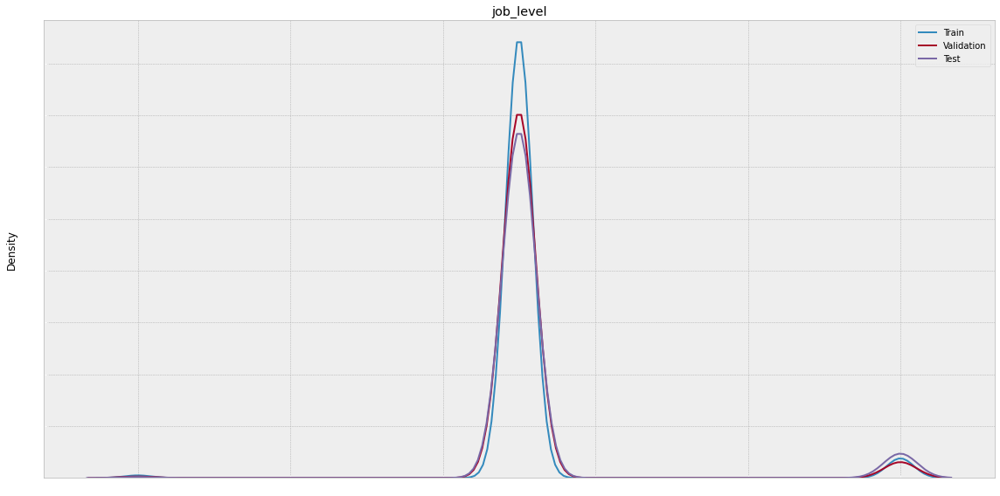

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

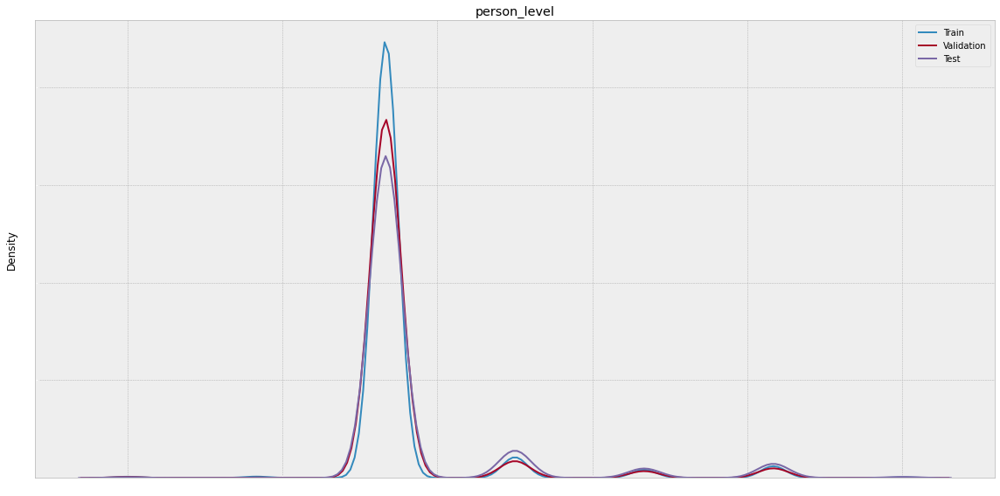

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

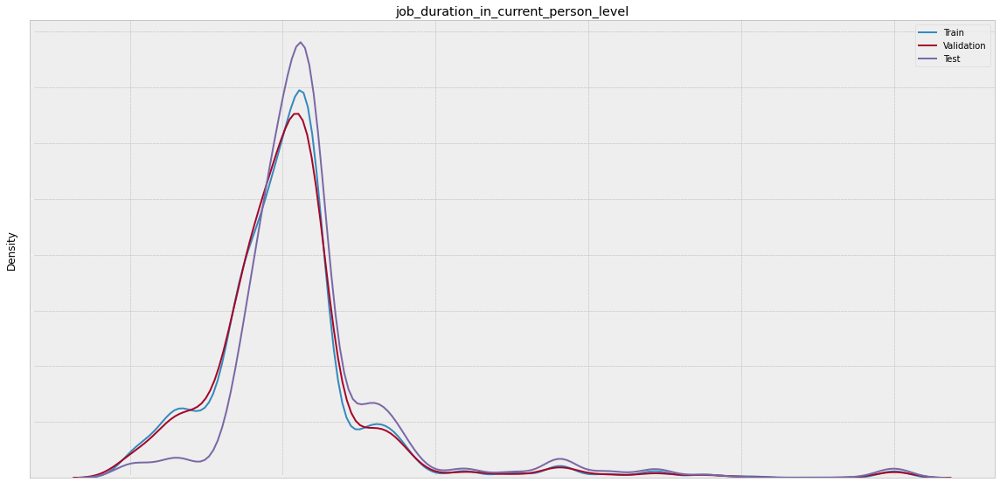

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

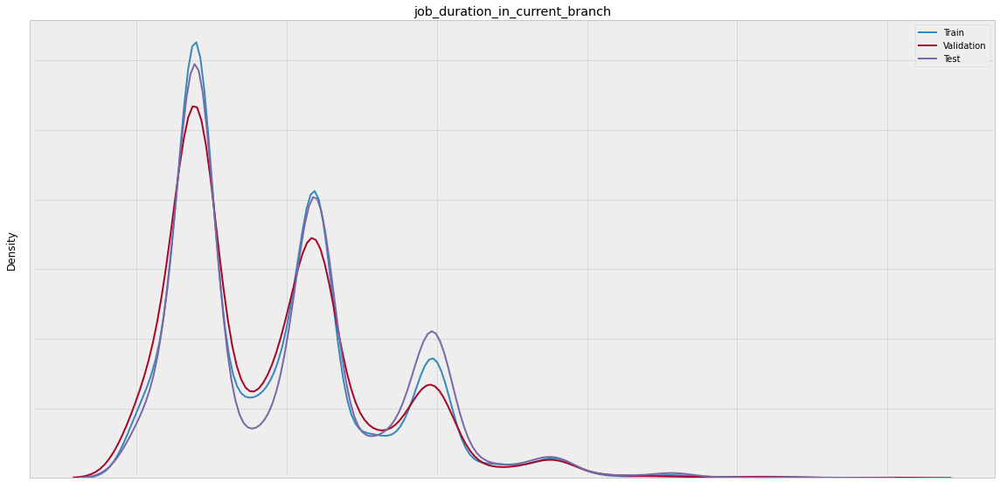

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

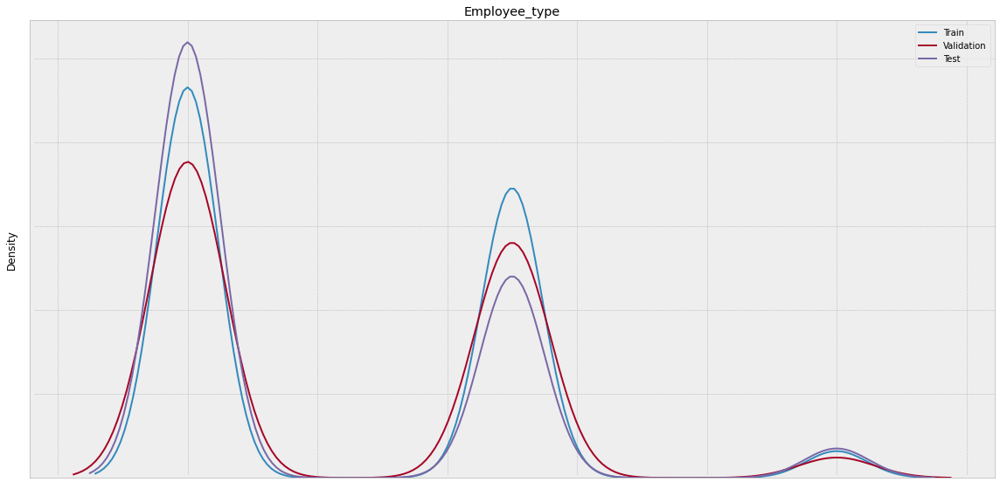

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

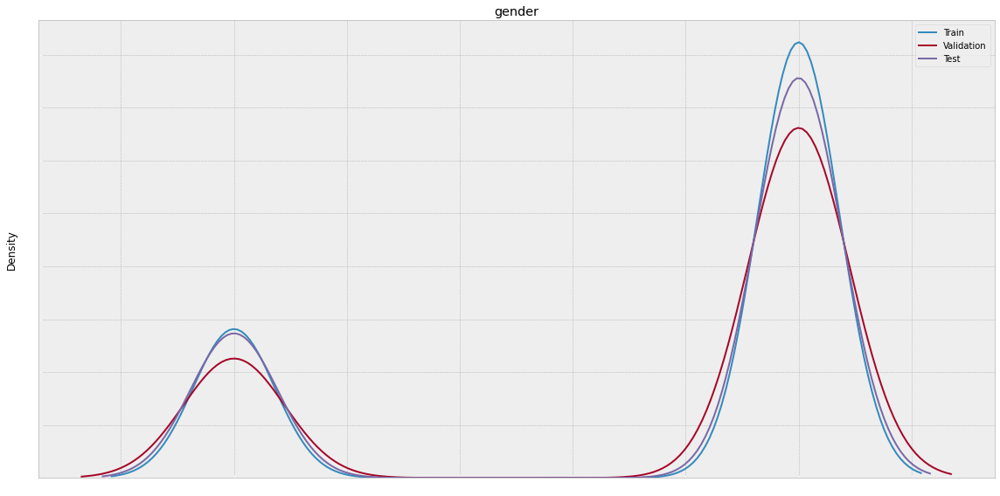

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

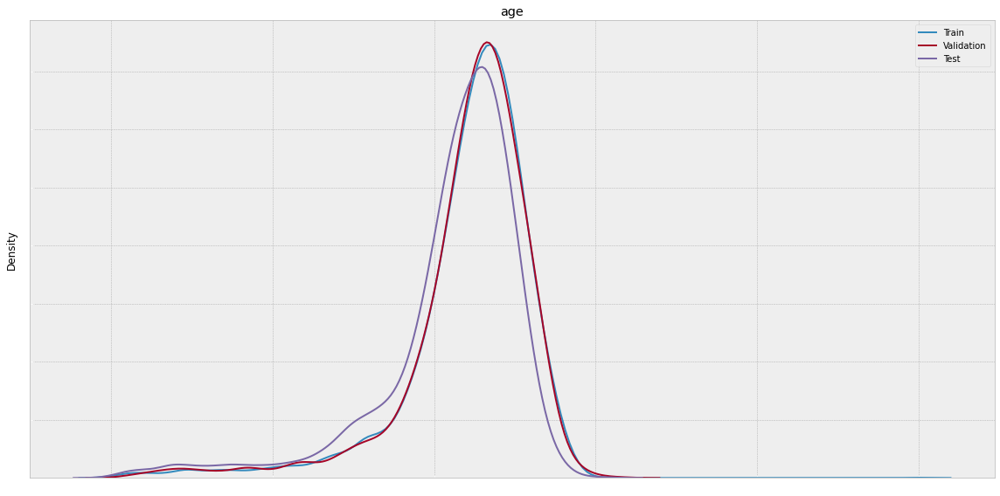

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

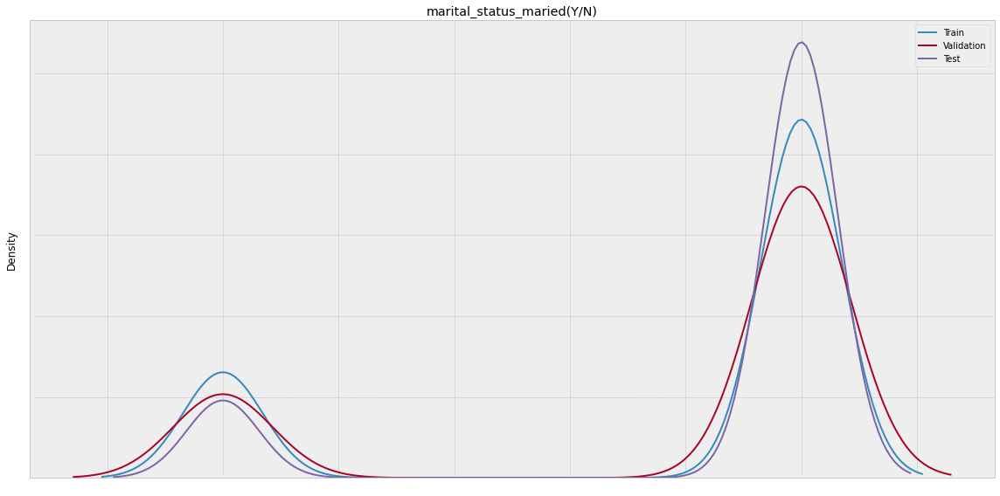

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

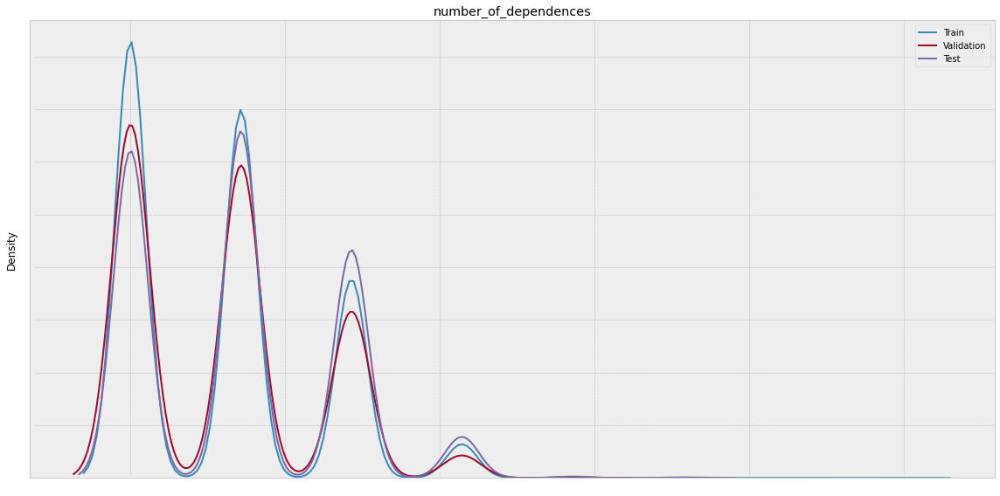

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

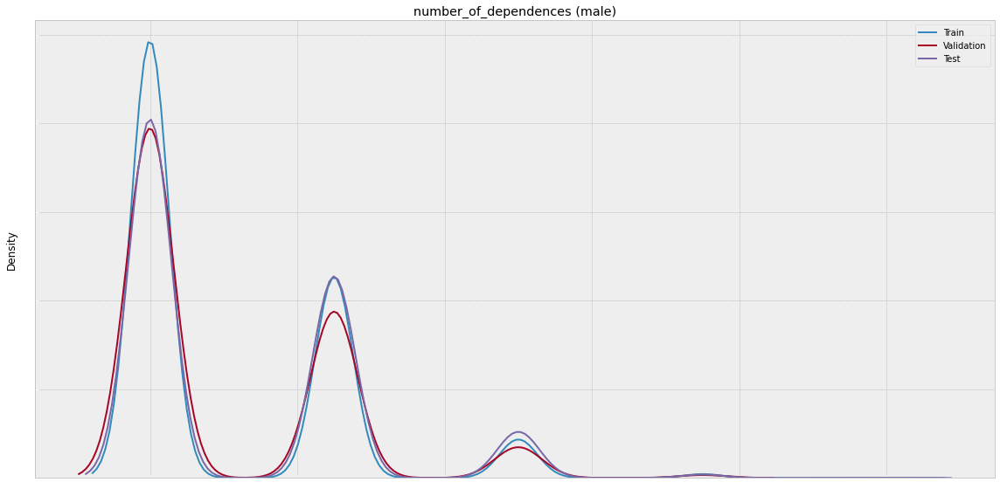

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

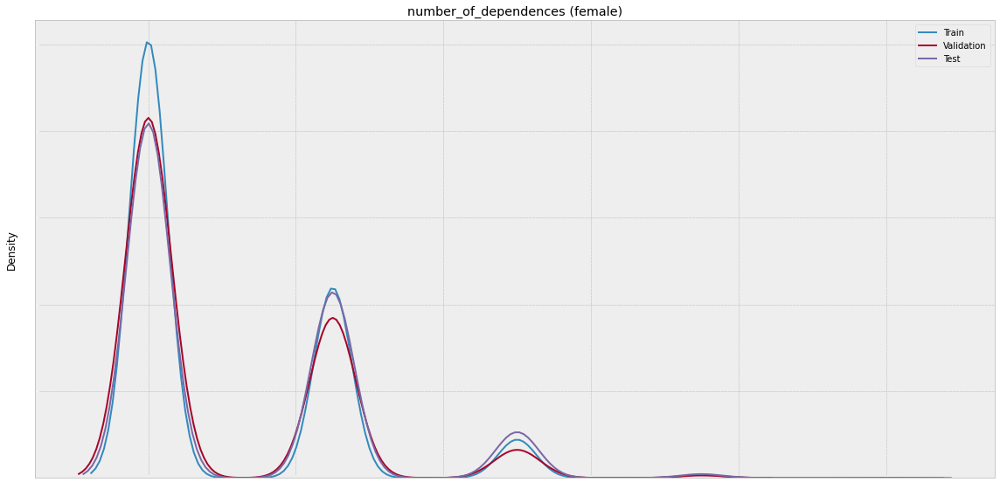

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

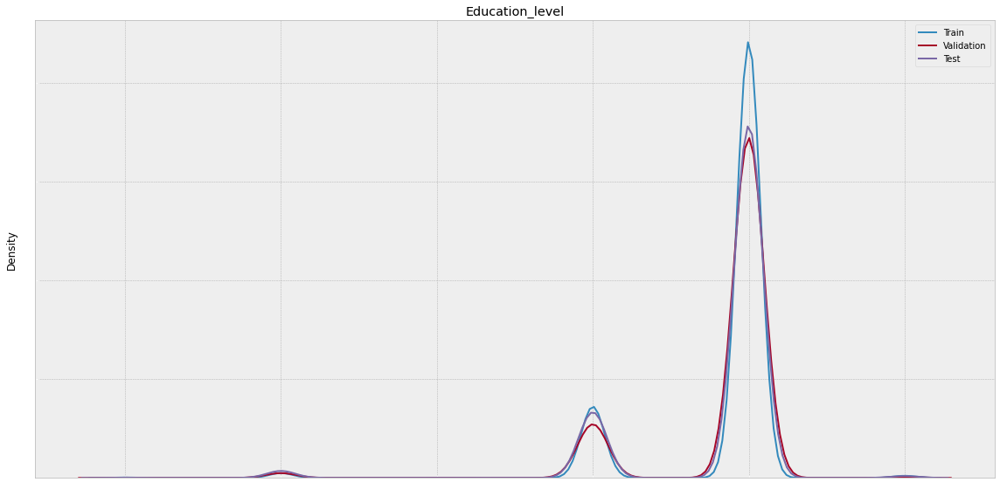

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

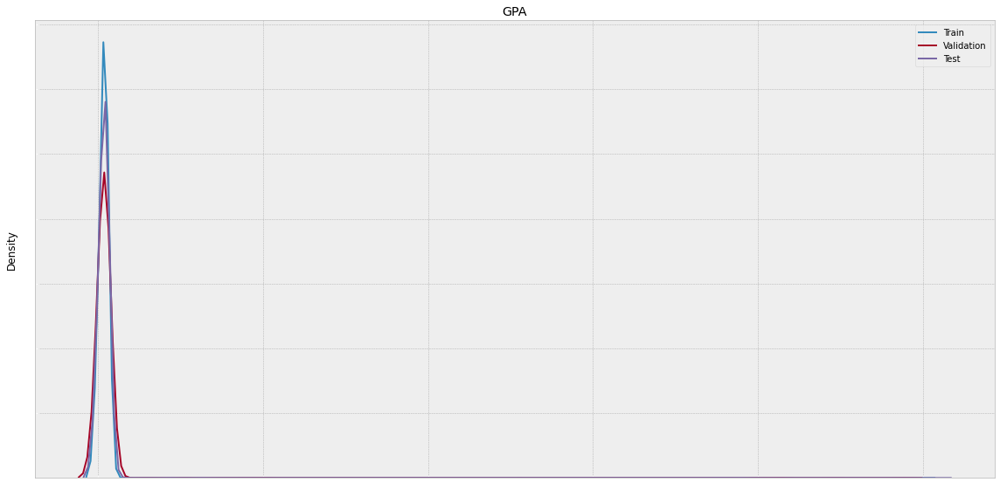

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

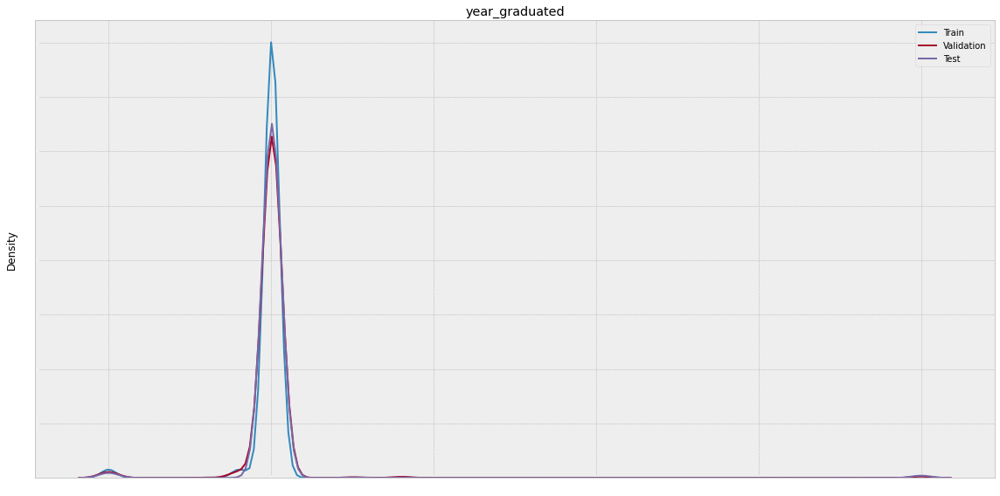

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

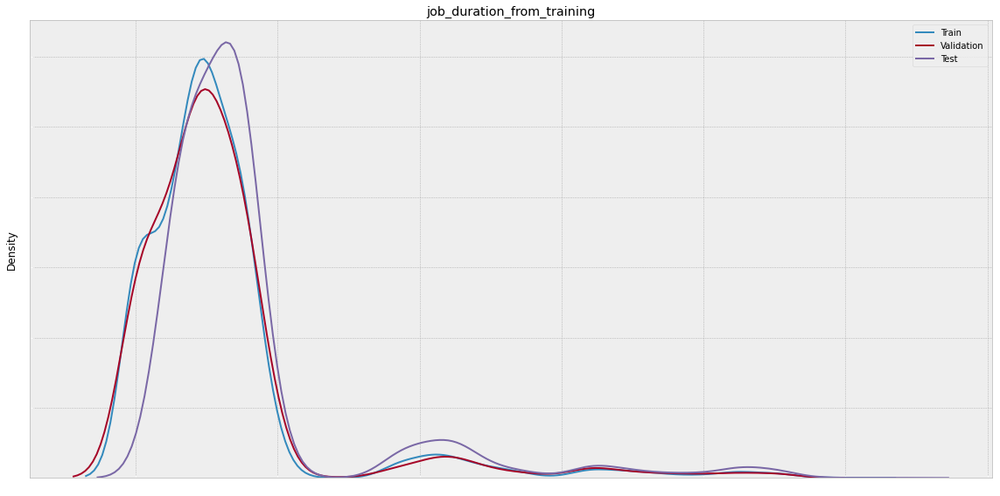

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

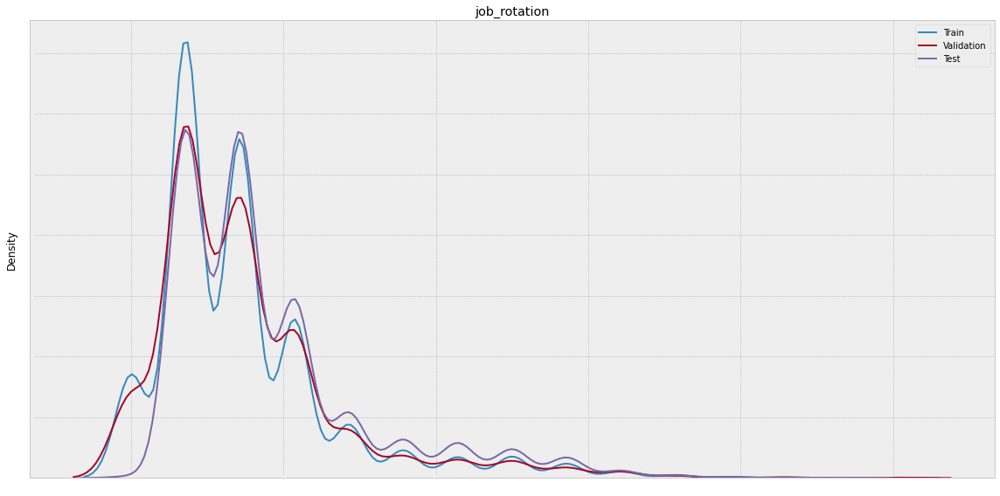

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

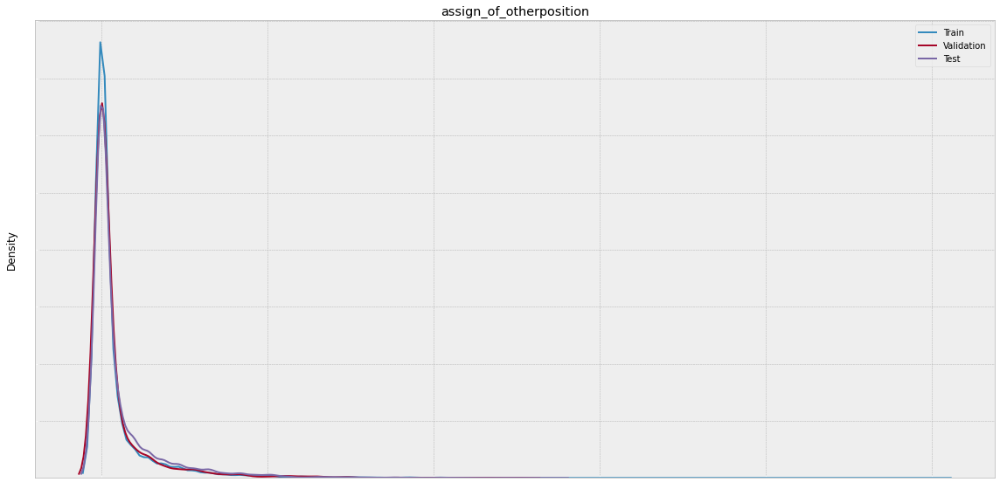

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

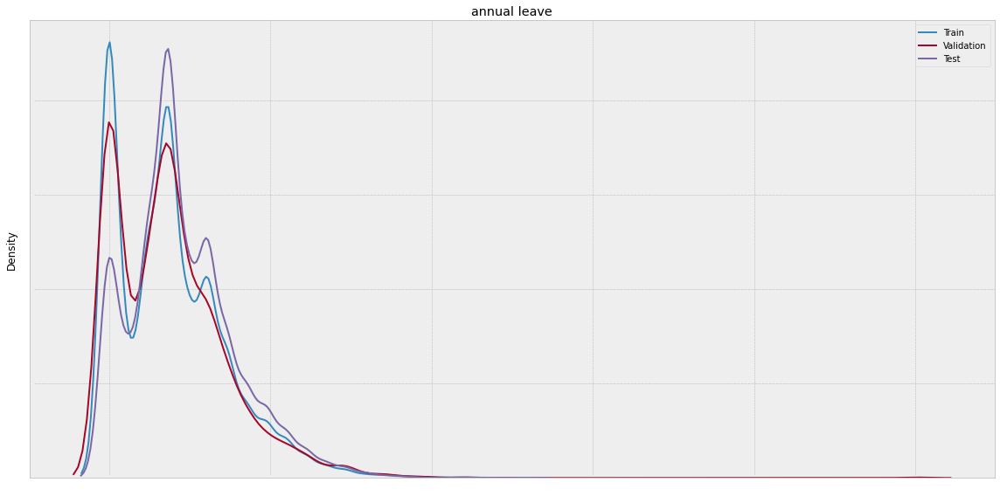

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

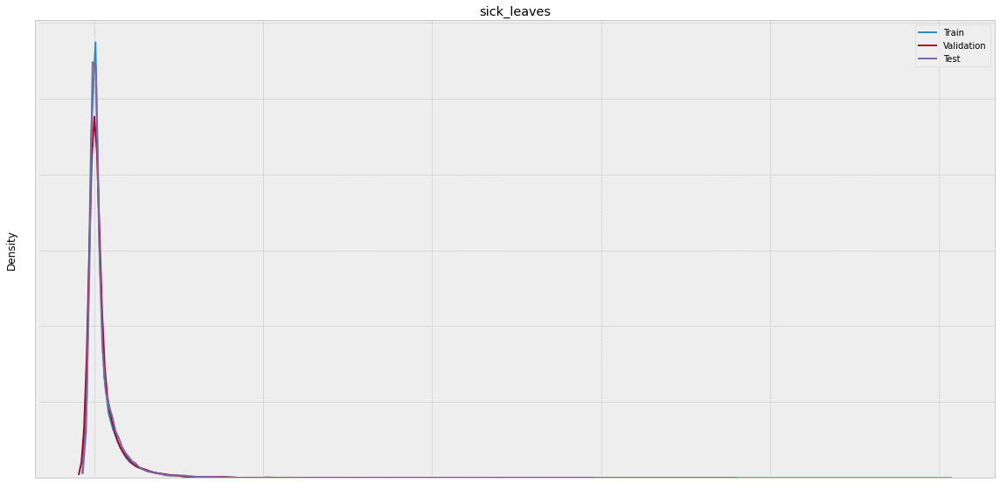

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

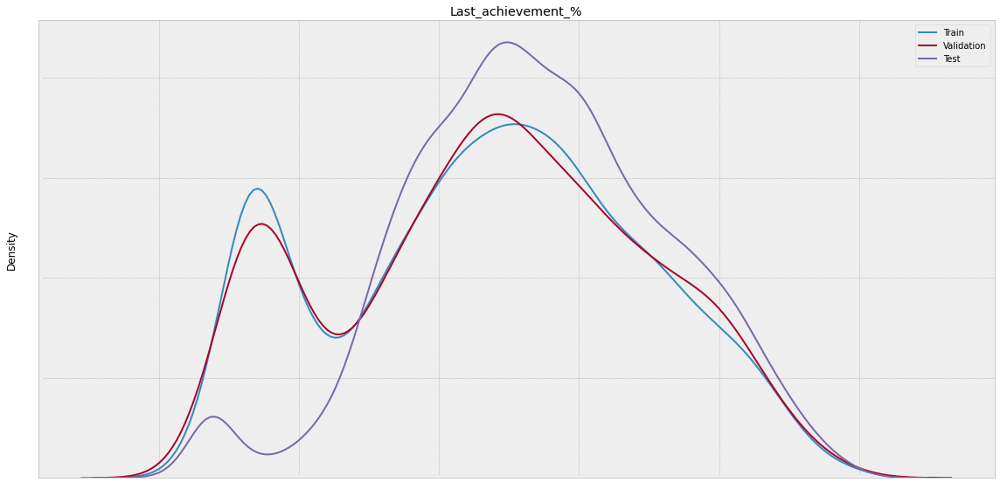

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

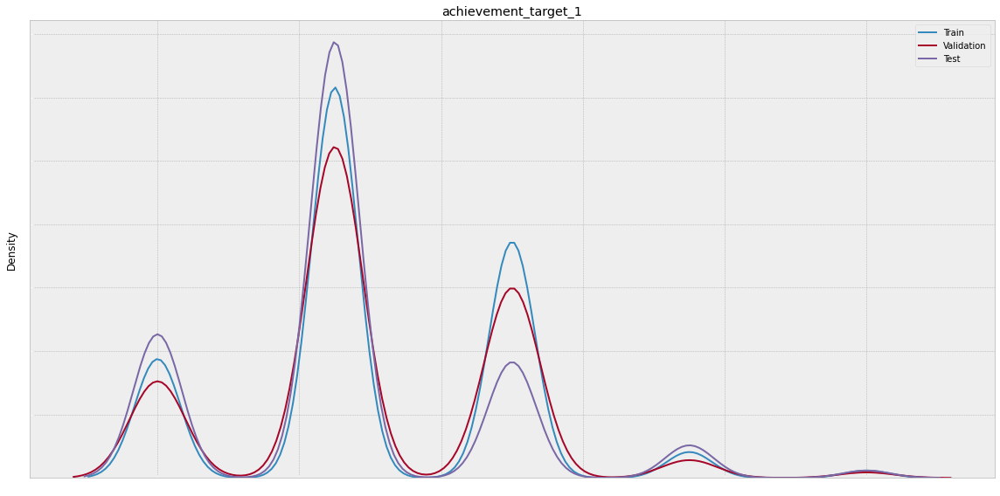

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

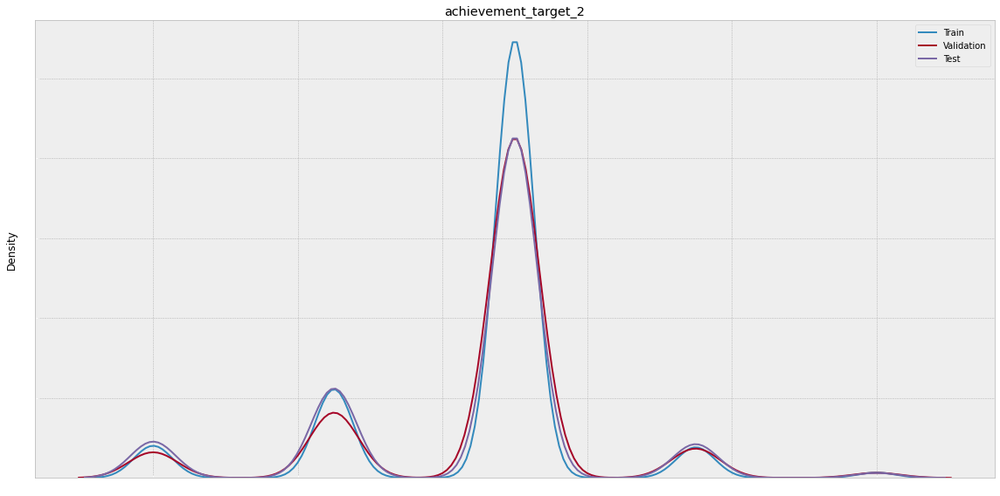

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axe

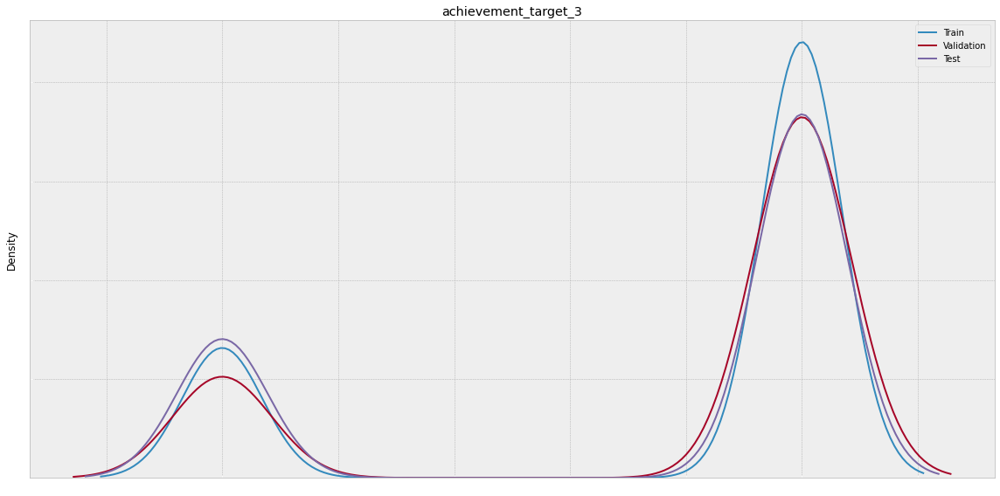

In [ ]:
plt.style.use('bmh')
for i in range(X_train.shape[1]):

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(X_train[:, i], hist=False, label='Train')
        sns.distplot(X_val[:, i], hist=False, label='Validation')
        sns.distplot(X_pred[:, i], hist=False, label='Test')

        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.title(imp_train_df.columns[i+1])
        plt.xlabel(None)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

#### Normalize Data

In [ ]:
# from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# scl = StandardScaler()
# scl = MinMaxScaler()

In [ ]:
# # X = scl.fit_transform(sorted_train_df.drop(['Best Performance'], axis=1))
# X_train = scl.fit_transform(X_train.values)
# X_val = scl.transform(X_val.values)
# X_pred = scl.transform(test_df)

# y = sorted_train_df['Best Performance'].values

In [ ]:
from sklearn.metrics import make_scorer, roc_auc_score
roc_auc_scorer = make_scorer(roc_auc_score, greater_is_better=True,
                             needs_threshold=True)

#### Feature Transform

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


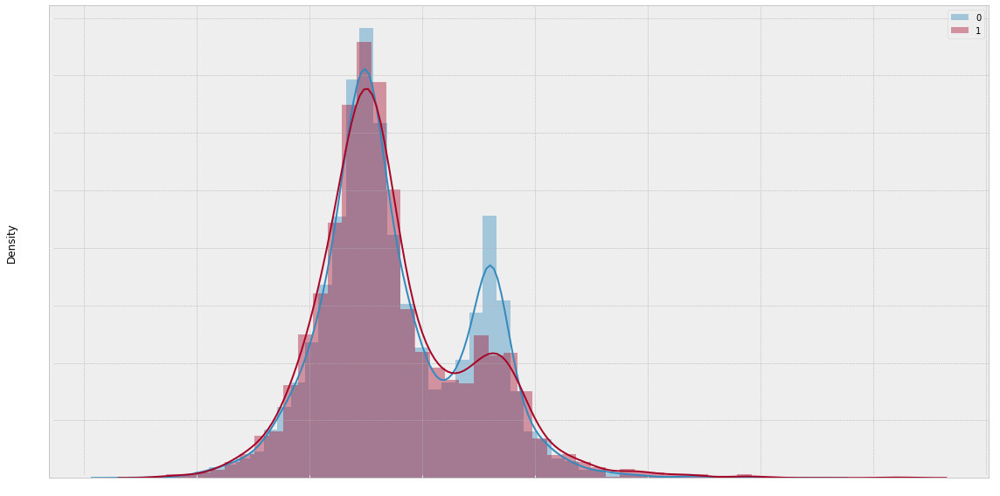

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


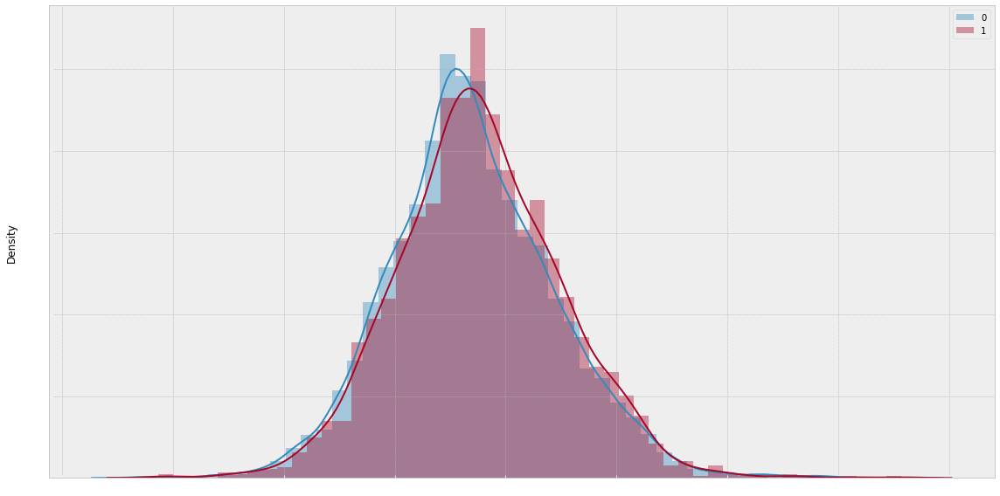

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


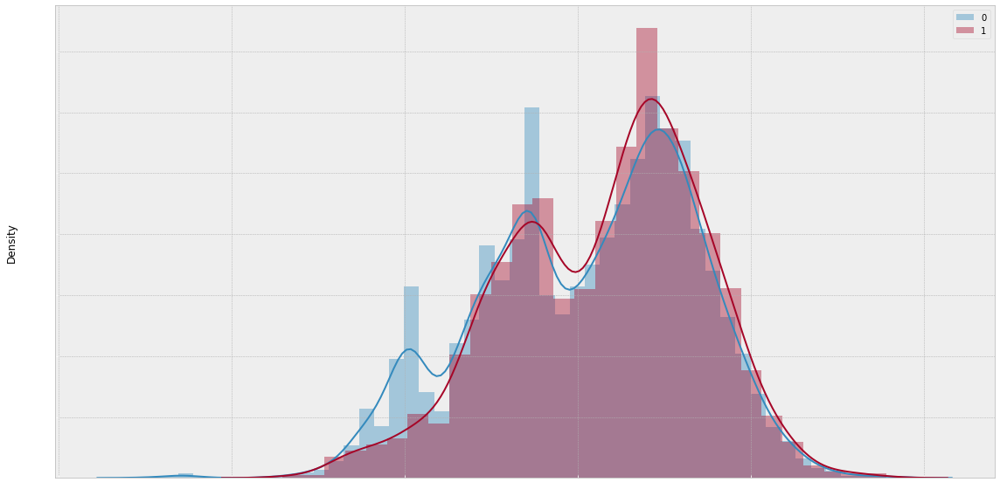

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


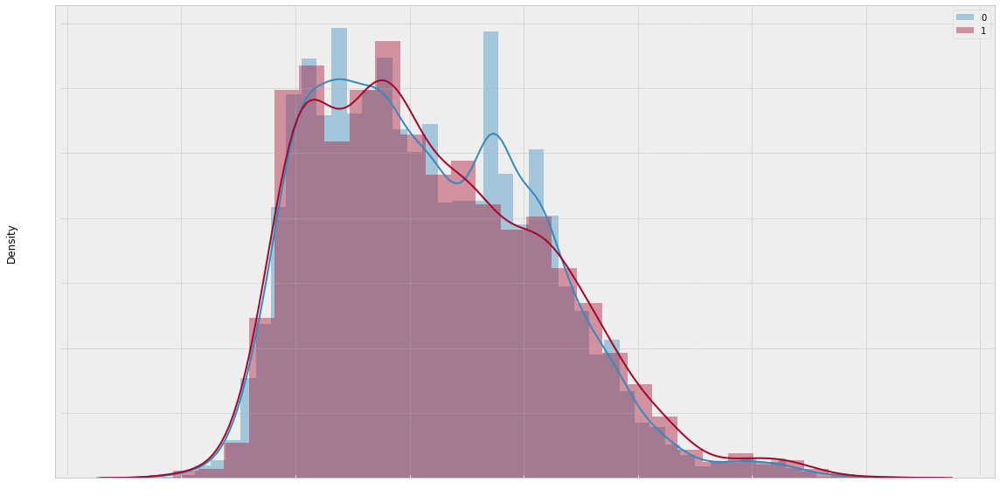

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


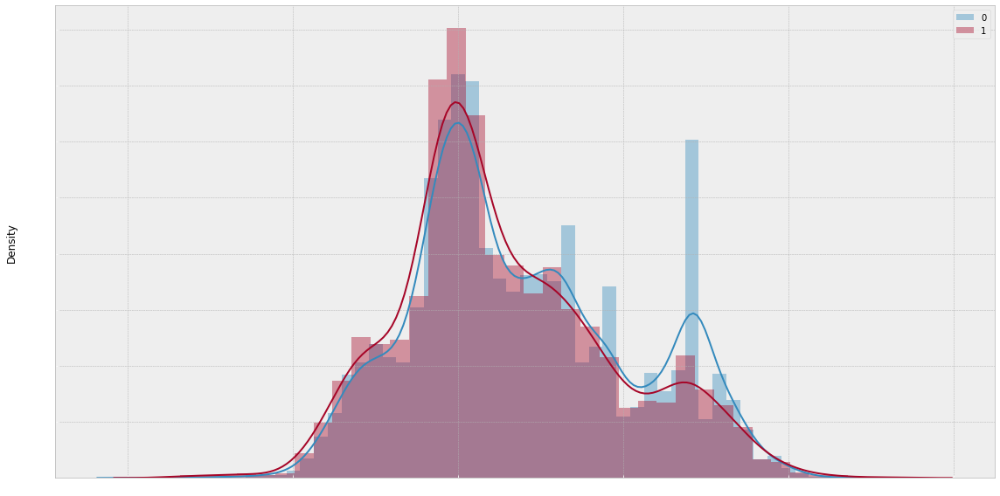

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


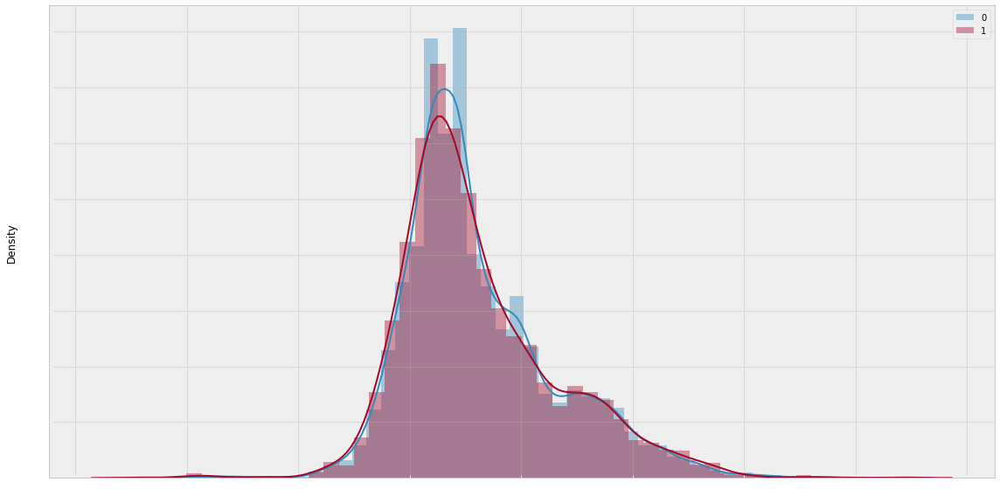

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


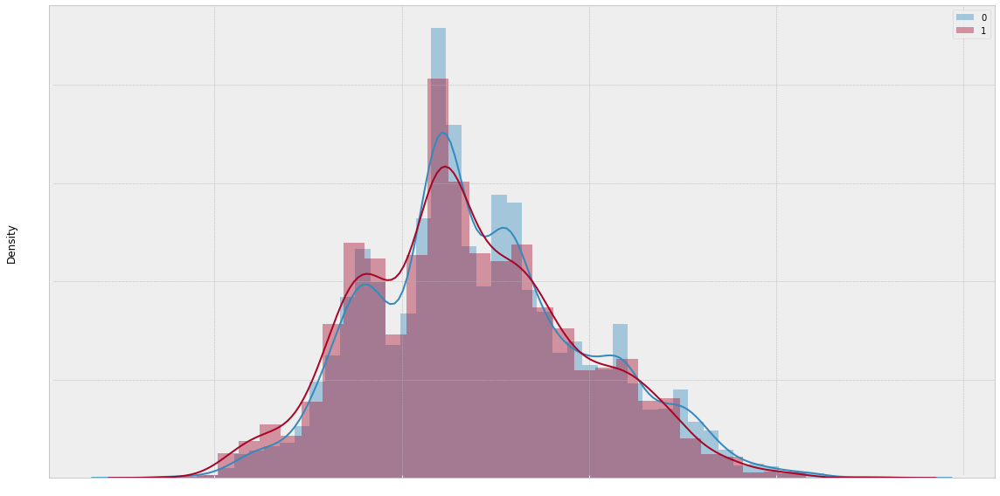

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


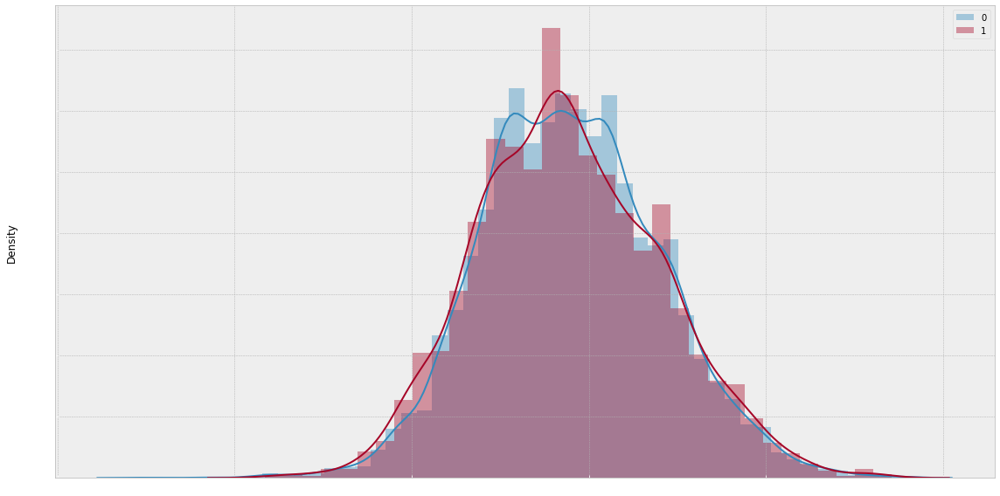

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


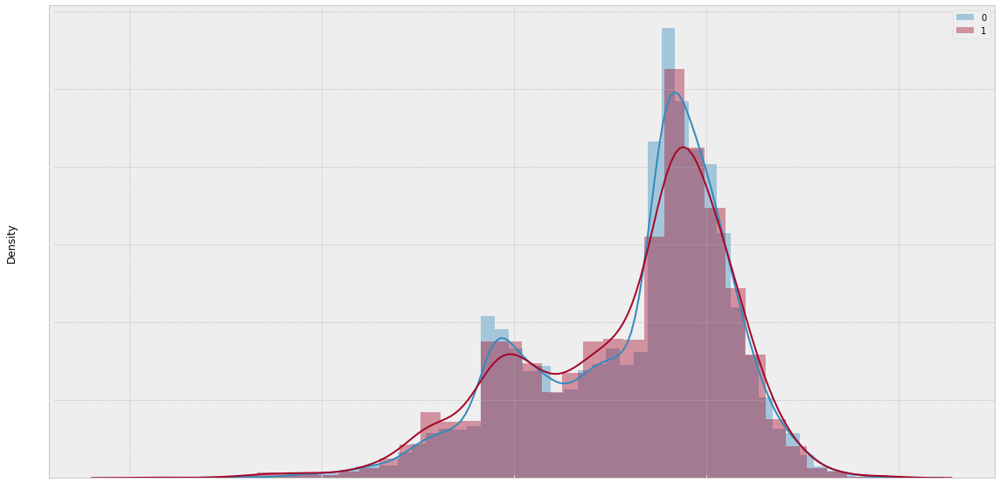

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


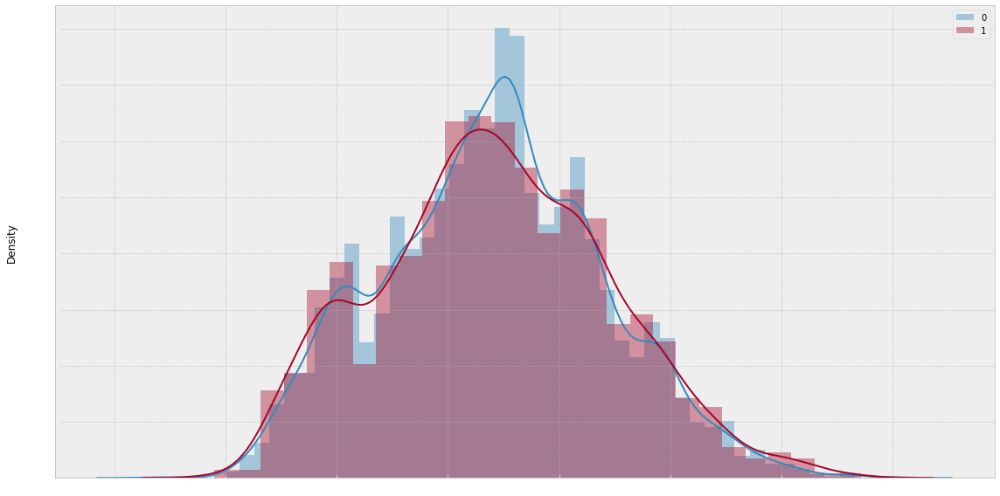

In [ ]:
Xscl = X.copy()

wmin = -50
wmax = 50

emin = 0
emax = 3

n_feat = 10

ft_df = pd.DataFrame({'Best Performance': y})
ft_test_df = pd.DataFrame()
param_df = pd.DataFrame()

for j in range(n_feat):
    ws = []
    es = []

    w = np.random.uniform(wmin, wmax)
    e = np.random.uniform(emin, emax)

    ws.append(w)
    es.append(e)

    ft = np.array(w * Xscl[:, 0] ** e)
    ft_test = np.array(w * X_pred[:, 0] ** e)

    for i in range(1, Xscl.shape[1]):
        # inf_nan_exist = True
        # while inf_nan_exist:
            w = np.random.uniform(wmin, wmax)
            e = np.random.uniform(emin, emax)

            ft_n = np.array(w * Xscl[:, i] ** e)
            ft_test_n = np.array(w * X_pred[:, i] ** e)

            # if not (np.isnan(ft).any() \
            #         or np.isnan(ft_test).any() \
            #         or np.isinf(ft).any() \
            #         or np.isinf(ft_test).any()):

                # inf_nan_exist = False
            ft += ft_n
            ft_test += ft_test_n
            ws.append(w)
            es.append(e)

    ft_df[f't_feat_{j}'] = ft
    ft_test_df[f't_feat_{j}'] = ft_test
    param_df[f'ws_{j}'] = ws
    param_df[f'es_{j}'] = es

    plt.style.use('bmh')
    plt.figure(figsize=(16, 8))
    sns.distplot(ft_df[f't_feat_{j}'][ft_df['Best Performance'] == 0], label='0')
    sns.distplot(ft_df[f't_feat_{j}'][ft_df['Best Performance'] == 1], label='1')

    plt.xlabel(None)
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
ft_df.isnull().sum()

Best Performance    0
t_feat_0            0
t_feat_1            0
t_feat_2            0
t_feat_3            0
t_feat_4            0
t_feat_5            0
t_feat_6            0
t_feat_7            0
t_feat_8            0
t_feat_9            0
dtype: int64

In [ ]:
ft_test_df.isnull().sum()

t_feat_0    0
t_feat_1    0
t_feat_2    0
t_feat_3    0
t_feat_4    0
t_feat_5    0
t_feat_6    0
t_feat_7    0
t_feat_8    0
t_feat_9    0
dtype: int64

In [ ]:
ft_test_df = ft_test_df.fillna(0)

In [ ]:
ft_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13335 entries, 0 to 13334
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Best Performance  13335 non-null  int64  
 1   t_feat_0          13335 non-null  float64
 2   t_feat_1          13335 non-null  float64
 3   t_feat_2          13335 non-null  float64
 4   t_feat_3          13335 non-null  float64
 5   t_feat_4          13335 non-null  float64
 6   t_feat_5          13335 non-null  float64
 7   t_feat_6          13335 non-null  float64
 8   t_feat_7          13335 non-null  float64
 9   t_feat_8          13335 non-null  float64
 10  t_feat_9          13335 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 1.1 MB


In [ ]:
ft_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   t_feat_0  6000 non-null   float64
 1   t_feat_1  6000 non-null   float64
 2   t_feat_2  6000 non-null   float64
 3   t_feat_3  6000 non-null   float64
 4   t_feat_4  6000 non-null   float64
 5   t_feat_5  6000 non-null   float64
 6   t_feat_6  6000 non-null   float64
 7   t_feat_7  6000 non-null   float64
 8   t_feat_8  6000 non-null   float64
 9   t_feat_9  6000 non-null   float64
dtypes: float64(10)
memory usage: 468.9 KB


##### Model Feature Transform

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
Xft = ft_df.drop(['Best Performance'], axis=1)
yft = ft_df['Best Performance']

Xft_train, Xft_val, yft_train, yft_val = train_test_split(Xft, yft, test_size=0.3, stratify=yft)

sclft = Normalizer()
Xft_train = sclft.fit_transform(Xft_train)
Xft_val = sclft.transform(Xft_val)
Xft_pred = sclft.transform(ft_test_df.values)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(yft), yft)
class_weights = {0: class_weights[0], 1: class_weights[1]}

##### Train

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(y), y)
class_weights = {0: class_weights[0], 1: class_weights[1]}

In [ ]:
lgbmt_params = {
    'learning_rate': [0.0075, 0.01],
    'n_estimators': [1250, 1500, 1750],
    'num_leaves': [11, 20],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'colsample_bytree' : [0.6],
    'subsample' : [0.15, 0.35],
    'reg_alpha' : [1.6],
    'reg_lambda' : [3],
}

rft_params = {
    'bootstrap': [True],
    'criterion': ['entropy'],
    'max_depth': [130, 150, 250],
    'max_features': [4],
    'min_samples_leaf': [2],
    'min_samples_split': [4],
    'n_estimators': [7]
}

xgb_params = {
    'min_child_weight': [6],
    'gamma': [7.5],
    'subsample': [0.9],
    'colsample_bytree': [0.5],
    'max_depth': [6]
}
sfold = StratifiedKFold(n_splits=10)

In [ ]:
dt = DecisionTreeClassifier(class_weight=class_weights)
# svc = SVC(class_weight=class_weights, probability=True)
ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
gbm = GradientBoostingClassifier()
xgb = XGBClassifier(class_weight=class_weights)
rf = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, n_jobs=-1)
nb = GaussianNB()
lgbm = LGBMClassifier(class_weight=class_weights)

In [ ]:
gsrf = GridSearchCV(rf, rft_params, cv=sfold, scoring=roc_auc_scorer)
gslgbm = GridSearchCV(lgbm, lgbmt_params, cv=sfold, scoring=roc_auc_scorer)

gsrf.fit(Xft_train, yft_train)
gslgbm.fit(Xft_train, yft_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt',
                                      class_weight={0: 0.625, 1: 2.5},
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, ob...
             param_grid={'boosting_type': ['gbdt'], 'colsample_bytree': [0.6],
                         'learning_rate': [0.0075, 0.01],
                         'n_estimators': [1250, 1500, 3000, 5000],
                         'num_leaves': [11, 20], 'objective': ['binary'],
                   

In [ ]:
gsxgb = GridSearchCV(xgb, xgb_params, cv=sfold, scoring=roc_auc_scorer)
gsxgb.fit(Xft_train, yft_train)
gsxgb_best = gsxgb.best_params_
gsxgb.best_params_

{'colsample_bytree': 0.5,
 'gamma': 7.5,
 'max_depth': 6,
 'min_child_weight': 6,
 'subsample': 0.9}

In [ ]:
gsrf_best = gsrf.best_params_
gsrf.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 250,
 'max_features': 4,
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'n_estimators': 7}

In [ ]:
gslgbm_best = gslgbm.best_params_
gslgbm.best_params_

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.6,
 'learning_rate': 0.0075,
 'n_estimators': 1500,
 'num_leaves': 11,
 'objective': 'binary',
 'reg_alpha': 1.6,
 'reg_lambda': 3,
 'subsample': 0.15}

In [ ]:
nb.fit(Xft_train, yft_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
# svc.fit(X_train, y_train)

In [ ]:
# ada_svc.fit(X_train, y_train)

In [ ]:
dt.fit(Xft_train, yft_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight={0: 0.625, 1: 2.5},
                       criterion='gini', max_depth=None, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=None,
                       splitter='best')

In [ ]:
# ada_dt.fit(Xft_train, yft_train)

In [ ]:
gbm.fit(Xft_train, yft_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
xgb.fit(Xft_train, yft_train)

XGBClassifier(base_score=0.5, booster='gbtree', class_weight={0: 0.625, 1: 2.5},
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
rf.fit(Xft_train, yft_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 0.625, 1: 2.5}, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=20,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##### Evaluation

In [ ]:
y_pred_dt = dt.predict(Xft_val)
# y_pred_svc = svc.predict(X_val)
# y_pred_ada_dt = ada_dt.predict(Xft_val)
# y_pred_ada_svc = ada_svc.predict(X_val)
y_pred_gbm = gbm.predict(Xft_val)
y_pred_xgb = xgb.predict(Xft_val)
y_pred_rf = rf.predict(Xft_val)
y_pred_nb = nb.predict(Xft_val)
y_pred_gsrf = gsrf.predict(Xft_val)
y_pred_gslgbm = gslgbm.predict(Xft_val)
y_pred_gsxgb = gsxgb.predict(Xft_val)

In [ ]:
y_pred_proba_dt = dt.predict_proba(Xft_val)[:, 1]
# y_pred_proba_svc = svc.predict_proba(X_val)[:, 1]
# y_pred_proba_ada_dt = ada_dt.predict_proba(Xft_val)[:, 1]
# y_pred_proba_ada_svc = ada_svc.predict(X_val)[:, 1]
y_pred_proba_gbm = gbm.predict_proba(Xft_val)[:, 1]
y_pred_proba_xgb = xgb.predict_proba(Xft_val)[:, 1]
y_pred_proba_rf = rf.predict_proba(Xft_val)[:, 1]
y_pred_proba_nb = nb.predict_proba(Xft_val)[:, 1]
y_pred_proba_gsrf = gsrf.predict_proba(Xft_val)[:, 1]
y_pred_proba_gslgbm = gslgbm.predict_proba(Xft_val)[:, 1]
y_pred_proba_gsxgb = gsxgb.predict_proba(Xft_val)[:, 1]

y_pred_proba_avg = (
    y_pred_proba_dt +
    # y_pred_proba_ada_dt +
    y_pred_proba_gbm +
    y_pred_proba_xgb +
    y_pred_proba_rf +
    # y_pred_proba_svc +
    # y_pred_proba_ada_svc +
    y_pred_proba_nb +
    y_pred_proba_gsrf +
    y_pred_proba_gslgbm +
    y_pred_proba_gsxgb
) / 8

In [ ]:
X_ens_train = np.array([
                dt.predict_proba(Xft_train)[:, 1],
                # ada_dt.predict_proba(Xft_train)[:, 1],
                gbm.predict_proba(Xft_train)[:, 1],
                xgb.predict_proba(Xft_train)[:, 1],
                rf.predict_proba(Xft_train)[:, 1],
                nb.predict_proba(Xft_train)[:, 1],
                gsrf.predict_proba(Xft_train)[:, 1],
                gslgbm.predict_proba(Xft_train)[:, 1],
                gsxgb.predict_proba(Xft_train)[:, 1]
            ])

X_ens_val = np.array([
                y_pred_proba_dt,
                # y_pred_proba_ada_dt,
                y_pred_proba_gbm,
                y_pred_proba_xgb,
                y_pred_proba_rf,
                y_pred_proba_nb,
                y_pred_proba_gsrf,
                y_pred_proba_gslgbm,
                y_pred_proba_gsxgb
            ])

X_ens_train = X_ens_train.reshape(X_ens_train.shape[1], X_ens_train.shape[0])
X_ens_val = X_ens_val.reshape(X_ens_val.shape[1], X_ens_val.shape[0])

rf_ens = RandomForestClassifier(class_weight=class_weights, n_jobs=-1, bootstrap=True,
 criterion='entropy',
 max_depth=102,
 max_features=4,
 min_samples_leaf=2,
 min_samples_split=4,
 n_estimators=7)
rf_ens.fit(X_ens_train, yft_train)
y_rf_ens_val = rf_ens.predict_proba(X_ens_val)[:, 1]

roc_auc_score(yft_val, y_rf_ens_val)

0.5010908700406123

In [ ]:
y_pred_proba_log_dt = dt.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_svc = svc.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_ada_dt = ada_dt.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_ada_svc = ada_svc.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_gbm = gbm.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_xgb = xgb.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_rf = rf.predict_log_proba(Xft_val)[:, 1]
y_pred_proba_log_nb = nb.predict_log_proba(Xft_val)[:, 1]

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:948: RuntimeWarning: divide by zero encountered in log
  return np.log(proba)


In [ ]:
def plot_confusion_matrix(y_test, y_pred, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, linewidths=0.5)
    plt.title(title)
    plt.show()

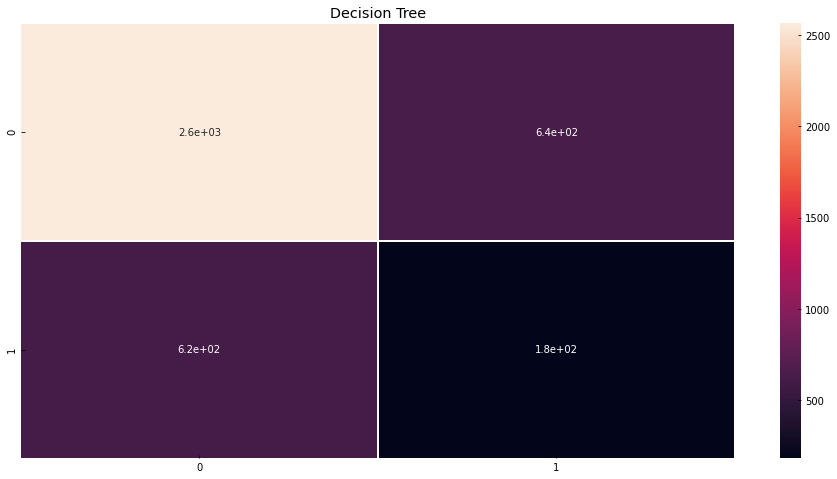

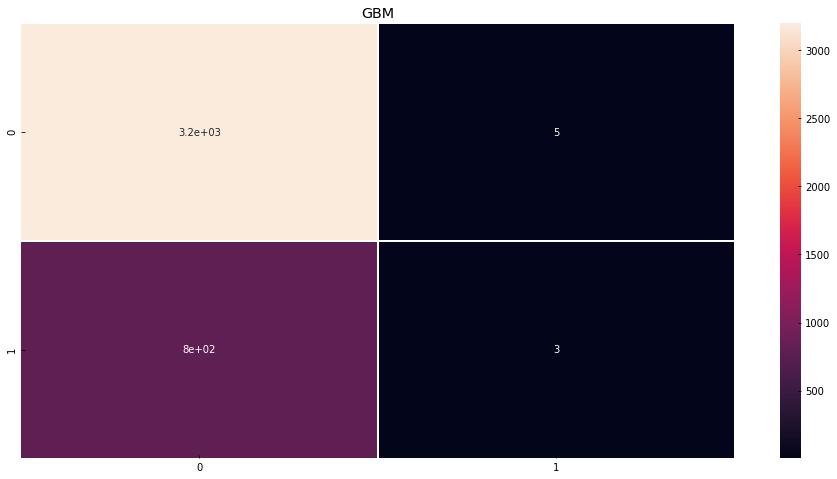

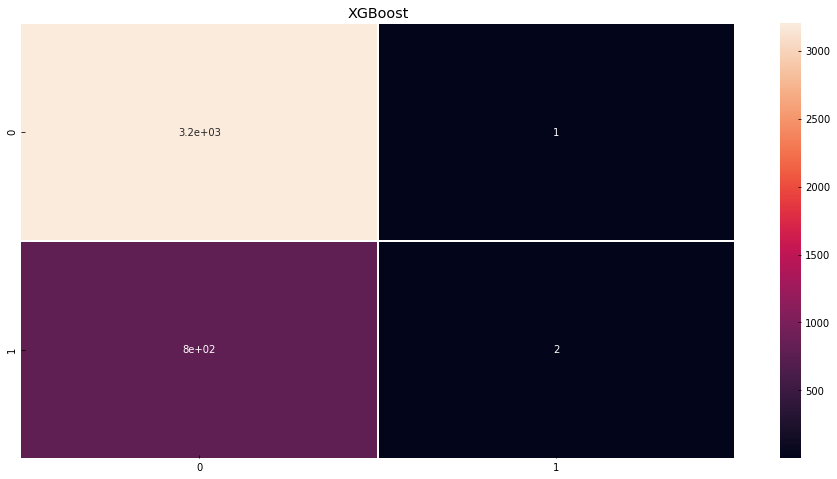

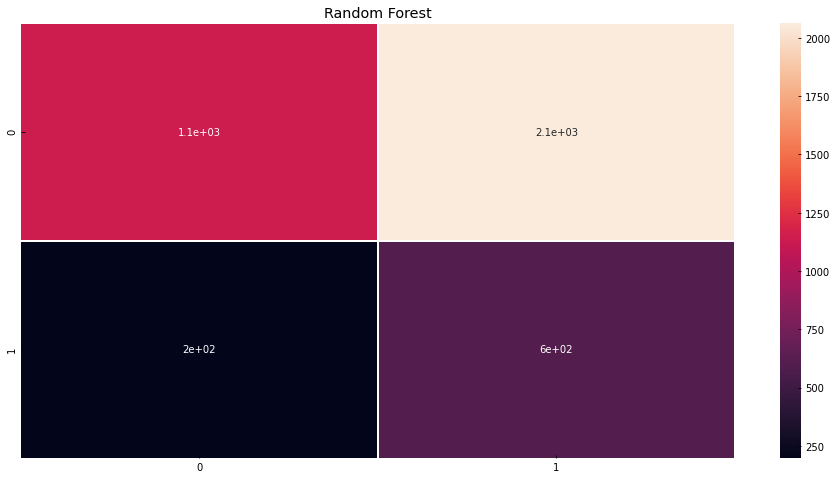

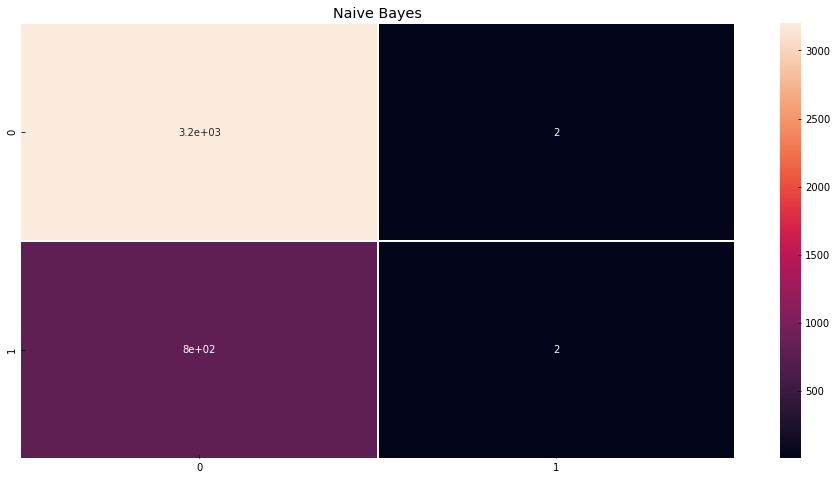

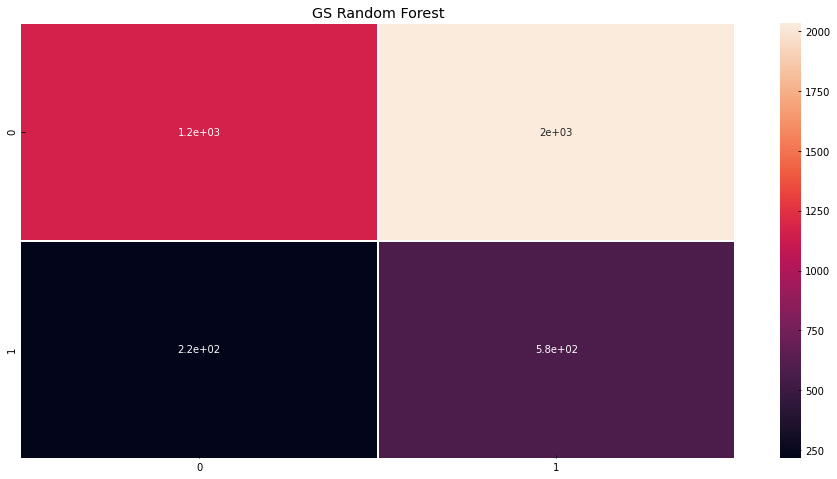

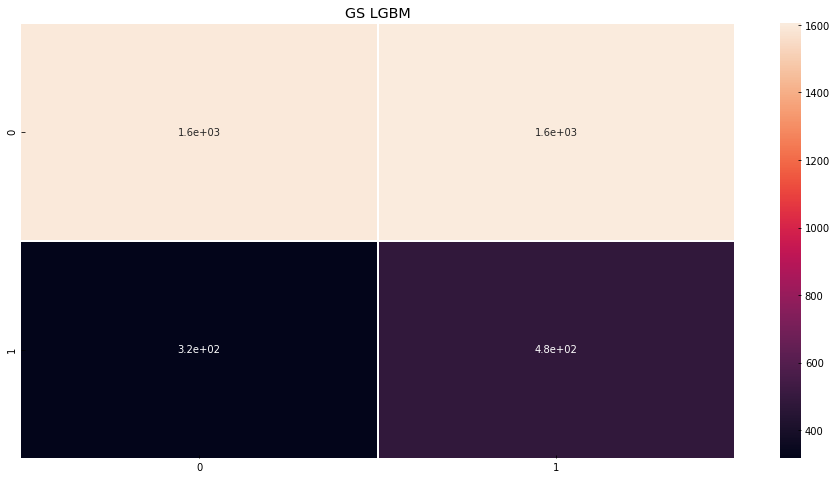

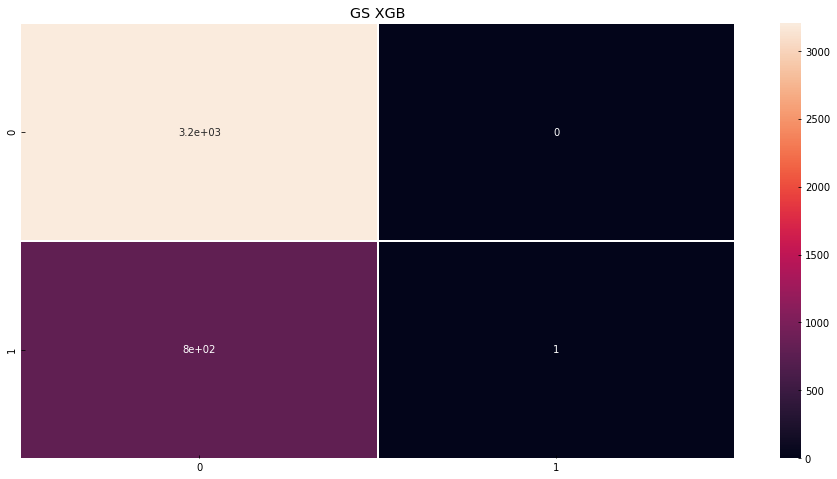

In [ ]:
plot_confusion_matrix(yft_val, y_pred_dt, 'Decision Tree')
# plot_confusion_matrix(y_val, y_pred_svc, 'SVC')
# plot_confusion_matrix(yft_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# plot_confusion_matrix(y_val, y_pred_ada_svc, 'AdaBoost SVC')
plot_confusion_matrix(yft_val, y_pred_gbm, 'GBM')
plot_confusion_matrix(yft_val, y_pred_xgb, 'XGBoost')
plot_confusion_matrix(yft_val, y_pred_rf, 'Random Forest')
plot_confusion_matrix(yft_val, y_pred_nb, 'Naive Bayes')
plot_confusion_matrix(yft_val, y_pred_gsrf, 'GS Random Forest')
plot_confusion_matrix(yft_val, y_pred_gslgbm, 'GS LGBM')
plot_confusion_matrix(yft_val, y_pred_gsxgb, 'GS XGB')

In [ ]:
def print_classification_report(y_test, y_pred, title):
    print(title)
    print(classification_report(y_test, y_pred))
    print(100*'-')

In [ ]:
print_classification_report(yft_val, y_pred_dt, 'Decision Tree')
# print_classification_report(y_val, y_pred_svc, 'SVC')
# print_classification_report(yft_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# print_classification_report(y_val, y_pred_ada_svc, 'AdaBoost SVC')
print_classification_report(yft_val, y_pred_gbm, 'GBM')
print_classification_report(yft_val, y_pred_xgb, 'XGBoost')
print_classification_report(yft_val, y_pred_rf, 'Random Forest')
print_classification_report(yft_val, y_pred_nb, 'Naive Bayes')
print_classification_report(yft_val, y_pred_gsrf, 'GS Random Forest')
print_classification_report(yft_val, y_pred_gslgbm, 'GS LGBM')
print_classification_report(yft_val, y_pred_gsxgb, 'GS XGB')

Decision Tree
              precision    recall  f1-score   support

           0       0.81      0.80      0.80      3201
           1       0.22      0.23      0.22       800

    accuracy                           0.69      4001
   macro avg       0.51      0.51      0.51      4001
weighted avg       0.69      0.69      0.69      4001

----------------------------------------------------------------------------------------------------
GBM
              precision    recall  f1-score   support

           0       0.80      1.00      0.89      3201
           1       0.38      0.00      0.01       800

    accuracy                           0.80      4001
   macro avg       0.59      0.50      0.45      4001
weighted avg       0.72      0.80      0.71      4001

----------------------------------------------------------------------------------------------------
XGBoost
              precision    recall  f1-score   support

           0       0.80      1.00      0.89      3201
         

In [ ]:
roc = [roc_auc_score(yft_val, y_pred_dt),
    #    roc_auc_score(yft_val, y_pred_ada_dt),
       roc_auc_score(yft_val, y_pred_gbm),
       roc_auc_score(yft_val, y_pred_xgb),
       roc_auc_score(yft_val, y_pred_rf),
    #    roc_auc_score(y_val, y_pred_svc),
    #    roc_auc_score(y_val, y_pred_ada_svc),
       roc_auc_score(yft_val, y_pred_nb),
       roc_auc_score(yft_val, y_pred_gsrf),
       roc_auc_score(yft_val, y_pred_gslgbm),
       roc_auc_score(yft_val, y_pred_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5140936426116839, 0.5010939940643548, 0.501093798812871, 0.5547881521399562, 0.5009375976257419, 0.5475991877538269, 0.5513282958450485, 0.500625]


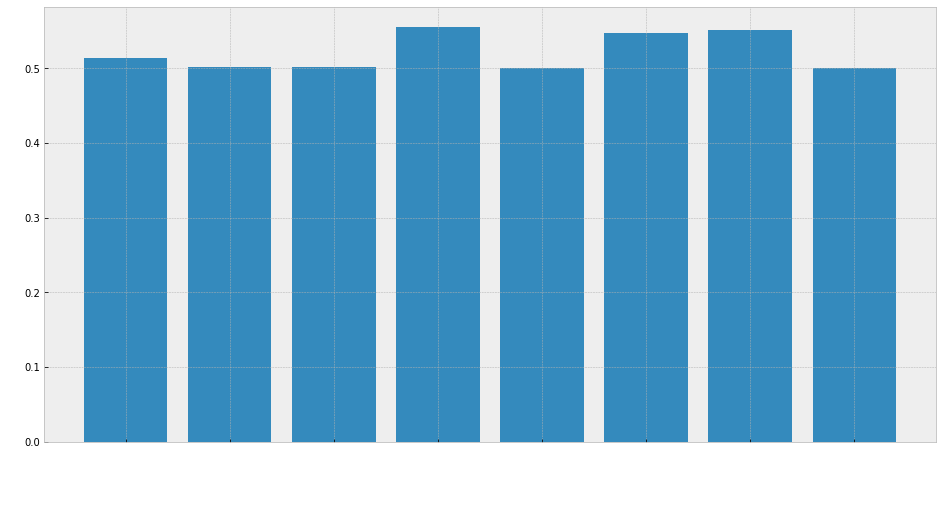

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

In [ ]:
roc = [roc_auc_score(yft_val, y_pred_proba_dt),
    #    roc_auc_score(yft_val, y_pred_proba_ada_dt),
       roc_auc_score(yft_val, y_pred_proba_gbm),
       roc_auc_score(yft_val, y_pred_proba_xgb),
       roc_auc_score(yft_val, y_pred_proba_rf),
    #    roc_auc_score(y_val, y_pred_proba_svc),
    #    roc_auc_score(y_val, y_pred_proba_ada_svc),
       roc_auc_score(yft_val, y_pred_proba_nb),
       roc_auc_score(yft_val, y_pred_proba_avg),
       roc_auc_score(yft_val, y_pred_proba_gsrf),
       roc_auc_score(yft_val, y_pred_proba_gslgbm),
       roc_auc_score(yft_val, y_pred_proba_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'AVG', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5140374101843175, 0.5700554514214308, 0.577722391440175, 0.5704389253358326, 0.5555088253670728, 0.5698090440487348, 0.5538636363636363, 0.5750886441736957, 0.5824697360199937]


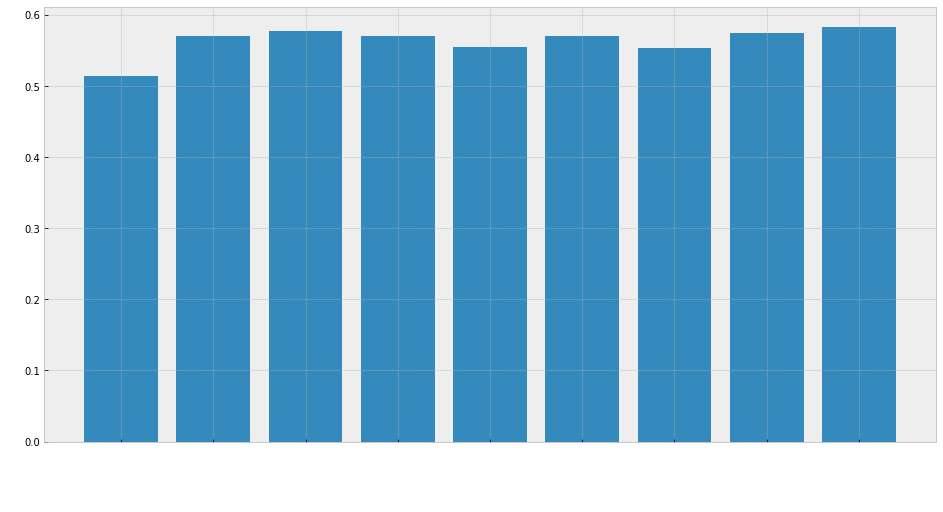

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

[0.9989286192580689, 0.5096411355115158, 0.5040171397964649, 0.6216107165045214, 0.4998659339443848, 0.5980446440682514, 0.710871021209623, 0.5010712372790573]


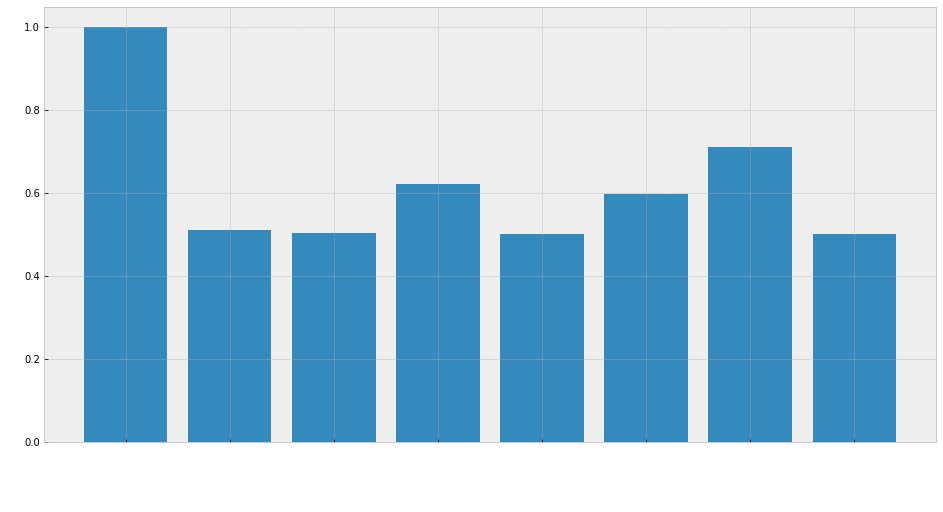

In [ ]:
# train prediction -> to check overfit
roc_train = [roc_auc_score(yft_train, dt.predict(Xft_train)),
    #    roc_auc_score(yft_train, ada_dt.predict(Xft_train)),
       roc_auc_score(yft_train, gbm.predict(Xft_train)),
       roc_auc_score(yft_train, xgb.predict(Xft_train)),
       roc_auc_score(yft_train, rf.predict(Xft_train)),
    #    roc_auc_score(y_train, svc.predict(X_train)),
    #    roc_auc_score(y_train, ada_svc.predict(X_train)),
       roc_auc_score(yft_train, nb.predict(Xft_train)),
       roc_auc_score(yft_train, gsrf.predict(Xft_train)),
       roc_auc_score(yft_train, gslgbm.predict(Xft_train)),
       roc_auc_score(yft_train, gsxgb.predict(Xft_train))
]
print(roc_train)
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

[0.9999936159021137, 0.731058507100946, 0.7259027742061501, 0.6848209608440322, 0.5560144693785309, 0.6379719758187588, 0.7933939148357037, 0.7467282036317769]


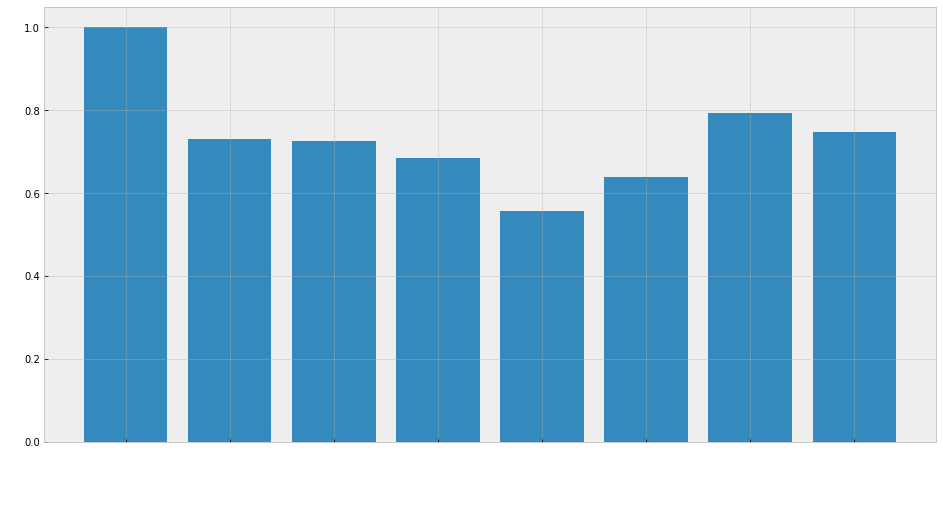

In [ ]:
# train prediction proba -> to check overfit
roc_train = [roc_auc_score(yft_train, dt.predict_proba(Xft_train)[:, 1]),
    #    roc_auc_score(yft_train, ada_dt.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gbm.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, xgb.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, rf.predict_proba(Xft_train)[:, 1]),
    #    roc_auc_score(y_train, svc.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_svc.predict_proba(X_train)[:, 1]),
       roc_auc_score(yft_train, nb.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gsrf.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gslgbm.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gsxgb.predict_proba(Xft_train)[:, 1])
]
print(roc_train)

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
def feature_importances_performance(model, new_model, model_name, X_train, X_test, y_train, y_test):
    print(model_name)
    feature_imp = sorted(model.feature_importances_)

    for threshold in feature_imp:
        selection = SelectFromModel(model, threshold=threshold, prefit=True)

        selected_feature_X_train = selection.transform(X_train)
        new_model.fit(selected_feature_X_train, y_train)

        selected_feature_X_test = selection.transform(X_test)
        y_pred = new_model.predict_proba(selected_feature_X_test)[:,1]

        roc = roc_auc_score(y_test, y_pred)

        print(f'Threshold={threshold:.5f}, Number of features={selected_feature_X_train.shape[1]}, ROC AUC: {roc:.3f}')
    print(100*'-')

In [ ]:
# feature_importances_performance(dt, DecisionTreeClassifier(class_weight=class_weights), 'Decision Tree', Xft_train, Xft_val, yft_train, yft_val)
# # feature_importances_performance(svc, SVC(class_weight='balanced', probability=True), 'SVC', X_train, X_test, y_train, y_test)
# # feature_importances_performance(ada_dt, AdaBoostClassifier(base_estimator=dt), 'AdaBoost Decision Tree', X_train, X_val, y_train, y_val)
# # feature_importances_performance(ada_svc, AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3), 'AdaBoost SVC', X_train, X_test, y_train, y_test)
# feature_importances_performance(gbm, GradientBoostingClassifier(), 'GradientBoosting', Xft_train, Xft_val, yft_train, yft_val)
# feature_importances_performance(xgb, XGBClassifier(class_weight=class_weights, colsample_bytree=0.5,
#  gamma=7.5,
#  max_depth=6,
#  min_child_weight=6,
#  subsample=0.9), 'XGBoost', Xft_train, Xft_val, yft_train, yft_val)
# # feature_importances_performance(rf, RandomForestClassifier(class_weight=class_weights, bootstrap=True,
# #  criterion='entropy',
# #  max_depth=102,
# #  max_features=4,
# #  min_samples_leaf=2,
# #  min_samples_split=4,
# #  n_estimators=7), 'Random Forest', Xft_train, Xft_val, yft_train, yft_val)
# # feature_importances_performance(lgbm, LGBMClassifier(class_weight=class_weights, boosting_type='gbdt',
# #  colsample_bytree=0.6,
# #  learning_rate=0.0075,
# #  n_estimators=550,
# #  num_leaves=11,
# #  objective='binary',
# #  reg_alpha=1.6,
# #  reg_lambda=3,
# #  subsample=0.15), 'LGBM', Xft_train, Xft_val, yft_train, yft_val)
# # feature_importances_performance(nb, GaussianNB(), 'Naive Bayes', X_train, X_val, y_train, y_val)

In [ ]:
sfold = StratifiedKFold(n_splits=40)
cv_dt = DecisionTreeClassifier(class_weight=class_weights)
# cv_ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
cv_gbm = GradientBoostingClassifier()
cv_xgb = XGBClassifier(class_weight=class_weights).set_params(**gsxgb_best)
cv_rf = RandomForestClassifier(class_weight=class_weights).set_params(**gsrf_best)
cv_lgbm = LGBMClassifier(class_weight=class_weights).set_params(**gslgbm_best)
cv_nb = GaussianNB()

metrics = roc_auc_scorer

scv_r_dt = cross_val_score(cv_dt, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_svc = cross_val_score(cv_svc, X_train, y_train, cv=sfold, verbose=True)
# scv_r_ada_dt = cross_val_score(cv_ada_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_ada_svc = cross_val_score(cv_ada_svc, X_train, y_train, cv=sfold, verbose=True)
scv_r_gbm = cross_val_score(cv_gbm, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_xgb = cross_val_score(cv_xgb, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_rf = cross_val_score(cv_rf, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_nb = cross_val_score(cv_nb, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_lgbm = cross_val_score(cv_lgbm, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsrf = cross_val_score(gsrf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gslgbm = cross_val_score(gslgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsxgb = cross_val_score(gsxgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  1.7min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   30.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   20.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   54.6s finished


In [ ]:
print("DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_dt.mean()*100, scv_r_dt.std()*100))
# print("SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_svc.mean()*100, scv_r_svc.std()*100))
# print("AdaBoost DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_dt.mean()*100, scv_r_ada_dt.std()*100))
# print("AdaBoost SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_svc.mean()*100, scv_r_ada_svc.std()*100))
print("GBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gbm.mean()*100, scv_r_gbm.std()*100))
print("XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_xgb.mean()*100, scv_r_xgb.std()*100))
print("Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_rf.mean()*100, scv_r_rf.std()*100))
print("Naive Bayes Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_nb.mean()*100, scv_r_nb.std()*100))
print("LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_lgbm.mean()*100, scv_r_lgbm.std()*100))
# print("GS Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsrf.mean()*100, scv_r_rf.std()*100))
# print("GS LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gslgbm.mean()*100, scv_r_rf.std()*100))
# print("GS XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsxgb.mean()*100, scv_r_rf.std()*100))

DT Mean roc: 50.97%  Standard Deviation 3.64%
GBM Mean roc: 55.92%  Standard Deviation 3.53%
XGB Mean roc: 55.94%  Standard Deviation 4.03%
Random Forest Mean roc: 54.12%  Standard Deviation 4.36%
Naive Bayes Mean roc: 54.62%  Standard Deviation 3.59%
LGBM Mean roc: 55.81%  Standard Deviation 4.26%


In [ ]:
gslgbm.predict_proba(Xft_pred)[:, 1]

array([0.50970615, 0.58884055, 0.52977366, 0.47903837, 0.41080165,
       0.36136156, 0.49053218, 0.48675937, 0.50432189, 0.56011888,
       0.56732797, 0.49567718, 0.57807399, 0.39365227, 0.51544485,
       0.53695268, 0.57208384, 0.54341177, 0.57434027, 0.4827202 ,
       0.45158692, 0.5786588 , 0.42221098, 0.45808394, 0.57797929,
       0.52993934, 0.53086843, 0.36834755, 0.59637281, 0.46888237,
       0.32140307, 0.4808963 , 0.56588277, 0.57023134, 0.54740786,
       0.54886769, 0.49701737, 0.38987798, 0.51107626, 0.59410987,
       0.49340495, 0.60784847, 0.50818715, 0.41017942, 0.45829653,
       0.47539246, 0.5245289 , 0.48678885, 0.4900191 , 0.60810497,
       0.45178179, 0.35789574, 0.49667648, 0.5466258 , 0.41733371,
       0.60130182, 0.54549144, 0.54115441, 0.5406366 , 0.46228363,
       0.54690778, 0.46231721, 0.4948075 , 0.53501681, 0.49858268,
       0.57296029, 0.32783326, 0.61566441, 0.53568291, 0.49457813,
       0.48633882, 0.5177403 , 0.44550893, 0.63546758, 0.52902

In [ ]:
# pred_df = pd.DataFrame({
#     'index': test_df.index,
#     'Best Performance': gslgbm.predict_proba(Xft_pred)[:, 1]
# })

# pred_df.head()
# filename='bri_pa_gslgbm_ft.csv'
# pred_df.to_csv(filename, index=False)
# from google.colab import files
# files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Model

#### Train

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(y), y)
class_weights = {0: class_weights[0], 1: class_weights[1]}

In [ ]:
lgbmt_params = {
    'learning_rate': [0.0085],
    'n_estimators': [300],
    'num_leaves': [10],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'colsample_bytree' : [0.6],
    'subsample' : [0.02, 0.05],
    'reg_alpha' : [1.6, 2, 5],
    'reg_lambda' : [50],
}

rft_params = {
    'bootstrap': [True],
    'criterion': ['entropy'],
    'max_depth': [50],
    'max_features': [6],
    'min_samples_leaf': [3],
    'min_samples_split': [3],
    'n_estimators': [5, 10, 15]
}

xgb_params = {
    'min_child_weight': [9],
    'gamma': [7.5],
    'subsample': [0.5, 0.6],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'max_depth': [6]
}
{'boosting_type': 'gbdt',
 'colsample_bytree': 0.6,
 'learning_rate': 0.0085,
 'n_estimators': 300,
 'num_leaves': 10,
 'objective': 'binary',
 'reg_alpha': 1.6,
 'reg_lambda': 50,
 'subsample': 0.05}
sfold = StratifiedKFold(n_splits=10)

In [ ]:
dt = DecisionTreeClassifier(class_weight=class_weights)
# svc = SVC(class_weight=class_weights, probability=True)
# ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
gbm = GradientBoostingClassifier()
xgb = XGBClassifier(class_weight=class_weights)
rf = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, n_jobs=-1)
nb = GaussianNB()
lgbm = LGBMClassifier(class_weight=class_weights)

In [ ]:
gsrf = GridSearchCV(rf, rft_params, cv=sfold, scoring=roc_auc_scorer)
gslgbm = GridSearchCV(lgbm, lgbmt_params, cv=sfold, scoring=roc_auc_scorer)

In [ ]:
gsrf.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight={0: 0.6666666666666666,
                                                            1: 2.0},
                                              criterion='entropy',
                                              max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=20,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_l...
                                              random_state=None, verbose=0,
                                              warm_st

In [ ]:
gslgbm.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt',
                                      class_weight={0: 0.6666666666666666,
                                                    1: 2.0},
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num...
             iid='deprecated', n_jobs=None,
             param_grid={'boosting_type': ['gbdt'], 'colsample_bytree': [0.6],
                         'learning_rate': [0.0085], 'n_estimators': [300],
                         'num_leaves': [10], 'ob

In [ ]:
gsxgb = GridSearchCV(xgb, xgb_params, cv=sfold, scoring=roc_auc_scorer)
gsxgb.fit(X_train, y_train)
gsxgb_best = gsxgb.best_params_

In [ ]:
gsrf_best = gsrf.best_params_

In [ ]:
gslgbm_best = gslgbm.best_params_

In [ ]:
nb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
# svc.fit(X_train, y_train)

In [ ]:
# ada_svc.fit(X_train, y_train)

In [ ]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0,
                       class_weight={0: 0.6666666666666666, 1: 2.0},
                       criterion='gini', max_depth=None, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=None,
                       splitter='best')

In [ ]:
# ada_dt.fit(X_train, y_train)

In [ ]:
gbm.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree',
              class_weight={0: 0.6666666666666666, 1: 2.0}, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 0.6666666666666666, 1: 2.0},
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=20, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

In [ ]:
def show_feature_importance(models, names):
    feat_imps = {}
    x_cols = sorted_train_df.columns[1:]

    for x in x_cols:
        feat_imps[x] = []

    for j in range(len(models)):
        try:
            importance = models[j].feature_importances_
            print(names[j])
            for i,v in enumerate(importance):
                feat_imps[x_cols[i]].append(v)
                print('Feature %0d: %s, Score: %.5f' % (i, x_cols[i],v))
            # plot feature importance
            plt.bar([x for x in range(len(importance))], importance)
            plt.show()
        except:
            print('no feat imp func')

    print('*'*100)
    for k, v in feat_imps.items():
        print(k)
        print(f'average: {np.mean(np.array(v))}')
        print(f'max: {np.max(np.array(v))}')
        print(f'min: {np.min(np.array(v))}')
        print('-'*100)

dt
Feature 0: job_level, Score: 0.00110
Feature 1: person_level, Score: 0.00370
Feature 2: job_duration_in_current_person_level, Score: 0.07491
Feature 3: job_duration_in_current_branch, Score: 0.06148
Feature 4: Employee_type, Score: 0.02069
Feature 5: gender, Score: 0.00950
Feature 6: age, Score: 0.06892
Feature 7: marital_status_maried(Y/N), Score: 0.00777
Feature 8: number_of_dependences, Score: 0.01801
Feature 9: number_of_dependences (male), Score: 0.02566
Feature 10: number_of_dependences (female), Score: 0.01715
Feature 11: Education_level, Score: 0.01242
Feature 12: GPA, Score: 0.11711
Feature 13: year_graduated, Score: 0.08357
Feature 14: job_duration_from_training, Score: 0.04059
Feature 15: job_rotation, Score: 0.07621
Feature 16: assign_of_otherposition, Score: 0.03826
Feature 17: annual leave, Score: 0.06672
Feature 18: sick_leaves, Score: 0.04262
Feature 19: Last_achievement_%, Score: 0.16749
Feature 20: achievement_target_1, Score: 0.01721
Feature 21: achievement_target

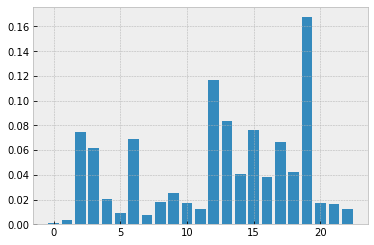

gbm
Feature 0: job_level, Score: 0.00003
Feature 1: person_level, Score: 0.00097
Feature 2: job_duration_in_current_person_level, Score: 0.14637
Feature 3: job_duration_in_current_branch, Score: 0.16813
Feature 4: Employee_type, Score: 0.00780
Feature 5: gender, Score: 0.00874
Feature 6: age, Score: 0.03138
Feature 7: marital_status_maried(Y/N), Score: 0.00499
Feature 8: number_of_dependences, Score: 0.00625
Feature 9: number_of_dependences (male), Score: 0.00567
Feature 10: number_of_dependences (female), Score: 0.00472
Feature 11: Education_level, Score: 0.00407
Feature 12: GPA, Score: 0.05165
Feature 13: year_graduated, Score: 0.03627
Feature 14: job_duration_from_training, Score: 0.05949
Feature 15: job_rotation, Score: 0.20070
Feature 16: assign_of_otherposition, Score: 0.03444
Feature 17: annual leave, Score: 0.04066
Feature 18: sick_leaves, Score: 0.04549
Feature 19: Last_achievement_%, Score: 0.12197
Feature 20: achievement_target_1, Score: 0.00165
Feature 21: achievement_targe

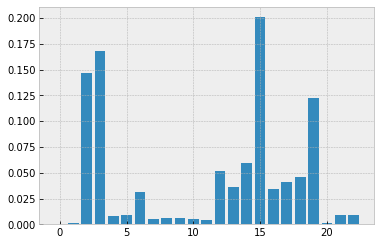

xgb
Feature 0: job_level, Score: 0.00000
Feature 1: person_level, Score: 0.01701
Feature 2: job_duration_in_current_person_level, Score: 0.05222
Feature 3: job_duration_in_current_branch, Score: 0.06167
Feature 4: Employee_type, Score: 0.03351
Feature 5: gender, Score: 0.04913
Feature 6: age, Score: 0.03987
Feature 7: marital_status_maried(Y/N), Score: 0.02829
Feature 8: number_of_dependences, Score: 0.03150
Feature 9: number_of_dependences (male), Score: 0.05249
Feature 10: number_of_dependences (female), Score: 0.01115
Feature 11: Education_level, Score: 0.03528
Feature 12: GPA, Score: 0.02841
Feature 13: year_graduated, Score: 0.04123
Feature 14: job_duration_from_training, Score: 0.06813
Feature 15: job_rotation, Score: 0.22804
Feature 16: assign_of_otherposition, Score: 0.02870
Feature 17: annual leave, Score: 0.03055
Feature 18: sick_leaves, Score: 0.02573
Feature 19: Last_achievement_%, Score: 0.03533
Feature 20: achievement_target_1, Score: 0.02382
Feature 21: achievement_targe

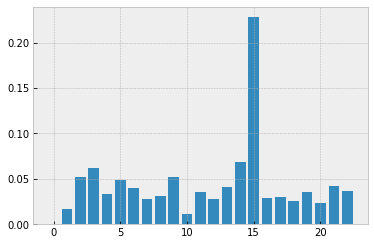

rf
Feature 0: job_level, Score: 0.00318
Feature 1: person_level, Score: 0.00405
Feature 2: job_duration_in_current_person_level, Score: 0.20044
Feature 3: job_duration_in_current_branch, Score: 0.13254
Feature 4: Employee_type, Score: 0.00664
Feature 5: gender, Score: 0.00445
Feature 6: age, Score: 0.02763
Feature 7: marital_status_maried(Y/N), Score: 0.01278
Feature 8: number_of_dependences, Score: 0.01159
Feature 9: number_of_dependences (male), Score: 0.00807
Feature 10: number_of_dependences (female), Score: 0.00454
Feature 11: Education_level, Score: 0.00391
Feature 12: GPA, Score: 0.03750
Feature 13: year_graduated, Score: 0.02749
Feature 14: job_duration_from_training, Score: 0.09362
Feature 15: job_rotation, Score: 0.22331
Feature 16: assign_of_otherposition, Score: 0.01828
Feature 17: annual leave, Score: 0.04204
Feature 18: sick_leaves, Score: 0.01988
Feature 19: Last_achievement_%, Score: 0.09236
Feature 20: achievement_target_1, Score: 0.01378
Feature 21: achievement_target

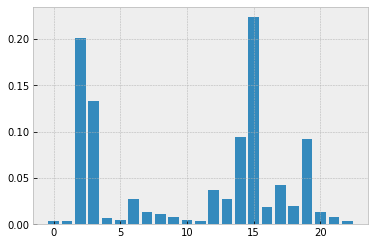

no feat imp func
****************************************************************************************************
job_level
average: 0.0010746207005359668
max: 0.003175762765596148
min: 0.0
----------------------------------------------------------------------------------------------------
person_level
average: 0.006430691881544941
max: 0.017006181180477142
min: 0.0009703324142817027
----------------------------------------------------------------------------------------------------
job_duration_in_current_person_level
average: 0.11848222530432176
max: 0.2004353764137087
min: 0.05221950262784958
----------------------------------------------------------------------------------------------------
job_duration_in_current_branch
average: 0.10595562169845527
max: 0.1681311249481597
min: 0.061481191154494505
----------------------------------------------------------------------------------------------------
Employee_type
average: 0.017157936667613862
max: 0.033509738743305206
min: 0.0066

In [ ]:
models = [dt, gbm, xgb, rf, nb]
names = ['dt', 'gbm', 'xgb', 'rf', 'nb']
show_feature_importance(models, names)

#### Evaluation

In [ ]:
y_pred_dt = dt.predict(X_val)
# y_pred_svc = svc.predict(X_val)
# y_pred_ada_dt = ada_dt.predict(X_val)
# y_pred_ada_svc = ada_svc.predict(X_val)
y_pred_gbm = gbm.predict(X_val)
y_pred_xgb = xgb.predict(X_val)
y_pred_rf = rf.predict(X_val)
y_pred_nb = nb.predict(X_val)
y_pred_gsrf = gsrf.predict(X_val)
y_pred_gslgbm = gslgbm.predict(X_val)
y_pred_gsxgb = gsxgb.predict(X_val)

In [ ]:
y_pred_proba_dt = dt.predict_proba(X_val)[:, 1]
# y_pred_proba_svc = svc.predict_proba(X_val)[:, 1]
# y_pred_proba_ada_dt = ada_dt.predict_proba(X_val)[:, 1]
# y_pred_proba_ada_svc = ada_svc.predict(X_val)[:, 1]
y_pred_proba_gbm = gbm.predict_proba(X_val)[:, 1]
y_pred_proba_xgb = xgb.predict_proba(X_val)[:, 1]
y_pred_proba_rf = rf.predict_proba(X_val)[:, 1]
y_pred_proba_nb = nb.predict_proba(X_val)[:, 1]
y_pred_proba_gsrf = gsrf.predict_proba(X_val)[:, 1]
y_pred_proba_gslgbm = gslgbm.predict_proba(X_val)[:, 1]
y_pred_proba_gsxgb = gsxgb.predict_proba(X_val)[:, 1]

y_pred_proba_avg = (
    y_pred_proba_dt +
    # y_pred_proba_ada_dt +
    y_pred_proba_gbm +
    y_pred_proba_xgb +
    y_pred_proba_rf +
    # y_pred_proba_svc +
    # y_pred_proba_ada_svc +
    y_pred_proba_nb +
    y_pred_proba_gsrf +
    y_pred_proba_gslgbm +
    y_pred_proba_gsxgb
) / 8

In [ ]:
X_ens_train = np.array([
                dt.predict_proba(X_train)[:, 1],
                # ada_dt.predict_proba(X_train)[:, 1],
                gbm.predict_proba(X_train)[:, 1],
                xgb.predict_proba(X_train)[:, 1],
                rf.predict_proba(X_train)[:, 1],
                nb.predict_proba(X_train)[:, 1],
                gsrf.predict_proba(X_train)[:, 1],
                gslgbm.predict_proba(X_train)[:, 1],
                gsxgb.predict_proba(X_train)[:, 1]
            ])

X_ens_val = np.array([
                y_pred_proba_dt,
                # y_pred_proba_ada_dt,
                y_pred_proba_gbm,
                y_pred_proba_xgb,
                y_pred_proba_rf,
                y_pred_proba_nb,
                y_pred_proba_gsrf,
                y_pred_proba_gslgbm,
                y_pred_proba_gsxgb
            ])

X_ens_train = X_ens_train.reshape(X_ens_train.shape[1], X_ens_train.shape[0])
X_ens_val = X_ens_val.reshape(X_ens_val.shape[1], X_ens_val.shape[0])

rf_ens = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, oob_score=True, n_jobs=-1)
rf_ens.fit(X_ens_train, y_train)
y_rf_ens_val = rf_ens.predict_proba(X_ens_val)[:, 1]

roc_auc_score(y_val, y_rf_ens_val)

0.5043755010938753

In [ ]:
y_pred_proba_log_dt = dt.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_svc = svc.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_ada_dt = ada_dt.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_ada_svc = ada_svc.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_gbm = gbm.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_xgb = xgb.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_rf = rf.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_nb = nb.predict_log_proba(X_val)[:, 1]

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:948: RuntimeWarning: divide by zero encountered in log
  return np.log(proba)


In [ ]:
def plot_confusion_matrix(y_test, y_pred, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, linewidths=0.5)
    plt.title(title)
    plt.show()

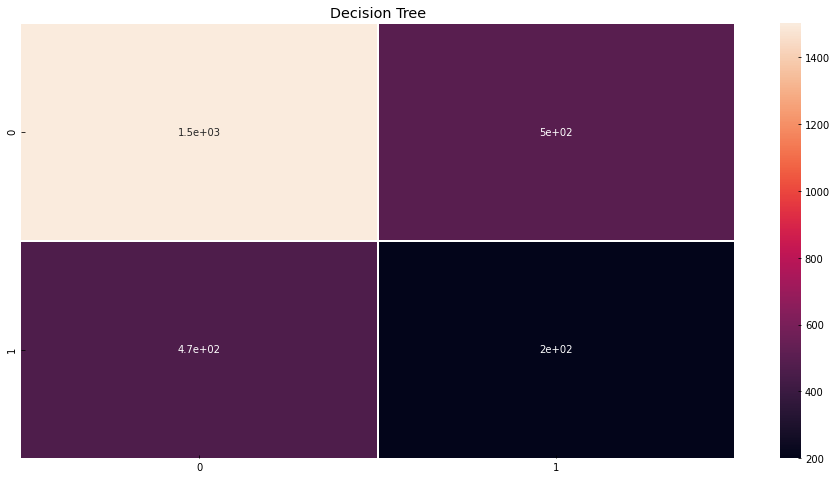

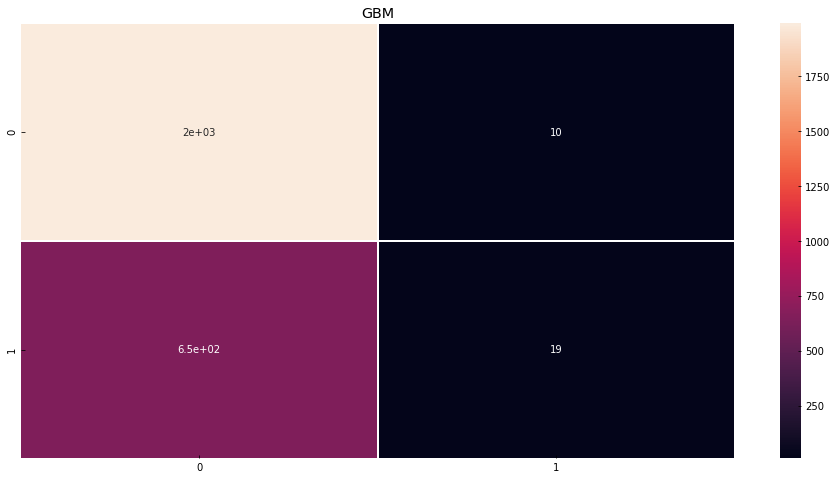

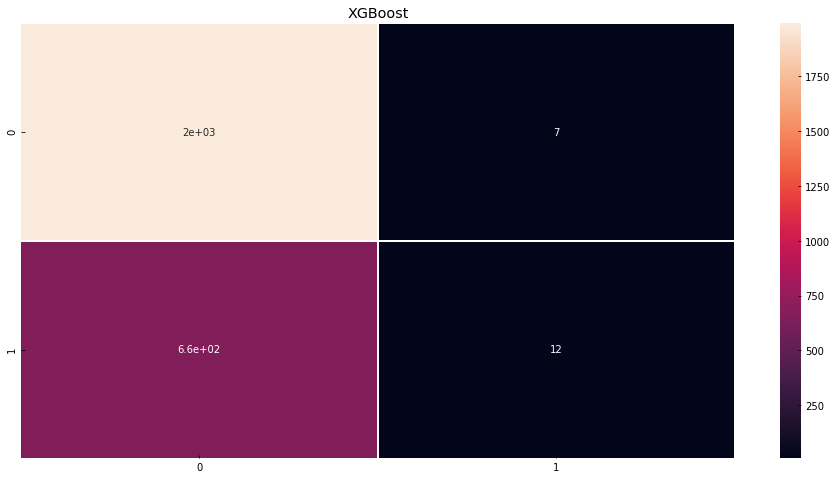

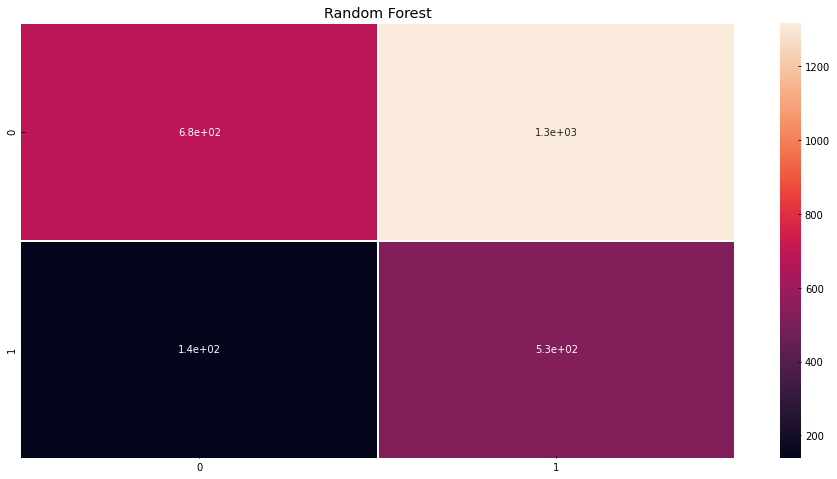

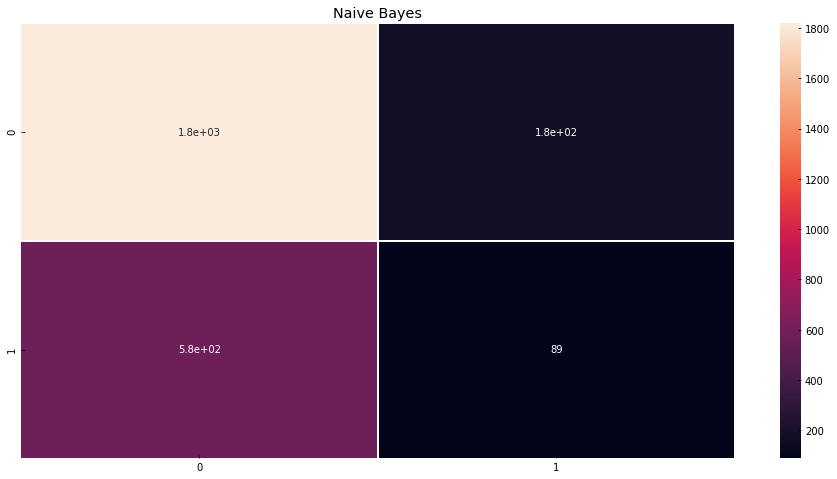

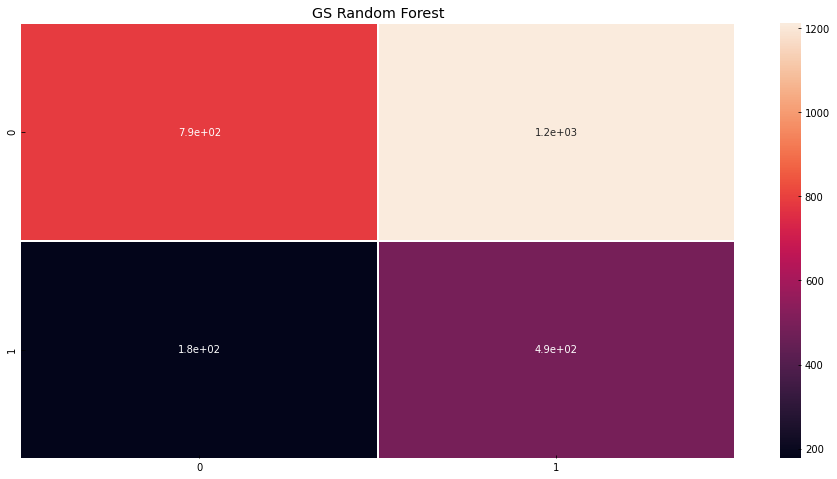

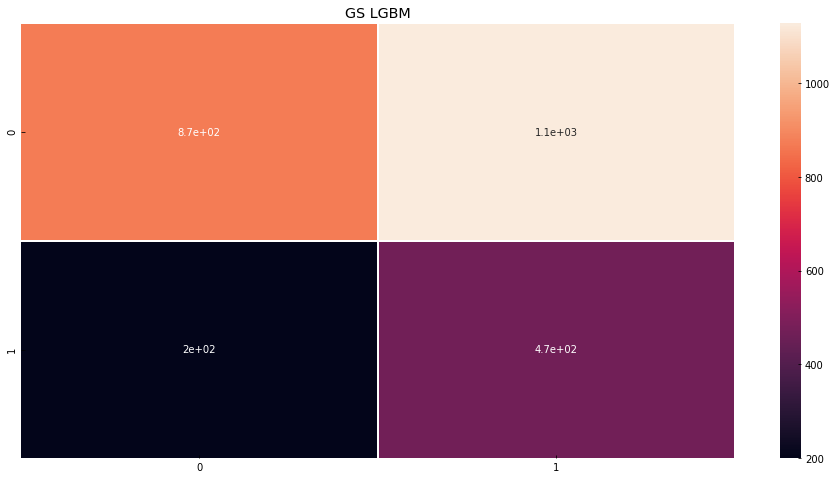

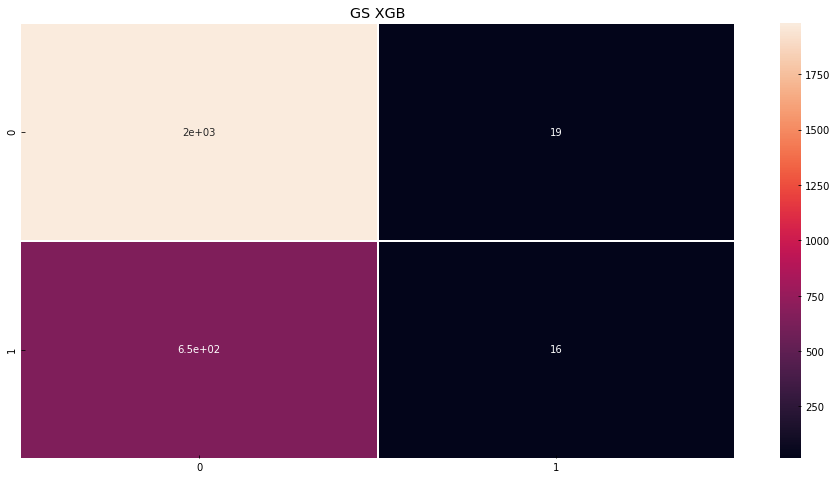

In [ ]:
plot_confusion_matrix(y_val, y_pred_dt, 'Decision Tree')
# plot_confusion_matrix(y_val, y_pred_svc, 'SVC')
# plot_confusion_matrix(y_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# plot_confusion_matrix(y_val, y_pred_ada_svc, 'AdaBoost SVC')
plot_confusion_matrix(y_val, y_pred_gbm, 'GBM')
plot_confusion_matrix(y_val, y_pred_xgb, 'XGBoost')
plot_confusion_matrix(y_val, y_pred_rf, 'Random Forest')
plot_confusion_matrix(y_val, y_pred_nb, 'Naive Bayes')
plot_confusion_matrix(y_val, y_pred_gsrf, 'GS Random Forest')
plot_confusion_matrix(y_val, y_pred_gslgbm, 'GS LGBM')
plot_confusion_matrix(y_val, y_pred_gsxgb, 'GS XGB')

In [ ]:
def print_classification_report(y_test, y_pred, title):
    print(title)
    print(classification_report(y_test, y_pred))
    print(100*'-')

In [ ]:
print_classification_report(y_val, y_pred_dt, 'Decision Tree')
# print_classification_report(y_val, y_pred_svc, 'SVC')
# print_classification_report(y_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# print_classification_report(y_val, y_pred_ada_svc, 'AdaBoost SVC')
print_classification_report(y_val, y_pred_gbm, 'GBM')
print_classification_report(y_val, y_pred_xgb, 'XGBoost')
print_classification_report(y_val, y_pred_rf, 'Random Forest')
print_classification_report(y_val, y_pred_nb, 'Naive Bayes')
print_classification_report(y_val, y_pred_gsrf, 'GS Random Forest')
print_classification_report(y_val, y_pred_gslgbm, 'GS LGBM')
print_classification_report(y_val, y_pred_gsxgb, 'GS XGB')

Decision Tree
              precision    recall  f1-score   support

           0       0.76      0.75      0.76      1999
           1       0.29      0.30      0.29       667

    accuracy                           0.64      2666
   macro avg       0.52      0.53      0.53      2666
weighted avg       0.64      0.64      0.64      2666

----------------------------------------------------------------------------------------------------
GBM
              precision    recall  f1-score   support

           0       0.75      0.99      0.86      1999
           1       0.66      0.03      0.05       667

    accuracy                           0.75      2666
   macro avg       0.70      0.51      0.46      2666
weighted avg       0.73      0.75      0.66      2666

----------------------------------------------------------------------------------------------------
XGBoost
              precision    recall  f1-score   support

           0       0.75      1.00      0.86      1999
         

In [ ]:
roc = [roc_auc_score(y_val, y_pred_dt),
    #    roc_auc_score(y_val, y_pred_ada_dt),
       roc_auc_score(y_val, y_pred_gbm),
       roc_auc_score(y_val, y_pred_xgb),
       roc_auc_score(y_val, y_pred_rf),
    #    roc_auc_score(y_val, y_pred_svc),
    #    roc_auc_score(y_val, y_pred_ada_svc),
       roc_auc_score(y_val, y_pred_nb),
       roc_auc_score(y_val, y_pred_gsrf),
       roc_auc_score(y_val, y_pred_gslgbm),
       roc_auc_score(y_val, y_pred_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5256128814032204, 0.5117416279354069, 0.5072446268111567, 0.5673871418467855, 0.5214440053610013, 0.5644148911037228, 0.5686835171708793, 0.5072416268104067]


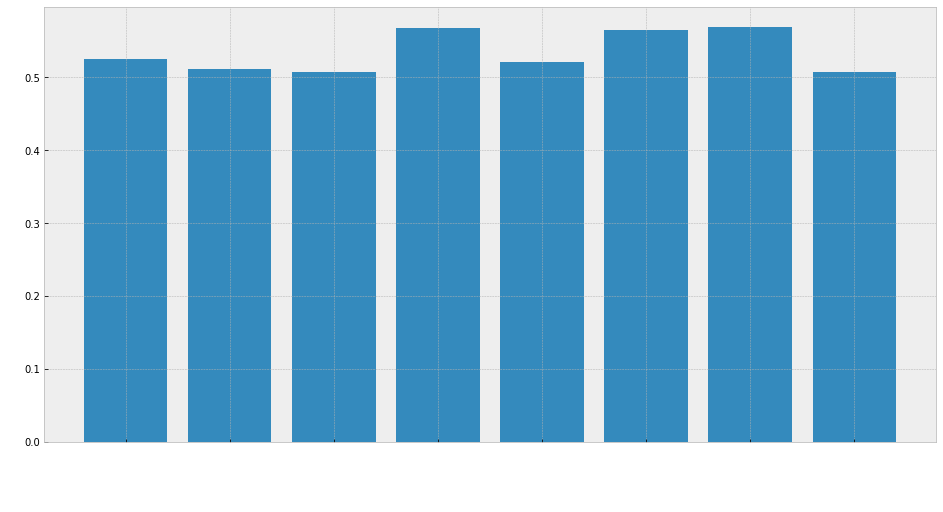

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

In [ ]:
roc = [roc_auc_score(y_val, y_pred_proba_dt),
    #    roc_auc_score(y_val, y_pred_proba_ada_dt),
       roc_auc_score(y_val, y_pred_proba_gbm),
       roc_auc_score(y_val, y_pred_proba_xgb),
       roc_auc_score(y_val, y_pred_proba_rf),
    #    roc_auc_score(y_val, y_pred_proba_svc),
    #    roc_auc_score(y_val, y_pred_proba_ada_svc),
       roc_auc_score(y_val, y_pred_proba_nb),
       roc_auc_score(y_val, y_pred_proba_avg),
       roc_auc_score(y_val, y_pred_proba_gsrf),
       roc_auc_score(y_val, y_pred_proba_gslgbm),
       roc_auc_score(y_val, y_pred_proba_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'AVG', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5256128814032204, 0.6099897774974443, 0.6105087776271945, 0.6146379036594759, 0.5741513935378484, 0.6064839016209753, 0.6053090263272565, 0.6160516540129135, 0.6214546553636638]


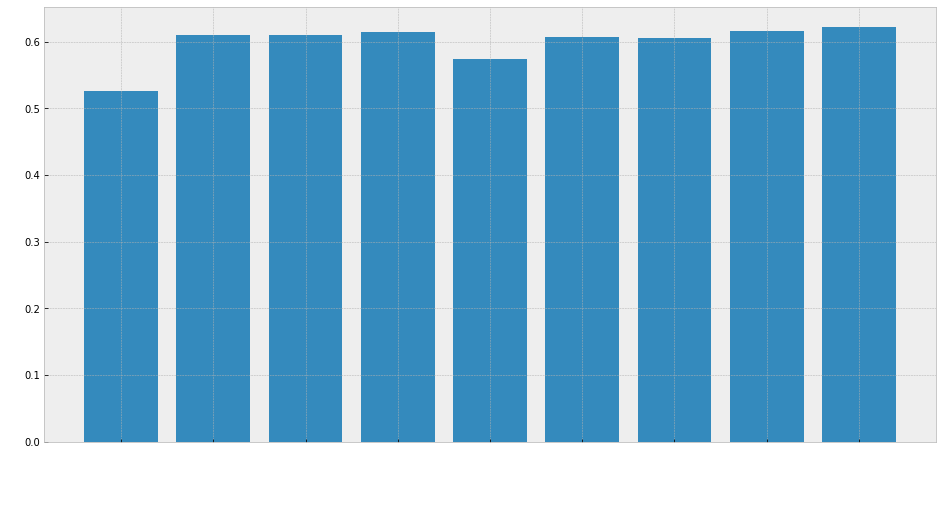

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

[1.0, 0.5139237396661325, 0.5077540437163073, 0.6214963207558104, 0.5114384997132672, 0.6201555103272589, 0.613976391429587, 0.5157585460508217]


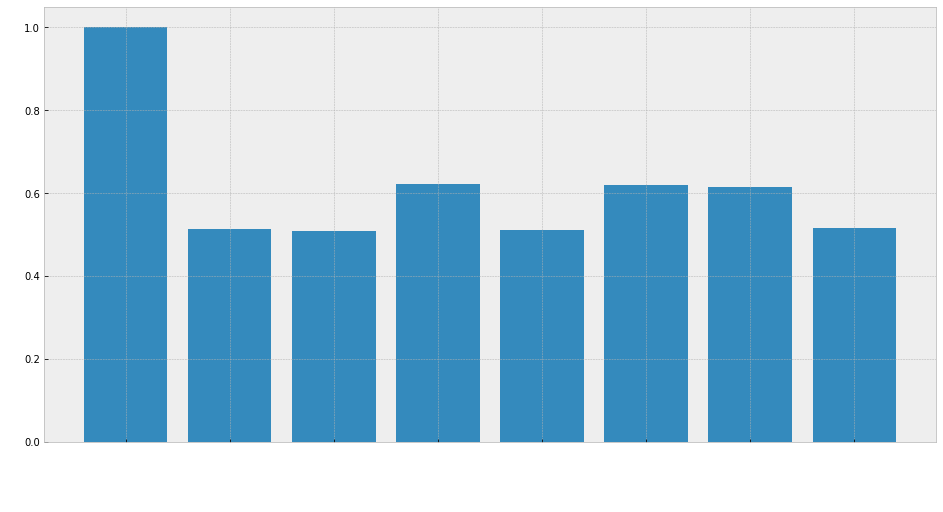

In [ ]:
# train prediction -> to check overfit
roc_train = [roc_auc_score(y_train, dt.predict(X_train)),
    #    roc_auc_score(y_train, ada_dt.predict(X_train)),
       roc_auc_score(y_train, gbm.predict(X_train)),
       roc_auc_score(y_train, xgb.predict(X_train)),
       roc_auc_score(y_train, rf.predict(X_train)),
    #    roc_auc_score(y_train, svc.predict(X_train)),
    #    roc_auc_score(y_train, ada_svc.predict(X_train)),
       roc_auc_score(y_train, nb.predict(X_train)),
       roc_auc_score(y_train, gsrf.predict(X_train)),
       roc_auc_score(y_train, gslgbm.predict(X_train)),
       roc_auc_score(y_train, gsxgb.predict(X_train))
]
print(roc_train)
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

[1.0, 0.7181680104929944, 0.7066660101179111, 0.6974650018791693, 0.5568869615671312, 0.6827839657451663, 0.6670198743312313, 0.7108092302527327]


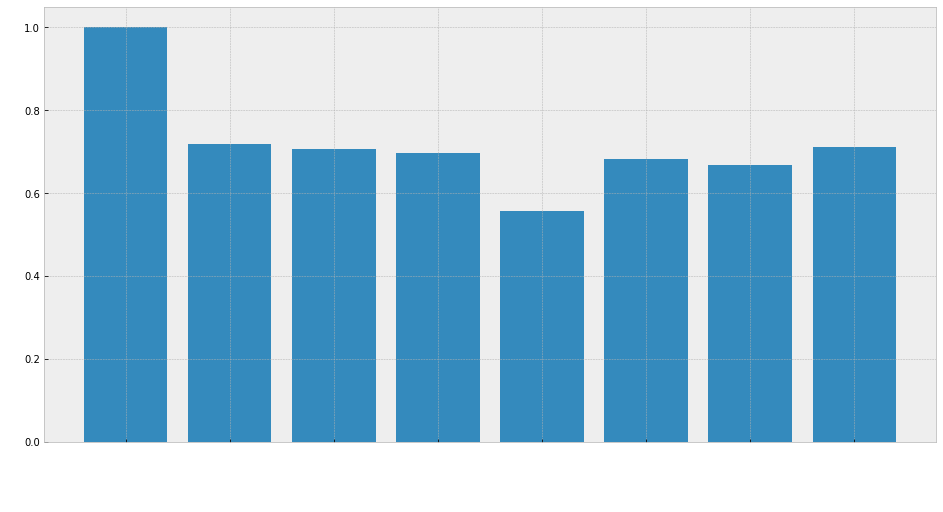

In [ ]:
# train prediction proba -> to check overfit
roc_train = [roc_auc_score(y_train, dt.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_dt.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gbm.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, xgb.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, rf.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, svc.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_svc.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, nb.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gsrf.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gslgbm.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gsxgb.predict_proba(X_train)[:, 1])
]
print(roc_train)

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
def feature_importances_performance(model, new_model, model_name, X_train, X_test, y_train, y_test):
    print(model_name)
    feature_imp = sorted(model.feature_importances_)

    for threshold in feature_imp:
        selection = SelectFromModel(model, threshold=threshold, prefit=True)

        selected_feature_X_train = selection.transform(X_train)
        new_model.fit(selected_feature_X_train, y_train)

        selected_feature_X_test = selection.transform(X_test)
        y_pred = new_model.predict_proba(selected_feature_X_test)[:,1]

        roc = roc_auc_score(y_test, y_pred)

        print(f'Threshold={threshold:.5f}, Number of features={selected_feature_X_train.shape[1]}, ROC AUC: {roc:.3f}')
    print(100*'-')

In [ ]:
# feature_importances_performance(dt, DecisionTreeClassifier(), 'Decision Tree', X_train, X_val, y_train, y_val)
# # feature_importances_performance(svc, SVC(class_weight='balanced', probability=True), 'SVC', X_train, X_test, y_train, y_test)
# # feature_importances_performance(ada_dt, AdaBoostClassifier(base_estimator=dt), 'AdaBoost Decision Tree', X_train, X_val, y_train, y_val)
# # feature_importances_performance(ada_svc, AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3), 'AdaBoost SVC', X_train, X_test, y_train, y_test)
# feature_importances_performance(gbm, GradientBoostingClassifier(), 'GradientBoosting', X_train, X_val, y_train, y_val)
# feature_importances_performance(xgb, XGBClassifier(), 'XGBoost', X_train, X_val, y_train, y_val)
# feature_importances_performance(rf, RandomForestClassifier(), 'Random Forest', X_train, X_val, y_train, y_val)
# # feature_importances_performance(nb, GaussianNB(), 'Naive Bayes', X_train, X_val, y_train, y_val)

In [ ]:
sfold = StratifiedKFold(n_splits=40)
cv_dt = DecisionTreeClassifier(class_weight=class_weights)
# cv_ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
cv_gbm = GradientBoostingClassifier()
cv_xgb = XGBClassifier(class_weight=class_weights).set_params(**gsxgb_best)
cv_rf = RandomForestClassifier(class_weight=class_weights).set_params(**gsrf_best)
cv_lgbm = LGBMClassifier(class_weight=class_weights).set_params(**gslgbm_best)
cv_nb = GaussianNB()

metrics = roc_auc_scorer

scv_r_dt = cross_val_score(cv_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_svc = cross_val_score(cv_svc, X_train, y_train, cv=sfold, verbose=True)
# scv_r_ada_dt = cross_val_score(cv_ada_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_ada_svc = cross_val_score(cv_ada_svc, X_train, y_train, cv=sfold, verbose=True)
scv_r_gbm = cross_val_score(cv_gbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_xgb = cross_val_score(cv_xgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_rf = cross_val_score(cv_rf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_nb = cross_val_score(cv_nb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_lgbm = cross_val_score(cv_lgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsrf = cross_val_score(gsrf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gslgbm = cross_val_score(gslgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsxgb = cross_val_score(gsxgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   44.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   36.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   11.7s finished


In [ ]:
print("DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_dt.mean()*100, scv_r_dt.std()*100))
# print("SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_svc.mean()*100, scv_r_svc.std()*100))
# print("AdaBoost DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_dt.mean()*100, scv_r_ada_dt.std()*100))
# print("AdaBoost SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_svc.mean()*100, scv_r_ada_svc.std()*100))
print("GBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gbm.mean()*100, scv_r_gbm.std()*100))
print("XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_xgb.mean()*100, scv_r_xgb.std()*100))
print("Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_rf.mean()*100, scv_r_rf.std()*100))
print("Naive Bayes Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_nb.mean()*100, scv_r_nb.std()*100))
print("LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_lgbm.mean()*100, scv_r_lgbm.std()*100))
# print("GS Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsrf.mean()*100, scv_r_rf.std()*100))
# print("GS LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gslgbm.mean()*100, scv_r_rf.std()*100))
# print("GS XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsxgb.mean()*100, scv_r_rf.std()*100))

DT Mean roc: 51.79%  Standard Deviation 3.71%
GBM Mean roc: 62.09%  Standard Deviation 3.84%
XGB Mean roc: 61.01%  Standard Deviation 4.13%
Random Forest Mean roc: 59.31%  Standard Deviation 3.86%
Naive Bayes Mean roc: 55.13%  Standard Deviation 4.54%
LGBM Mean roc: 61.70%  Standard Deviation 3.97%


In [ ]:
gslgbm_best

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.6,
 'learning_rate': 0.0085,
 'n_estimators': 300,
 'num_leaves': 10,
 'objective': 'binary',
 'reg_alpha': 1.6,
 'reg_lambda': 50,
 'subsample': 0.02}

In [ ]:
gsrf_best

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 6,
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'n_estimators': 15}

In [ ]:
gsxgb_best

{'colsample_bytree': 0.8,
 'gamma': 7.5,
 'max_depth': 6,
 'min_child_weight': 9,
 'subsample': 0.5}

In [ ]:
gslgbm.predict_proba(X_pred)[:, 1]

array([0.46777393, 0.5339588 , 0.56326751, 0.55387526, 0.45260802,
       0.5162326 , 0.55556584, 0.53588373, 0.5311446 , 0.5321194 ,
       0.51686018, 0.45909358, 0.47351771, 0.51226003, 0.51102558,
       0.54836479, 0.51238098, 0.48385332, 0.50650621, 0.51328352,
       0.55523746, 0.53781177, 0.66055208, 0.64972801, 0.40955843,
       0.51284253, 0.47913883, 0.51211357, 0.54881805, 0.48905007,
       0.53127626, 0.49559484, 0.53716485, 0.48197244, 0.48997219,
       0.520151  , 0.53119472, 0.56166505, 0.66568326, 0.5318721 ,
       0.55440999, 0.51349751, 0.55628867, 0.44188836, 0.5487502 ,
       0.39661032, 0.54294667, 0.47225221, 0.45870058, 0.44297667,
       0.4904159 , 0.53154885, 0.65135603, 0.48393363, 0.64250533,
       0.48015174, 0.47186488, 0.48173613, 0.55248498, 0.51034056,
       0.52447723, 0.50186644, 0.47830543, 0.47489093, 0.50550162,
       0.4718838 , 0.49113263, 0.5323436 , 0.46514395, 0.55614318,
       0.55193562, 0.5433018 , 0.4194684 , 0.49592569, 0.48028

In [ ]:
pred_df = pd.DataFrame({
    'index': test_df.index,
    'Best Performance': gslgbm.predict_proba(X_pred)[:, 1]
})

pred_df.head()
filename='bri_pa_gslgbm_orict.csv'
pred_df.to_csv(filename, index=False)
from google.colab import files
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Neural Network

#### Train

In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow.keras.layers import Input, Dense, LeakyReLU, Dropout, BatchNormalization
from tensorflow.keras.models import Model

In [ ]:
i = Input(shape=(X_train.shape[1],))
x = Dense(128, activation='relu')(i)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
x = Dense(1, activation='sigmoid')(x)

model = Model(i, x)
model.summary()
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=[tf.keras.metrics.AUC()]
)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 18)]              0         
_________________________________________________________________
dense (Dense)                (None, 128)               2432      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 27,265
Trainable params: 27,265
Non-trainable params: 0
_________________________________________________________________


In [ ]:
r = model.fit(X_train, y_train, epochs=15, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/25
125/125 [==============================] - 2s 6ms/step - loss: 0.6466 - auc: 0.5143 - val_loss: 1.0136 - val_auc: 0.0000e+00
Epoch 2/25
125/125 [==============================] - 0s 2ms/step - loss: 0.6329 - auc: 0.5780 - val_loss: 1.0570 - val_auc: 0.0000e+00
Epoch 3/25
125/125 [==============================] - 0s 2ms/step - loss: 0.6201 - auc: 0.5787 - val_loss: 1.1031 - val_auc: 0.0000e+00
Epoch 4/25
125/125 [==============================] - 0s 3ms/step - loss: 0.6243 - auc: 0.6003 - val_loss: 1.0163 - val_auc: 0.0000e+00
Epoch 5/25
125/125 [==============================] - 0s 2ms/step - loss: 0.6157 - auc: 0.6056 - val_loss: 1.0073 - val_auc: 0.0000e+00
Epoch 6/25
125/125 [==============================] - 0s 2ms/step - loss: 0.6187 - auc: 0.5839 - val_loss: 1.1093 - val_auc: 0.0000e+00
Epoch 7/25
125/125 [==============================] - 0s 2ms/step - loss: 0.6131 - auc: 0.6002 - val_loss: 1.0448 - val_auc: 0.0000e+00
Epoch 8/25
125/125 [============================

#### Model Evaluation

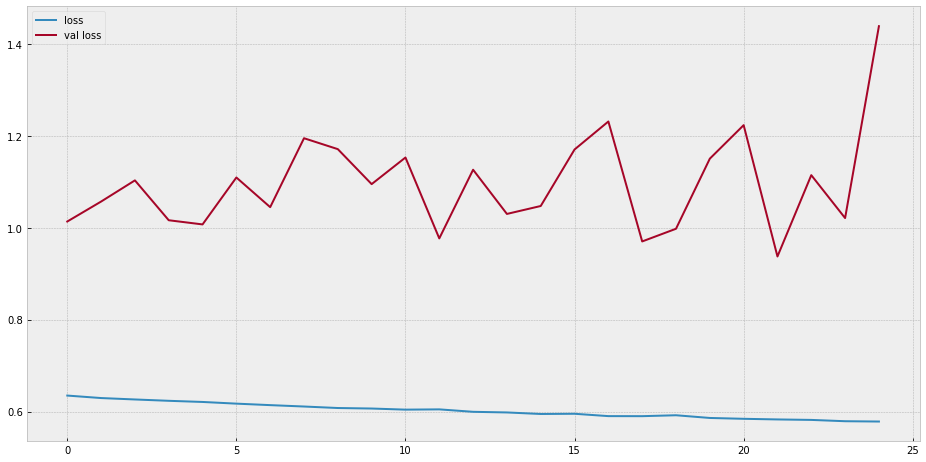

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(r.history['loss'], label='loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()

In [ ]:
# plt.figure(figsize=(16, 8))
# plt.plot(r.history['auc'], label='auc')
# plt.plot(r.history['val_auc'], label='val auc')
# plt.legend()
# plt.show()

In [ ]:
y_nn_pred = model.predict(X_val)
y_nn_pred

array([[2.29286820e-01],
       [2.24854559e-01],
       [2.83070087e-01],
       [3.31143141e-01],
       [1.42214239e-01],
       [3.43904376e-01],
       [2.76743531e-01],
       [2.48606473e-01],
       [3.29970539e-01],
       [2.51629889e-01],
       [2.83007979e-01],
       [3.57203722e-01],
       [2.84045458e-01],
       [2.93125927e-01],
       [3.25110286e-01],
       [2.36535370e-02],
       [3.46649647e-01],
       [2.90422678e-01],
       [3.07208389e-01],
       [3.83992255e-01],
       [2.68996745e-01],
       [2.88232774e-01],
       [3.59137416e-01],
       [2.65386105e-01],
       [3.20071369e-01],
       [3.10629100e-01],
       [2.92207271e-01],
       [2.75256515e-01],
       [2.77369082e-01],
       [2.80799538e-01],
       [3.02064925e-01],
       [2.42271662e-01],
       [1.98115587e-01],
       [3.33959281e-01],
       [3.26752245e-01],
       [1.89847916e-01],
       [2.60437042e-01],
       [1.39670312e-01],
       [2.77136743e-01],
       [3.06596816e-01],


In [ ]:
# print(classification_report(y_val, y_nn_pred))

In [ ]:
# plot_confusion_matrix(y_val, y_nn_pred, 'NN')

In [ ]:
roc_nn = roc_auc_score(y_val, y_nn_pred)
print(roc_nn)

0.637197143557157


### Force balanced target

#### Downsampling Data

In [ ]:
from sklearn.utils import resample

In [ ]:
imp_train_df = pd.DataFrame({
    'Best Performance': y
})

for i in range(len(all_feat_cols)):
    imp_train_df[all_feat_cols[i]] = X[:, i]

imp_train_df.head()

,Best Performance,job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,year_graduated,job_duration_as_permanent_worker,job_rotation,annual leave,Last_achievement_%,achievement_target_1,achievement_target_2,achievement_target_3
0,0,0.5,0.500000,0.31250,0.200000,0.0,0.0,0.259259,1.0,0.000000,0.8,0.20012,0.424242,0.571429,0.146341,0.788055,0.00,0.25,0.0
1,0,0.5,0.333333,0.14625,0.300000,0.5,1.0,0.500000,1.0,0.142857,0.8,0.20132,0.030303,0.071429,0.121951,0.202434,0.50,0.50,1.0
2,0,0.5,0.333333,0.24000,0.066667,0.0,1.0,0.500000,1.0,0.000000,0.8,0.20118,0.090909,0.142857,0.170732,0.820344,0.25,0.00,1.0
3,0,0.5,0.333333,0.05250,0.056000,0.5,0.0,0.537037,1.0,0.142857,0.8,0.20162,0.000000,0.000000,0.000000,0.109973,0.50,0.50,1.0
4,0,0.5,0.333333,0.22875,0.066667,0.0,1.0,0.462963,1.0,0.142857,0.8,0.20106,0.151515,0.214286,0.268293,0.812152,0.25,0.25,1.0


In [ ]:
# Separate majority and minority classes
df_majority = imp_train_df[imp_train_df['Best Performance']==0]
df_minority = imp_train_df[imp_train_df['Best Performance']==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority,
                                 replace=False,    # sample without replacement
                                 n_samples=len(df_minority),     # to match minority class
                                #  random_state=123
                                 ) # reproducible results

# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

# Display new class counts
df_downsampled['Best Performance'].value_counts()

1    2667
0    2667
Name: Best Performance, dtype: int64

In [ ]:
X = df_downsampled[all_feat_cols].values
y = df_downsampled['Best Performance'].values

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, stratify=y, test_size=0.3)
# X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train)

print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(3733, 18)
(1601, 18)
(3733,)
(1601,)


##### Normalize Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# scl = StandardScaler()
# scl = MinMaxScaler()

In [ ]:
# # X = scl.fit_transform(sorted_train_df.drop(['Best Performance'], axis=1))
# X_train = scl.fit_transform(X_train)
# X_val = scl.transform(X_val)
# X_pred = scl.transform(X_pred)

##### Train

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(y), y)
class_weights = {0: class_weights[0], 1: class_weights[1]}

In [ ]:
lgbmt_params = {
    'learning_rate': [0.0075],
    'n_estimators': [1500, 3000, 5000],
    'num_leaves': [11],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'colsample_bytree' : [0.6],
    'subsample' : [0.15],
    'reg_alpha' : [1.6],
    'reg_lambda' : [3],
}

rft_params = {
    'bootstrap': [True],
    'criterion': ['entropy'],
    'max_depth': [80, 102, 150],
    'max_features': [4],
    'min_samples_leaf': [2],
    'min_samples_split': [4],
    'n_estimators': [7]
}

xgb_params = {
    'min_child_weight': [6],
    'gamma': [7.5],
    'subsample': [0.9],
    'colsample_bytree': [0.5],
    'max_depth': [6]
}
sfold = StratifiedKFold(n_splits=10)

In [ ]:
dt = DecisionTreeClassifier(class_weight=class_weights)
# svc = SVC(class_weight=class_weights, probability=True)
# ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
gbm = GradientBoostingClassifier()
xgb = XGBClassifier(class_weight=class_weights)
rf = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, n_jobs=-1)
nb = GaussianNB()
lgbm = LGBMClassifier(class_weight=class_weights)

In [ ]:
gsrf = GridSearchCV(rf, rft_params, cv=sfold, scoring=roc_auc_scorer)
gslgbm = GridSearchCV(lgbm, lgbmt_params, cv=sfold, scoring=roc_auc_scorer)

gsrf.fit(X_train, y_train)
gslgbm.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt',
                                      class_weight={0: 1.0, 1: 1.0},
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, obje...
             iid='deprecated', n_jobs=None,
             param_grid={'boosting_type': ['gbdt'], 'colsample_bytree': [0.6],
                         'learning_rate': [0.0075],
                         'n_estimators': [1500, 3000, 5000], 'num_leaves': [11],
                         'objective': ['b

In [ ]:
gsxgb = GridSearchCV(xgb, xgb_params, cv=sfold, scoring=roc_auc_scorer)
gsxgb.fit(X_train, y_train)
gsxgb_best = gsxgb.best_params_

In [ ]:
gsrf_best = gsrf.best_params_

In [ ]:
gslgbm_best = gslgbm.best_params_

In [ ]:
nb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
# svc.fit(X_train, y_train)

In [ ]:
# ada_svc.fit(X_train, y_train)

In [ ]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight={0: 1.0, 1: 1.0},
                       criterion='gini', max_depth=None, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=None,
                       splitter='best')

In [ ]:
# ada_dt.fit(X_train, y_train)

In [ ]:
gbm.fit(X_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', class_weight={0: 1.0, 1: 1.0},
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 1.0, 1: 1.0}, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=20,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
def show_feature_importance(models, names):
    feat_imps = {}
    x_cols = sorted_train_df.columns[1:]

    for x in x_cols:
        feat_imps[x] = []

    for j in range(len(models)):
        try:
            importance = models[j].feature_importances_
            print(names[j])
            for i,v in enumerate(importance):
                feat_imps[x_cols[i]].append(v)
                print('Feature %0d: %s, Score: %.5f' % (i, x_cols[i],v))
            # plot feature importance
            plt.bar([x for x in range(len(importance))], importance)
            plt.show()
        except:
            print('no feat imp func')

    print('*'*100)
    for k, v in feat_imps.items():
        print(k)
        print(f'average: {np.mean(np.array(v))}')
        print(f'max: {np.max(np.array(v))}')
        print(f'min: {np.min(np.array(v))}')
        print('-'*100)

dt
Feature 0: job_level, Score: 0.00079
Feature 1: person_level, Score: 0.00226
Feature 2: job_duration_in_current_person_level, Score: 0.10120
Feature 3: job_duration_in_current_branch, Score: 0.07005
Feature 4: Employee_type, Score: 0.02882
Feature 5: gender, Score: 0.01856
Feature 6: age, Score: 0.09369
Feature 7: marital_status_maried(Y/N), Score: 0.01277
Feature 8: number_of_dependences, Score: 0.03654
Feature 9: Education_level, Score: 0.01183
Feature 10: year_graduated, Score: 0.11551
Feature 11: job_duration_as_permanent_worker, Score: 0.05058
Feature 12: job_rotation, Score: 0.08170
Feature 13: annual leave, Score: 0.09784
Feature 14: Last_achievement_%, Score: 0.22005
Feature 15: achievement_target_1, Score: 0.01973
Feature 16: achievement_target_2, Score: 0.01656
Feature 17: achievement_target_3, Score: 0.02151


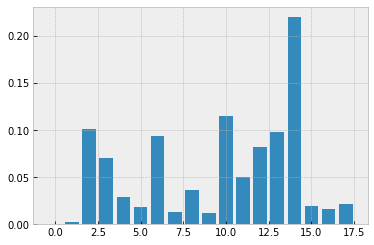

gbm
Feature 0: job_level, Score: 0.00402
Feature 1: person_level, Score: 0.00316
Feature 2: job_duration_in_current_person_level, Score: 0.13896
Feature 3: job_duration_in_current_branch, Score: 0.15468
Feature 4: Employee_type, Score: 0.00121
Feature 5: gender, Score: 0.00265
Feature 6: age, Score: 0.05882
Feature 7: marital_status_maried(Y/N), Score: 0.00368
Feature 8: number_of_dependences, Score: 0.01253
Feature 9: Education_level, Score: 0.01110
Feature 10: year_graduated, Score: 0.04677
Feature 11: job_duration_as_permanent_worker, Score: 0.02899
Feature 12: job_rotation, Score: 0.26847
Feature 13: annual leave, Score: 0.04780
Feature 14: Last_achievement_%, Score: 0.18187
Feature 15: achievement_target_1, Score: 0.01279
Feature 16: achievement_target_2, Score: 0.01961
Feature 17: achievement_target_3, Score: 0.00290


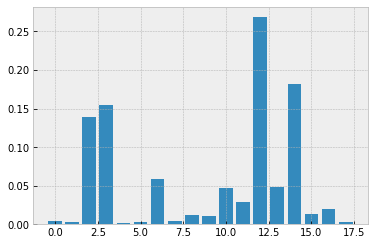

xgb
Feature 0: job_level, Score: 0.00000
Feature 1: person_level, Score: 0.05736
Feature 2: job_duration_in_current_person_level, Score: 0.06213
Feature 3: job_duration_in_current_branch, Score: 0.06330
Feature 4: Employee_type, Score: 0.05080
Feature 5: gender, Score: 0.03727
Feature 6: age, Score: 0.03683
Feature 7: marital_status_maried(Y/N), Score: 0.04473
Feature 8: number_of_dependences, Score: 0.03723
Feature 9: Education_level, Score: 0.05011
Feature 10: year_graduated, Score: 0.04045
Feature 11: job_duration_as_permanent_worker, Score: 0.04323
Feature 12: job_rotation, Score: 0.21555
Feature 13: annual leave, Score: 0.03912
Feature 14: Last_achievement_%, Score: 0.05521
Feature 15: achievement_target_1, Score: 0.06012
Feature 16: achievement_target_2, Score: 0.04985
Feature 17: achievement_target_3, Score: 0.05670


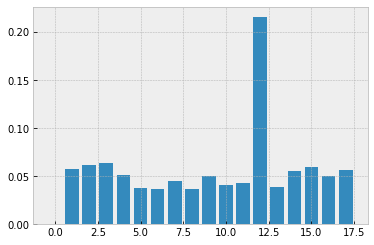

rf
Feature 0: job_level, Score: 0.00394
Feature 1: person_level, Score: 0.01011
Feature 2: job_duration_in_current_person_level, Score: 0.20315
Feature 3: job_duration_in_current_branch, Score: 0.10932
Feature 4: Employee_type, Score: 0.00848
Feature 5: gender, Score: 0.00584
Feature 6: age, Score: 0.04407
Feature 7: marital_status_maried(Y/N), Score: 0.00563
Feature 8: number_of_dependences, Score: 0.01735
Feature 9: Education_level, Score: 0.01154
Feature 10: year_graduated, Score: 0.04959
Feature 11: job_duration_as_permanent_worker, Score: 0.10255
Feature 12: job_rotation, Score: 0.22904
Feature 13: annual leave, Score: 0.05389
Feature 14: Last_achievement_%, Score: 0.10755
Feature 15: achievement_target_1, Score: 0.01595
Feature 16: achievement_target_2, Score: 0.01469
Feature 17: achievement_target_3, Score: 0.00731


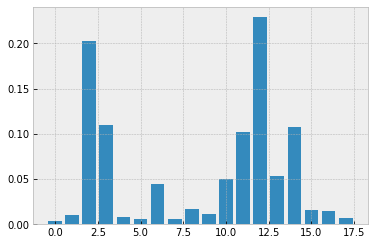

no feat imp func
****************************************************************************************************
job_level
average: 0.002186557369989095
max: 0.004019984802543267
min: 0.0
----------------------------------------------------------------------------------------------------
person_level
average: 0.018224368209192696
max: 0.05736290290951729
min: 0.0022628307439701628
----------------------------------------------------------------------------------------------------
job_duration_in_current_person_level
average: 0.12635967796783903
max: 0.2031521539775221
min: 0.062126316130161285
----------------------------------------------------------------------------------------------------
job_duration_in_current_branch
average: 0.099337240762834
max: 0.15467742757736944
min: 0.06329900771379471
----------------------------------------------------------------------------------------------------
Employee_type
average: 0.02232593281444784
max: 0.050797343254089355
min: 0.00120648

In [ ]:
models = [dt, gbm, xgb, rf, nb]
names = ['dt', 'gbm', 'xgb', 'rf', 'nb']
show_feature_importance(models, names)

##### Evaluation

In [ ]:
y_pred_dt = dt.predict(X_val)
# y_pred_svc = svc.predict(X_val)
# y_pred_ada_dt = ada_dt.predict(X_val)
# y_pred_ada_svc = ada_svc.predict(X_val)
y_pred_gbm = gbm.predict(X_val)
y_pred_xgb = xgb.predict(X_val)
y_pred_rf = rf.predict(X_val)
y_pred_nb = nb.predict(X_val)
y_pred_gsrf = gsrf.predict(X_val)
y_pred_gslgbm = gslgbm.predict(X_val)
y_pred_gsxgb = gsxgb.predict(X_val)

In [ ]:
y_pred_proba_dt = dt.predict_proba(X_val)[:, 1]
# y_pred_proba_svc = svc.predict_proba(X_val)[:, 1]
# y_pred_proba_ada_dt = ada_dt.predict_proba(X_val)[:, 1]
# y_pred_proba_ada_svc = ada_svc.predict(X_val)[:, 1]
y_pred_proba_gbm = gbm.predict_proba(X_val)[:, 1]
y_pred_proba_xgb = xgb.predict_proba(X_val)[:, 1]
y_pred_proba_rf = rf.predict_proba(X_val)[:, 1]
y_pred_proba_nb = nb.predict_proba(X_val)[:, 1]
y_pred_proba_gsrf = gsrf.predict_proba(X_val)[:, 1]
y_pred_proba_gslgbm = gslgbm.predict_proba(X_val)[:, 1]
y_pred_proba_gsxgb = gsxgb.predict_proba(X_val)[:, 1]

y_pred_proba_avg = (
    y_pred_proba_dt +
    # y_pred_proba_ada_dt +
    y_pred_proba_gbm +
    y_pred_proba_xgb +
    y_pred_proba_rf +
    # y_pred_proba_svc +
    # y_pred_proba_ada_svc +
    y_pred_proba_nb +
    y_pred_proba_gsrf +
    y_pred_proba_gslgbm +
    y_pred_proba_gsxgb
) / 8

In [ ]:
X_ens_train = np.array([
                dt.predict_proba(X_train)[:, 1],
                # ada_dt.predict_proba(X_train)[:, 1],
                gbm.predict_proba(X_train)[:, 1],
                xgb.predict_proba(X_train)[:, 1],
                rf.predict_proba(X_train)[:, 1],
                nb.predict_proba(X_train)[:, 1],
                gsrf.predict_proba(X_train)[:, 1],
                gslgbm.predict_proba(X_train)[:, 1],
                gsxgb.predict_proba(X_train)[:, 1]
            ])

X_ens_val = np.array([
                y_pred_proba_dt,
                # y_pred_proba_ada_dt,
                y_pred_proba_gbm,
                y_pred_proba_xgb,
                y_pred_proba_rf,
                y_pred_proba_nb,
                y_pred_proba_gsrf,
                y_pred_proba_gslgbm,
                y_pred_proba_gsxgb
            ])

X_ens_train = X_ens_train.reshape(X_ens_train.shape[1], X_ens_train.shape[0])
X_ens_val = X_ens_val.reshape(X_ens_val.shape[1], X_ens_val.shape[0])

rf_ens = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, oob_score=True, n_jobs=-1)
rf_ens.fit(X_ens_train, y_train)
y_rf_ens_val = rf_ens.predict_proba(X_ens_val)[:, 1]

roc_auc_score(y_val, y_rf_ens_val)

0.49889903245942574

In [ ]:
y_pred_proba_log_dt = dt.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_svc = svc.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_ada_dt = ada_dt.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_ada_svc = ada_svc.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_gbm = gbm.predict_log_proba(X_val)[:, 1]
# y_pred_proba_log_xgb = xgb.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_rf = rf.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_nb = nb.predict_log_proba(X_val)[:, 1]

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:948: RuntimeWarning: divide by zero encountered in log
  return np.log(proba)


In [ ]:
def plot_confusion_matrix(y_test, y_pred, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, linewidths=0.5)
    plt.title(title)
    plt.show()

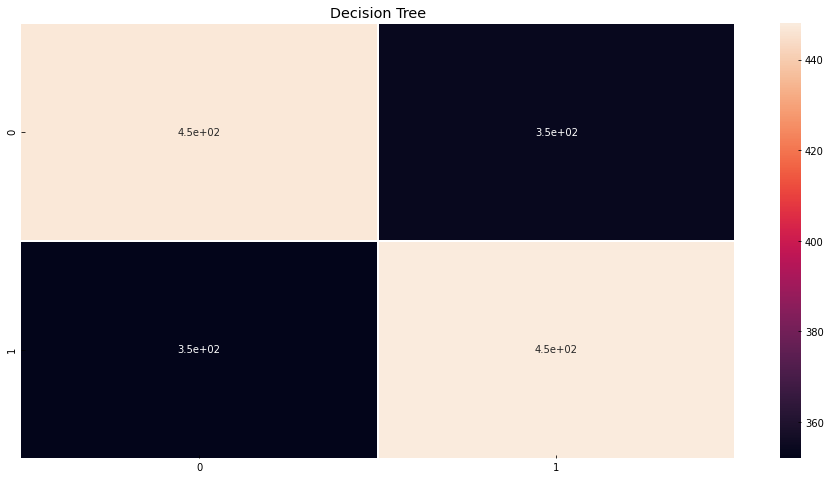

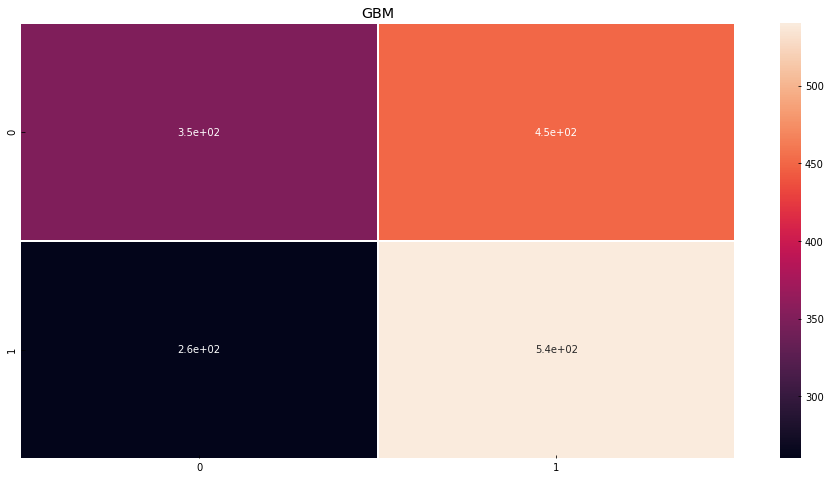

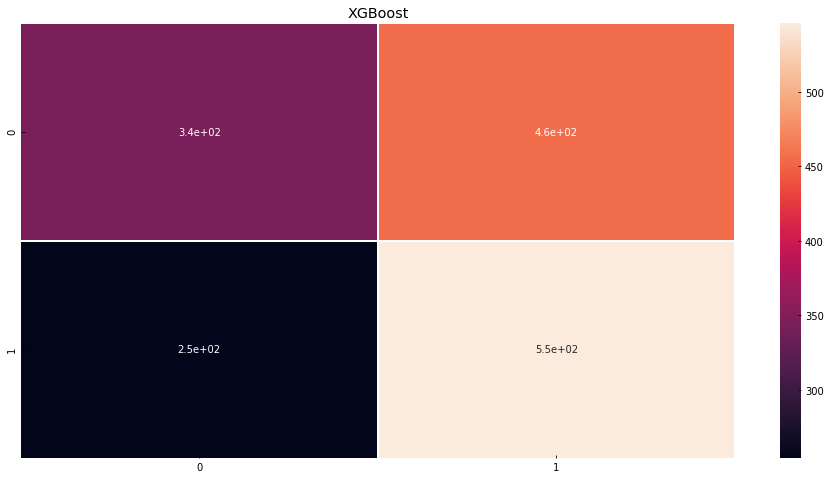

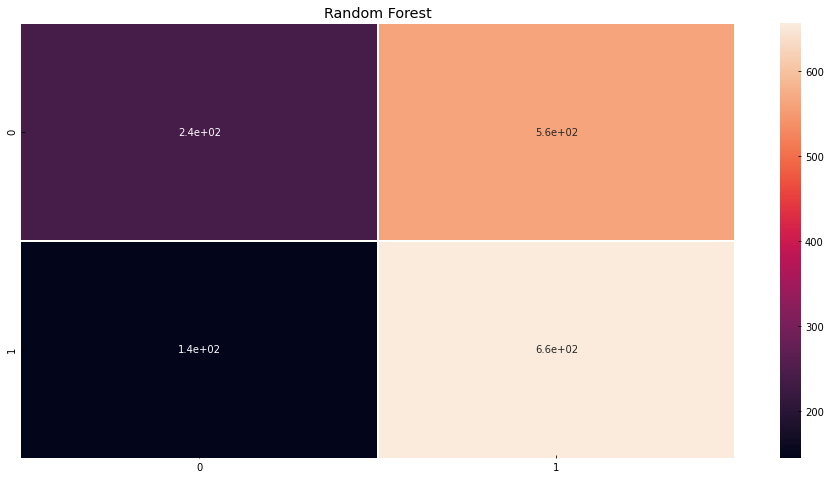

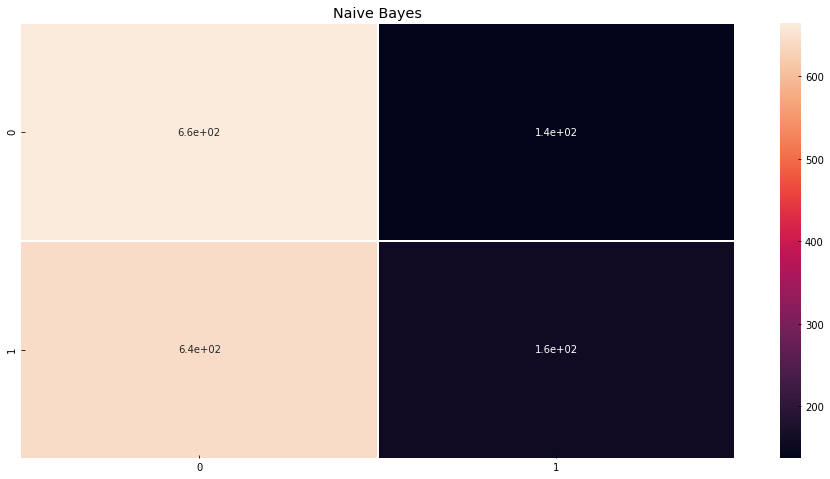

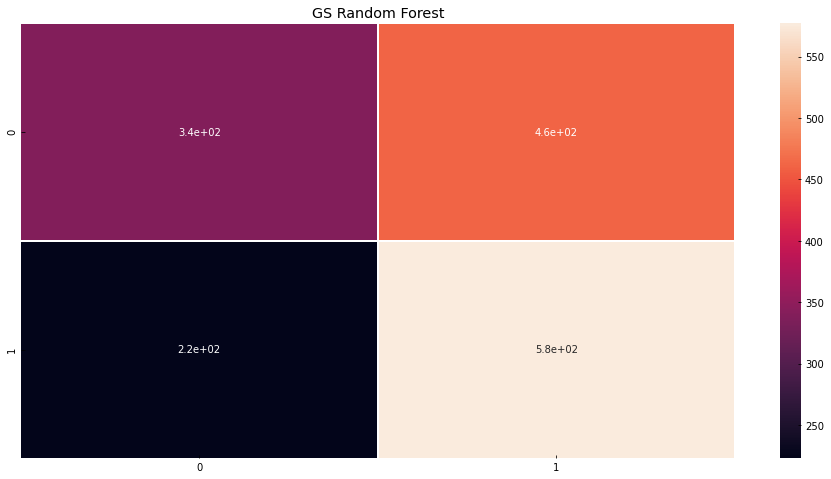

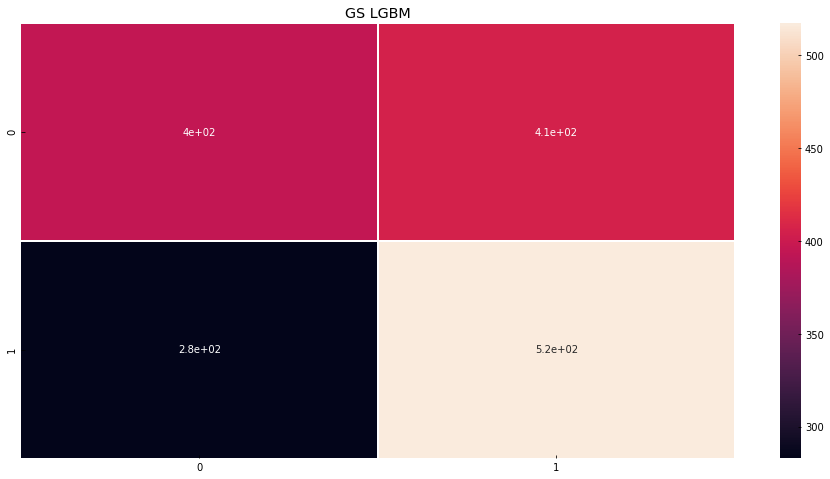

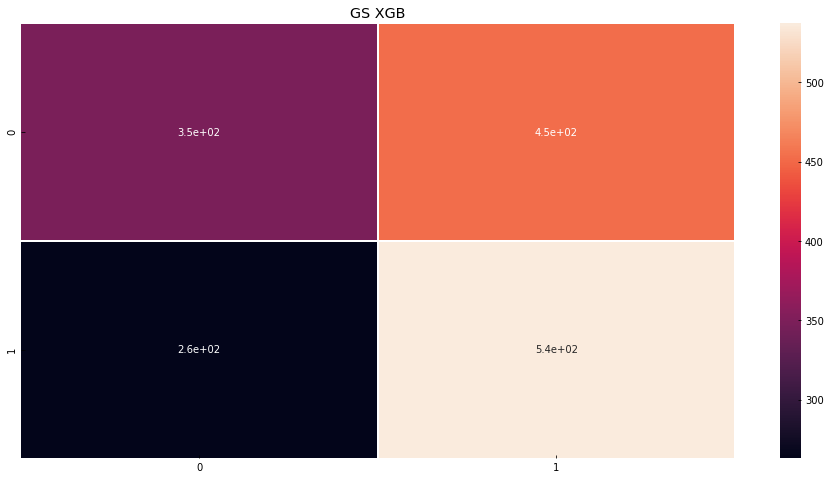

In [ ]:
plot_confusion_matrix(y_val, y_pred_dt, 'Decision Tree')
# plot_confusion_matrix(y_val, y_pred_svc, 'SVC')
# plot_confusion_matrix(y_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# plot_confusion_matrix(y_val, y_pred_ada_svc, 'AdaBoost SVC')
plot_confusion_matrix(y_val, y_pred_gbm, 'GBM')
plot_confusion_matrix(y_val, y_pred_xgb, 'XGBoost')
plot_confusion_matrix(y_val, y_pred_rf, 'Random Forest')
plot_confusion_matrix(y_val, y_pred_nb, 'Naive Bayes')
plot_confusion_matrix(y_val, y_pred_gsrf, 'GS Random Forest')
plot_confusion_matrix(y_val, y_pred_gslgbm, 'GS LGBM')
plot_confusion_matrix(y_val, y_pred_gsxgb, 'GS XGB')

In [ ]:
def print_classification_report(y_test, y_pred, title):
    print(title)
    print(classification_report(y_test, y_pred))
    print(100*'-')

In [ ]:
print_classification_report(y_val, y_pred_dt, 'Decision Tree')
# print_classification_report(y_val, y_pred_svc, 'SVC')
# print_classification_report(y_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# print_classification_report(y_val, y_pred_ada_svc, 'AdaBoost SVC')
print_classification_report(y_val, y_pred_gbm, 'GBM')
print_classification_report(y_val, y_pred_xgb, 'XGBoost')
print_classification_report(y_val, y_pred_rf, 'Random Forest')
print_classification_report(y_val, y_pred_nb, 'Naive Bayes')
print_classification_report(y_val, y_pred_gsrf, 'GS Random Forest')
print_classification_report(y_val, y_pred_gslgbm, 'GS LGBM')
print_classification_report(y_val, y_pred_gsxgb, 'GS XGB')

Decision Tree
              precision    recall  f1-score   support

           0       0.56      0.56      0.56       801
           1       0.56      0.56      0.56       800

    accuracy                           0.56      1601
   macro avg       0.56      0.56      0.56      1601
weighted avg       0.56      0.56      0.56      1601

----------------------------------------------------------------------------------------------------
GBM
              precision    recall  f1-score   support

           0       0.57      0.44      0.50       801
           1       0.54      0.68      0.60       800

    accuracy                           0.56      1601
   macro avg       0.56      0.56      0.55      1601
weighted avg       0.56      0.56      0.55      1601

----------------------------------------------------------------------------------------------------
XGBoost
              precision    recall  f1-score   support

           0       0.58      0.43      0.49       801
         

In [ ]:
roc = [roc_auc_score(y_val, y_pred_dt),
    #    roc_auc_score(y_val, y_pred_ada_dt),
       roc_auc_score(y_val, y_pred_gbm),
       roc_auc_score(y_val, y_pred_xgb),
       roc_auc_score(y_val, y_pred_rf),
    #    roc_auc_score(y_val, y_pred_svc),
    #    roc_auc_score(y_val, y_pred_ada_svc),
       roc_auc_score(y_val, y_pred_nb),
       roc_auc_score(y_val, y_pred_gsrf),
       roc_auc_score(y_val, y_pred_gslgbm),
       roc_auc_score(y_val, y_pred_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5590262172284645, 0.5559769038701623, 0.5566058052434457, 0.5585642946317103, 0.5132318976279651, 0.572859706616729, 0.5696917915106117, 0.5528534644194757]


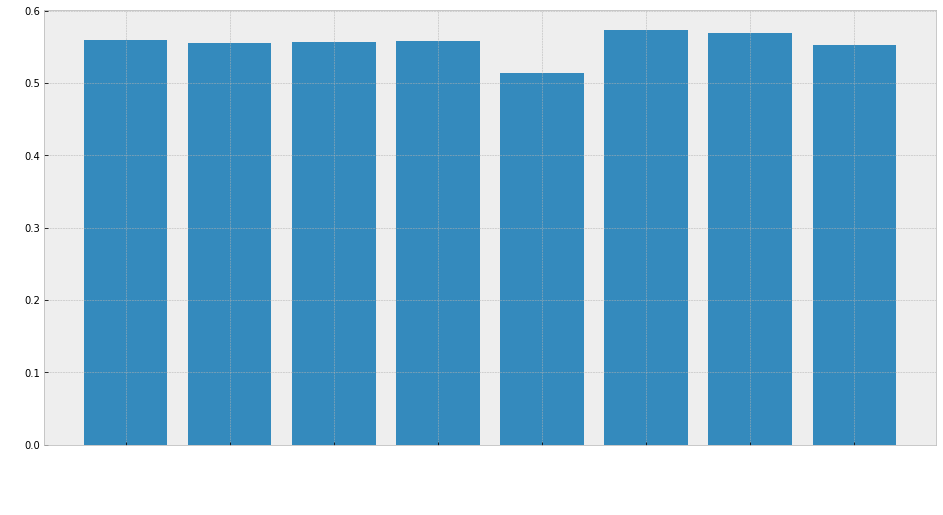

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

In [ ]:
roc = [roc_auc_score(y_val, y_pred_proba_dt),
    #    roc_auc_score(y_val, y_pred_proba_ada_dt),
       roc_auc_score(y_val, y_pred_proba_gbm),
       roc_auc_score(y_val, y_pred_proba_xgb),
       roc_auc_score(y_val, y_pred_proba_rf),
    #    roc_auc_score(y_val, y_pred_proba_svc),
    #    roc_auc_score(y_val, y_pred_proba_ada_svc),
       roc_auc_score(y_val, y_pred_proba_nb),
       roc_auc_score(y_val, y_pred_proba_avg),
       roc_auc_score(y_val, y_pred_proba_gsrf),
       roc_auc_score(y_val, y_pred_proba_gslgbm),
       roc_auc_score(y_val, y_pred_proba_gsxgb)
]
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'AVG', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5587515605493134, 0.604073033707865, 0.6009480337078652, 0.6069865792759052, 0.5495973782771535, 0.6132771535580525, 0.606147784019975, 0.6127824594257179, 0.5965644506866418]


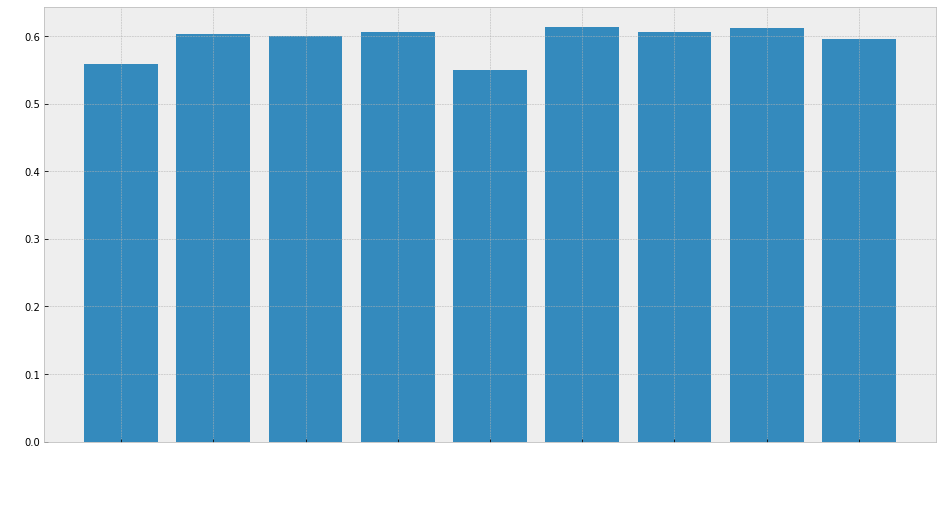

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

[0.9994643813604713, 0.6793201547036558, 0.6774462070679845, 0.6439167959786694, 0.5122738762198528, 0.6278727788044279, 0.7197774455755777, 0.657619993214349]


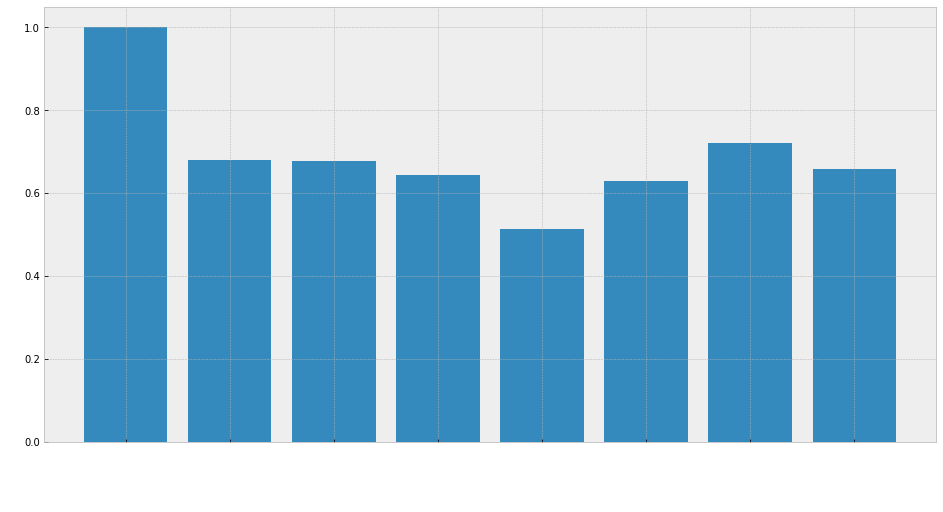

In [ ]:
# train prediction -> to check overfit
roc_train = [roc_auc_score(y_train, dt.predict(X_train)),
    #    roc_auc_score(y_train, ada_dt.predict(X_train)),
       roc_auc_score(y_train, gbm.predict(X_train)),
       roc_auc_score(y_train, xgb.predict(X_train)),
       roc_auc_score(y_train, rf.predict(X_train)),
    #    roc_auc_score(y_train, svc.predict(X_train)),
    #    roc_auc_score(y_train, ada_svc.predict(X_train)),
       roc_auc_score(y_train, nb.predict(X_train)),
       roc_auc_score(y_train, gsrf.predict(X_train)),
       roc_auc_score(y_train, gslgbm.predict(X_train)),
       roc_auc_score(y_train, gsxgb.predict(X_train))
]
print(roc_train)
label = ['DT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

[0.999999425917857, 0.7580542289474033, 0.7532263416443205, 0.743632567909612, 0.5565226926059942, 0.6868254176017029, 0.8031717751366173, 0.7142437242775319]


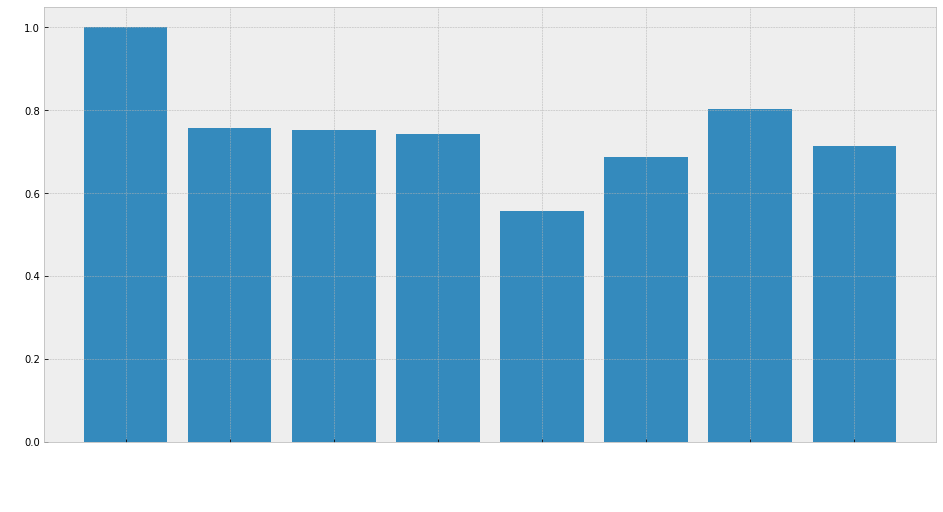

In [ ]:
# train prediction proba -> to check overfit
roc_train = [roc_auc_score(y_train, dt.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_dt.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gbm.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, xgb.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, rf.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, svc.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_svc.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, nb.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gsrf.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gslgbm.predict_proba(X_train)[:, 1]),
       roc_auc_score(y_train, gsxgb.predict_proba(X_train)[:, 1])
]
print(roc_train)

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
def feature_importances_performance(model, new_model, model_name, X_train, X_test, y_train, y_test):
    print(model_name)
    feature_imp = sorted(model.feature_importances_)

    for threshold in feature_imp:
        selection = SelectFromModel(model, threshold=threshold, prefit=True)

        selected_feature_X_train = selection.transform(X_train)
        new_model.fit(selected_feature_X_train, y_train)

        selected_feature_X_test = selection.transform(X_test)
        y_pred = new_model.predict_proba(selected_feature_X_test)[:,1]

        roc = roc_auc_score(y_test, y_pred)

        print(f'Threshold={threshold:.5f}, Number of features={selected_feature_X_train.shape[1]}, ROC AUC: {roc:.3f}')
    print(100*'-')

In [ ]:
# feature_importances_performance(dt, DecisionTreeClassifier(), 'Decision Tree', X_train, X_val, y_train, y_val)
# # feature_importances_performance(svc, SVC(class_weight='balanced', probability=True), 'SVC', X_train, X_test, y_train, y_test)
# # feature_importances_performance(ada_dt, AdaBoostClassifier(base_estimator=dt), 'AdaBoost Decision Tree', X_train, X_val, y_train, y_val)
# # feature_importances_performance(ada_svc, AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3), 'AdaBoost SVC', X_train, X_test, y_train, y_test)
# feature_importances_performance(gbm, GradientBoostingClassifier(), 'GradientBoosting', X_train, X_val, y_train, y_val)
# feature_importances_performance(xgb, XGBClassifier(), 'XGBoost', X_train, X_val, y_train, y_val)
# feature_importances_performance(rf, RandomForestClassifier(), 'Random Forest', X_train, X_val, y_train, y_val)
# # feature_importances_performance(nb, GaussianNB(), 'Naive Bayes', X_train, X_val, y_train, y_val)

In [ ]:
sfold = StratifiedKFold(n_splits=40)
cv_dt = DecisionTreeClassifier(class_weight=class_weights)
# cv_ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
cv_gbm = GradientBoostingClassifier()
cv_xgb = XGBClassifier(class_weight=class_weights).set_params(**gsxgb_best)
cv_rf = RandomForestClassifier(class_weight=class_weights).set_params(**gsrf_best)
cv_lgbm = LGBMClassifier(class_weight=class_weights).set_params(**gslgbm_best)
cv_nb = GaussianNB()

metrics = roc_auc_scorer

scv_r_dt = cross_val_score(cv_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_svc = cross_val_score(cv_svc, X_train, y_train, cv=sfold, verbose=True)
# scv_r_ada_dt = cross_val_score(cv_ada_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_ada_svc = cross_val_score(cv_ada_svc, X_train, y_train, cv=sfold, verbose=True)
scv_r_gbm = cross_val_score(cv_gbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_xgb = cross_val_score(cv_xgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_rf = cross_val_score(cv_rf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_nb = cross_val_score(cv_nb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_lgbm = cross_val_score(cv_lgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsrf = cross_val_score(gsrf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gslgbm = cross_val_score(gslgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsxgb = cross_val_score(gsxgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   17.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   27.8s finished


In [ ]:
print("DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_dt.mean()*100, scv_r_dt.std()*100))
# print("SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_svc.mean()*100, scv_r_svc.std()*100))
# print("AdaBoost DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_dt.mean()*100, scv_r_ada_dt.std()*100))
# print("AdaBoost SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_svc.mean()*100, scv_r_ada_svc.std()*100))
print("GBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gbm.mean()*100, scv_r_gbm.std()*100))
print("XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_xgb.mean()*100, scv_r_xgb.std()*100))
print("Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_rf.mean()*100, scv_r_rf.std()*100))
print("Naive Bayes Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_nb.mean()*100, scv_r_nb.std()*100))
print("LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_lgbm.mean()*100, scv_r_lgbm.std()*100))
# print("GS Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsrf.mean()*100, scv_r_rf.std()*100))
# print("GS LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gslgbm.mean()*100, scv_r_rf.std()*100))
# print("GS XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsxgb.mean()*100, scv_r_rf.std()*100))

DT Mean roc: 55.00%  Standard Deviation 4.93%
GBM Mean roc: 60.48%  Standard Deviation 5.66%
XGB Mean roc: 61.16%  Standard Deviation 5.90%
Random Forest Mean roc: 59.38%  Standard Deviation 6.91%
Naive Bayes Mean roc: 55.03%  Standard Deviation 6.49%
LGBM Mean roc: 61.88%  Standard Deviation 5.57%


In [ ]:
gbm.predict_proba(X_pred)[:, 1]

array([0.50226554, 0.51970514, 0.59595664, 0.51438547, 0.38091688,
       0.51637185, 0.4765875 , 0.53558033, 0.54821763, 0.55752093,
       0.51709154, 0.37267287, 0.54317354, 0.51102098, 0.52130921,
       0.58156521, 0.43000173, 0.49932416, 0.54172351, 0.51569364,
       0.6427354 , 0.50038124, 0.67314752, 0.63276439, 0.39044198,
       0.47223855, 0.51270966, 0.48453577, 0.55708927, 0.53452264,
       0.69244164, 0.79694374, 0.44323506, 0.5106153 , 0.51099681,
       0.52871482, 0.53666176, 0.67769384, 0.68927265, 0.55987004,
       0.54099306, 0.60157361, 0.54994546, 0.51698154, 0.54192052,
       0.35716158, 0.57748992, 0.53570316, 0.41439079, 0.49655718,
       0.53405542, 0.52010819, 0.65614038, 0.49330863, 0.62787068,
       0.51721832, 0.47965122, 0.53436361, 0.56801347, 0.52555704,
       0.46531198, 0.45246986, 0.48447031, 0.41447662, 0.52650462,
       0.38213152, 0.48429129, 0.64477334, 0.60329948, 0.68100936,
       0.55394091, 0.48316237, 0.53080953, 0.53271218, 0.41098

In [ ]:
# pred_df = pd.DataFrame({
#     'index': test_df.index,
#     'Best Performance': gbm.predict_proba(X_pred)[:, 1]
# })

# pred_df.head()
# filename='bri_pa_gbm_down.csv'
# pred_df.to_csv(filename, index=False)
# from google.colab import files
# files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Feature Transform

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


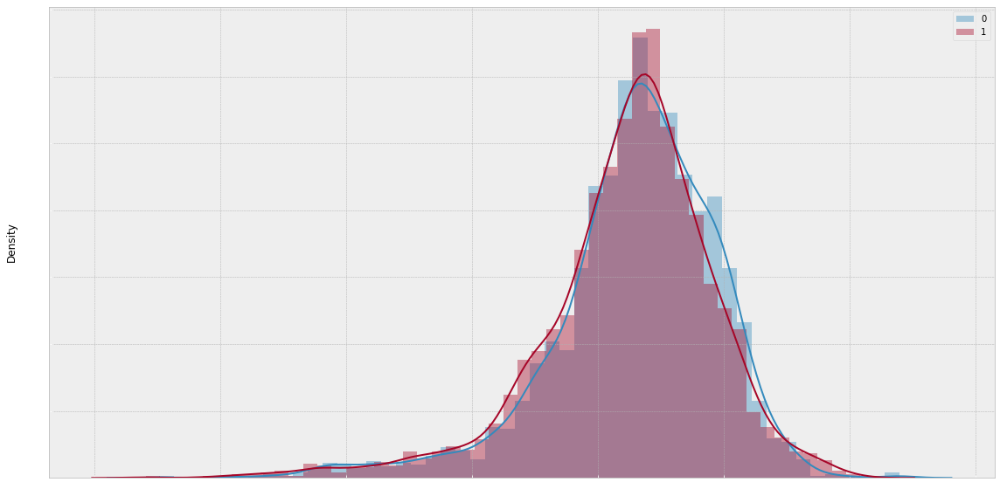

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


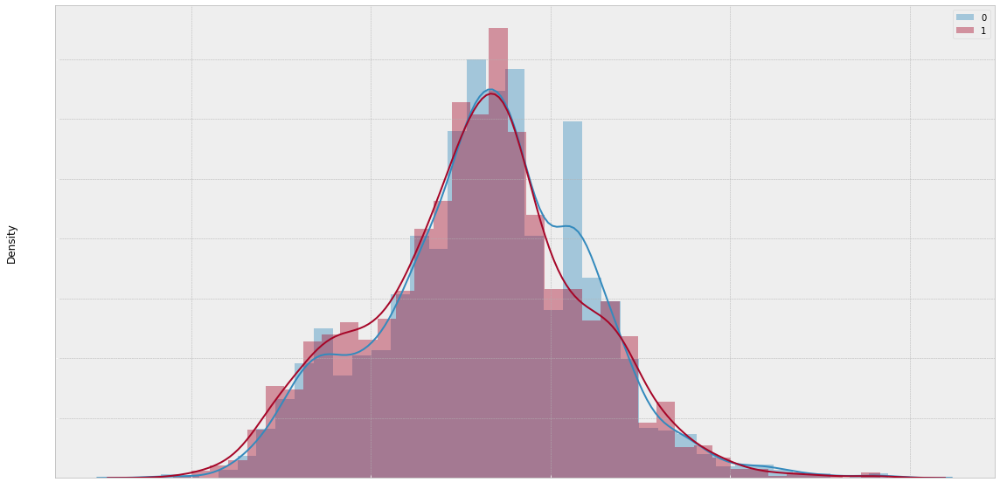

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


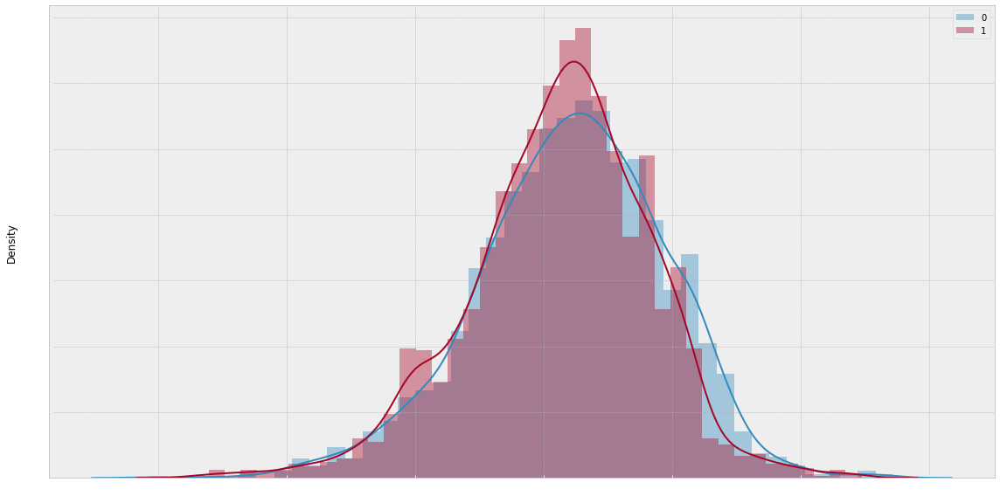

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


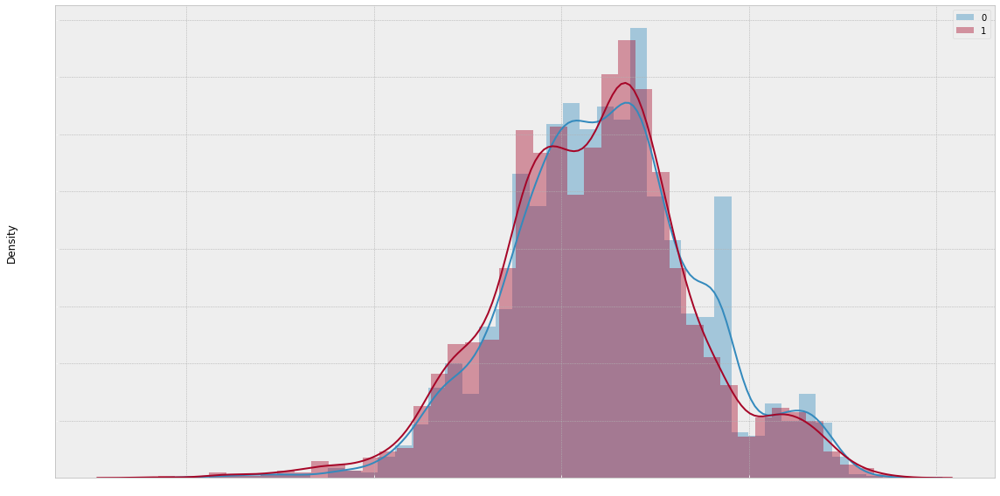

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


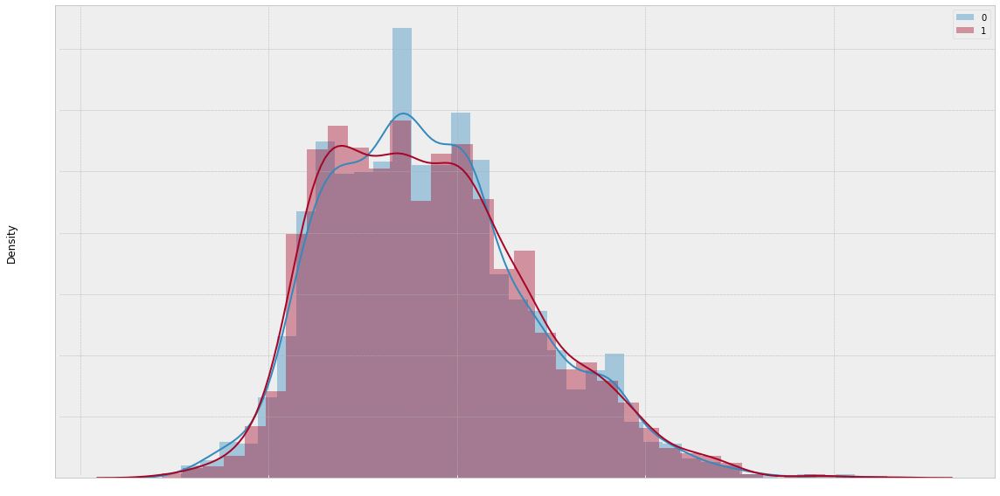

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


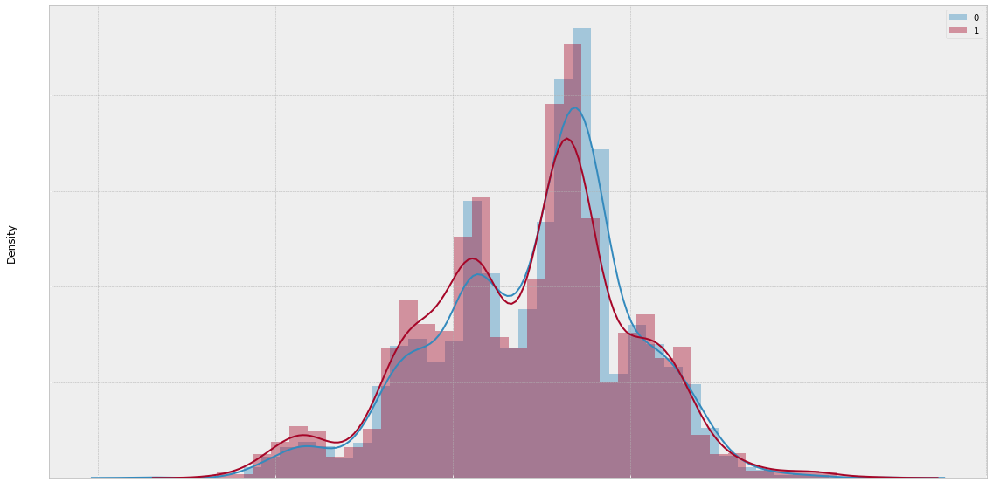

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


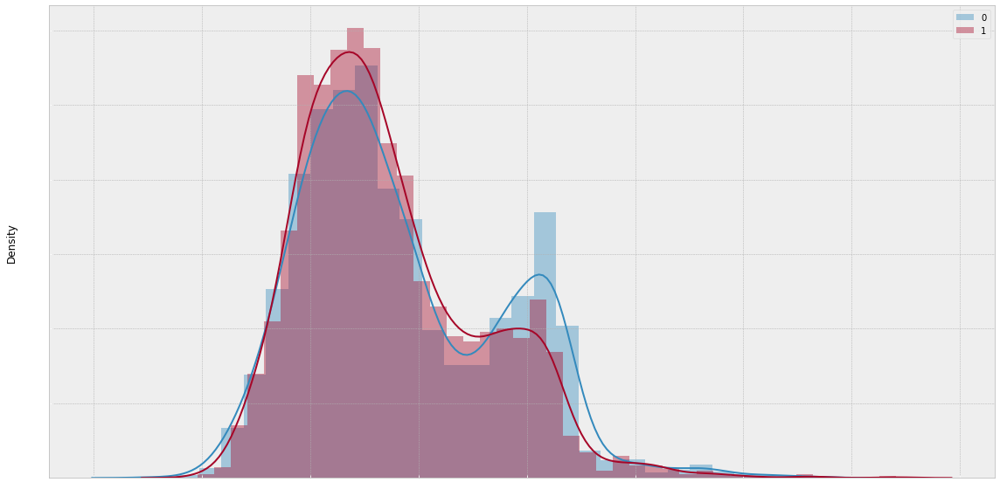

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


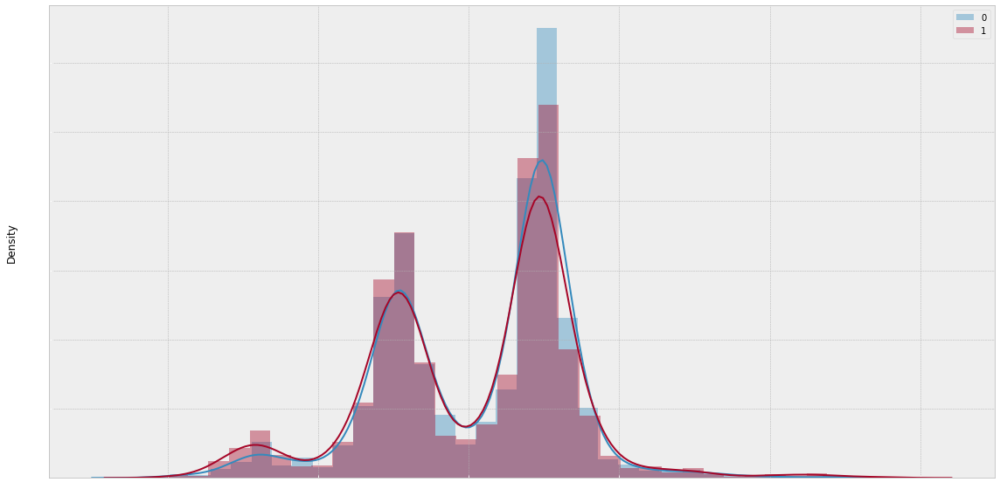

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


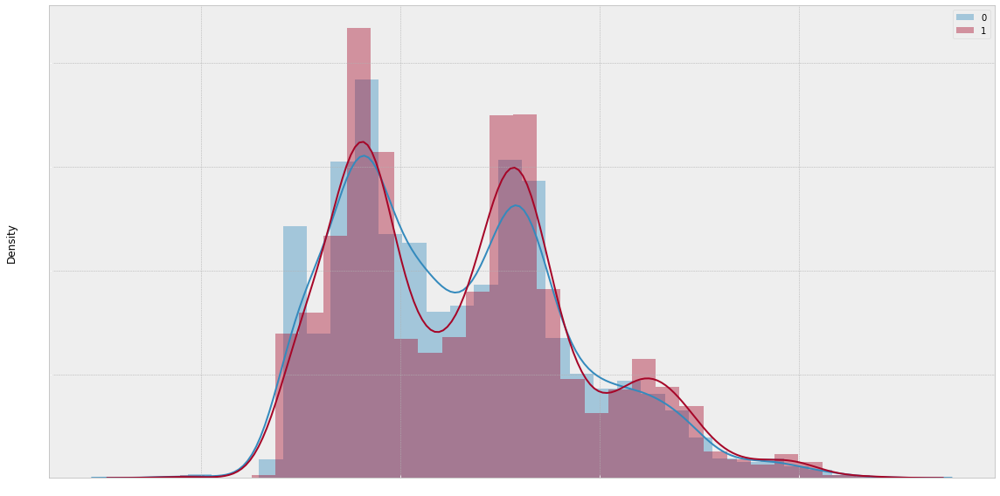

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


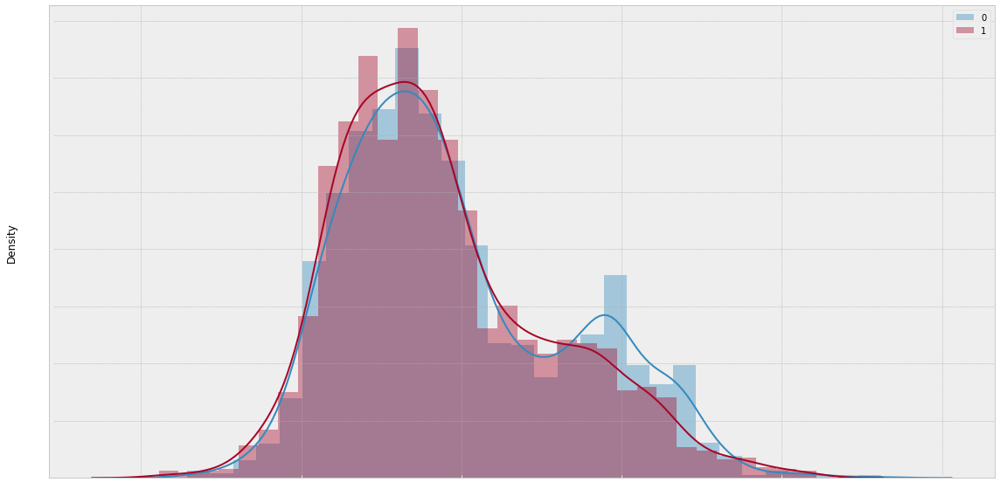

In [ ]:
Xscl = X.copy()

wmin = -50
wmax = 50

emin = 0
emax = 3

n_feat = 10

ft_df = pd.DataFrame({'Best Performance': y})
ft_test_df = pd.DataFrame()
param_df = pd.DataFrame()

for j in range(n_feat):
    ws = []
    es = []

    w = np.random.uniform(wmin, wmax)
    e = np.random.uniform(emin, emax)

    ws.append(w)
    es.append(e)

    ft = np.array(w * Xscl[:, 0] ** e)
    ft_test = np.array(w * X_pred[:, 0] ** e)

    for i in range(1, Xscl.shape[1]):
        # inf_nan_exist = True
        # while inf_nan_exist:
            w = np.random.uniform(wmin, wmax)
            e = np.random.uniform(emin, emax)

            ft_n = np.array(w * Xscl[:, i] ** e)
            ft_test_n = np.array(w * X_pred[:, i] ** e)

            # if not (np.isnan(ft).any() \
            #         or np.isnan(ft_test).any() \
            #         or np.isinf(ft).any() \
            #         or np.isinf(ft_test).any()):

                # inf_nan_exist = False
            ft += ft_n
            ft_test += ft_test_n
            ws.append(w)
            es.append(e)

    ft_df[f't_feat_{j}'] = ft
    ft_test_df[f't_feat_{j}'] = ft_test
    param_df[f'ws_{j}'] = ws
    param_df[f'es_{j}'] = es

    plt.style.use('bmh')
    plt.figure(figsize=(16, 8))
    sns.distplot(ft_df[f't_feat_{j}'][ft_df['Best Performance'] == 0], label='0')
    sns.distplot(ft_df[f't_feat_{j}'][ft_df['Best Performance'] == 1], label='1')

    plt.xlabel(None)
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
ft_df.isnull().sum()

Best Performance    0
t_feat_0            0
t_feat_1            0
t_feat_2            0
t_feat_3            0
t_feat_4            0
t_feat_5            0
t_feat_6            0
t_feat_7            0
t_feat_8            0
t_feat_9            0
dtype: int64

In [ ]:
ft_test_df.isnull().sum()

t_feat_0    0
t_feat_1    0
t_feat_2    0
t_feat_3    0
t_feat_4    0
t_feat_5    0
t_feat_6    0
t_feat_7    0
t_feat_8    0
t_feat_9    0
dtype: int64

In [ ]:
ft_df = ft_df.fillna(0)
ft_test_df = ft_test_df.fillna(0)

In [ ]:
ft_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5334 entries, 0 to 5333
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Best Performance  5334 non-null   int64  
 1   t_feat_0          5334 non-null   float64
 2   t_feat_1          5334 non-null   float64
 3   t_feat_2          5334 non-null   float64
 4   t_feat_3          5334 non-null   float64
 5   t_feat_4          5334 non-null   float64
 6   t_feat_5          5334 non-null   float64
 7   t_feat_6          5334 non-null   float64
 8   t_feat_7          5334 non-null   float64
 9   t_feat_8          5334 non-null   float64
 10  t_feat_9          5334 non-null   float64
dtypes: float64(10), int64(1)
memory usage: 458.5 KB


In [ ]:
ft_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   t_feat_0  6000 non-null   float64
 1   t_feat_1  6000 non-null   float64
 2   t_feat_2  6000 non-null   float64
 3   t_feat_3  6000 non-null   float64
 4   t_feat_4  6000 non-null   float64
 5   t_feat_5  6000 non-null   float64
 6   t_feat_6  6000 non-null   float64
 7   t_feat_7  6000 non-null   float64
 8   t_feat_8  6000 non-null   float64
 9   t_feat_9  6000 non-null   float64
dtypes: float64(10)
memory usage: 468.9 KB


##### Model Feature Transform

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
Xft = ft_df.drop(['Best Performance'], axis=1)
yft = ft_df['Best Performance']

Xft_train, Xft_val, yft_train, yft_val = train_test_split(Xft, yft, test_size=0.3, stratify=yft)

sclft = Normalizer()
Xft_train = sclft.fit_transform(Xft_train)
Xft_val = sclft.transform(Xft_val)
Xft_pred = sclft.transform(ft_test_df.values)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(yft), yft)
class_weights = {0: class_weights[0], 1: class_weights[1]}

##### Train

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', np.unique(y), y)
class_weights = {0: class_weights[0], 1: class_weights[1]}

In [ ]:
lgbmt_params = {
    'learning_rate': [0.0075],
    'n_estimators': [1250, 1500, 3000, 5000],
    'num_leaves': [11],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'colsample_bytree' : [0.6],
    'subsample' : [0.15],
    'reg_alpha' : [1.6],
    'reg_lambda' : [3],
}

rft_params = {
    'bootstrap': [True],
    'criterion': ['entropy'],
    'max_depth': [80, 102, 130],
    'max_features': [4],
    'min_samples_leaf': [2],
    'min_samples_split': [4],
    'n_estimators': [7]
}

xgb_params = {
    'min_child_weight': [6],
    'gamma': [7.5],
    'subsample': [0.9],
    'colsample_bytree': [0.5],
    'max_depth': [6]
}
sfold = StratifiedKFold(n_splits=10)

In [ ]:
dt = DecisionTreeClassifier(class_weight=class_weights)
# svc = SVC(class_weight=class_weights, probability=True)
ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
gbm = GradientBoostingClassifier()
xgb = XGBClassifier(class_weight=class_weights)
rf = RandomForestClassifier(class_weight=class_weights, criterion='entropy', max_leaf_nodes=20, n_jobs=-1)
nb = GaussianNB()
lgbm = LGBMClassifier(class_weight=class_weights)

In [ ]:
gsrf = GridSearchCV(rf, rft_params, cv=sfold, scoring=roc_auc_scorer)
gslgbm = GridSearchCV(lgbm, lgbmt_params, cv=sfold, scoring=roc_auc_scorer)

gsrf.fit(Xft_train, yft_train)
gslgbm.fit(Xft_train, yft_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt',
                                      class_weight={0: 1.0, 1: 1.0},
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, obje...
             iid='deprecated', n_jobs=None,
             param_grid={'boosting_type': ['gbdt'], 'colsample_bytree': [0.6],
                         'learning_rate': [0.0075],
                         'n_estimators': [1250, 1500, 3000, 5000],
                         'num_leaves': [11], 'objective

In [ ]:
gsxgb = GridSearchCV(xgb, xgb_params, cv=10, scoring=roc_auc_scorer)
gsxgb.fit(Xft_train, yft_train)
gsxgb_best = gsxgb.best_params_

In [ ]:
gsrf_best = gsrf.best_params_

In [ ]:
gslgbm_best = gslgbm.best_params_

In [ ]:
nb.fit(Xft_train, yft_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
# svc.fit(X_train, y_train)

In [ ]:
# ada_svc.fit(X_train, y_train)

In [ ]:
dt.fit(Xft_train, yft_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight={0: 1.0, 1: 1.0},
                       criterion='gini', max_depth=None, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=None,
                       splitter='best')

In [ ]:
ada_dt.fit(Xft_train, yft_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight={0: 1.0,
                                                                       1: 1.0},
                                                         criterion='gini',
                                                         max_depth=None,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                   

In [ ]:
gbm.fit(Xft_train, yft_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
xgb.fit(Xft_train, yft_train)

XGBClassifier(base_score=0.5, booster='gbtree', class_weight={0: 1.0, 1: 1.0},
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
rf.fit(Xft_train, yft_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 1.0, 1: 1.0}, criterion='entropy',
                       max_depth=None, max_features='auto', max_leaf_nodes=20,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##### Evaluation

In [ ]:
y_pred_dt = dt.predict(Xft_val)
# y_pred_svc = svc.predict(X_val)
y_pred_ada_dt = ada_dt.predict(Xft_val)
# y_pred_ada_svc = ada_svc.predict(X_val)
y_pred_gbm = gbm.predict(Xft_val)
y_pred_xgb = xgb.predict(Xft_val)
y_pred_rf = rf.predict(Xft_val)
y_pred_nb = nb.predict(Xft_val)
y_pred_gsrf = gsrf.predict(Xft_val)
y_pred_gslgbm = gslgbm.predict(Xft_val)
y_pred_gsxgb = gsxgb.predict(Xft_val)

In [ ]:
y_pred_proba_dt = dt.predict_proba(Xft_val)[:, 1]
# y_pred_proba_svc = svc.predict_proba(X_val)[:, 1]
y_pred_proba_ada_dt = ada_dt.predict_proba(Xft_val)[:, 1]
# y_pred_proba_ada_svc = ada_svc.predict(X_val)[:, 1]
y_pred_proba_gbm = gbm.predict_proba(Xft_val)[:, 1]
y_pred_proba_xgb = xgb.predict_proba(Xft_val)[:, 1]
y_pred_proba_rf = rf.predict_proba(Xft_val)[:, 1]
y_pred_proba_nb = nb.predict_proba(Xft_val)[:, 1]
y_pred_proba_gsrf = gsrf.predict_proba(Xft_val)[:, 1]
y_pred_proba_gslgbm = gslgbm.predict_proba(Xft_val)[:, 1]
y_pred_proba_gsxgb = gsxgb.predict_proba(Xft_val)[:, 1]

y_pred_proba_avg = (
    y_pred_proba_dt +
    y_pred_proba_ada_dt +
    y_pred_proba_gbm +
    y_pred_proba_xgb +
    y_pred_proba_rf +
    # y_pred_proba_svc +
    # y_pred_proba_ada_svc +
    y_pred_proba_nb +
    y_pred_proba_gsrf +
    y_pred_proba_gslgbm +
    y_pred_proba_gsxgb
) / 9

In [ ]:
X_ens_train = np.array([
                dt.predict_proba(Xft_train)[:, 1],
                ada_dt.predict_proba(Xft_train)[:, 1],
                gbm.predict_proba(Xft_train)[:, 1],
                xgb.predict_proba(Xft_train)[:, 1],
                rf.predict_proba(Xft_train)[:, 1],
                nb.predict_proba(Xft_train)[:, 1],
                gsrf.predict_proba(Xft_train)[:, 1],
                gslgbm.predict_proba(Xft_train)[:, 1],
                gsxgb.predict_proba(Xft_train)[:, 1]
            ])

X_ens_val = np.array([
                y_pred_proba_dt,
                y_pred_proba_ada_dt,
                y_pred_proba_gbm,
                y_pred_proba_xgb,
                y_pred_proba_rf,
                y_pred_proba_nb,
                y_pred_proba_gsrf,
                y_pred_proba_gslgbm,
                y_pred_proba_gsxgb
            ])

X_ens_train = X_ens_train.reshape(X_ens_train.shape[1], X_ens_train.shape[0])
X_ens_val = X_ens_val.reshape(X_ens_val.shape[1], X_ens_val.shape[0])

rf_ens = RandomForestClassifier(class_weight=class_weights, n_jobs=-1, bootstrap=True,
 criterion='entropy',
 max_depth=102,
 max_features=4,
 min_samples_leaf=2,
 min_samples_split=4,
 n_estimators=7)
rf_ens.fit(X_ens_train, yft_train)
y_rf_ens_val = rf_ens.predict_proba(X_ens_val)[:, 1]

roc_auc_score(yft_val, y_rf_ens_val)

0.5102356429463171

In [ ]:
y_pred_proba_log_dt = dt.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_svc = svc.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_ada_dt = ada_dt.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_ada_svc = ada_svc.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_gbm = gbm.predict_log_proba(Xft_val)[:, 1]
# y_pred_proba_log_xgb = xgb.predict_log_proba(X_val)[:, 1]
y_pred_proba_log_rf = rf.predict_log_proba(Xft_val)[:, 1]
y_pred_proba_log_nb = nb.predict_log_proba(Xft_val)[:, 1]

/usr/local/lib/python3.6/dist-packages/sklearn/tree/_classes.py:948: RuntimeWarning: divide by zero encountered in log
  return np.log(proba)


In [ ]:
def plot_confusion_matrix(y_test, y_pred, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, linewidths=0.5)
    plt.title(title)
    plt.show()

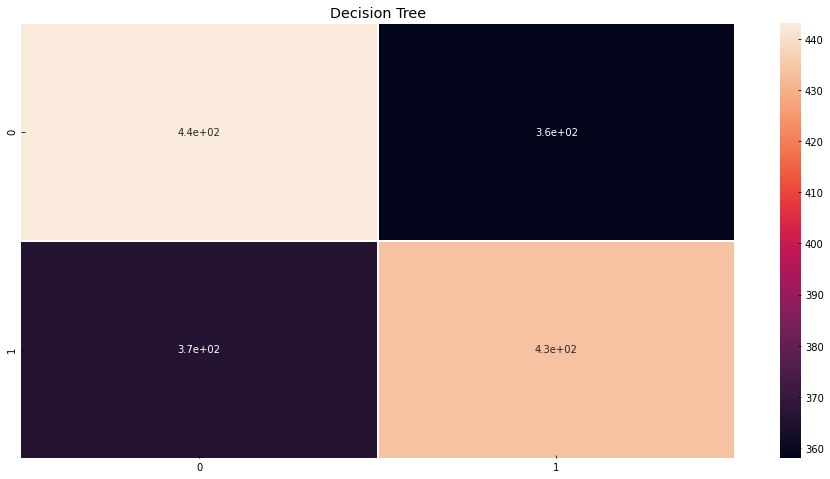

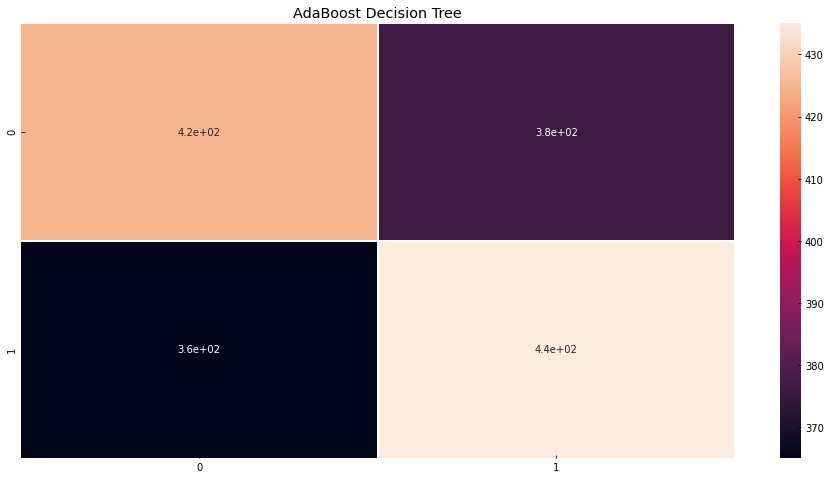

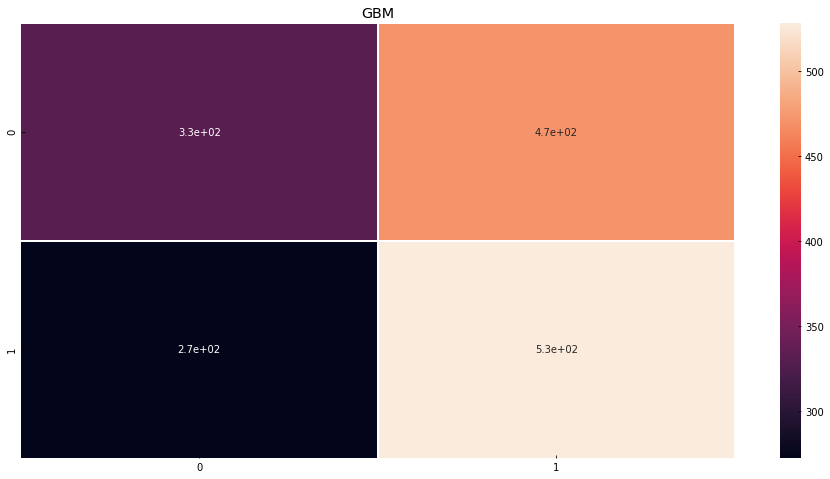

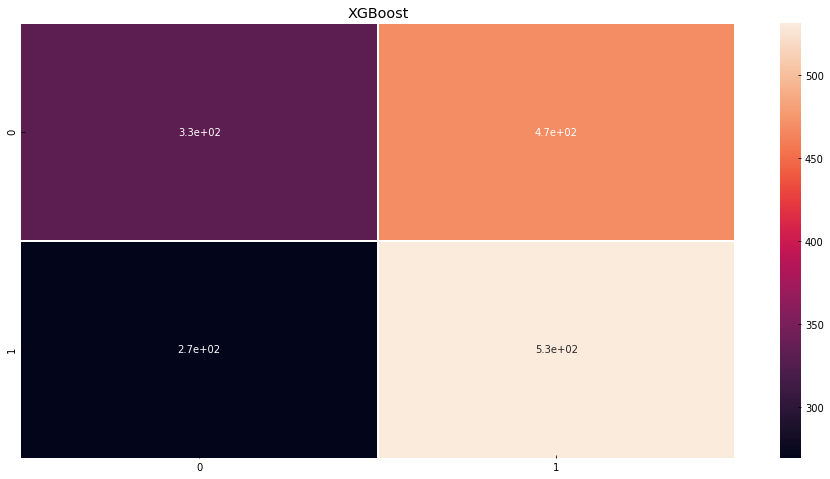

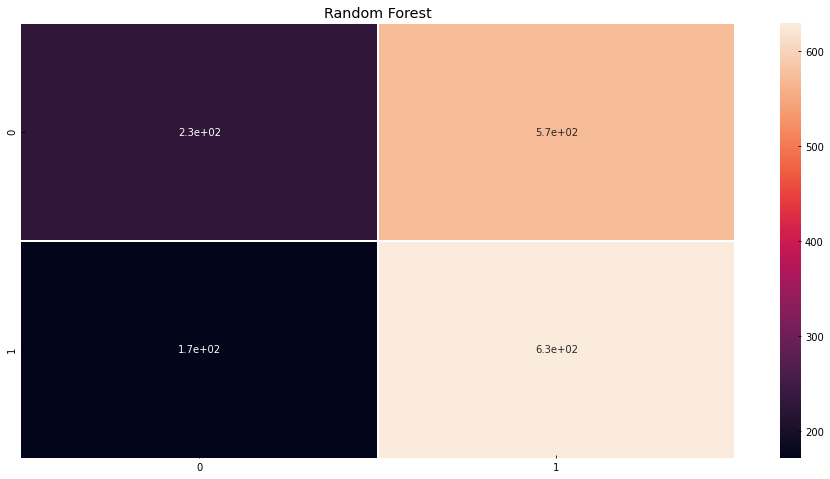

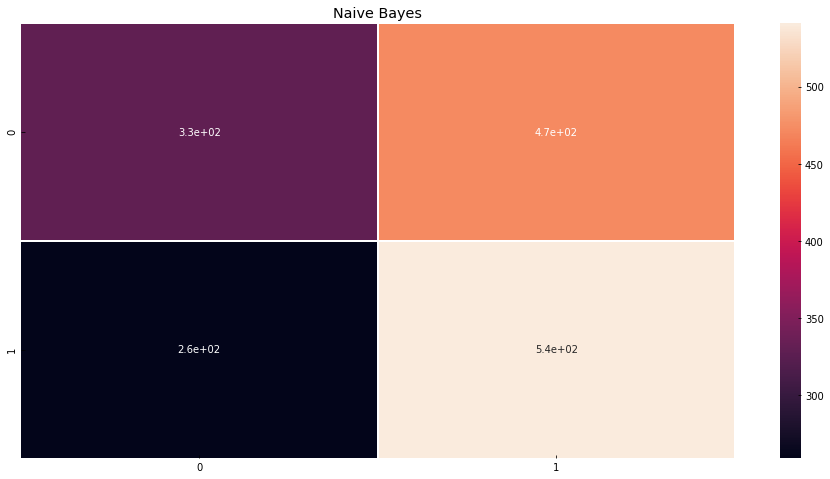

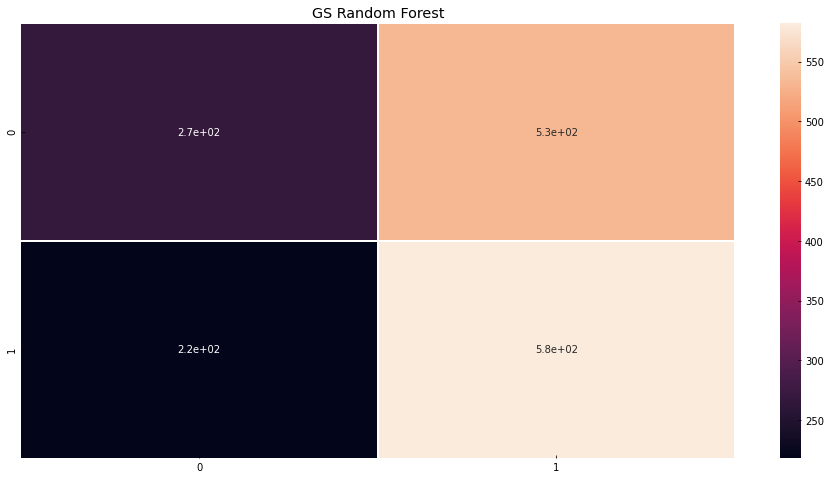

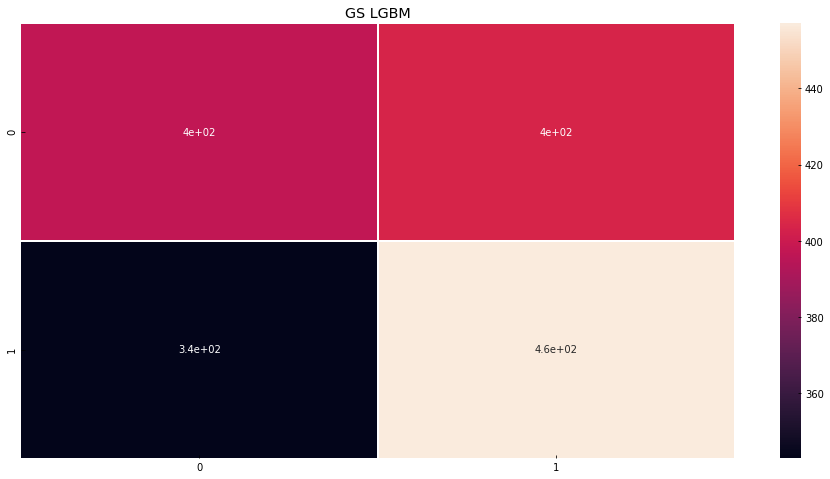

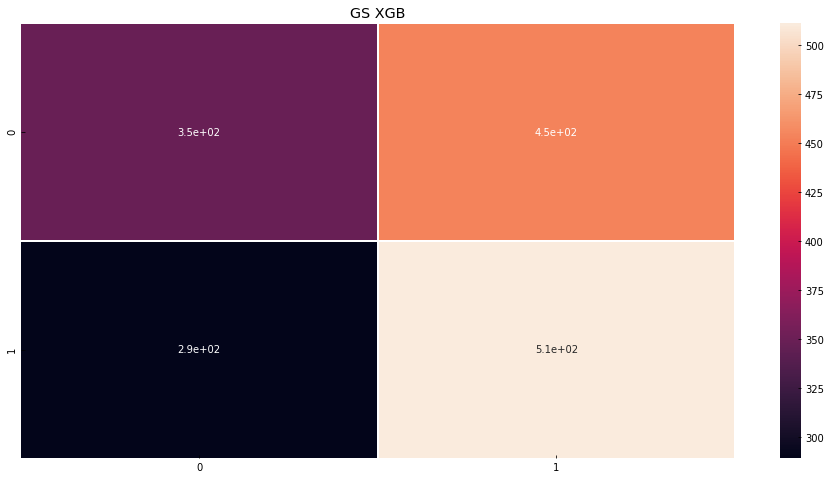

In [ ]:
plot_confusion_matrix(yft_val, y_pred_dt, 'Decision Tree')
# plot_confusion_matrix(y_val, y_pred_svc, 'SVC')
plot_confusion_matrix(yft_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# plot_confusion_matrix(y_val, y_pred_ada_svc, 'AdaBoost SVC')
plot_confusion_matrix(yft_val, y_pred_gbm, 'GBM')
plot_confusion_matrix(yft_val, y_pred_xgb, 'XGBoost')
plot_confusion_matrix(yft_val, y_pred_rf, 'Random Forest')
plot_confusion_matrix(yft_val, y_pred_nb, 'Naive Bayes')
plot_confusion_matrix(yft_val, y_pred_gsrf, 'GS Random Forest')
plot_confusion_matrix(yft_val, y_pred_gslgbm, 'GS LGBM')
plot_confusion_matrix(yft_val, y_pred_gsxgb, 'GS XGB')

In [ ]:
def print_classification_report(y_test, y_pred, title):
    print(title)
    print(classification_report(y_test, y_pred))
    print(100*'-')

In [ ]:
print_classification_report(yft_val, y_pred_dt, 'Decision Tree')
# print_classification_report(y_val, y_pred_svc, 'SVC')
print_classification_report(yft_val, y_pred_ada_dt, 'AdaBoost Decision Tree')
# print_classification_report(y_val, y_pred_ada_svc, 'AdaBoost SVC')
print_classification_report(yft_val, y_pred_gbm, 'GBM')
print_classification_report(yft_val, y_pred_xgb, 'XGBoost')
print_classification_report(yft_val, y_pred_rf, 'Random Forest')
print_classification_report(yft_val, y_pred_nb, 'Naive Bayes')
print_classification_report(yft_val, y_pred_gsrf, 'GS Random Forest')
print_classification_report(yft_val, y_pred_gslgbm, 'GS LGBM')
print_classification_report(yft_val, y_pred_gsxgb, 'GS XGB')

Decision Tree
              precision    recall  f1-score   support

           0       0.55      0.55      0.55       801
           1       0.55      0.54      0.55       800

    accuracy                           0.55      1601
   macro avg       0.55      0.55      0.55      1601
weighted avg       0.55      0.55      0.55      1601

----------------------------------------------------------------------------------------------------
AdaBoost Decision Tree
              precision    recall  f1-score   support

           0       0.54      0.53      0.53       801
           1       0.54      0.54      0.54       800

    accuracy                           0.54      1601
   macro avg       0.54      0.54      0.54      1601
weighted avg       0.54      0.54      0.54      1601

----------------------------------------------------------------------------------------------------
GBM
              precision    recall  f1-score   support

           0       0.55      0.41      0.47     

In [ ]:
roc = [roc_auc_score(yft_val, y_pred_dt),
       roc_auc_score(yft_val, y_pred_ada_dt),
       roc_auc_score(yft_val, y_pred_gbm),
       roc_auc_score(yft_val, y_pred_xgb),
       roc_auc_score(yft_val, y_pred_rf),
    #    roc_auc_score(y_val, y_pred_svc),
    #    roc_auc_score(y_val, y_pred_ada_svc),
       roc_auc_score(yft_val, y_pred_nb),
       roc_auc_score(yft_val, y_pred_gsrf),
       roc_auc_score(yft_val, y_pred_gslgbm),
       roc_auc_score(yft_val, y_pred_gsxgb)
]
label = ['DT', 'AdaDT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5477793383270911, 0.5371683832709113, 0.5359925093632959, 0.5391159488139825, 0.5366955368289638, 0.5434932896379525, 0.5310408863920101, 0.5334402309612984, 0.5366034644194756]


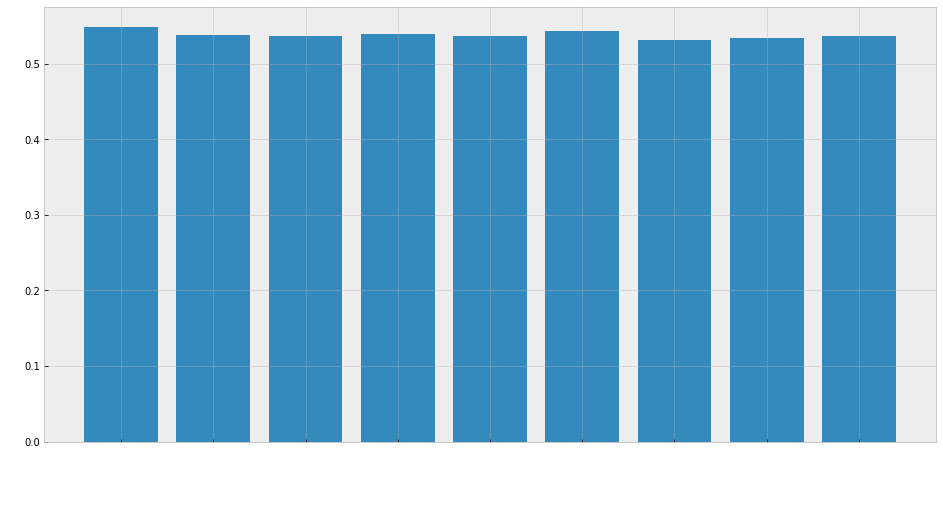

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

In [ ]:
roc = [roc_auc_score(yft_val, y_pred_proba_dt),
       roc_auc_score(yft_val, y_pred_proba_ada_dt),
       roc_auc_score(yft_val, y_pred_proba_gbm),
       roc_auc_score(yft_val, y_pred_proba_xgb),
       roc_auc_score(yft_val, y_pred_proba_rf),
    #    roc_auc_score(y_val, y_pred_proba_svc),
    #    roc_auc_score(y_val, y_pred_proba_ada_svc),
       roc_auc_score(yft_val, y_pred_proba_nb),
       roc_auc_score(yft_val, y_pred_proba_avg),
       roc_auc_score(yft_val, y_pred_proba_gsrf),
       roc_auc_score(yft_val, y_pred_proba_gslgbm),
       roc_auc_score(yft_val, y_pred_proba_gsxgb)
]
label = ['DT', 'AdaDT', 'GBM', 'XGB', 'RF', 'NB', 'AVG', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

print(roc)

[0.5466370162297128, 0.5578909176029963, 0.5552606117353308, 0.5584238451935081, 0.5583559612983771, 0.5733988764044944, 0.5803854556803995, 0.5471824282147316, 0.5594834581772784, 0.5625858302122346]


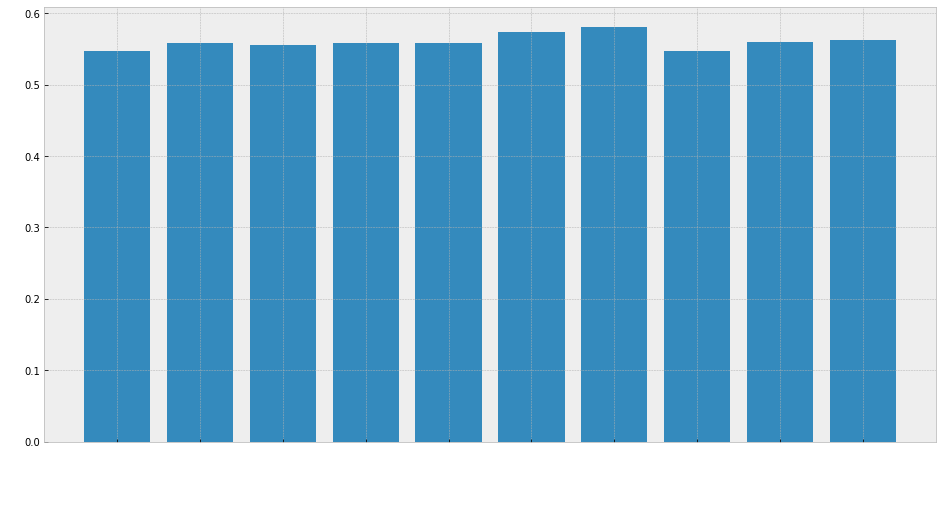

In [ ]:
plt.figure(figsize=(16, 8))
plt.bar(idx, roc)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('ROC_AUC_Score', c='w')
plt.show()

[0.9989287627209427, 0.9989283321593354, 0.7125348252580068, 0.6999447732978321, 0.6342816883296563, 0.532781382056833, 0.6171486373299211, 0.862838141558323, 0.6889690403241039]


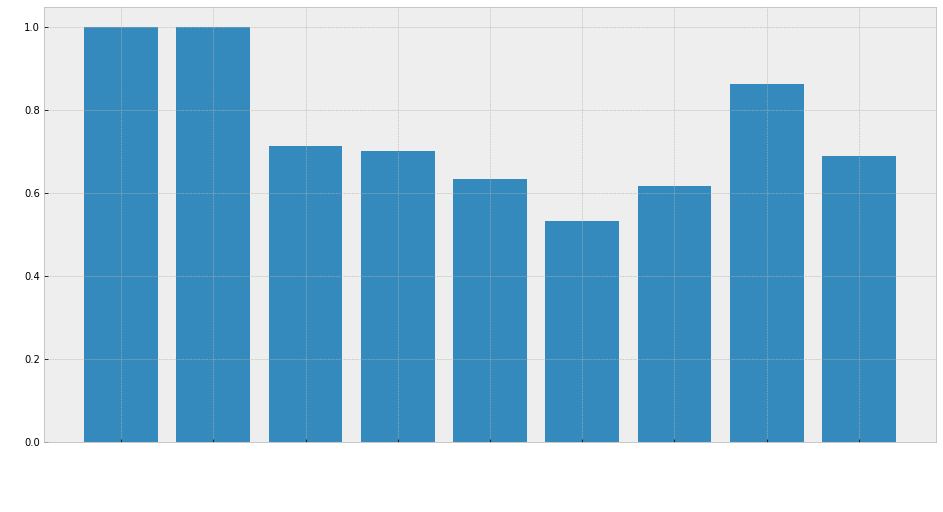

In [ ]:
# train prediction -> to check overfit
roc_train = [roc_auc_score(yft_train, dt.predict(Xft_train)),
       roc_auc_score(yft_train, ada_dt.predict(Xft_train)),
       roc_auc_score(yft_train, gbm.predict(Xft_train)),
       roc_auc_score(yft_train, xgb.predict(Xft_train)),
       roc_auc_score(yft_train, rf.predict(Xft_train)),
    #    roc_auc_score(y_train, svc.predict(X_train)),
    #    roc_auc_score(y_train, ada_svc.predict(X_train)),
       roc_auc_score(yft_train, nb.predict(Xft_train)),
       roc_auc_score(yft_train, gsrf.predict(Xft_train)),
       roc_auc_score(yft_train, gslgbm.predict(Xft_train)),
       roc_auc_score(yft_train, gsxgb.predict(Xft_train))
]
print(roc_train)
label = ['DT', 'AdaDT', 'GBM', 'XGB', 'RF', 'NB', 'GSRF', 'GSLGBM', 'GSXGB']
idx = np.arange(len(label))

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

[0.9999977036714275, 0.9999977036714275, 0.7984843944380625, 0.788366196665616, 0.7398592695034362, 0.5468738069855463, 0.6628714096185166, 0.9408976692839072, 0.7674706112998885]


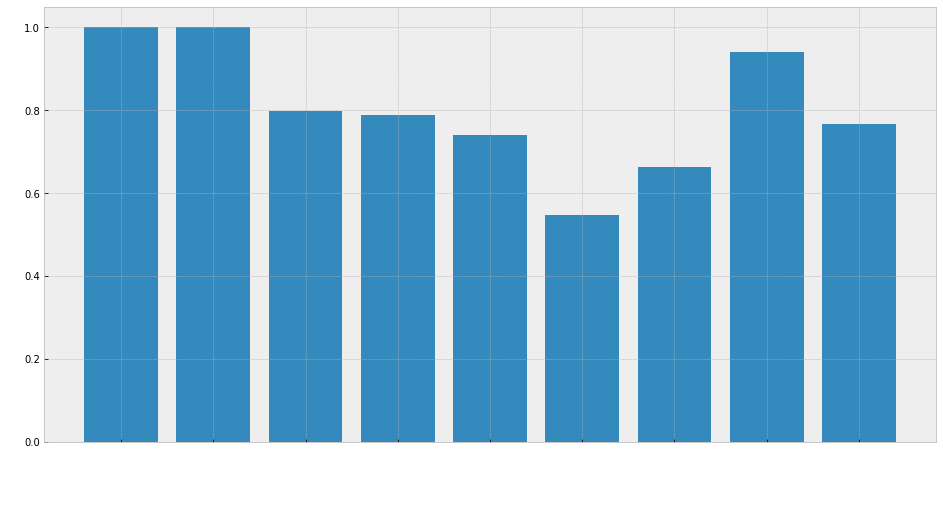

In [ ]:
# train prediction proba -> to check overfit
roc_train = [roc_auc_score(yft_train, dt.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, ada_dt.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gbm.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, xgb.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, rf.predict_proba(Xft_train)[:, 1]),
    #    roc_auc_score(y_train, svc.predict_proba(X_train)[:, 1]),
    #    roc_auc_score(y_train, ada_svc.predict_proba(X_train)[:, 1]),
       roc_auc_score(yft_train, nb.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gsrf.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gslgbm.predict_proba(Xft_train)[:, 1]),
       roc_auc_score(yft_train, gsxgb.predict_proba(Xft_train)[:, 1])
]
print(roc_train)

plt.figure(figsize=(16, 8))
plt.bar(idx, roc_train)
plt.xticks(idx, label, rotation=90, c='w')
plt.xlabel('Model', c='w')
plt.ylabel('Train ROC_AUC_Score', c='w')
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score
from sklearn.feature_selection import SelectFromModel

In [ ]:
def feature_importances_performance(model, new_model, model_name, X_train, X_test, y_train, y_test):
    print(model_name)
    feature_imp = sorted(model.feature_importances_)

    for threshold in feature_imp:
        selection = SelectFromModel(model, threshold=threshold, prefit=True)

        selected_feature_X_train = selection.transform(X_train)
        new_model.fit(selected_feature_X_train, y_train)

        selected_feature_X_test = selection.transform(X_test)
        y_pred = new_model.predict_proba(selected_feature_X_test)[:,1]

        roc = roc_auc_score(y_test, y_pred)

        print(f'Threshold={threshold:.5f}, Number of features={selected_feature_X_train.shape[1]}, ROC AUC: {roc:.3f}')
    print(100*'-')

In [ ]:
feature_importances_performance(dt, DecisionTreeClassifier(class_weight=class_weights), 'Decision Tree', Xft_train, Xft_val, yft_train, yft_val)
# feature_importances_performance(svc, SVC(class_weight='balanced', probability=True), 'SVC', X_train, X_test, y_train, y_test)
# feature_importances_performance(ada_dt, AdaBoostClassifier(base_estimator=dt), 'AdaBoost Decision Tree', X_train, X_val, y_train, y_val)
# feature_importances_performance(ada_svc, AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3), 'AdaBoost SVC', X_train, X_test, y_train, y_test)
feature_importances_performance(gbm, GradientBoostingClassifier(), 'GradientBoosting', Xft_train, Xft_val, yft_train, yft_val)
feature_importances_performance(xgb, XGBClassifier(class_weight=class_weights, colsample_bytree=0.5,
 gamma=7.5,
 max_depth=6,
 min_child_weight=6,
 subsample=0.9), 'XGBoost', Xft_train, Xft_val, yft_train, yft_val)
# feature_importances_performance(rf, RandomForestClassifier(class_weight=class_weights, bootstrap=True,
#  criterion='entropy',
#  max_depth=102,
#  max_features=4,
#  min_samples_leaf=2,
#  min_samples_split=4,
#  n_estimators=7), 'Random Forest', Xft_train, Xft_val, yft_train, yft_val)
# feature_importances_performance(lgbm, LGBMClassifier(class_weight=class_weights, boosting_type='gbdt',
#  colsample_bytree=0.6,
#  learning_rate=0.0075,
#  n_estimators=550,
#  num_leaves=11,
#  objective='binary',
#  reg_alpha=1.6,
#  reg_lambda=3,
#  subsample=0.15), 'LGBM', Xft_train, Xft_val, yft_train, yft_val)
# feature_importances_performance(nb, GaussianNB(), 'Naive Bayes', X_train, X_val, y_train, y_val)

Decision Tree
Threshold=0.07332, Number of features=10, ROC AUC: 0.545
Threshold=0.08509, Number of features=9, ROC AUC: 0.533
Threshold=0.08724, Number of features=8, ROC AUC: 0.547
Threshold=0.08965, Number of features=7, ROC AUC: 0.528
Threshold=0.09523, Number of features=6, ROC AUC: 0.517
Threshold=0.09851, Number of features=5, ROC AUC: 0.530
Threshold=0.10049, Number of features=4, ROC AUC: 0.513
Threshold=0.11764, Number of features=3, ROC AUC: 0.527
Threshold=0.11859, Number of features=2, ROC AUC: 0.514
Threshold=0.13423, Number of features=1, ROC AUC: 0.517
----------------------------------------------------------------------------------------------------
GradientBoosting
Threshold=0.07490, Number of features=10, ROC AUC: 0.558
Threshold=0.08139, Number of features=9, ROC AUC: 0.550
Threshold=0.08326, Number of features=8, ROC AUC: 0.554
Threshold=0.08863, Number of features=7, ROC AUC: 0.549
Threshold=0.09236, Number of features=6, ROC AUC: 0.539
Threshold=0.10395, Number 

In [ ]:
sfold = StratifiedKFold(n_splits=40)
cv_dt = DecisionTreeClassifier(class_weight=class_weights)
cv_ada_dt = AdaBoostClassifier(base_estimator=dt)
# ada_svc = AdaBoostClassifier(base_estimator=svc, n_estimators=10, random_state=0, learning_rate=0.3)
cv_gbm = GradientBoostingClassifier()
cv_xgb = XGBClassifier(class_weight=class_weights).set_params(**gsxgb_best)
cv_rf = RandomForestClassifier(class_weight=class_weights).set_params(**gsrf_best)
cv_lgbm = LGBMClassifier(class_weight=class_weights).set_params(**gslgbm_best)
cv_nb = GaussianNB()

metrics = roc_auc_scorer

scv_r_dt = cross_val_score(cv_dt, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_svc = cross_val_score(cv_svc, X_train, y_train, cv=sfold, verbose=True)
# scv_r_ada_dt = cross_val_score(cv_ada_dt, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_ada_svc = cross_val_score(cv_ada_svc, X_train, y_train, cv=sfold, verbose=True)
scv_r_gbm = cross_val_score(cv_gbm, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_xgb = cross_val_score(cv_xgb, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_rf = cross_val_score(cv_rf, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_nb = cross_val_score(cv_nb, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
scv_r_lgbm = cross_val_score(cv_lgbm, Xft_train, yft_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsrf = cross_val_score(gsrf, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gslgbm = cross_val_score(gslgbm, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)
# scv_r_gsxgb = cross_val_score(gsxgb, X_train, y_train, cv=sfold, verbose=True, scoring=metrics, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   39.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  2.0min finished


In [ ]:
print("DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_dt.mean()*100, scv_r_dt.std()*100))
# print("SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_svc.mean()*100, scv_r_svc.std()*100))
# print("AdaBoost DT Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_dt.mean()*100, scv_r_ada_dt.std()*100))
# print("AdaBoost SVC Mean Accuracy: %.2f%%  Standard Deviation %.2f%%" % (scv_r_ada_svc.mean()*100, scv_r_ada_svc.std()*100))
print("GBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gbm.mean()*100, scv_r_gbm.std()*100))
print("XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_xgb.mean()*100, scv_r_xgb.std()*100))
print("Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_rf.mean()*100, scv_r_rf.std()*100))
print("Naive Bayes Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_nb.mean()*100, scv_r_nb.std()*100))
print("LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_lgbm.mean()*100, scv_r_lgbm.std()*100))
# print("GS Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsrf.mean()*100, scv_r_rf.std()*100))
# print("GS LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gslgbm.mean()*100, scv_r_rf.std()*100))
# print("GS XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gsxgb.mean()*100, scv_r_rf.std()*100))

DT Mean roc: 52.46%  Standard Deviation 5.34%
GBM Mean roc: 54.24%  Standard Deviation 5.54%
XGB Mean roc: 53.17%  Standard Deviation 5.89%
Random Forest Mean roc: 55.02%  Standard Deviation 6.15%
Naive Bayes Mean roc: 53.88%  Standard Deviation 6.77%
LGBM Mean roc: 53.56%  Standard Deviation 5.86%


In [ ]:
gslgbm.predict_proba(Xft_pred)[:, 1]

array([0.59952332, 0.54586813, 0.32271876, 0.51703554, 0.52218656,
       0.69358715, 0.271208  , 0.49446932, 0.51670947, 0.75642209,
       0.50019722, 0.72166873, 0.60106892, 0.39266842, 0.66019106,
       0.55376091, 0.56489707, 0.45602777, 0.492796  , 0.67867867,
       0.48191251, 0.40119845, 0.68708482, 0.48037991, 0.41164507,
       0.79259413, 0.5292882 , 0.42684447, 0.41496109, 0.57867447,
       0.75290001, 0.44093355, 0.53703953, 0.38269861, 0.54431226,
       0.42578055, 0.21588407, 0.45637663, 0.47340324, 0.70158201,
       0.47210526, 0.46469814, 0.52812926, 0.63993617, 0.70446232,
       0.5993575 , 0.51368082, 0.44524126, 0.6185591 , 0.58772958,
       0.75715997, 0.49439019, 0.71167363, 0.5565285 , 0.32546599,
       0.60068778, 0.37785528, 0.49396914, 0.41650892, 0.61806848,
       0.55839022, 0.64408079, 0.54138155, 0.55023355, 0.73259157,
       0.52053896, 0.57629931, 0.5262703 , 0.61145516, 0.43318108,
       0.37631414, 0.601027  , 0.48715008, 0.73919278, 0.58891

In [ ]:
# pred_df = pd.DataFrame({
#     'index': test_df.index,
#     'Best Performance': gsxgb.predict_proba(Xft_pred)[:, 1]
# })

# pred_df.head()
# filename='bri_pa_gsxgb_ft_down.csv'
# pred_df.to_csv(filename, index=False)
# from google.colab import files
# files.download(filename)

### Model Anomaly Detection

#### GAN

##### Generate Data

In [ ]:
X_zeros = imp_train_df[all_feat_cols][imp_train_df['Best Performance'] == 0].values
y_zeros = imp_train_df['Best Performance'][imp_train_df['Best Performance'] == 0].values

X_ones = imp_train_df[all_feat_cols][imp_train_df['Best Performance'] == 1].values
y_ones = imp_train_df['Best Performance'][imp_train_df['Best Performance'] == 1].values

In [ ]:
from sklearn.model_selection import train_test_split

Xz_train, Xz_val, yz_train, yz_val = train_test_split(X_zeros, y_zeros, test_size=0.25, shuffle=True)
Xo_train, Xo_val, yo_train, yo_val = train_test_split(X_ones, y_ones, test_size=0.25, shuffle=True)

##### Train

In [ ]:
# More imports
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, LeakyReLU, Dropout, \
  BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam

In [ ]:
# Dimensionality of the latent space
latent_dim = 15
D = Xz_train.shape[1]

In [ ]:
# Get the generator model
def build_generator(latent_dim):
    i = Input(shape=(latent_dim,))
    x = Dense(256, activation=LeakyReLU(alpha=0.2))(i)
    x = BatchNormalization(momentum=0.7)(x)
    x = Dense(512, activation=LeakyReLU(alpha=0.2))(x)
    x = BatchNormalization(momentum=0.7)(x)
    x = Dense(1024, activation=LeakyReLU(alpha=0.2))(x)
    x = BatchNormalization(momentum=0.7)(x)
    x = Dense(D, activation='tanh')(x)

    model = Model(i, x)
    return model

In [ ]:
# Get the discriminator model
def build_discriminator(img_size):
    i = Input(shape=(img_size,))
    x = Dense(512, activation=LeakyReLU(alpha=0.2))(i)
    x = Dense(256, activation=LeakyReLU(alpha=0.2))(x)
    x = Dense(1, activation='sigmoid')(x)
    model = Model(i, x)
    return model

In [ ]:
# Compile both models in preparation for training

# Build and compile the discriminator
discriminator = build_discriminator(D)
discriminator.compile(
    loss='binary_crossentropy',
    optimizer=Adam(0.002, 0.5),
    metrics=[tf.keras.metrics.AUC()]
    # metrics=['accuracy']
)

# Build and compile the generator
generator = build_generator(latent_dim)

# Create input to represent noise sample from latent space
z = Input(shape=(latent_dim,))

# Pass noise through generator to get a sample
sample = generator(z)

# Make sure only the generator is trained
discriminator.trainable = False

# The true output is fake but we label them real
fake_pred = discriminator(sample)

combined_model = Model(z, fake_pred)

combined_model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(0.002, 0.5)
)

In [ ]:
# Config
batch_size = 256
epochs = 30000
sample_period = 200 # every `sample_period` steps generate and save some data


# Create batch labels to use when calling train_on_batch
ones = np.ones(batch_size)
zeros = np.zeros(batch_size)

# Store the losses
d_losses = []
g_losses = []

In [ ]:
# Main training loop
for epoch in range(epochs):
    ###########################
    ### Train discriminator ###
    ###########################

    # batch_size_noise = batch_size
    batch_size_noise = int(batch_size/2)
    noise = np.random.randn(batch_size_noise, latent_dim)


    # Select a random batch of zeros samples
    # 1)
    # idx_zeros = np.random.randint(0, Xz_train.shape[0], batch_size)
    # zeros_data = Xz_train[idx_zeros]

    # 2)
    zeros_data = np.zeros((batch_size, D))
    idx_zeros = np.random.randint(0, Xz_train.shape[0], \
                                 (batch_size - batch_size_noise))
    zeros_data[:batch_size_noise] = generator.predict(noise)
    zeros_data[(batch_size - batch_size_noise):] = Xz_train[idx_zeros]

    # 3)
    # zeros_data = generator.predict(noise)

    # Generate fake & random batch of ones samples
    # 1)
    idx_ones = np.random.randint(0, Xo_train.shape[0], batch_size)
    ones_data = Xo_train[idx_ones]

    # 2)
    # ones_data = np.zeros((batch_size, D))
    # idx_ones = np.random.randint(0, Xo_train.shape[0], \
    #                              (batch_size - batch_size_noise))
    # ones_data[:batch_size_noise] = generator.predict(noise)
    # ones_data[(batch_size - batch_size_noise):] = Xo_train[idx_ones]

    # 3)
    # ones_data = generator.predict(noise)

    # Train the discriminator
    # both loss and auc are returned
    discriminator.trainable=True
    d_loss_0, d_auc_0 = discriminator.train_on_batch(zeros_data, zeros)
    d_loss_1, d_auc_1 = discriminator.train_on_batch(ones_data, ones)
    d_loss = 0.5 * (d_loss_0 + d_loss_1)
    d_auc  = 0.5 * (d_auc_0 + d_auc_1)


    #######################
    ### Train generator ###
    #######################
    discriminator.trainable=False
    noise = np.random.randn(batch_size, latent_dim)
    # g_loss = combined_model.train_on_batch(noise, zeros)
    g_loss = combined_model.train_on_batch(noise, ones)

    # do it again!
    noise = np.random.randn(batch_size, latent_dim)
    # g_loss = combined_model.train_on_batch(noise, zeros)
    g_loss = combined_model.train_on_batch(noise, ones)

    # Save the losses
    d_losses.append(d_loss)
    g_losses.append(g_loss)

    if epoch % 100 == 0:
        print(f"epoch: {epoch+1}/{epochs}, d_loss: {d_loss:.2f}, \
        d_auc: {d_auc:.2f}, g_loss: {g_loss:.2f}")

epoch: 1/30000, d_loss: 0.96,         d_auc: 0.00, g_loss: 0.90
epoch: 101/30000, d_loss: 0.63,         d_auc: 0.00, g_loss: 1.66
epoch: 201/30000, d_loss: 0.69,         d_auc: 0.00, g_loss: 0.72
epoch: 301/30000, d_loss: 0.67,         d_auc: 0.00, g_loss: 0.96
epoch: 401/30000, d_loss: 0.68,         d_auc: 0.00, g_loss: 0.86
epoch: 501/30000, d_loss: 0.66,         d_auc: 0.00, g_loss: 0.96
epoch: 601/30000, d_loss: 0.66,         d_auc: 0.00, g_loss: 1.26
epoch: 701/30000, d_loss: 0.67,         d_auc: 0.00, g_loss: 1.21
epoch: 801/30000, d_loss: 0.66,         d_auc: 0.00, g_loss: 1.03
epoch: 901/30000, d_loss: 0.63,         d_auc: 0.00, g_loss: 1.30
epoch: 1001/30000, d_loss: 0.66,         d_auc: 0.00, g_loss: 0.96
epoch: 1101/30000, d_loss: 0.63,         d_auc: 0.00, g_loss: 1.35


KeyboardInterrupt: ignored

##### Evaluation

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score

In [ ]:
def plot_confusion_matrix(y_test, y_pred, title):
    plt.figure(figsize=(16, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, linewidths=0.5)
    plt.title(title)
    plt.show()

In [ ]:
def print_classification_report(y_test, y_pred, title):
    print(title)
    print(classification_report(y_test, y_pred))
    print(100*'-')

In [ ]:
Xgan_val = np.append(Xz_val, Xo_val, axis=0)
ygan_val = np.append(yz_val, yo_val, axis=0)

ygan_val_pred = discriminator.predict(Xgan_val)

ygan_val_pred

In [ ]:
plot_confusion_matrix(ygan_val, np.round(ygan_val_pred), 'GAN')

In [ ]:
print_classification_report(ygan_val, np.round(ygan_val_pred), 'GAN')

In [ ]:
print(f'ROC AUC Score: {roc_auc_score(ygan_val, ygan_val_pred)}')

In [ ]:
y_pred = discriminator.predict(X_pred)
y_pred

In [ ]:
pred_df = pd.DataFrame({
    'index': test_df.index,
    'Best Performance': y_pred.reshape(-1,)
})

pred_df.head()
filename= 'bri_pa_gan.csv'
pred_df.to_csv(filename, index=False)
from google.colab import files
files.download(filename)

### Unsupervised Learning

In [ ]:
from sklearn.cluster import KMeans

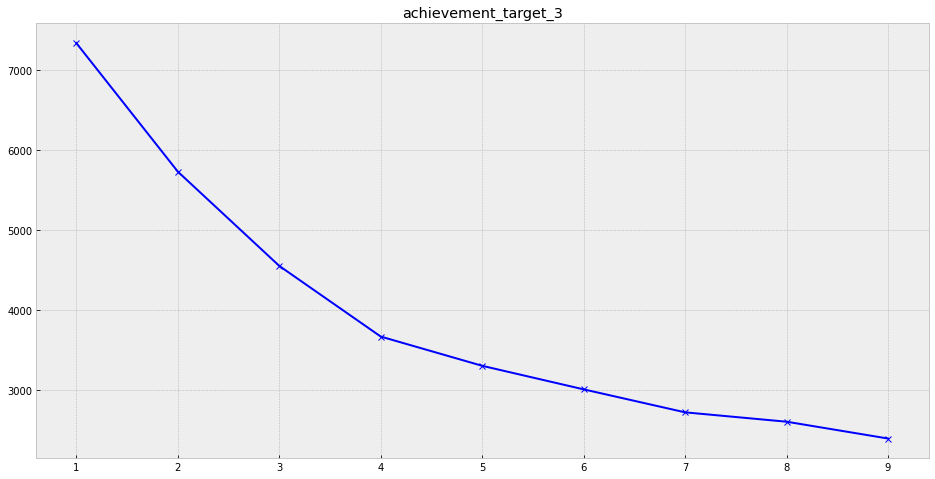

In [ ]:
K = range(1, 10)
distortions = []
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X_train)
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(16, 8))
plt.title(c)
plt.plot(K, distortions, 'bx-')
plt.show()

In [ ]:
km = KMeans(n_clusters=2)
km.fit(X_pred)
km.predict(X_pred)

array([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0,

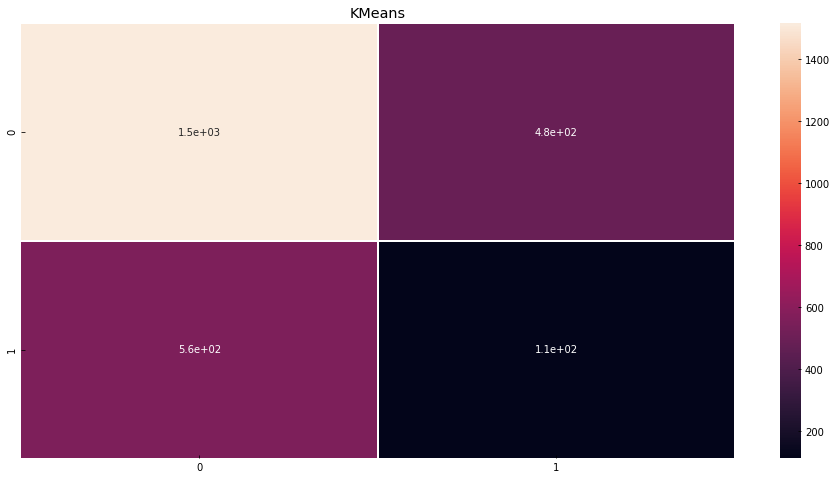

KMeans
              precision    recall  f1-score   support

           0       0.73      0.76      0.74      1999
           1       0.19      0.17      0.18       667

    accuracy                           0.61      2666
   macro avg       0.46      0.46      0.46      2666
weighted avg       0.60      0.61      0.60      2666

----------------------------------------------------------------------------------------------------


In [ ]:
kmt = KMeans(n_clusters=2)
kmt.fit(X_train)
y_val_kmt = kmt.predict(X_val)

plot_confusion_matrix(y_val, y_val_kmt, 'KMeans')
print_classification_report(y_val, y_val_kmt, 'KMeans')

In [ ]:
roc_auc_score(y_val, y_val_kmt)

0.46214786553696635

### Prediction

In [ ]:
# select best model
# y_pred = gbm.predict_proba(X_pred)[:, 1]
# y_pred = discriminator.predict(X_pred)
y_pred = km.predict(X_pred)
y_pred

array([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0,

In [ ]:
pred_df = pd.DataFrame({
    'index': test_df.index,
    'Best Performance': y_pred.reshape(-1,)
})

pred_df.head()
filename= 'bri_pa_km.csv'
pred_df.to_csv(filename, index=False)
from google.colab import files
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
y_preds_proba_dt = dt.predict_proba(X_pred)[:, 1]
# y_pred_svc = svc.predict(X_test)
y_preds_proba_ada_dt = ada_dt.predict_proba(X_pred)[:, 1]
# y_pred_ada_svc = ada_svc.predict(X_test)
y_preds_proba_gbm = gbm.predict_proba(X_pred)[:, 1]
y_preds_proba_xgb = xgb.predict_proba(X_pred)[:, 1]
y_preds_proba_rf = rf.predict_proba(X_pred)[:, 1]

y_preds_proba_avg = (y_preds_proba_dt + y_preds_proba_ada_dt + y_preds_proba_gbm + y_preds_proba_xgb + y_preds_proba_rf) / 5

In [ ]:
# np.round(y_preds_proba_avg)